***************************************************************** CNN *********************************************

..

This code checks whether a GPU is available for training the model.
If a GPU is found, it prints the name of the GPU so we know PyTorch can use it for faster computation.
If no GPU is available, the code informs us that the training will run on the CPU instead.
This step is important because using a GPU significantly reduces model training time.

In [ ]:
import torch
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)} is available.")
else:
    print("No GPU available. Training will run on CPU.")

GPU: Tesla T4 is available.


This code mounts Google Drive into the Colab environment.
It allows me to access datasets, models, and files stored in my personal Google Drive.
By doing this, I can easily read the lung cancer dataset and save trained models or results.
This is useful because the files remain available even after the Colab session

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


This below section imports all the libraries needed for the project, including system tools, data handling, visualisation, deep learning, and evaluation.
PyTorch and TorchVision are used to build and train the lung cancer image classification models, while Scikit-learn is used for data splitting and performance evaluation.
A try–except block is added to safely check whether PyTorch is properly installed and to avoid runtime crashes.
Finally, the code prints the Python version, PyTorch version, and checks if a GPU (CUDA) is available for faster training.


In [ ]:
# -------------------------
# 0) Imports & env check
# -------------------------
import sys
import os
import random
import numpy as np
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import seaborn as sns

# importing torch
try:
    import torch
    import torch.nn as nn
    import torch.nn.functional as F
    from torch.utils.data import Dataset, DataLoader, Subset
    from torchvision import transforms
    from torchvision.datasets import ImageFolder
except Exception as e:
    print("Error importing torch. Restart the runtime and try again. Error:")
    raise

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    roc_curve, auc, roc_auc_score, classification_report, confusion_matrix
)

print("Python:", sys.version.splitlines()[0])
print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

Python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
Torch version: 2.9.0+cu126
CUDA available: True


This block defines all the key settings used in the experiment.
A fixed random seed is set to ensure reproducible results across different runs.
The device is selected automatically based on GPU availability to speed up training when possible.
Dataset paths, image size, and training hyperparameters such as batch size, epochs, and learning rate are also defined here.

In [ ]:
# -------------------------
# 1) Settings
# -------------------------
RANDOM_SEED = 42         # For consistent results
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed_all(RANDOM_SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)

DATASET_PATH = "/content/drive/MyDrive/Lung_Images"
IMG_SIZE = 224           #  image size
BATCH_SIZE = 16          # reduce to 8/4 if OOM
NUM_CLASSES = 3
DOWNSAMPLE_TO = 120      # undersample target
TEST_SIZE = 0.30         # 70/30 split
K_FOLDS = 4
NUM_EPOCHS = 100
LEARNING_RATE = 1e-3
PLOT_EVERY = 5           # plot ROC every 5 epochs (and at 1 and final)

Using device: cuda


This block defines the image preprocessing steps used for training and evaluation.
All images are resized to a fixed size, and basic augmentation such as horizontal flipping is applied only to the training data.
Images are converted to tensors and normalised using standard values to stabilise model training.
No random transformations are used during evaluation to ensure fair and consistent performance measurement.

In [ ]:
# -------------------------
# 2) Transforms (no rotation)
# -------------------------
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),  # horizontal flip
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

This block loads the lung image dataset using ImageFolder, where each class is stored in a separate folder.
It prints the class names and the total number of images before applying any balancing.
Then it collects the index positions of images for each class using a dictionary.
Finally, it prints the class-wise image counts to understand the dataset distribution before training the CNN.

In [ ]:
# -------------------------
# 3) Load dataset (ImageFolder expects subfolders per class)
# -------------------------
full_dataset = ImageFolder(root=DATASET_PATH, transform=eval_transform)
class_names = full_dataset.classes
print("Classes found:", class_names)
print("Total images (before balancing):", len(full_dataset))

# list indices per class
indices_per_class = defaultdict(list)
for idx, (_, label) in enumerate(full_dataset):
    indices_per_class[label].append(idx)

for label, idxs in indices_per_class.items():
    print(f"Class {label} ({class_names[label]}): {len(idxs)} images")

Classes found: ['Bengin cases', 'Malignant cases', 'Normal cases']
Total images (before balancing): 1097
Class 0 (Bengin cases): 120 images
Class 1 (Malignant cases): 561 images
Class 2 (Normal cases): 416 images


This block balances the dataset by undersampling each class to the same number of images.
For classes with more samples, a random subset is selected, while smaller classes keep all available images.
The selected indices are combined and shuffled to avoid any class order bias.
This helps reduce class imbalance before training the CNN model.

In [ ]:
# -------------------------
# 4) Undersample (balance) to DOWNSAMPLE_TO per class
# -------------------------
balanced_indices = []
for label, idxs in indices_per_class.items():
    if len(idxs) >= DOWNSAMPLE_TO:
        chosen = random.sample(idxs, DOWNSAMPLE_TO)
    else:

        chosen = idxs.copy()
    balanced_indices.extend(chosen)

random.shuffle(balanced_indices)
print("Balanced dataset size:", len(balanced_indices), "-> per class approx =", DOWNSAMPLE_TO)

balanced_labels = [full_dataset[i][1] for i in balanced_indices]

Balanced dataset size: 360 -> per class approx = 120


This block splits the balanced dataset into training and testing sets using a 70/30 hold-out split.
Stratified splitting is applied so that each class keeps the same proportion in both sets.
The random seed is used to make the split reproducible across runs.
Finally, the code prints the train/test sizes and class counts to verify the split is balanced.

In [ ]:
# -------------------------
# 5) 70/30 hold-out split (on balanced data)
# -------------------------
train_idx_balanced, test_idx_balanced, y_train_balanced, y_test_balanced = train_test_split(
    balanced_indices, balanced_labels, test_size=TEST_SIZE, stratify=balanced_labels, random_state=RANDOM_SEED
)

print("After split -> Train:", len(train_idx_balanced), " Test:", len(test_idx_balanced))
print("Train class counts:", Counter([full_dataset[i][1] for i in train_idx_balanced]))
print("Test class counts:", Counter([full_dataset[i][1] for i in test_idx_balanced]))

After split -> Train: 252  Test: 108
Train class counts: Counter({0: 84, 1: 84, 2: 84})
Test class counts: Counter({2: 36, 1: 36, 0: 36})


This block defines a custom dataset wrapper to apply different preprocessing steps to training and testing data.
It creates subsets from the original ImageFolder dataset using selected indices.
Training data uses augmentation, while test data uses only resizing and normalisation.
This ensures correct and fair preprocessing during CNN training and evaluation.

In [ ]:
# -------------------------
# 6) Dataset wrapper to apply transforms (train vs eval)
# -------------------------
class ImageFolderSubsetWithTransform(Dataset):
    def __init__(self, image_folder: ImageFolder, indices, transform):
        self.image_folder = image_folder
        self.indices = list(indices)
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        path, label = self.image_folder.samples[real_idx]
        img = self.image_folder.loader(path)   # PIL image
        if self.transform:
            img = self.transform(img)
        return img, label

train_dataset = ImageFolderSubsetWithTransform(full_dataset, train_idx_balanced, train_transform)
test_dataset = ImageFolderSubsetWithTransform(full_dataset, test_idx_balanced, eval_transform)

print("Train dataset size:", len(train_dataset))
print("Test dataset size:", len(test_dataset))

Train dataset size: 252
Test dataset size: 108


This block defines a simple CNN architecture for lung image classification.
The model consists of three convolutional layers with batch normalisation and max pooling to extract hierarchical features.
Fully connected layers are used to perform final classification into multiple classes.
Dropout is not used in this model to keep the architecture simple and interpretable.

In [ ]:
# -------------------------
# 7) Simple CNN (no dropout)
# -------------------------
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=NUM_CLASSES):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1   = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2   = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3   = nn.BatchNorm2d(128)
        self.pool  = nn.MaxPool2d(2, 2)

        fm_size = IMG_SIZE // 8
        self.fc1 = nn.Linear(128 * fm_size * fm_size, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x))); x = self.pool(x)
        x = F.relu(self.bn2(self.conv2(x))); x = self.pool(x)
        x = F.relu(self.bn3(self.conv3(x))); x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x



This block implements Grad-CAM to visualise which image regions influence the CNN’s prediction.
It uses hooks to capture activations from a chosen convolution layer and gradients during backpropagation.
The gradients are globally averaged to create weights, which are applied to the activation maps to produce a heatmap.
The final Grad-CAM map is normalised between 0 and 1 and returned for plotting.

In [ ]:
# -------------------------
# FIXED GRAD-CAM (PyTorch)
# -------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.model.eval()

        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Save activations
        target_layer.register_forward_hook(self._save_activation)

        # Save gradients (PyTorch )
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, class_idx=None):
        # Add batch dimension
        input_tensor = input_tensor.unsqueeze(0).to(DEVICE)

        # Forward pass
        output = self.model(input_tensor)

        # If class not provided → use predicted class
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()

        # Backprop
        self.model.zero_grad()
        output[0, class_idx].backward()

        # remove batch dimension ---
        grads = self.gradients.squeeze(0)
        acts  = self.activations.squeeze(0)

        # Global average pooling on gradients
        weights = grads.mean(dim=(1, 2), keepdim=True)

        # Weighted sum
        cam = (weights * acts).sum(dim=0)  # (H, W)

        # ReLU
        cam = torch.relu(cam)

        # Normalize to 0–1
        cam -= cam.min()
        cam /= (cam.max() + 1e-8)

        return cam.cpu().numpy()


This block prepares the Grad-CAM output and overlays it on the original lung image for visual interpretation.
The heatmap is normalised and converted into an 8-bit format so it can be processed using OpenCV.
The heatmap is resized to match the original image, colour-mapped, and blended with the image using weighted overlay.
This produces an interpretable Grad-CAM visual showing where the CNN focused during prediction.

In [ ]:
def prepare_heatmap(raw_cam):
    raw_cam = np.squeeze(raw_cam).astype(np.float32)

    # normalize
    raw_cam = (raw_cam - raw_cam.min()) / (np.ptp(raw_cam) + 1e-8)

    # convert to uint8
    heatmap_uint8 = np.uint8(255 * raw_cam)

    return heatmap_uint8


def overlay_heatmap(orig_tensor, heatmap_uint8):

    # convert tensor → numpy RGB
    if isinstance(orig_tensor, torch.Tensor):
        img_np = orig_tensor.permute(1,2,0).cpu().numpy()
    else:
        img_np = orig_tensor

    # convert from 0–1 → 0–255
    img_np = (img_np * 255).clip(0,255).astype(np.uint8)

    # ensure heatmap is (H, W) and uint8
    heatmap_uint8 = heatmap_uint8.astype(np.uint8)

    # resize heatmap to match image
    heatmap_resized = cv2.resize(
        heatmap_uint8,
        (img_np.shape[1], img_np.shape[0]),
        interpolation=cv2.INTER_LINEAR
    )

    # if shape is (H,W,1) → convert to (H,W)
    if heatmap_resized.ndim == 3:
        heatmap_resized = heatmap_resized[:, :, 0]

    # apply color map
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # convert image to BGR
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    # overlay
    overlay_bgr = cv2.addWeighted(img_bgr, 0.6, heatmap_color, 0.4, 0)

    # return RGB
    overlay_rgb = cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB)

    return overlay_rgb


This block defines helper functions for training, evaluating, and plotting ROC curves for the CNN model.
The training function performs a full epoch with forward pass, loss calculation, backpropagation, and optimizer updates.
The evaluation function collects class probabilities and predictions without computing gradients to save memory.
A multi-class ROC plotting function is also included to visualise class-wise performance using AUC scores.

In [ ]:
# -------------------------
# 8) Train / Eval helpers + ROC plotting
# -------------------------
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    for imgs, labels in loader:
        imgs = imgs.to(device); labels = labels.to(device)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * imgs.size(0)
    return running_loss / len(loader.dataset)

def evaluate(model, loader, device):
    model.eval()
    all_probs = []; all_preds = []; all_labels = []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            probs = F.softmax(outputs, dim=1).cpu().numpy()
            preds = np.argmax(probs, axis=1)
            all_probs.append(probs); all_preds.append(preds); all_labels.append(labels.numpy())
    if len(all_probs) == 0:
        return np.array([]), np.array([]), np.array([])
    all_probs = np.vstack(all_probs); all_preds = np.hstack(all_preds); all_labels = np.hstack(all_labels)
    return all_probs, all_preds, all_labels

def plot_multiclass_roc(y_true, y_probs, classes, title):
    # y_true: (N,), y_probs: (N,C)
    y_true_bin = label_binarize(y_true, classes=list(range(len(classes))))
    plt.figure(figsize=(6,6))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{cls} (AUC={roc_auc:.2f})")
    plt.plot([0,1],[0,1],'--', color='gray')
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
    plt.title(title); plt.legend(loc='lower right'); plt.tight_layout()
    plt.show(); plt.close()


=== Fold 1/4 ===
Fold 1 Epoch 1 - TrainLoss: 44.4250 ValAcc: 0.4762 ValAUC_macro: 0.7834


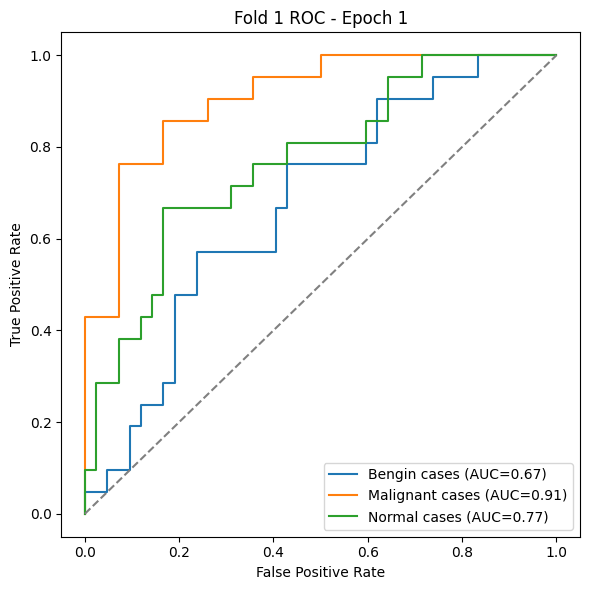

Fold 1 Epoch 5 - TrainLoss: 0.9937 ValAcc: 0.7143 ValAUC_macro: 0.9172


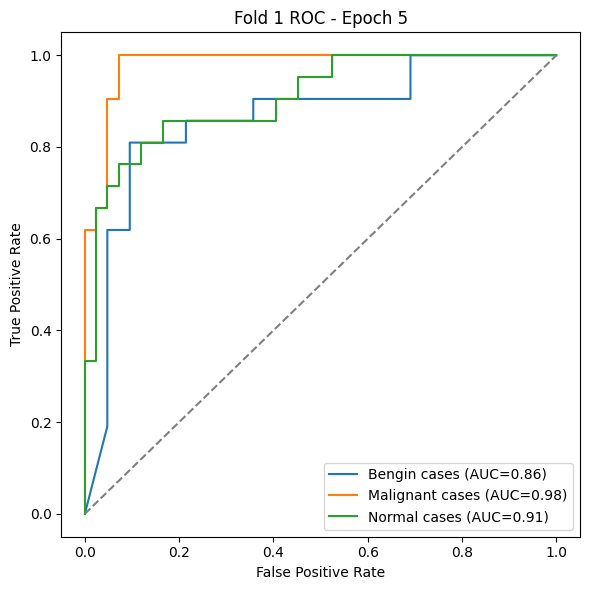

Fold 1 Epoch 10 - TrainLoss: 0.4603 ValAcc: 0.8095 ValAUC_macro: 0.9580


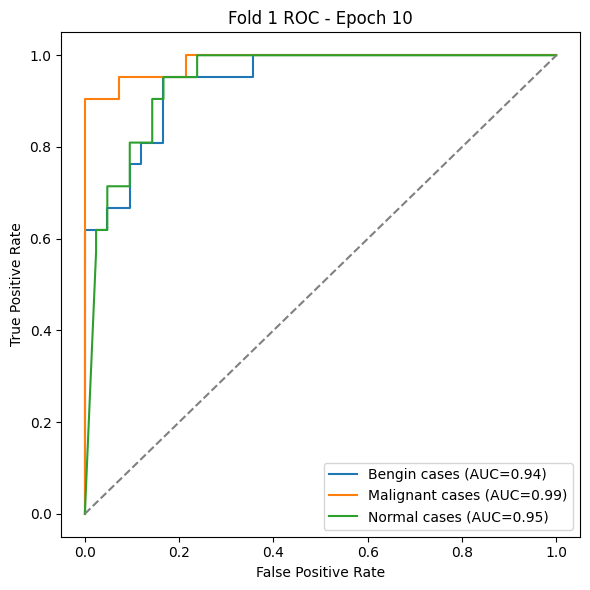

Fold 1 Epoch 15 - TrainLoss: 0.3517 ValAcc: 0.9206 ValAUC_macro: 0.9868


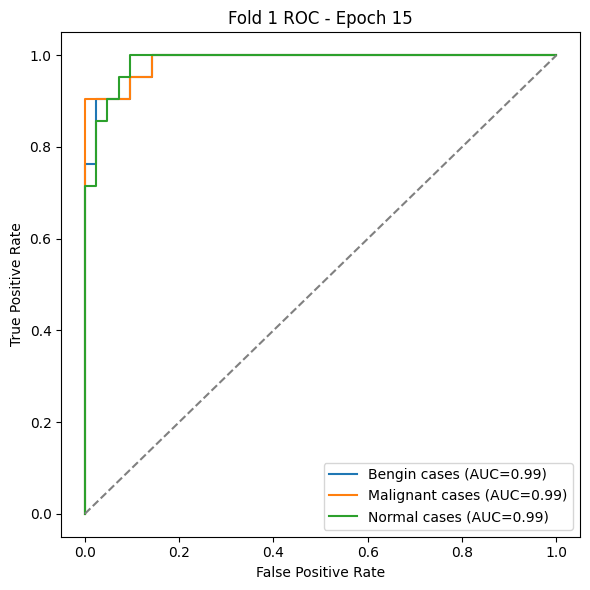

Fold 1 Epoch 20 - TrainLoss: 0.0548 ValAcc: 0.8889 ValAUC_macro: 0.9849


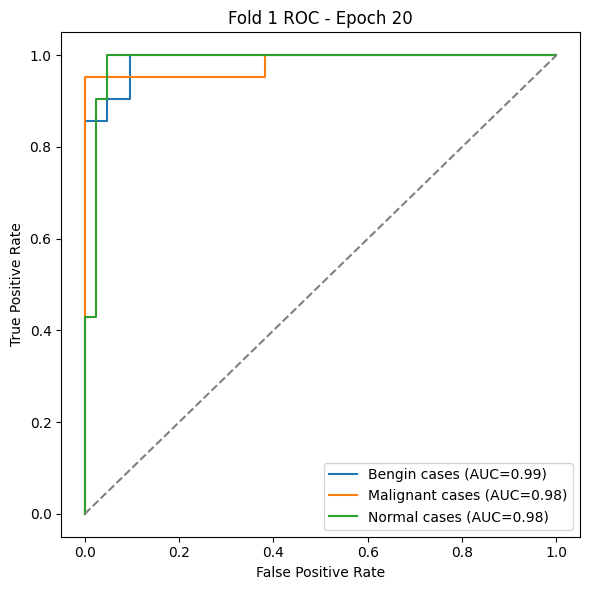

Fold 1 Epoch 25 - TrainLoss: 0.0198 ValAcc: 0.8889 ValAUC_macro: 0.9728


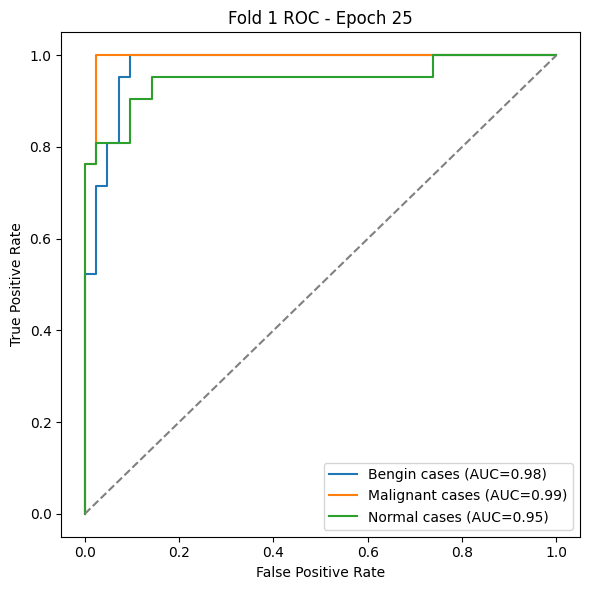

Fold 1 Epoch 30 - TrainLoss: 0.0560 ValAcc: 0.8730 ValAUC_macro: 0.9567


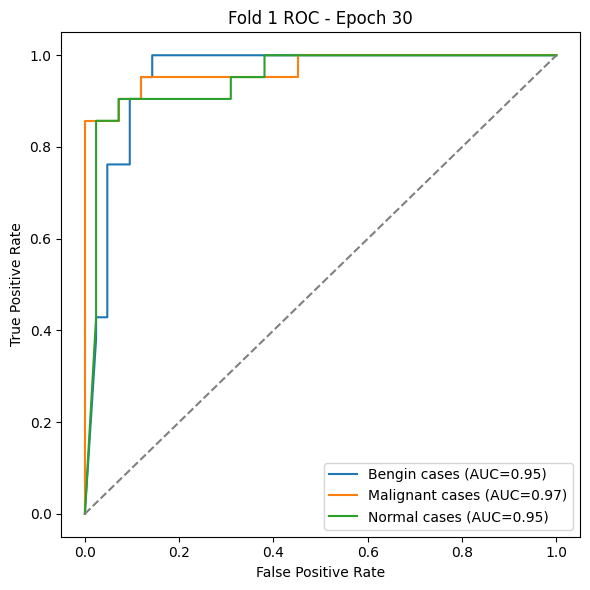

Fold 1 Epoch 35 - TrainLoss: 1.1406 ValAcc: 0.6508 ValAUC_macro: 0.9299


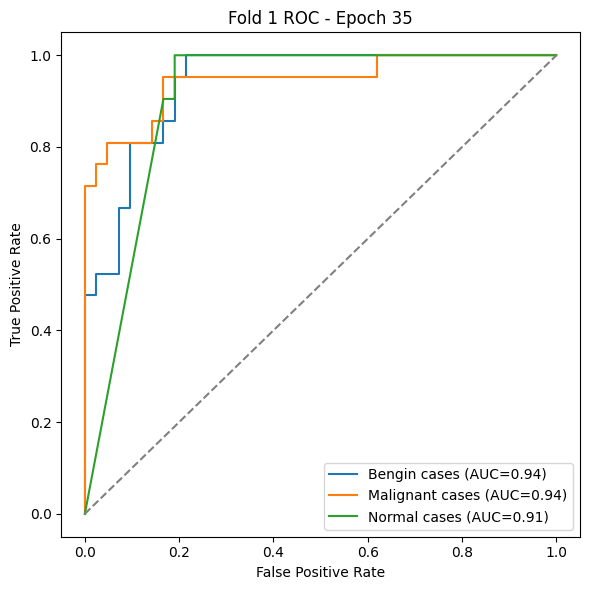

Fold 1 Epoch 40 - TrainLoss: 0.0727 ValAcc: 0.9048 ValAUC_macro: 0.9734


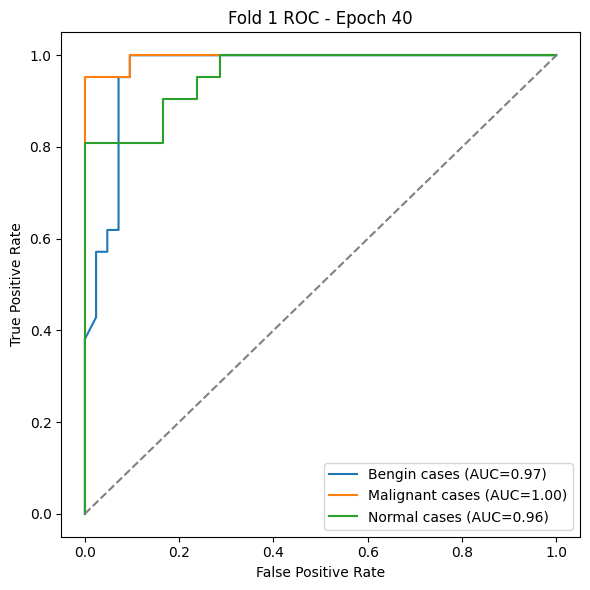

Fold 1 Epoch 45 - TrainLoss: 0.0035 ValAcc: 0.9206 ValAUC_macro: 0.9845


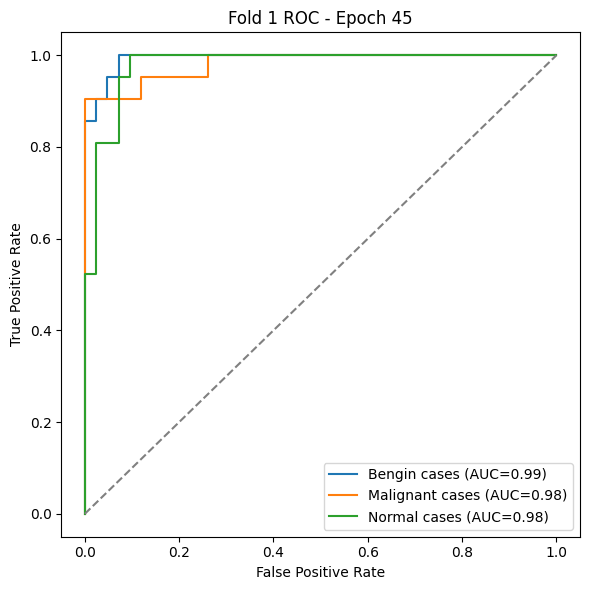

Fold 1 Epoch 50 - TrainLoss: 0.0015 ValAcc: 0.9365 ValAUC_macro: 0.9883


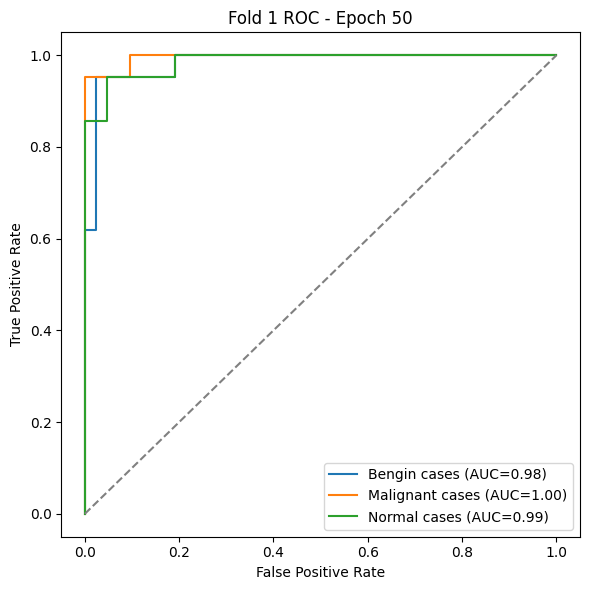

Fold 1 Epoch 55 - TrainLoss: 0.0004 ValAcc: 0.9048 ValAUC_macro: 0.9868


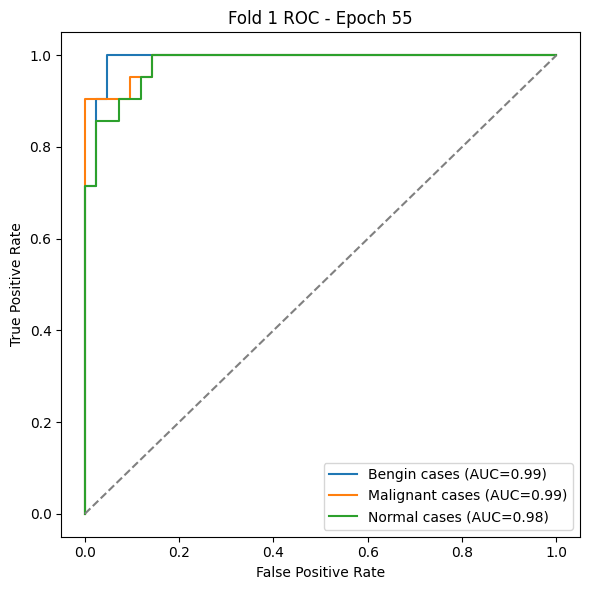

Fold 1 Epoch 60 - TrainLoss: 0.0001 ValAcc: 0.9048 ValAUC_macro: 0.9913


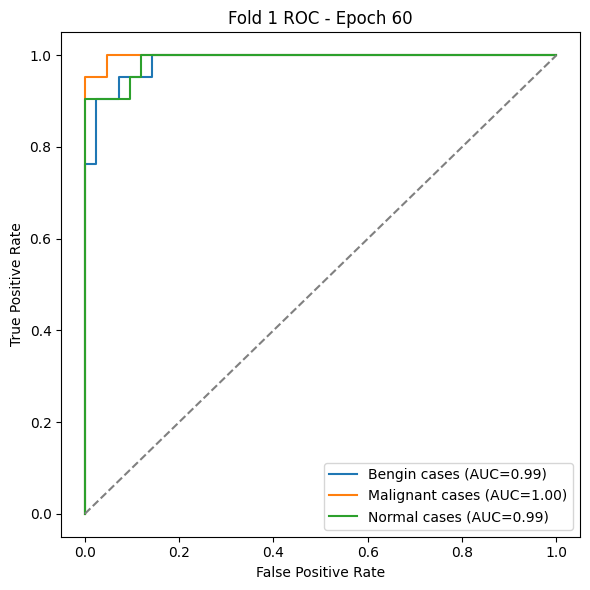

Fold 1 Epoch 65 - TrainLoss: 0.0002 ValAcc: 0.8889 ValAUC_macro: 0.9822


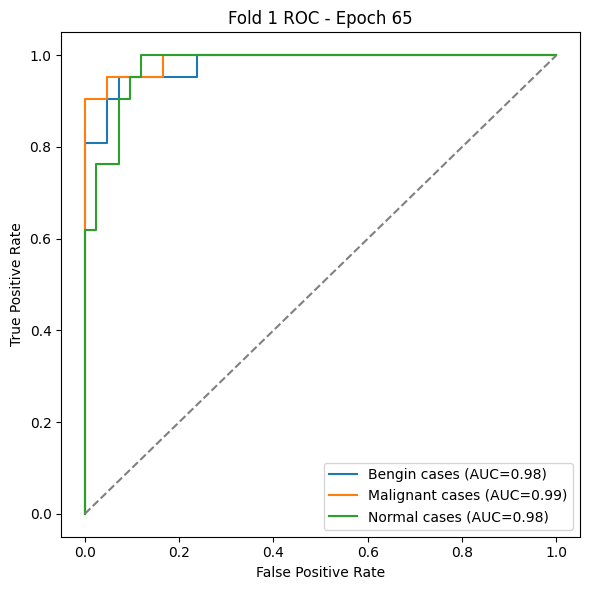

Fold 1 Epoch 70 - TrainLoss: 0.0001 ValAcc: 0.8889 ValAUC_macro: 0.9879


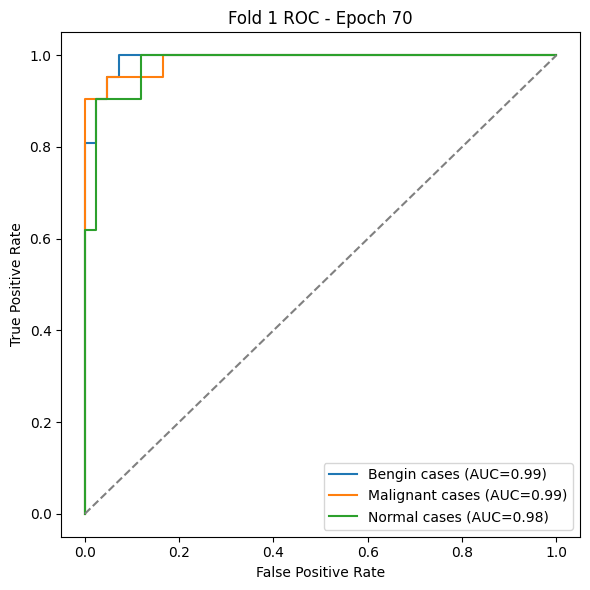

Fold 1 Epoch 75 - TrainLoss: 0.0001 ValAcc: 0.9524 ValAUC_macro: 0.9940


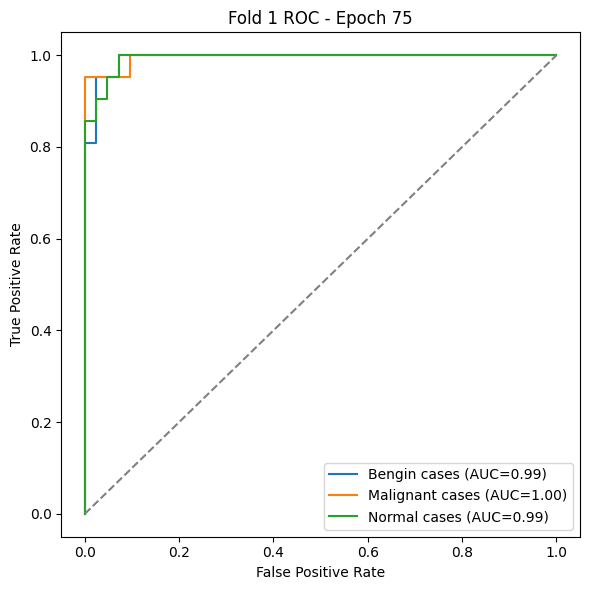

Fold 1 Epoch 80 - TrainLoss: 0.0002 ValAcc: 0.9365 ValAUC_macro: 0.9943


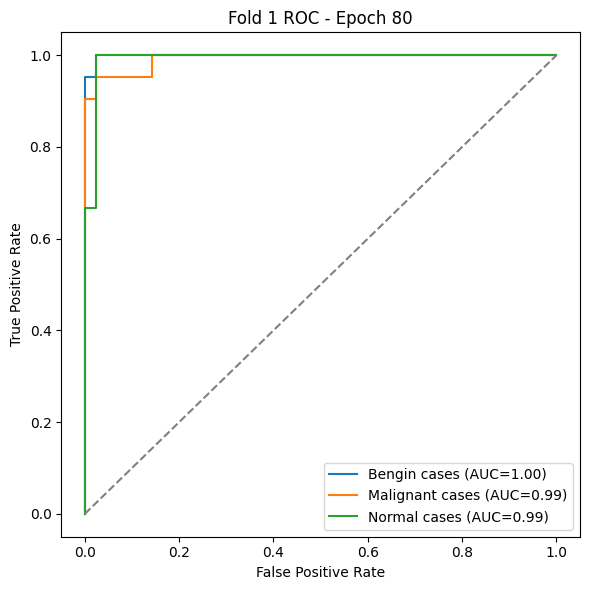

Fold 1 Epoch 85 - TrainLoss: 0.0002 ValAcc: 0.9206 ValAUC_macro: 0.9837


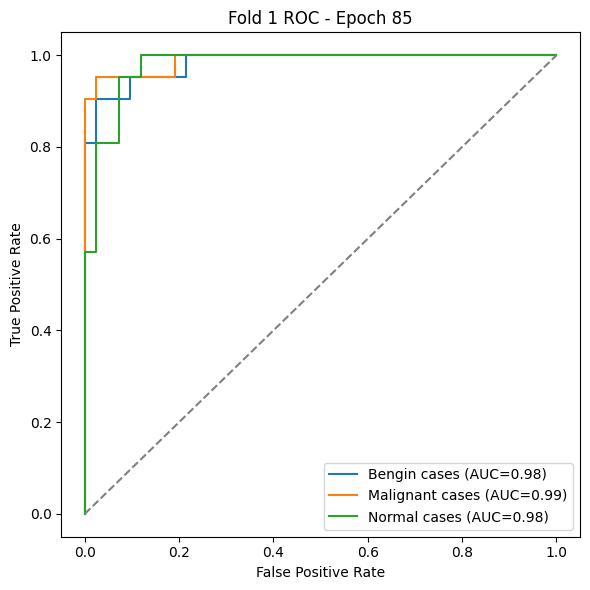

Fold 1 Epoch 90 - TrainLoss: 0.0001 ValAcc: 0.9048 ValAUC_macro: 0.9872


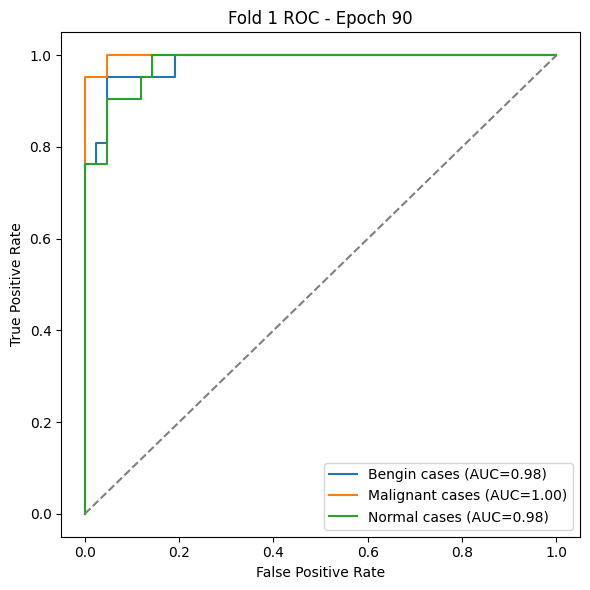

Fold 1 Epoch 95 - TrainLoss: 0.0001 ValAcc: 0.9206 ValAUC_macro: 0.9841


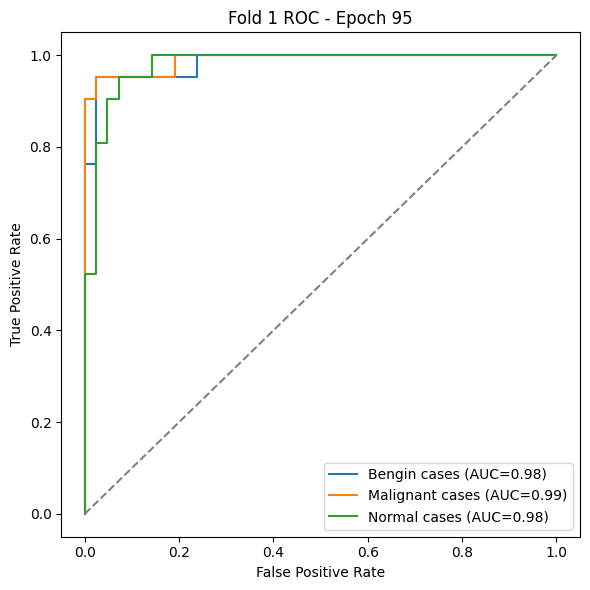

Fold 1 Epoch 100 - TrainLoss: 0.0001 ValAcc: 0.9048 ValAUC_macro: 0.9879


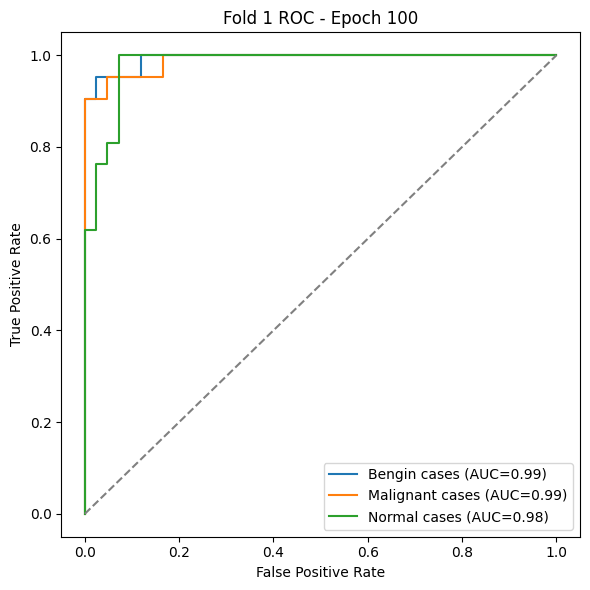

Fold 1 Summary -> Acc: 0.9206 Prec: 0.9228 Rec: 0.9206 F1: 0.9214 AUC_macro: 0.9917

=== Fold 2/4 ===
Fold 2 Epoch 1 - TrainLoss: 48.2807 ValAcc: 0.3333 ValAUC_macro: 0.6629


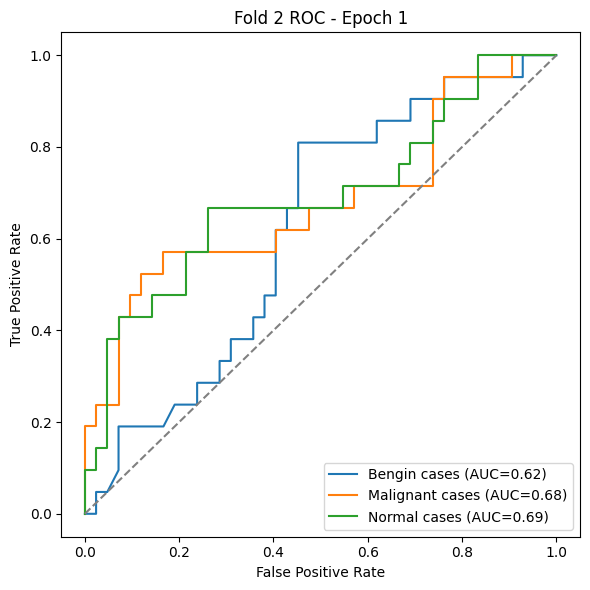

Fold 2 Epoch 5 - TrainLoss: 0.6960 ValAcc: 0.7143 ValAUC_macro: 0.8749


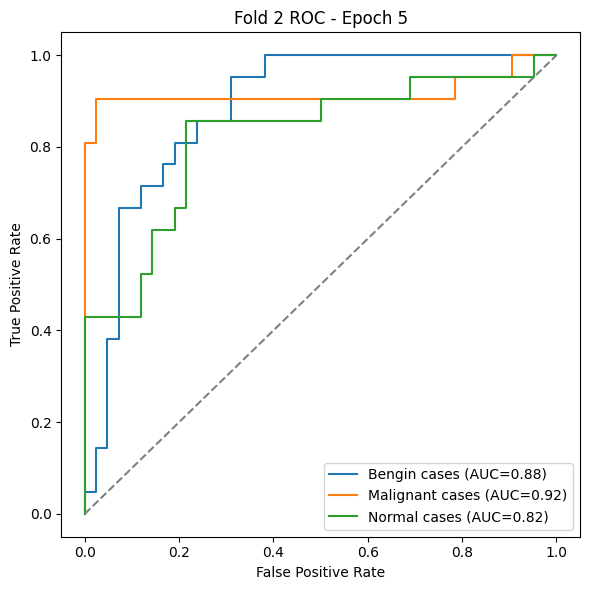

Fold 2 Epoch 10 - TrainLoss: 0.1895 ValAcc: 0.7778 ValAUC_macro: 0.8976


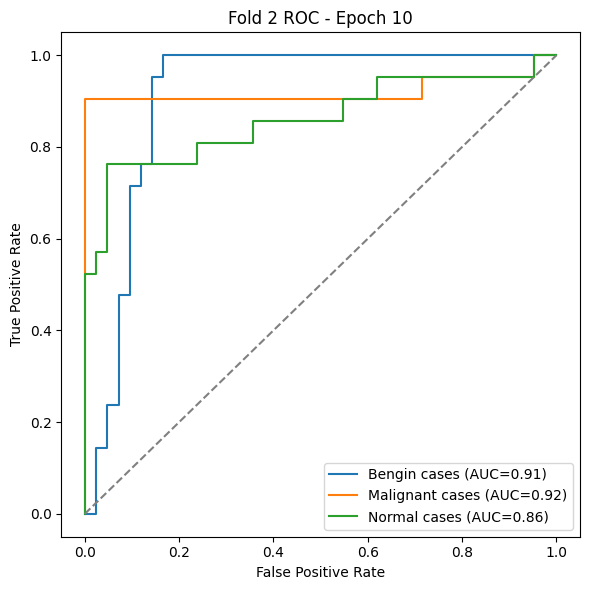

Fold 2 Epoch 15 - TrainLoss: 0.0894 ValAcc: 0.8254 ValAUC_macro: 0.9169


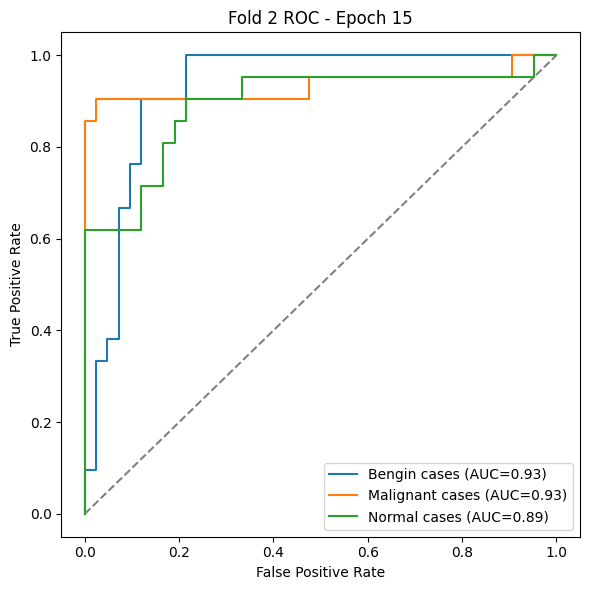

Fold 2 Epoch 20 - TrainLoss: 0.0421 ValAcc: 0.8571 ValAUC_macro: 0.9214


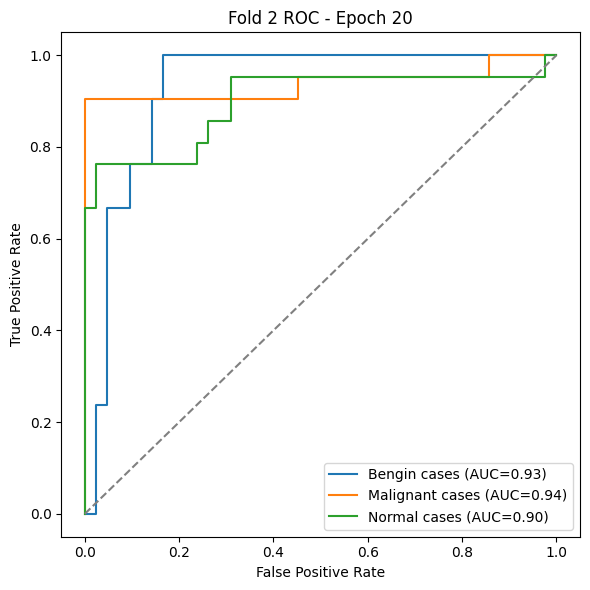

Fold 2 Epoch 25 - TrainLoss: 0.0564 ValAcc: 0.8254 ValAUC_macro: 0.9471


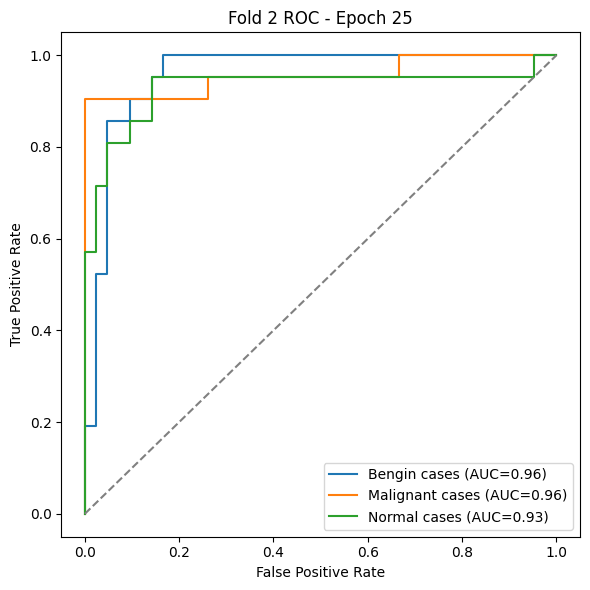

Fold 2 Epoch 30 - TrainLoss: 0.0133 ValAcc: 0.8730 ValAUC_macro: 0.9138


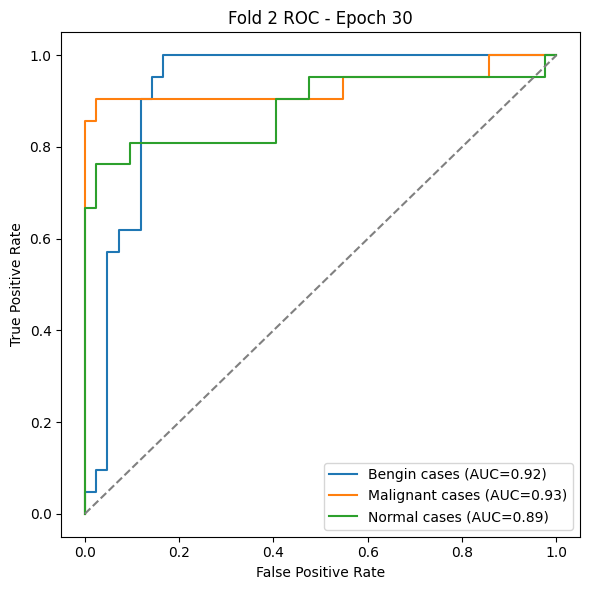

Fold 2 Epoch 35 - TrainLoss: 0.0430 ValAcc: 0.8730 ValAUC_macro: 0.9233


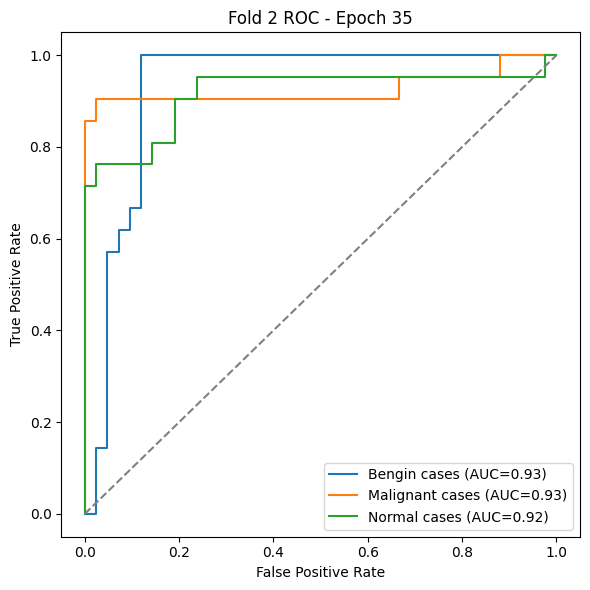

Fold 2 Epoch 40 - TrainLoss: 0.0140 ValAcc: 0.8413 ValAUC_macro: 0.9203


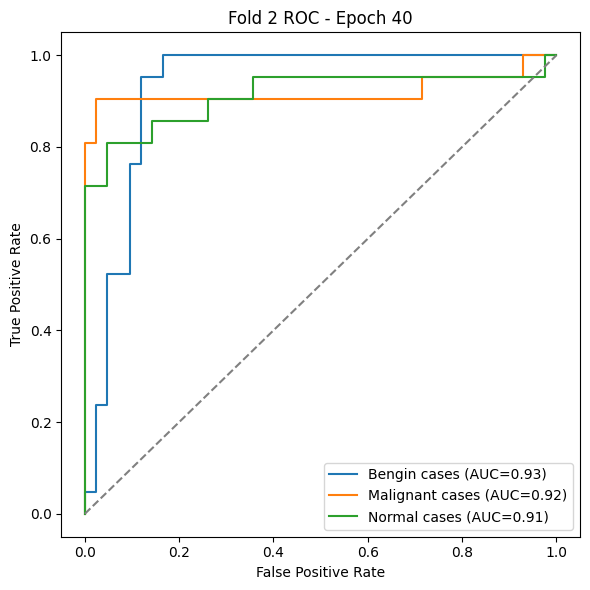

Fold 2 Epoch 45 - TrainLoss: 0.0084 ValAcc: 0.8254 ValAUC_macro: 0.9237


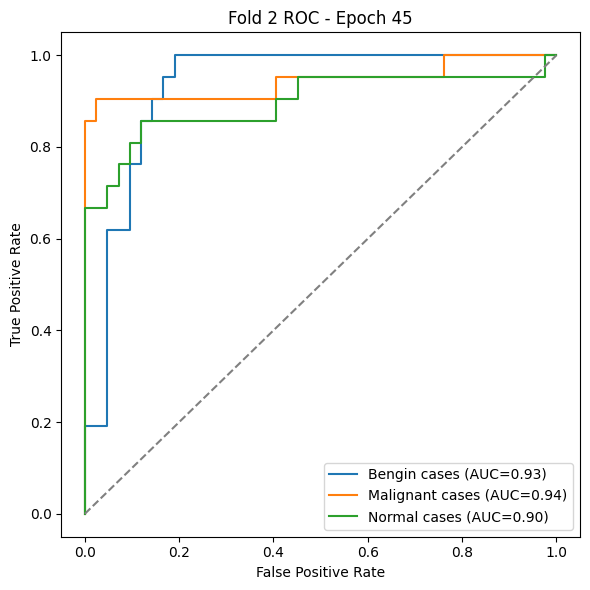

Fold 2 Epoch 50 - TrainLoss: 0.0671 ValAcc: 0.7460 ValAUC_macro: 0.9444


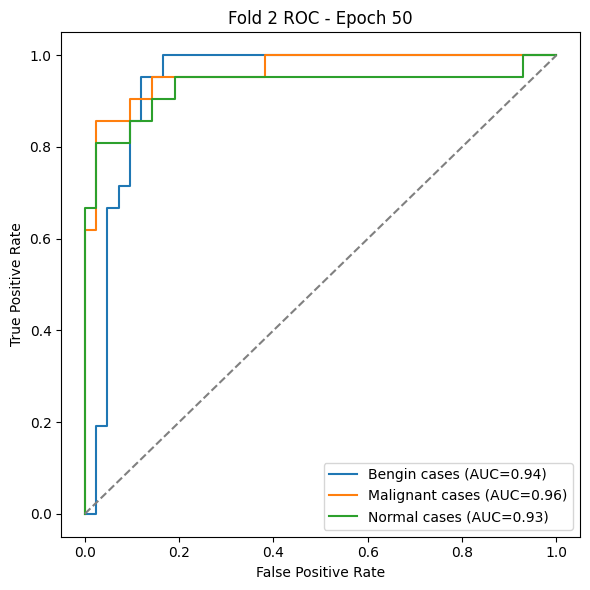

Fold 2 Epoch 55 - TrainLoss: 0.0029 ValAcc: 0.8413 ValAUC_macro: 0.9237


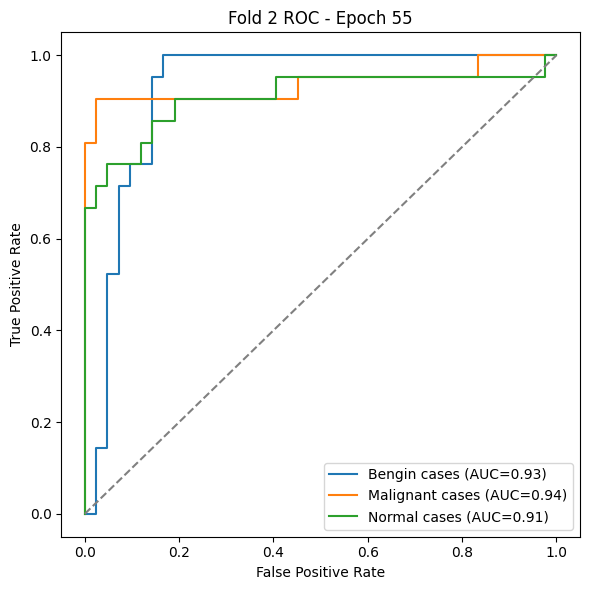

Fold 2 Epoch 60 - TrainLoss: 0.0405 ValAcc: 0.8413 ValAUC_macro: 0.9342


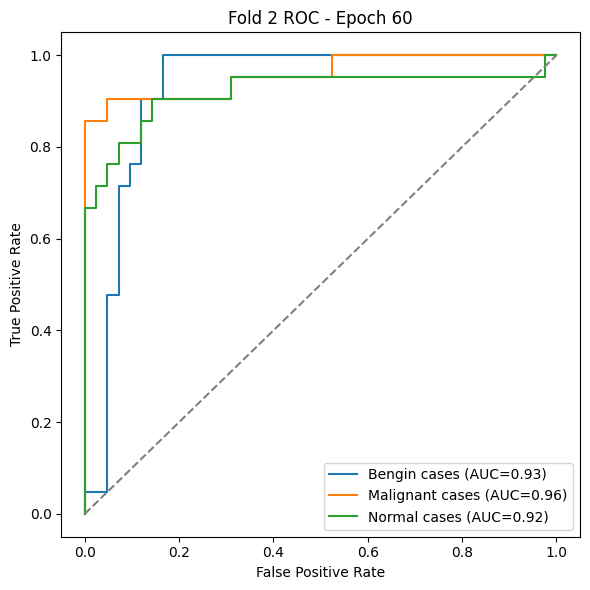

Fold 2 Epoch 65 - TrainLoss: 0.0229 ValAcc: 0.8571 ValAUC_macro: 0.9293


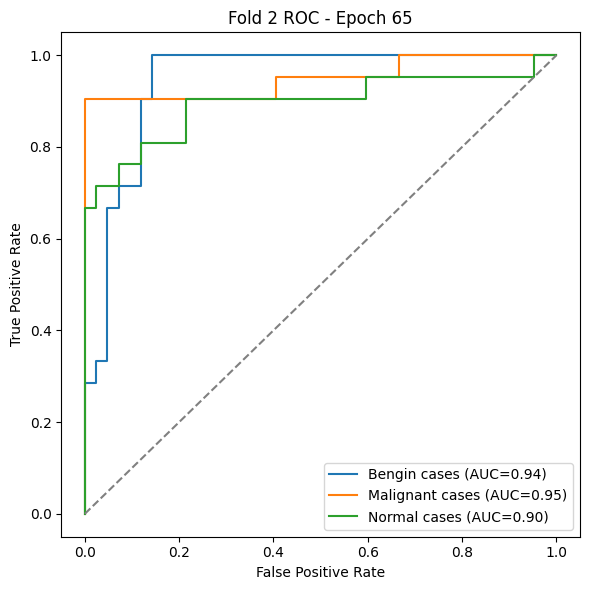

Fold 2 Epoch 70 - TrainLoss: 0.0020 ValAcc: 0.8730 ValAUC_macro: 0.9327


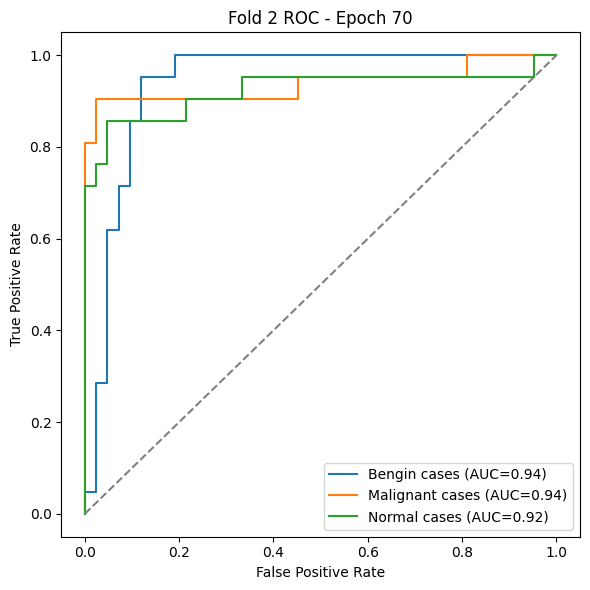

Fold 2 Epoch 75 - TrainLoss: 0.0009 ValAcc: 0.8889 ValAUC_macro: 0.9369


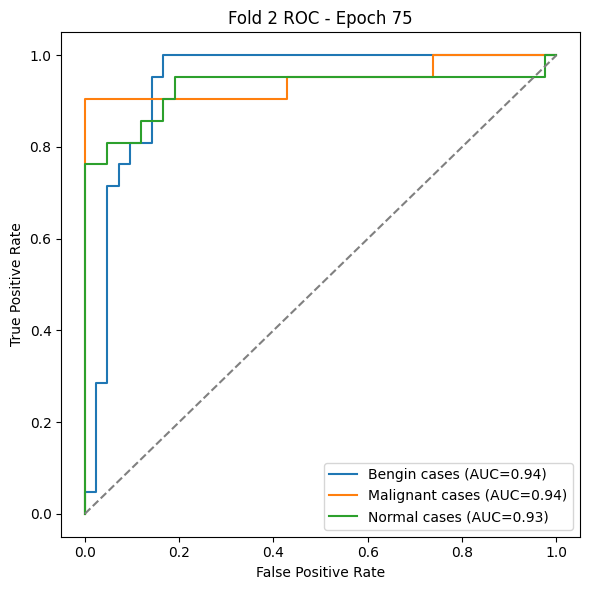

Fold 2 Epoch 80 - TrainLoss: 0.0421 ValAcc: 0.8889 ValAUC_macro: 0.9108


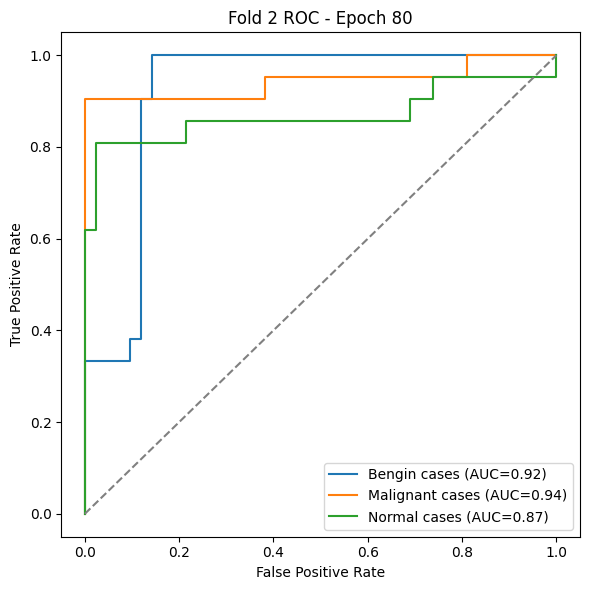

Fold 2 Epoch 85 - TrainLoss: 0.0019 ValAcc: 0.8571 ValAUC_macro: 0.9146


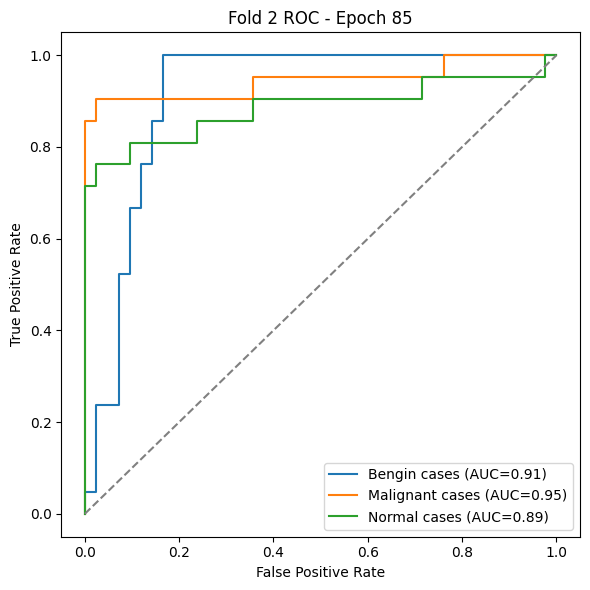

Fold 2 Epoch 90 - TrainLoss: 0.0008 ValAcc: 0.8889 ValAUC_macro: 0.9180


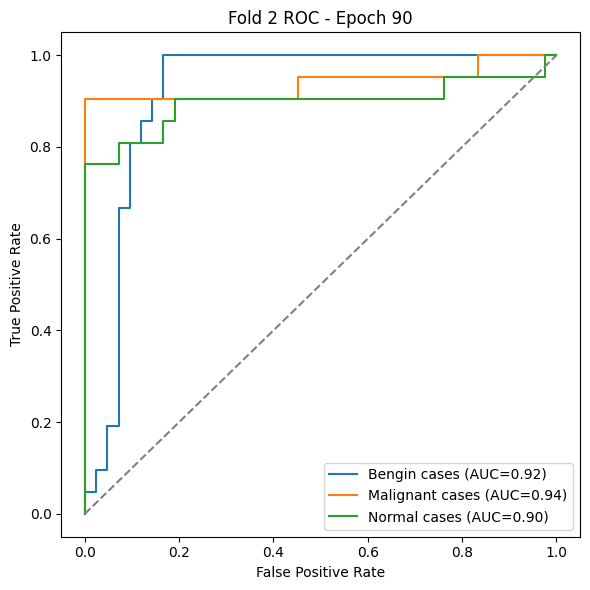

Fold 2 Epoch 95 - TrainLoss: 0.0006 ValAcc: 0.8730 ValAUC_macro: 0.9308


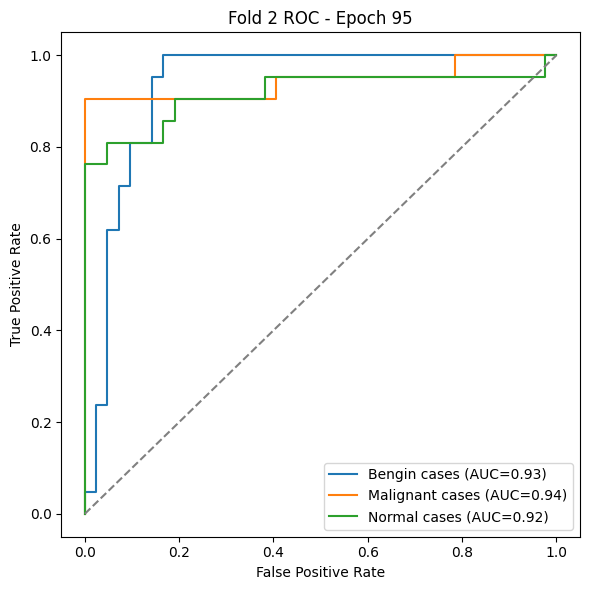

Fold 2 Epoch 100 - TrainLoss: 0.0006 ValAcc: 0.8889 ValAUC_macro: 0.9312


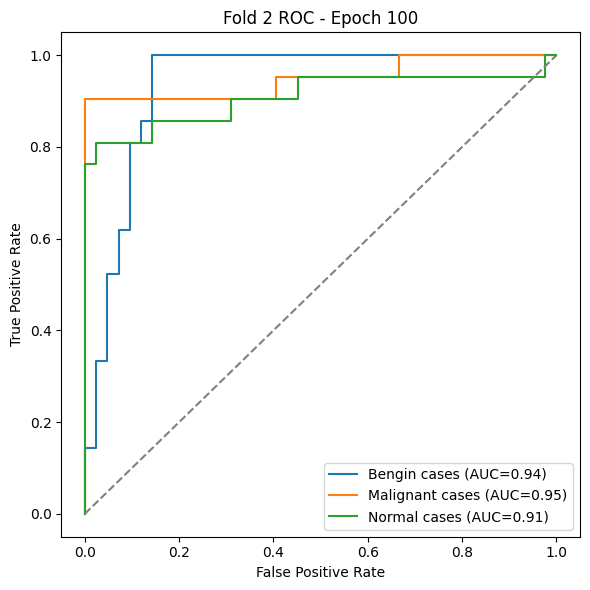

Fold 2 Summary -> Acc: 0.8730 Prec: 0.8971 Rec: 0.8730 F1: 0.8741 AUC_macro: 0.9225

=== Fold 3/4 ===
Fold 3 Epoch 1 - TrainLoss: 36.9161 ValAcc: 0.3651 ValAUC_macro: 0.7077


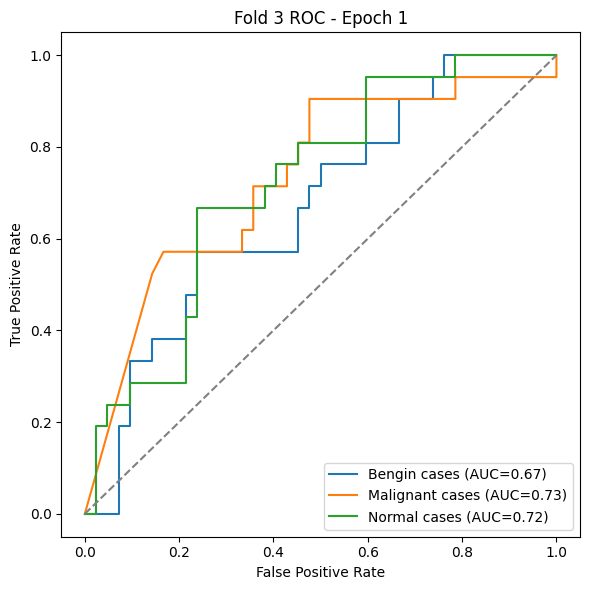

Fold 3 Epoch 5 - TrainLoss: 2.4571 ValAcc: 0.6984 ValAUC_macro: 0.9006


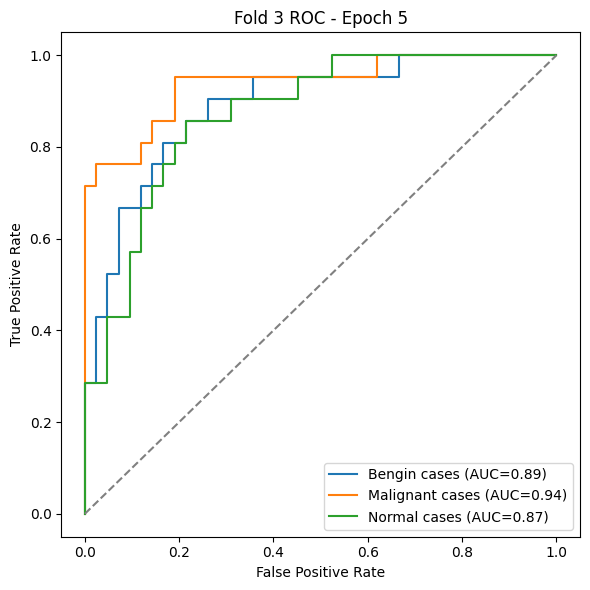

Fold 3 Epoch 10 - TrainLoss: 0.4815 ValAcc: 0.8730 ValAUC_macro: 0.9565


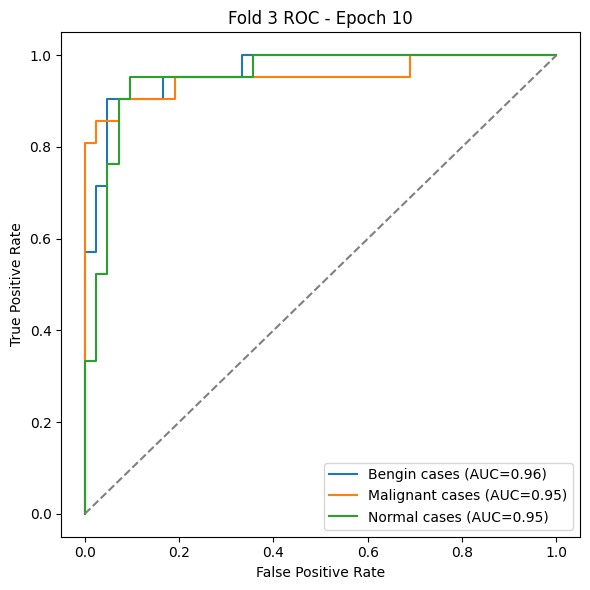

Fold 3 Epoch 15 - TrainLoss: 0.0429 ValAcc: 0.8571 ValAUC_macro: 0.9690


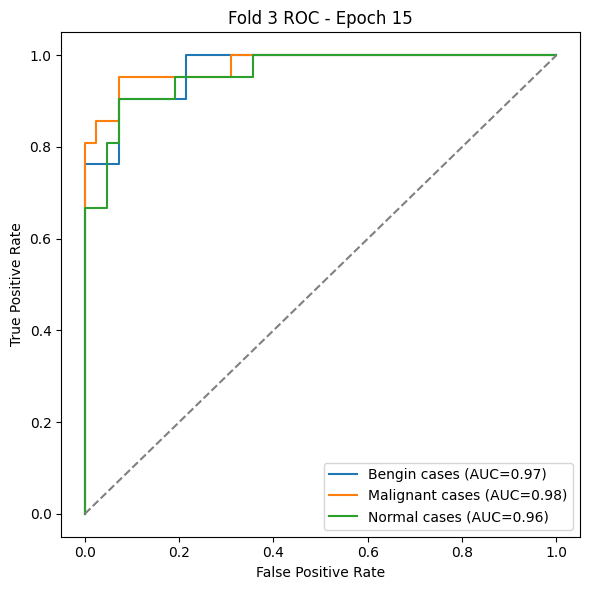

Fold 3 Epoch 20 - TrainLoss: 0.0144 ValAcc: 0.8730 ValAUC_macro: 0.9671


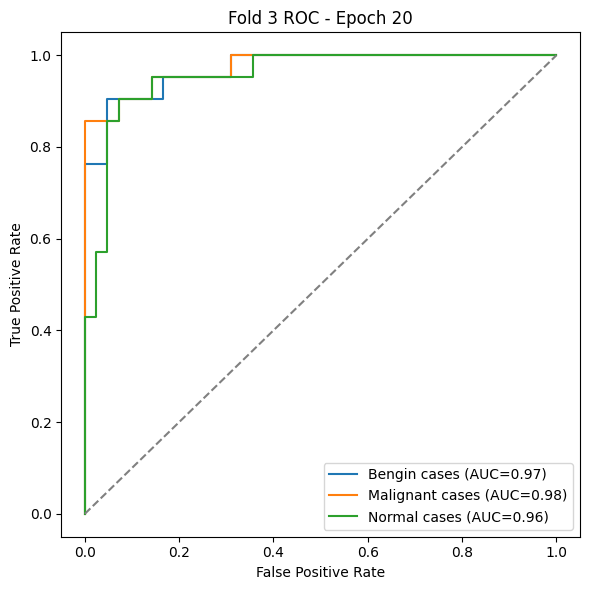

Fold 3 Epoch 25 - TrainLoss: 0.0101 ValAcc: 0.8730 ValAUC_macro: 0.9739


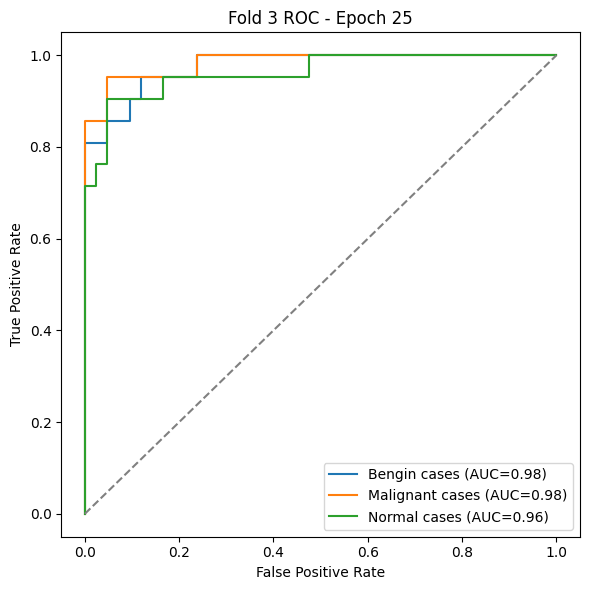

Fold 3 Epoch 30 - TrainLoss: 0.0500 ValAcc: 0.8730 ValAUC_macro: 0.9807


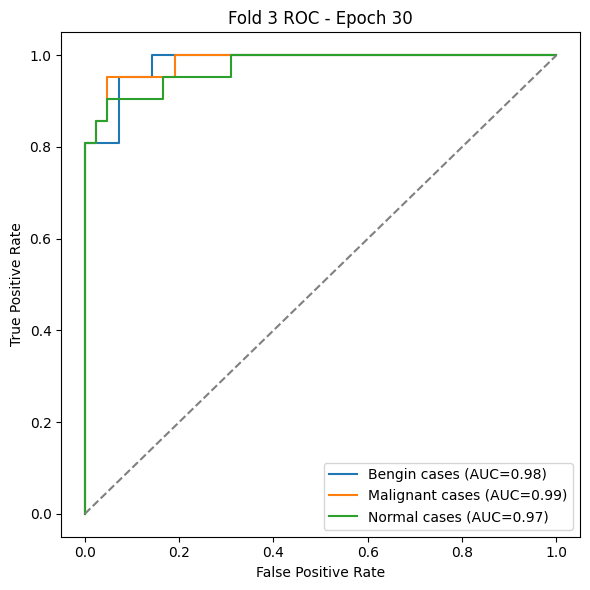

Fold 3 Epoch 35 - TrainLoss: 0.0864 ValAcc: 0.8413 ValAUC_macro: 0.9630


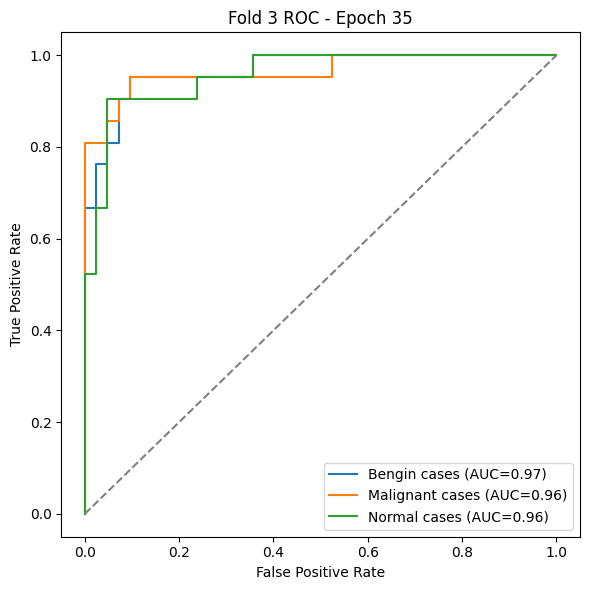

Fold 3 Epoch 40 - TrainLoss: 0.0364 ValAcc: 0.8730 ValAUC_macro: 0.9660


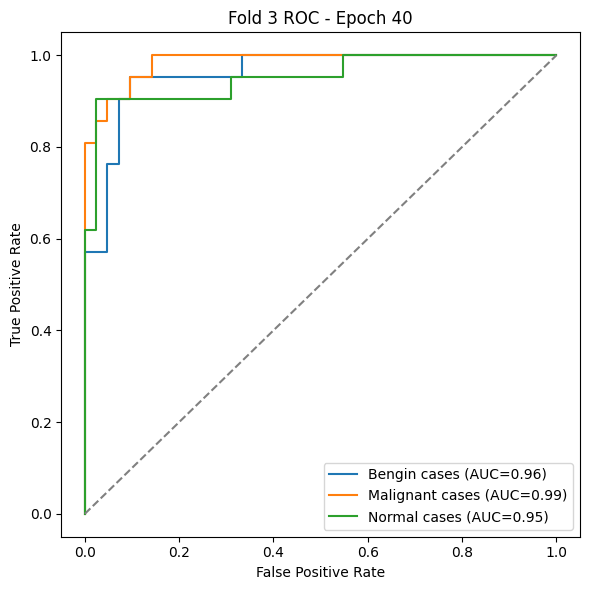

Fold 3 Epoch 45 - TrainLoss: 0.2264 ValAcc: 0.8889 ValAUC_macro: 0.9713


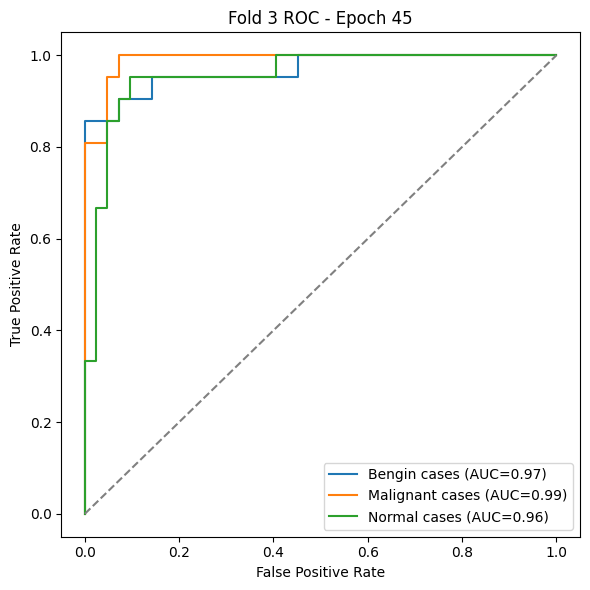

Fold 3 Epoch 50 - TrainLoss: 0.1383 ValAcc: 0.8254 ValAUC_macro: 0.9720


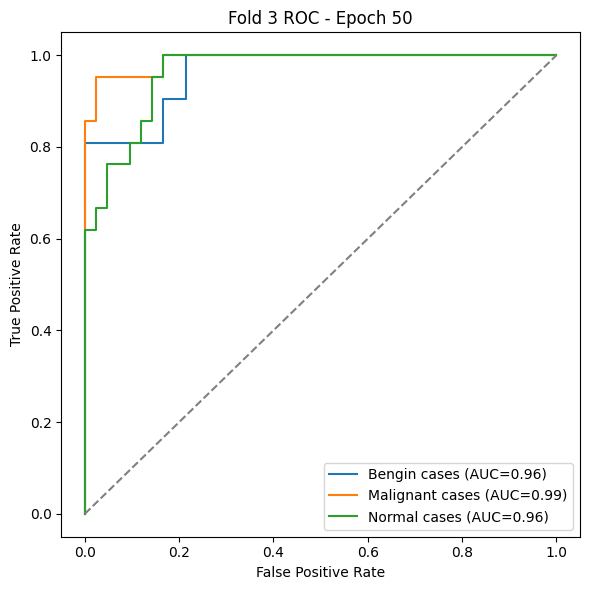

Fold 3 Epoch 55 - TrainLoss: 0.0245 ValAcc: 0.8730 ValAUC_macro: 0.9751


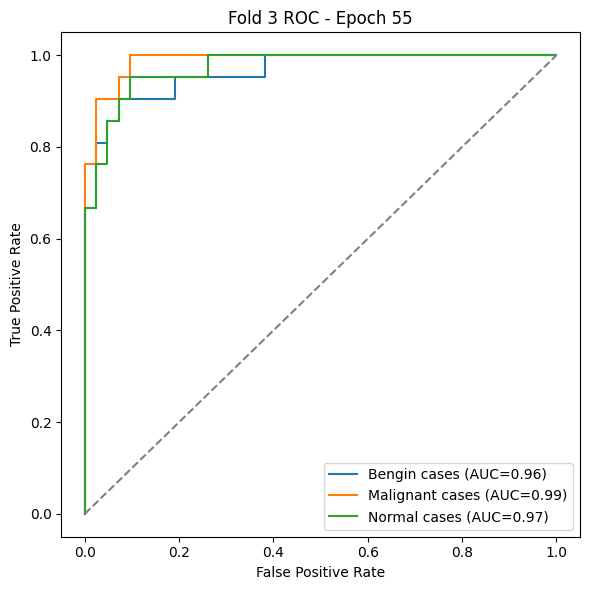

Fold 3 Epoch 60 - TrainLoss: 0.0022 ValAcc: 0.8889 ValAUC_macro: 0.9728


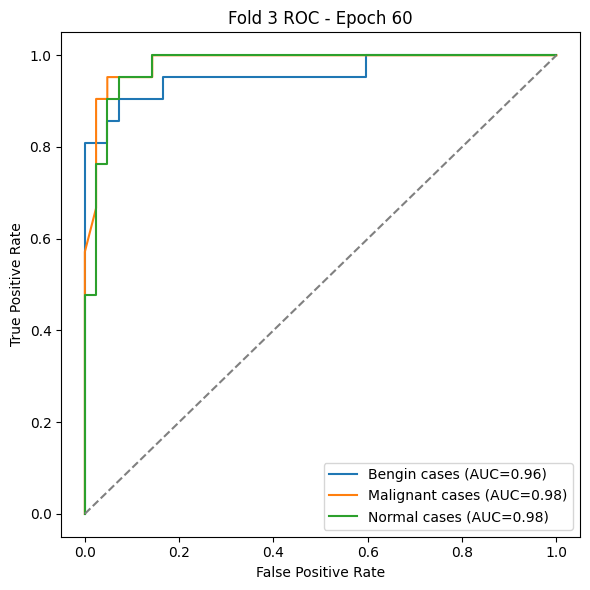

Fold 3 Epoch 65 - TrainLoss: 0.0267 ValAcc: 0.8889 ValAUC_macro: 0.9679


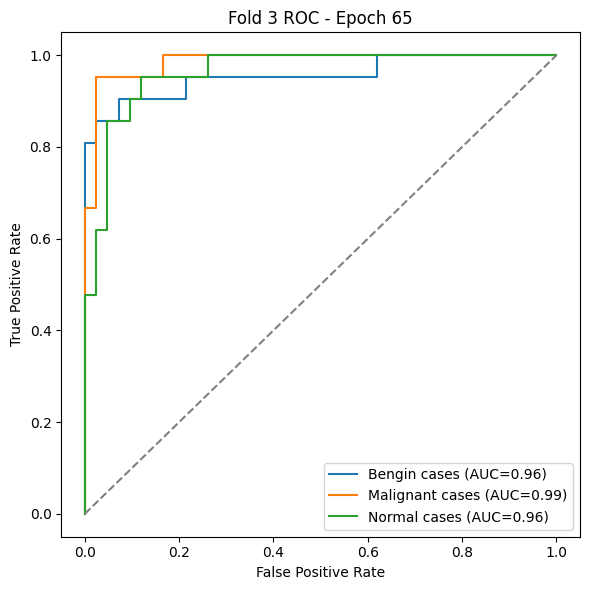

Fold 3 Epoch 70 - TrainLoss: 0.0326 ValAcc: 0.8730 ValAUC_macro: 0.9735


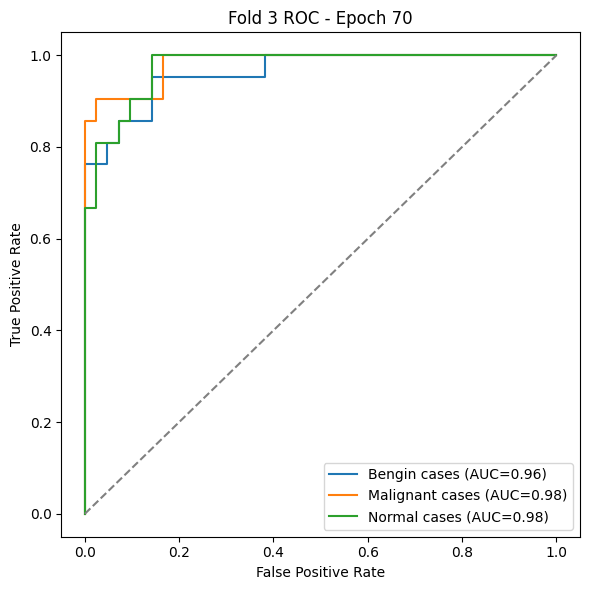

Fold 3 Epoch 75 - TrainLoss: 0.0976 ValAcc: 0.7937 ValAUC_macro: 0.9511


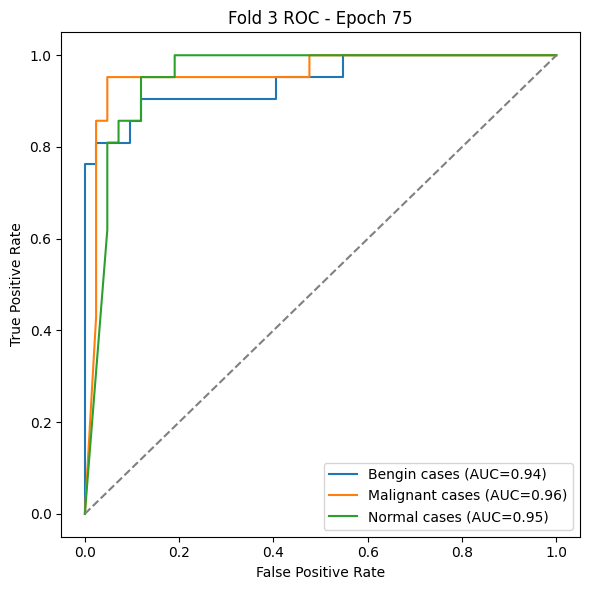

Fold 3 Epoch 80 - TrainLoss: 0.0007 ValAcc: 0.8730 ValAUC_macro: 0.9773


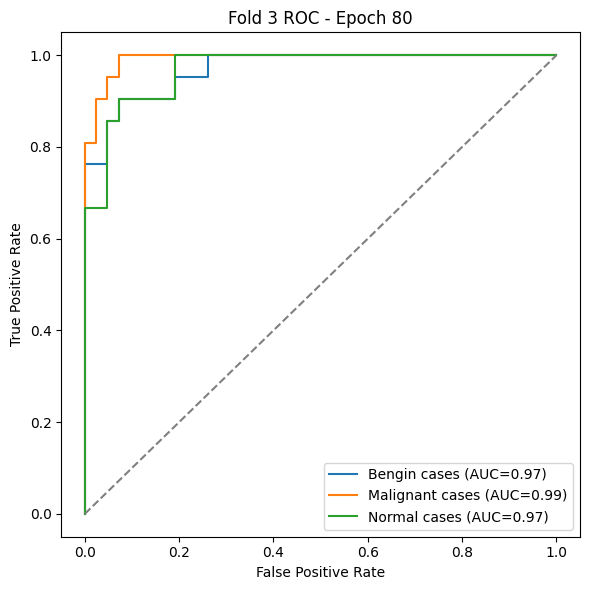

Fold 3 Epoch 85 - TrainLoss: 0.0007 ValAcc: 0.8571 ValAUC_macro: 0.9785


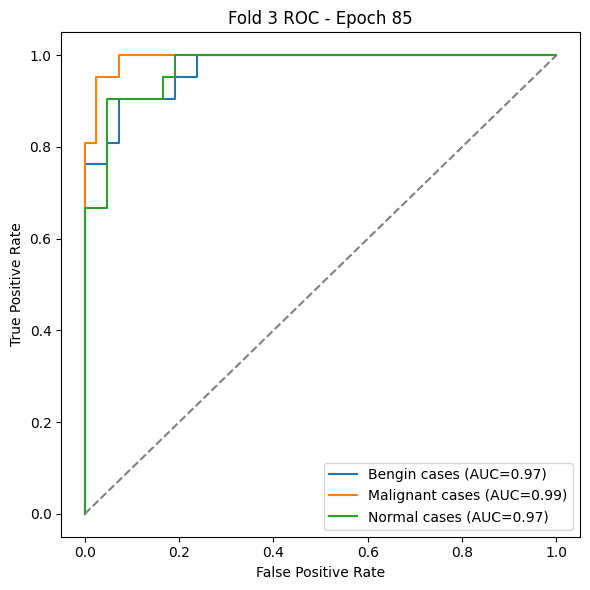

Fold 3 Epoch 90 - TrainLoss: 0.0001 ValAcc: 0.8730 ValAUC_macro: 0.9660


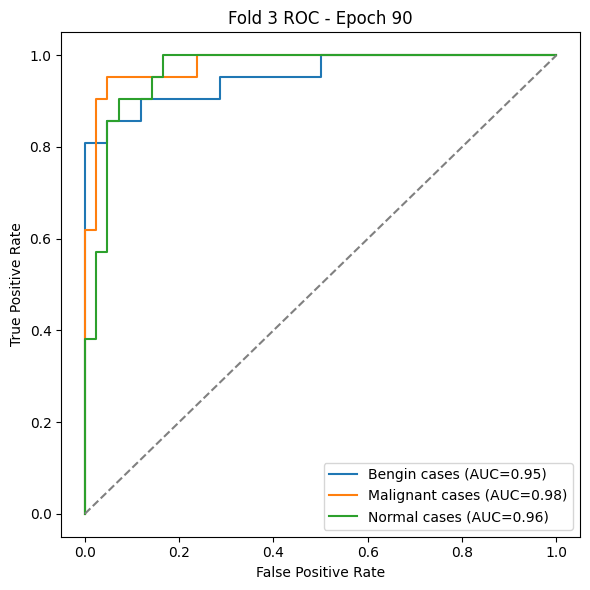

Fold 3 Epoch 95 - TrainLoss: 0.0002 ValAcc: 0.8571 ValAUC_macro: 0.9754


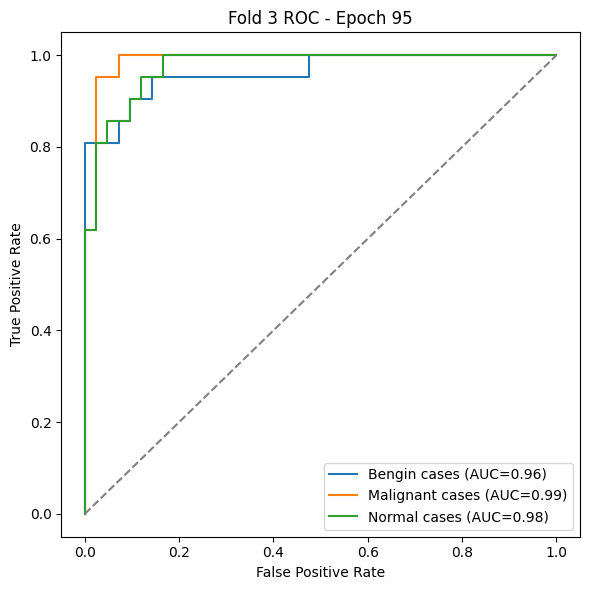

Fold 3 Epoch 100 - TrainLoss: 0.0001 ValAcc: 0.8730 ValAUC_macro: 0.9709


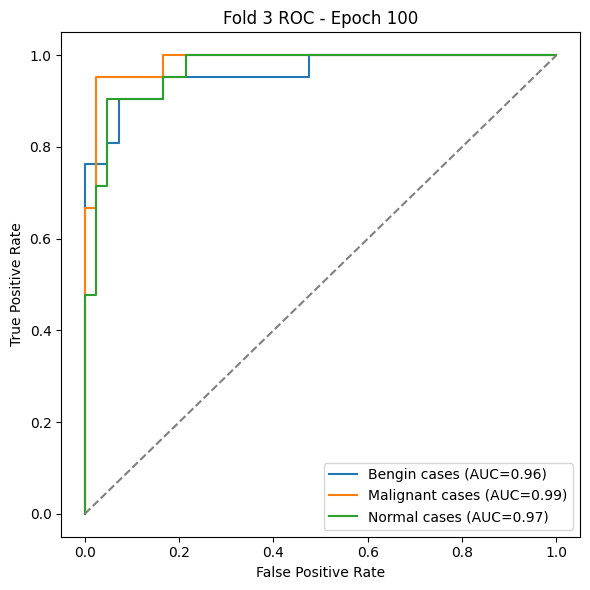

Fold 3 Summary -> Acc: 0.8730 Prec: 0.8754 Rec: 0.8730 F1: 0.8732 AUC_macro: 0.9743

=== Fold 4/4 ===
Fold 4 Epoch 1 - TrainLoss: 26.9224 ValAcc: 0.5556 ValAUC_macro: 0.7434


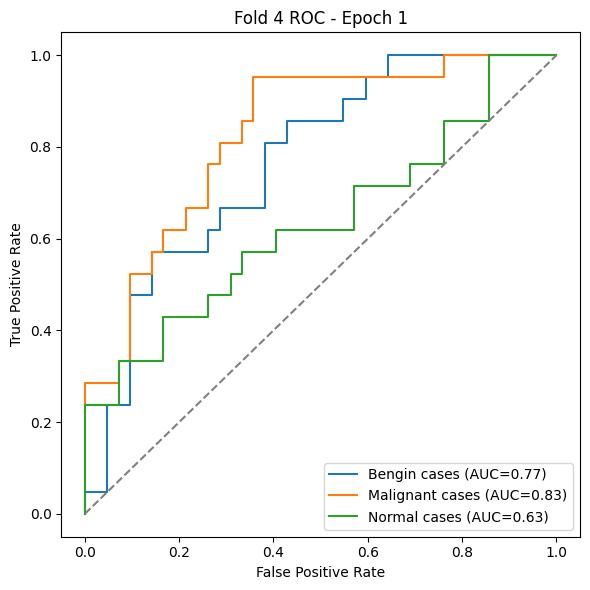

Fold 4 Epoch 5 - TrainLoss: 0.8317 ValAcc: 0.6984 ValAUC_macro: 0.8473


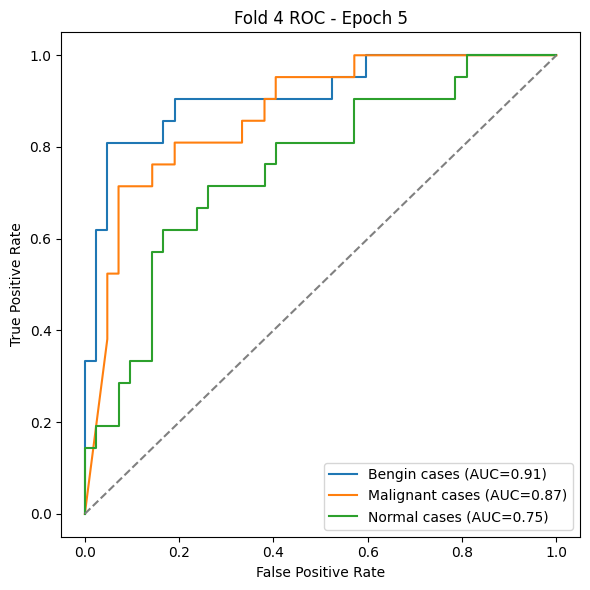

Fold 4 Epoch 10 - TrainLoss: 0.6552 ValAcc: 0.7143 ValAUC_macro: 0.8881


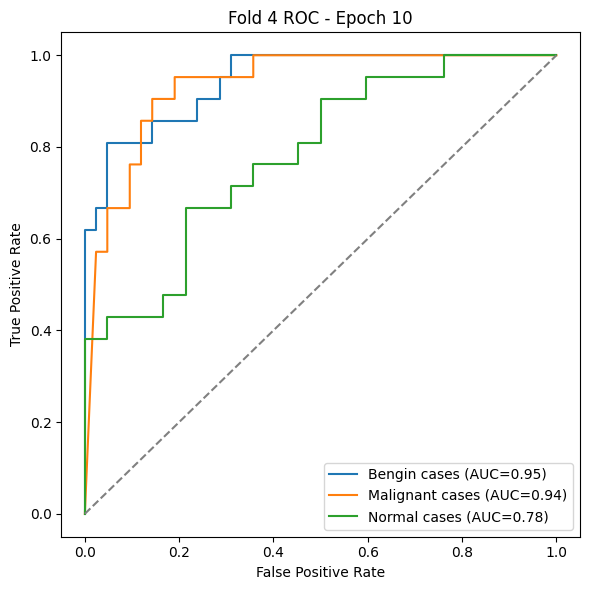

Fold 4 Epoch 15 - TrainLoss: 0.2788 ValAcc: 0.8254 ValAUC_macro: 0.9274


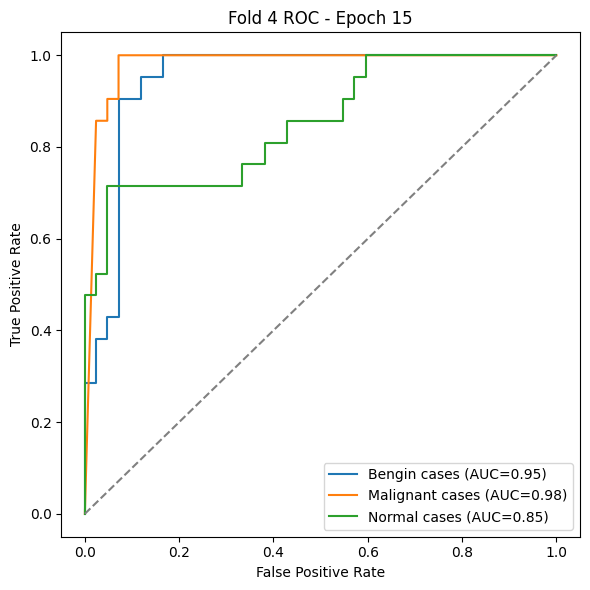

Fold 4 Epoch 20 - TrainLoss: 0.5211 ValAcc: 0.8095 ValAUC_macro: 0.9274


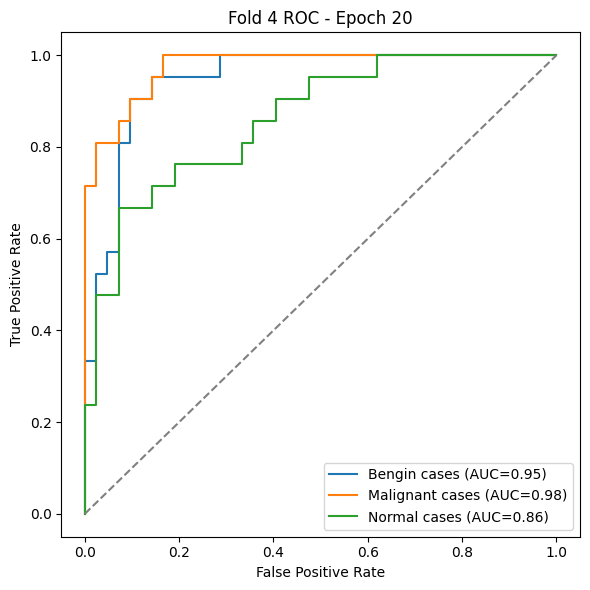

Fold 4 Epoch 25 - TrainLoss: 0.1324 ValAcc: 0.7460 ValAUC_macro: 0.9116


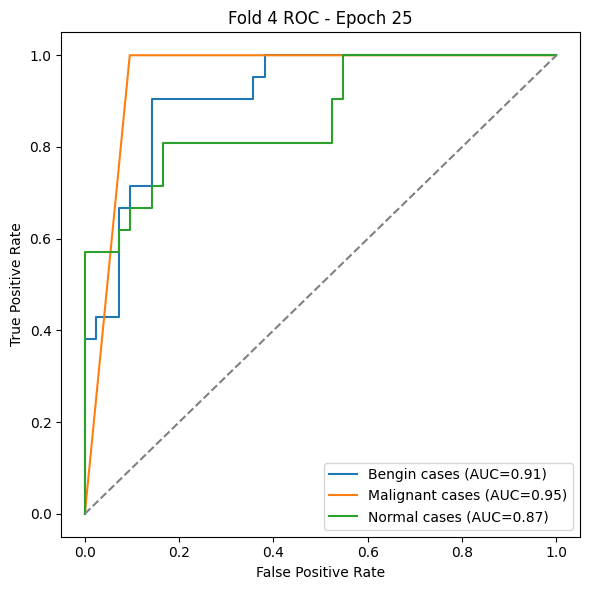

Fold 4 Epoch 30 - TrainLoss: 0.1263 ValAcc: 0.7460 ValAUC_macro: 0.9072


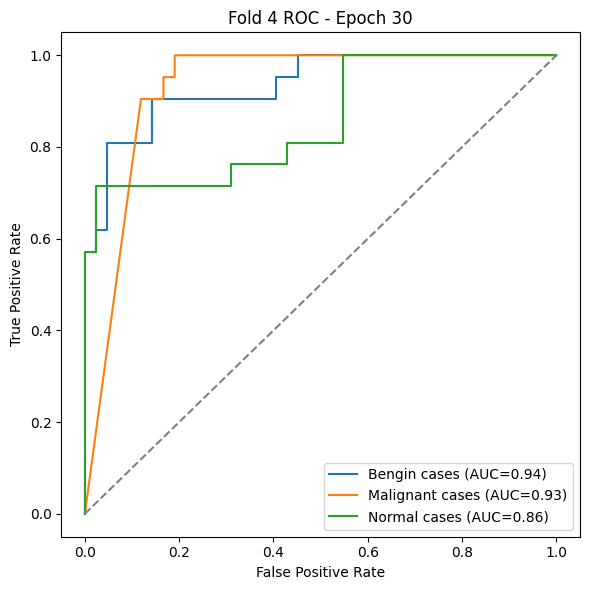

Fold 4 Epoch 35 - TrainLoss: 0.0345 ValAcc: 0.8413 ValAUC_macro: 0.9467


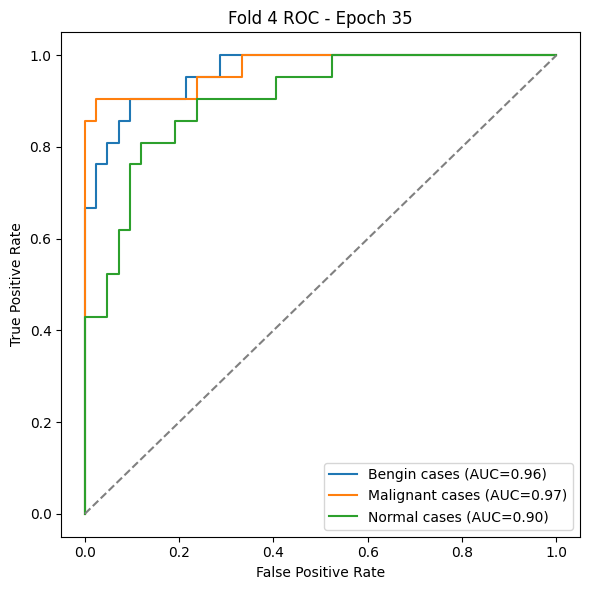

Fold 4 Epoch 40 - TrainLoss: 0.2056 ValAcc: 0.7778 ValAUC_macro: 0.9441


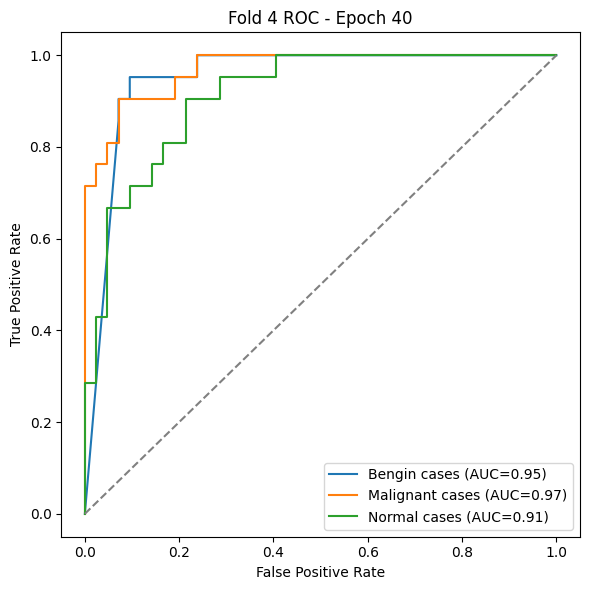

Fold 4 Epoch 45 - TrainLoss: 0.0299 ValAcc: 0.8413 ValAUC_macro: 0.9565


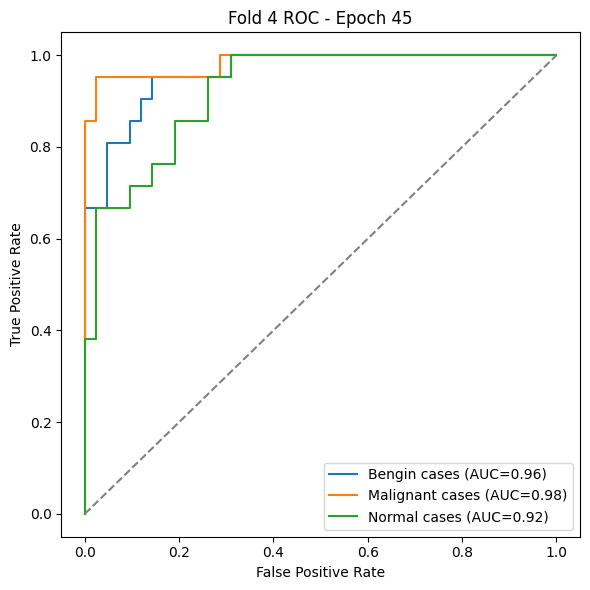

Fold 4 Epoch 50 - TrainLoss: 0.0009 ValAcc: 0.8254 ValAUC_macro: 0.9541


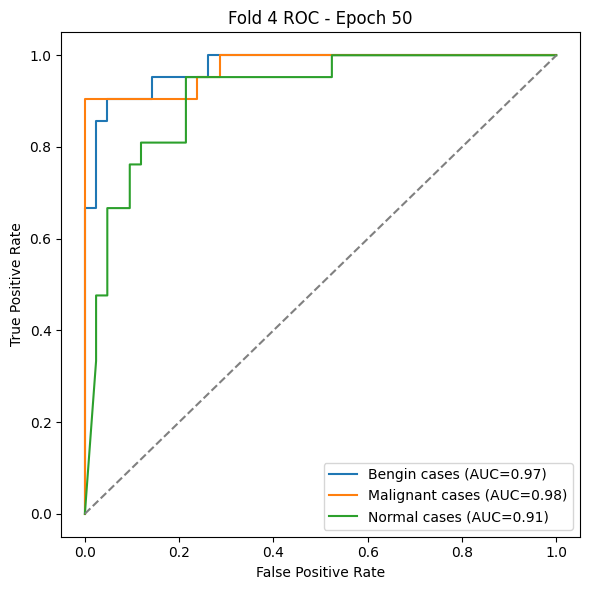

Fold 4 Epoch 55 - TrainLoss: 0.0001 ValAcc: 0.8095 ValAUC_macro: 0.9537


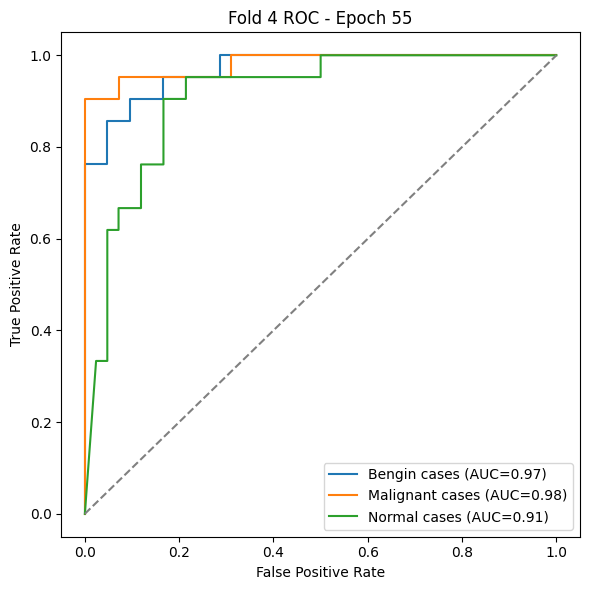

Fold 4 Epoch 60 - TrainLoss: 0.0001 ValAcc: 0.8413 ValAUC_macro: 0.9630


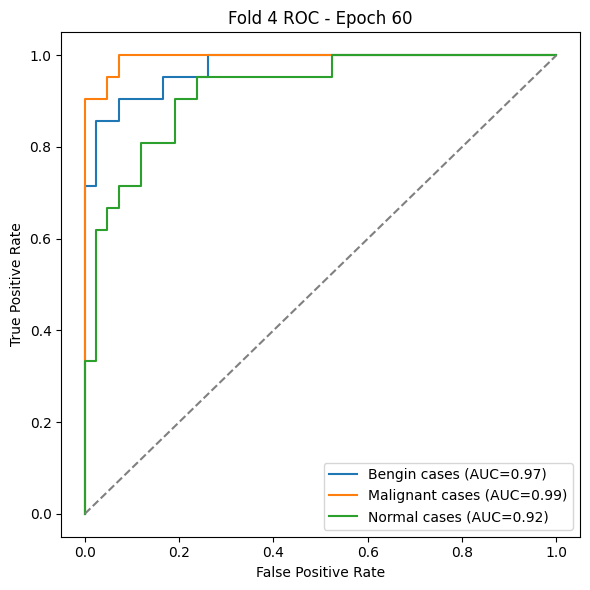

Fold 4 Epoch 65 - TrainLoss: 0.0001 ValAcc: 0.8413 ValAUC_macro: 0.9630


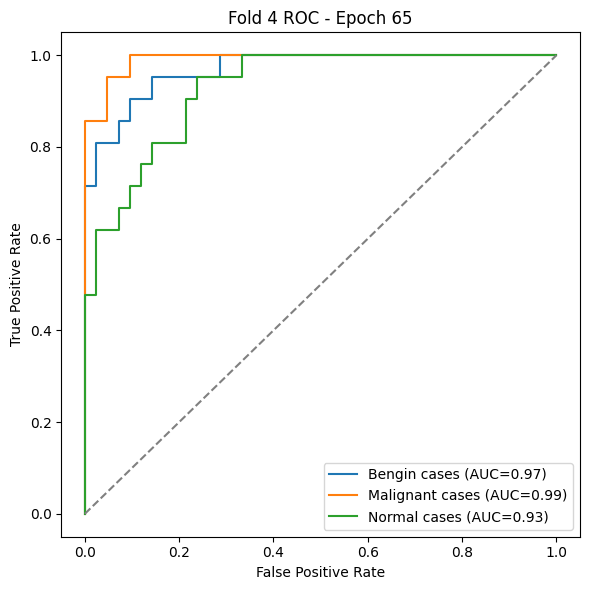

Fold 4 Epoch 70 - TrainLoss: 0.0001 ValAcc: 0.8571 ValAUC_macro: 0.9743


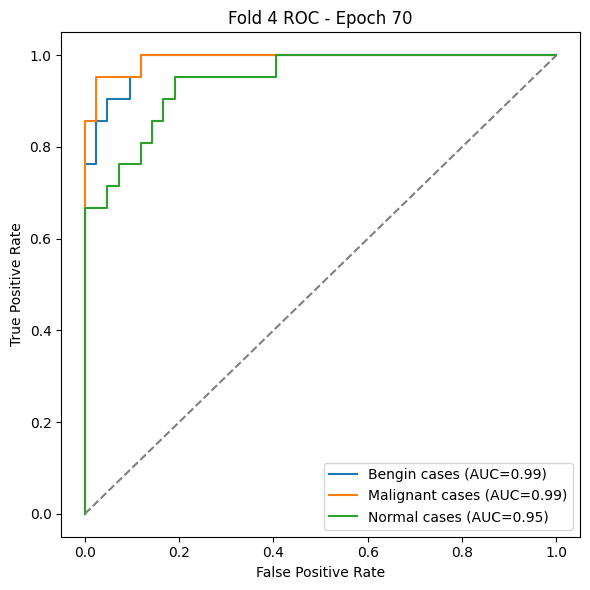

Fold 4 Epoch 75 - TrainLoss: 0.0001 ValAcc: 0.8413 ValAUC_macro: 0.9643


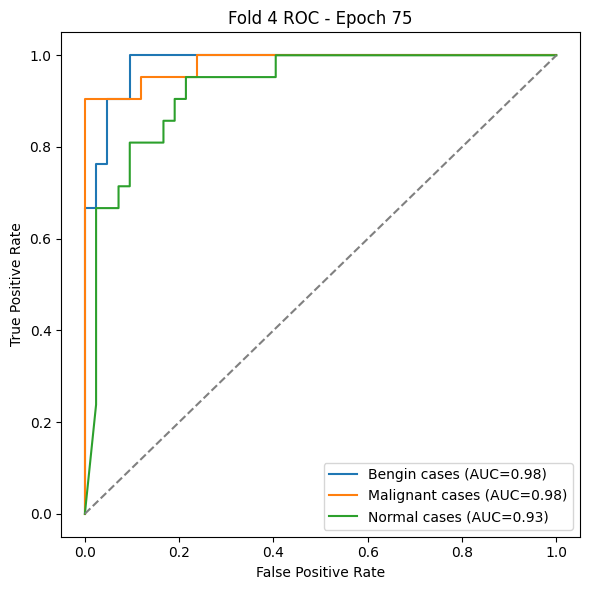

Fold 4 Epoch 80 - TrainLoss: 0.0001 ValAcc: 0.8254 ValAUC_macro: 0.9543


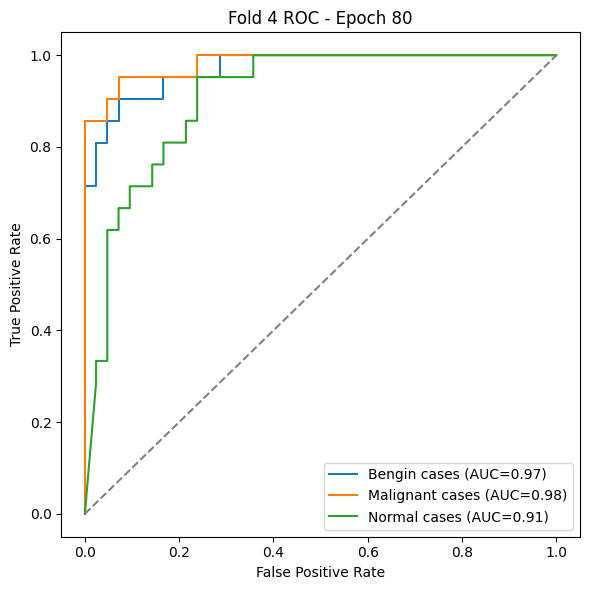

Fold 4 Epoch 85 - TrainLoss: 0.0001 ValAcc: 0.8413 ValAUC_macro: 0.9637


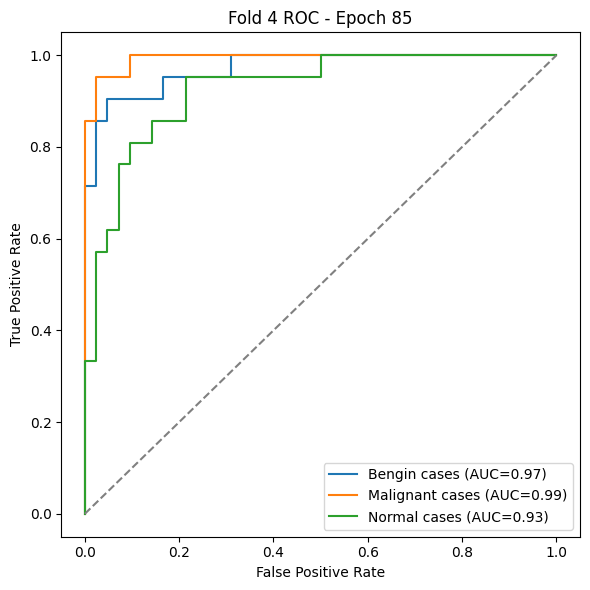

Fold 4 Epoch 90 - TrainLoss: 0.0001 ValAcc: 0.8413 ValAUC_macro: 0.9675


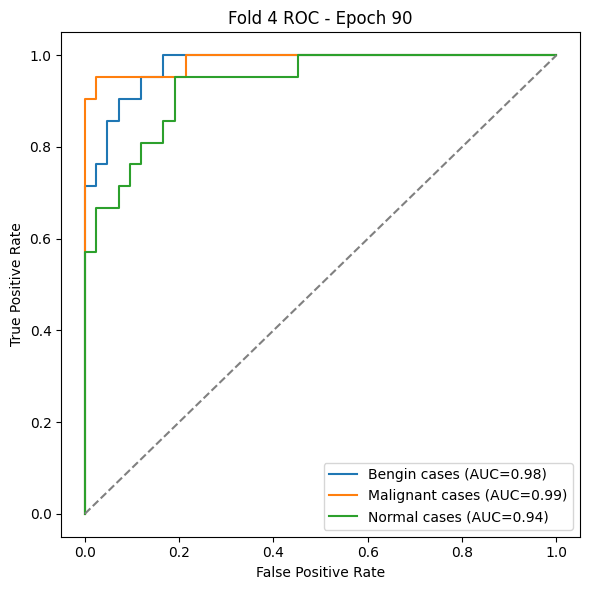

Fold 4 Epoch 95 - TrainLoss: 0.0001 ValAcc: 0.8254 ValAUC_macro: 0.9546


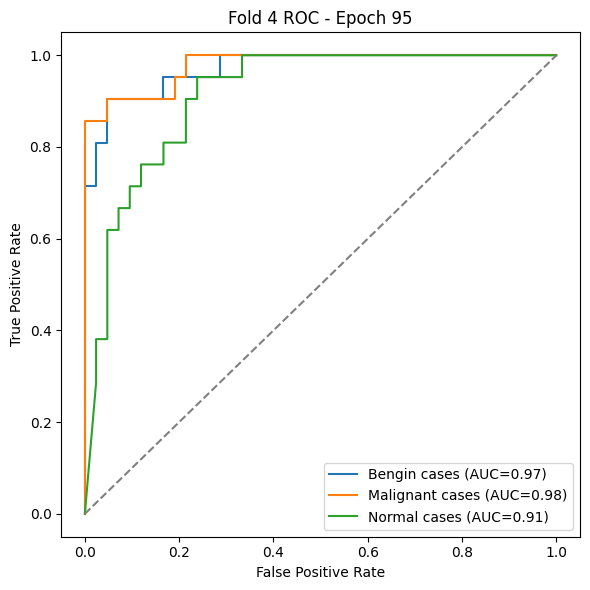

Fold 4 Epoch 100 - TrainLoss: 0.0001 ValAcc: 0.8413 ValAUC_macro: 0.9622


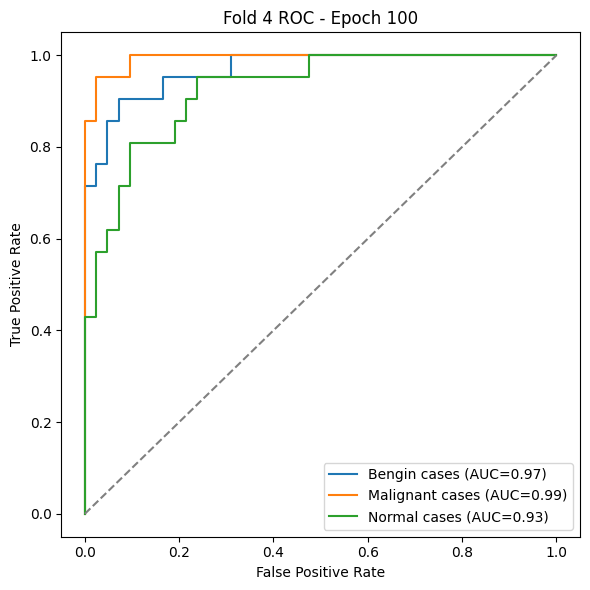

Fold 4 Summary -> Acc: 0.8413 Prec: 0.8414 Rec: 0.8413 F1: 0.8372 AUC_macro: 0.9637


In [ ]:
# -------------------------
# 9) 4-fold Cross-validation on training set
# -------------------------
train_indices_for_kfold = list(range(len(train_dataset)))
train_labels_for_kfold = [train_dataset[i][1] for i in train_indices_for_kfold]
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=RANDOM_SEED)

fold_results = []
for fold, (train_idx, val_idx) in enumerate(skf.split(train_indices_for_kfold, train_labels_for_kfold), 1):
    print(f"\n=== Fold {fold}/{K_FOLDS} ===")
    fold_train_ds = Subset(train_dataset, [train_indices_for_kfold[i] for i in train_idx])
    fold_val_ds   = Subset(train_dataset, [train_indices_for_kfold[i] for i in val_idx])

    train_loader = DataLoader(fold_train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
    val_loader   = DataLoader(fold_val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

    model = SimpleCNN(num_classes=NUM_CLASSES).to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

    for epoch in range(1, NUM_EPOCHS + 1):
        train_loss = train_one_epoch(model, train_loader, criterion, optimizer, DEVICE)

        # validation
        val_probs, val_preds, val_labels = evaluate(model, val_loader, DEVICE)
        val_acc = accuracy_score(val_labels, val_preds) if val_labels.size else 0.0

        if epoch % PLOT_EVERY == 0 or epoch == 1 or epoch == NUM_EPOCHS:
            try:
                val_auc_macro = roc_auc_score(label_binarize(val_labels, classes=list(range(NUM_CLASSES))),
                                              val_probs, average='macro', multi_class='ovo')
            except Exception:
                val_auc_macro = float('nan')
            print(f"Fold {fold} Epoch {epoch} - TrainLoss: {train_loss:.4f} ValAcc: {val_acc:.4f} ValAUC_macro: {val_auc_macro:.4f}")

        # plot ROC at checkpoints
        if (epoch == 1) or (epoch % PLOT_EVERY == 0) or (epoch == NUM_EPOCHS):
            if val_labels.size:
                plot_multiclass_roc(val_labels, val_probs, class_names, title=f"Fold {fold} ROC - Epoch {epoch}")

    # end of fold: final metrics on validation
    val_probs, val_preds, val_labels = evaluate(model, val_loader, DEVICE)
    try:
        val_auc_macro = roc_auc_score(label_binarize(val_labels, classes=list(range(NUM_CLASSES))),
                                      val_probs, average='macro', multi_class='ovo')
    except Exception:
        val_auc_macro = float('nan')

    prec, rec, f1, _ = precision_recall_fscore_support(val_labels, val_preds, average='macro', zero_division=0)
    acc = accuracy_score(val_labels, val_preds)

    print(f"Fold {fold} Summary -> Acc: {acc:.4f} Prec: {prec:.4f} Rec: {rec:.4f} F1: {f1:.4f} AUC_macro: {val_auc_macro:.4f}")
    fold_results.append({"fold": fold, "acc": acc, "prec": prec, "rec": rec, "f1": f1, "auc": val_auc_macro})

In [ ]:
# CV summary
print("\n=== CV Summary ===")
for r in fold_results:
    print(f"Fold {r['fold']}: Acc={r['acc']:.4f} Prec={r['prec']:.4f} Rec={r['rec']:.4f} F1={r['f1']:.4f} AUC={r['auc']:.4f}")
print("Mean Acc:", np.mean([r['acc'] for r in fold_results]))
print("Mean AUC:", np.nanmean([r['auc'] for r in fold_results]))



=== CV Summary ===
Fold 1: Acc=0.9206 Prec=0.9228 Rec=0.9206 F1=0.9214 AUC=0.9917
Fold 2: Acc=0.8730 Prec=0.8971 Rec=0.8730 F1=0.8741 AUC=0.9225
Fold 3: Acc=0.8730 Prec=0.8754 Rec=0.8730 F1=0.8732 AUC=0.9743
Fold 4: Acc=0.8413 Prec=0.8414 Rec=0.8413 F1=0.8372 AUC=0.9637
Mean Acc: 0.876984126984127
Mean AUC: 0.9630574452003022


This block retrains the final CNN using the entire training dataset and then evaluates it once on the held-out test set.
It prints training loss at checkpoints and then calculates final test performance using accuracy, macro precision/recall/F1, and macro AUC.
It also prints a per-class classification report and additional aggregated metrics (macro and weighted) as requested by your professor.
Finally, it shows the confusion matrix heatmap and plots the multi-class ROC curve for the final test results.


Retraining on full training set and evaluating on TEST set...
Final train Epoch 1/100 - Loss: 30.3051
Final train Epoch 10/100 - Loss: 0.2419
Final train Epoch 20/100 - Loss: 0.0504
Final train Epoch 30/100 - Loss: 0.0145
Final train Epoch 40/100 - Loss: 0.0914
Final train Epoch 50/100 - Loss: 0.0158
Final train Epoch 60/100 - Loss: 0.0471
Final train Epoch 70/100 - Loss: 0.0047
Final train Epoch 80/100 - Loss: 0.0001
Final train Epoch 90/100 - Loss: 0.0000
Final train Epoch 100/100 - Loss: 0.0000

=== Final Test Results ===
Accuracy: 0.9352
Precision (macro): 0.9357
Recall (macro): 0.9352
F1 (macro): 0.9353
AUC-ROC (macro): 0.9877

Classification report (Per-Class Metrics):
                 precision    recall  f1-score   support

   Bengin cases       0.92      0.94      0.93        36
Malignant cases       0.97      0.94      0.96        36
   Normal cases       0.92      0.92      0.92        36

       accuracy                           0.94       108
      macro avg       0.94  

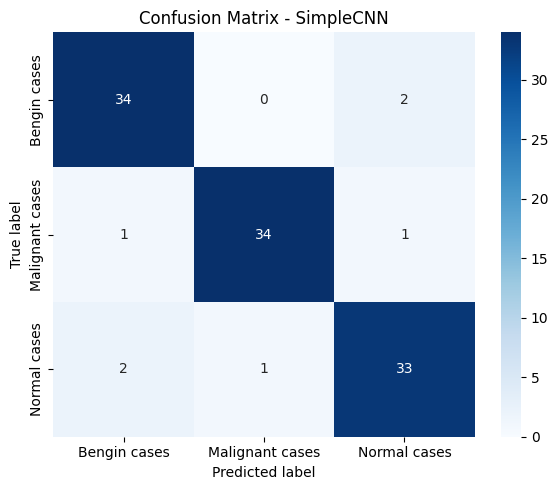

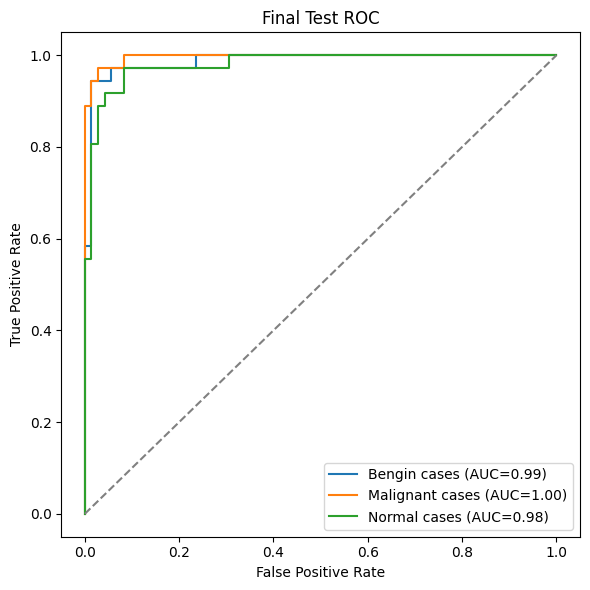

In [ ]:
# -------------------------
# Retrain final model on full training set and test on held-out test set
# -------------------------
print("\nRetraining on full training set and evaluating on TEST set...")
full_train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

final_model = SimpleCNN(num_classes=NUM_CLASSES).to(DEVICE)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(final_model.parameters(), lr=LEARNING_RATE)

for epoch in range(1, NUM_EPOCHS + 1):
    train_loss = train_one_epoch(final_model, full_train_loader, criterion, optimizer, DEVICE)
    if epoch % 10 == 0 or epoch == 1 or epoch == NUM_EPOCHS:
        print(f"Final train Epoch {epoch}/{NUM_EPOCHS} - Loss: {train_loss:.4f}")

# Evaluate on test set
test_probs, test_preds, test_labels = evaluate(final_model, test_loader, DEVICE)

# -------------------------
# ORIGINAL METRICS (kept exactly as they were)
# -------------------------
acc_test = accuracy_score(test_labels, test_preds)
prec_macro, rec_macro, f1_macro, _ = precision_recall_fscore_support(
    test_labels, test_preds, average='macro', zero_division=0
)

try:
    auc_macro_test = roc_auc_score(
        label_binarize(test_labels, classes=list(range(NUM_CLASSES))),
        test_probs,
        average='macro',
        multi_class='ovo'
    )
except Exception:
    auc_macro_test = float('nan')

print("\n=== Final Test Results ===")
print(f"Accuracy: {acc_test:.4f}")
print(f"Precision (macro): {prec_macro:.4f}")
print(f"Recall (macro): {rec_macro:.4f}")
print(f"F1 (macro): {f1_macro:.4f}")
print(f"AUC-ROC (macro): {auc_macro_test:.4f}")

# -------------------------
# PER-CLASS METRICS (classification report)
# -------------------------
print("\nClassification report (Per-Class Metrics):")
print(classification_report(test_labels, test_preds, target_names=class_names, zero_division=0))

# -------------------------
# ADDITIONAL AGGREGATED METRICS (requested by professor)
# -------------------------

from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix
)

overall_accuracy = accuracy_score(test_labels, test_preds)
macro_precision = precision_score(test_labels, test_preds, average='macro', zero_division=0)
macro_recall = recall_score(test_labels, test_preds, average='macro', zero_division=0)
macro_f1 = f1_score(test_labels, test_preds, average='macro', zero_division=0)

weighted_precision = precision_score(test_labels, test_preds, average='weighted', zero_division=0)
weighted_recall = recall_score(test_labels, test_preds, average='weighted', zero_division=0)
weighted_f1 = f1_score(test_labels, test_preds, average='weighted', zero_division=0)

print("\n=== AGGREGATED METRICS (Overall Model Performance) ===")
print(f"Accuracy:             {overall_accuracy:.4f}")
print(f"Macro Precision:      {macro_precision:.4f}")
print(f"Macro Recall:         {macro_recall:.4f}")
print(f"Macro F1-score:       {macro_f1:.4f}")
print(f"Weighted Precision:   {weighted_precision:.4f}")
print(f"Weighted Recall:      {weighted_recall:.4f}")
print(f"Weighted F1-score:    {weighted_f1:.4f}")

# -------------------------
# Confusion Matrix
# -------------------------
cm = confusion_matrix(test_labels, test_preds)
print(" ")
print("\nConfusion matrix:\n", cm)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix - SimpleCNN")
plt.tight_layout()
plt.show()
print(" ")

# -------------------------
# ROC Curve
# -------------------------
plot_multiclass_roc(test_labels, test_probs, class_names, title="Final Test ROC")



This block generates a Grad-CAM explanation for one sample image from the test set.
It creates a Grad-CAM object using the trained CNN and a chosen target layer, then produces a heatmap showing where the model focused.
The heatmap is converted into a display-friendly format and overlaid on the original image.
Finally, it plots the original image, the heatmap, and the overlay side-by-side for easy interpretatio

Generating Grad-CAM on a sample test image...



raw_cam shape: (64, 64)
heatmap_uint8 shape: (64, 64)


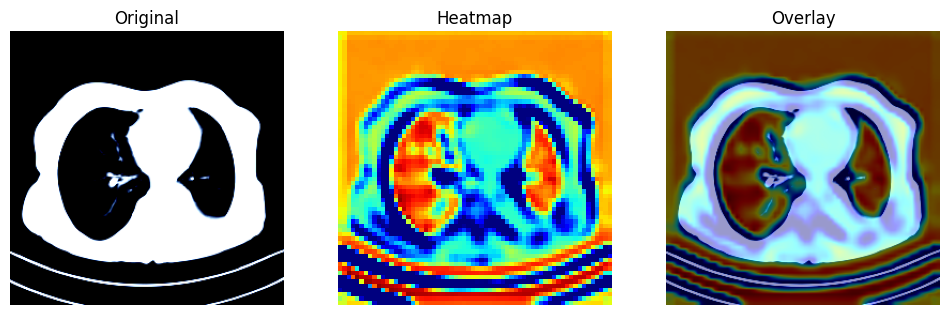

In [ ]:
import cv2


print("Generating Grad-CAM on a sample test image...\n")

idx = 10
img, label = test_dataset[idx]

final_model.eval()

# 1) create GradCAM object
cam = GradCAM(final_model, final_model.bn3)

# 2) generate raw heatmap
raw_cam = cam.generate(img)
print("raw_cam shape:", raw_cam.shape)

# 3) convert to uint8 heatmap
heatmap_uint8 = prepare_heatmap(raw_cam)
print("heatmap_uint8 shape:", heatmap_uint8.shape)

# 4) create heatmap overlay
overlay = overlay_heatmap(img, heatmap_uint8)

# 5) plot results
plt.figure(figsize=(12,5))
plt.subplot(1,3,1)
plt.title("Original")
plt.imshow(img.permute(1,2,0).cpu().numpy())
plt.axis('off')

plt.subplot(1,3,2)
plt.title("Heatmap")
plt.imshow(heatmap_uint8, cmap='jet')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Overlay")
plt.imshow(overlay)
plt.axis('off')

plt.show()


..

 *************************************************************** SVM **********************************************

..

This section sets up the SVM pipeline where image features are extracted using a pre-trained ResNet-50, and then a linear SVM is trained on those features.
It imports all required libraries for deep feature extraction, data splitting, and evaluation metrics.
Next, it fixes random seeds for reproducibility and selects GPU/CPU automatically.
Finally, it defines all key experiment settings like dataset path, image size, test split, K-folds, and SVM hyperparameters.

In [ ]:
# ---------------------------
# ResNet-50 features + Linear SVM (4-fold CV + final test)
# ---------------------------


# 0) Imports
import os
import random
import numpy as np
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import time
import seaborn as sns
import torch
import torch.nn.functional as F
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms, datasets, models
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import label_binarize, StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    roc_curve, auc, roc_auc_score, classification_report, confusion_matrix
)

# 1) Settings
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed_all(RANDOM_SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

DATASET_PATH = "/content/drive/MyDrive/Lung_Images"  #  dataset path
IMG_SIZE = 224
BATCH_SIZE = 16           # for feature extraction DataLoader
DOWNSAMPLE_TO = 120       # undersample target
TEST_SIZE = 0.30
K_FOLDS = 4
SVM_KERNEL = 'linear'
SVM_C = 1.0               # regularization parameter
#PCA_VARIANCE = 0.95
VERBOSE = True

Device: cuda


This block defines the image preprocessing steps used before extracting features with ResNet-50.
All images are resized to a fixed size and converted into tensors.
Standard ImageNet normalisation is applied so the images match the input distribution expected by ResNet-50.
No data augmentation is used because these images are only used for feature extraction.

In [ ]:
# 2) Transforms (no rotation)
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

This block loads the lung image dataset using PyTorch’s ImageFolder, where each class is stored in a separate folder.
It automatically assigns numeric labels based on folder names.
The class names and total number of images are printed to verify correct loading.
The number of classes is also stored for later use in evaluation.

In [ ]:
# 3) Load dataset (ImageFolder expects subfolders per class)
full_dataset = datasets.ImageFolder(DATASET_PATH, transform=transform)
class_names = full_dataset.classes
NUM_CLASSES = len(class_names)
print("Classes:", class_names)
print("Total images (before balancing):", len(full_dataset))

Classes: ['Bengin cases', 'Malignant cases', 'Normal cases']
Total images (before balancing): 1097


This block analyses the class distribution in the dataset and balances it using undersampling.
It limits each class to the same number of images to avoid bias during SVM training.
Random sampling is used for classes with more samples, while smaller classes keep all images.
The final balanced indices and labels are stored for later splitting and feature extraction.

In [ ]:
# 4) Build indices per class and undersample to DOWNSAMPLE_TO
indices_per_class = defaultdict(list)
for idx, (_, label) in enumerate(full_dataset):
    indices_per_class[label].append(idx)

for lbl, idxs in indices_per_class.items():
    print(f"Class {lbl} ({class_names[lbl]}): {len(idxs)} images")

balanced_indices = []
for lbl, idxs in indices_per_class.items():
    if len(idxs) >= DOWNSAMPLE_TO:
        chosen = random.sample(idxs, DOWNSAMPLE_TO)
    else:
        chosen = idxs.copy()
    balanced_indices.extend(chosen)

random.shuffle(balanced_indices)
print("Balanced dataset size:", len(balanced_indices))

balanced_labels = [full_dataset[i][1] for i in balanced_indices]

Class 0 (Bengin cases): 120 images
Class 1 (Malignant cases): 561 images
Class 2 (Normal cases): 416 images
Balanced dataset size: 360


This block splits the balanced dataset into training and testing sets using a 70/30 hold-out split.
Stratified sampling is used so that each class keeps the same proportion in both sets.
The split is made reproducible using a fixed random seed.
Finally, class counts are printed to confirm that the split remains balanced.

In [ ]:
# 5) 70/30 hold-out split (on balanced data)
train_idx_balanced, test_idx_balanced, y_train_balanced, y_test_balanced = train_test_split(
    balanced_indices, balanced_labels, test_size=TEST_SIZE, stratify=balanced_labels, random_state=RANDOM_SEED
)

print("Train size:", len(train_idx_balanced), "Test size:", len(test_idx_balanced))
print("Train class counts:", Counter([full_dataset[i][1] for i in train_idx_balanced]))
print("Test class counts:", Counter([full_dataset[i][1] for i in test_idx_balanced]))

Train size: 252 Test size: 108
Train class counts: Counter({0: 84, 1: 84, 2: 84})
Test class counts: Counter({2: 36, 1: 36, 0: 36})


This block creates a custom dataset wrapper so that only selected images (by index) are used from the full dataset.
It allows us to reuse the same ImageFolder dataset while controlling which samples go into training and testing.
The transform is already defined in ImageFolder, so it is applied automatically when images are loaded.
This approach avoids duplicating data and keeps the pipeline clean and efficient.

In [ ]:
# 6) Dataset wrapper to apply transform (we already set transform in ImageFolder)
class ImageFolderSubsetWithTransform(Dataset):
    def __init__(self, image_folder, indices):
        self.image_folder = image_folder
        self.indices = list(indices)
    def __len__(self):
        return len(self.indices)
    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        path, label = self.image_folder.samples[real_idx]
        img = self.image_folder.loader(path)  # PIL image
        if self.image_folder.transform:
            img = self.image_folder.transform(img)
        return img, label

train_dataset = ImageFolderSubsetWithTransform(full_dataset, train_idx_balanced)
test_dataset = ImageFolderSubsetWithTransform(full_dataset, test_idx_balanced)

This block creates DataLoaders specifically for feature extraction using ResNet-50.
Shuffling is disabled so that extracted features stay aligned with their corresponding labels.
Batches are used to make feature extraction efficient and memory-safe.
These loaders are later passed through ResNet-50 to generate feature vectors for SVM training and testing.

In [ ]:
# 7) Create DataLoaders for feature extraction
train_loader_fe = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader_fe  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

This block loads a pretrained ResNet-50 model and converts it into a feature extractor.
The final classification layer is removed so the network outputs deep feature vectors instead of class predictions.
These extracted features represent high-level image information learned from ImageNet.
The feature extractor is used to generate inputs for the SVM classifier.

In [ ]:
# 8) Load pretrained ResNet-50 and build feature extractor
resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
resnet50 = resnet50.to(DEVICE)
resnet50.eval()

# Remove final fully connected layer: take everything except the last fc
feature_extractor = nn.Sequential(*list(resnet50.children())[:-1])
feature_extractor = feature_extractor.to(DEVICE)
print("Feature extractor ready (ResNet-50).")

Feature extractor ready (ResNet-50).


This helper function extracts deep features from images using the ResNet-50 feature extractor.
It processes images in batches, converts each image into a fixed-length feature vector, and collects the corresponding labels.
Gradients are disabled because the model is only used for inference, not training.
The function returns feature matrices and labels that are ready to be used for SVM training and evaluation.

In [ ]:
# 9) Helper to extract features given a dataloader
def extract_features(dataloader, model, device):
    features_list = []
    labels_list = []
    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs = imgs.to(device)
            out = model(imgs)              # shape [B, 2048, 1, 1]
            out = out.view(out.size(0), -1)  # shape [B, 2048]
            features_list.append(out.cpu().numpy())
            labels_list.append(labels.numpy())
    X = np.vstack(features_list)
    y = np.hstack(labels_list)
    return X, y


This block extracts deep feature vectors for all training and test images using the ResNet-50 feature extractor.
The extraction time is measured to understand computational cost.
Each image is converted into a fixed-length numerical representation suitable for SVM training.
The shapes of the extracted feature matrices are printed to confirm successful extraction.

In [ ]:
# 10) Extract features for entire train and test sets
t0 = time.time()
X_train_all, y_train_all = extract_features(train_loader_fe, feature_extractor, DEVICE)
X_test, y_test = extract_features(test_loader_fe, feature_extractor, DEVICE)
t1 = time.time()
print(f"Extracted features: train {X_train_all.shape}, test {X_test.shape}  (time {t1-t0:.1f}s)")

Extracted features: train (252, 2048), test (108, 2048)  (time 4.7s)


This block standardises the extracted deep features so that all features have the same scale before SVM training.
Standardisation is important because SVM is sensitive to feature magnitudes.

In [ ]:
# 11) Standardize features (fit scaler on training features)
scaler = StandardScaler().fit(X_train_all)
X_train_all_scaled = scaler.transform(X_train_all)
X_test_scaled = scaler.transform(X_test)

This block performs stratified 4-fold cross-validation on the scaled ResNet-50 features to evaluate the SVM fairly.
In each fold, a linear SVM is trained on part of the training features and validated on the remaining part.
It calculates accuracy, macro precision/recall/F1, and macro AUC, and also plots ROC curves for each class.
Finally, it prints a fold-wise summary and the mean performance across all folds.


=== Fold 1/4 ===
Val Acc: 0.9048  Prec: 0.9048  Rec: 0.9048  F1: 0.9048  AUC_macro: 0.9837


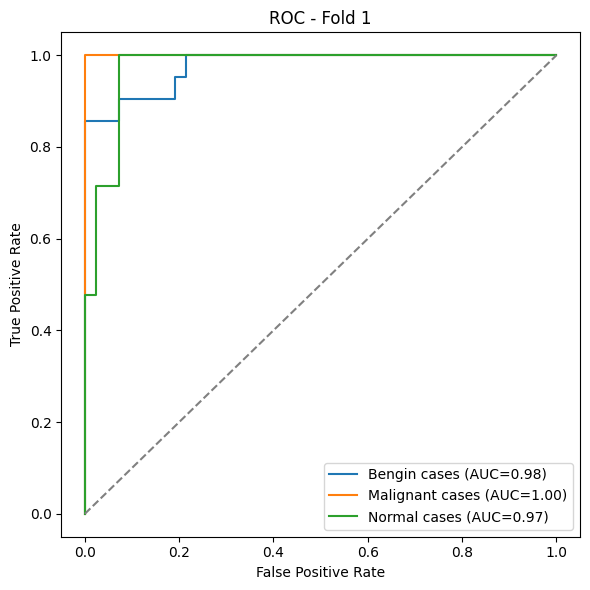


=== Fold 2/4 ===
Val Acc: 0.8571  Prec: 0.8613  Rec: 0.8571  F1: 0.8571  AUC_macro: 0.9524


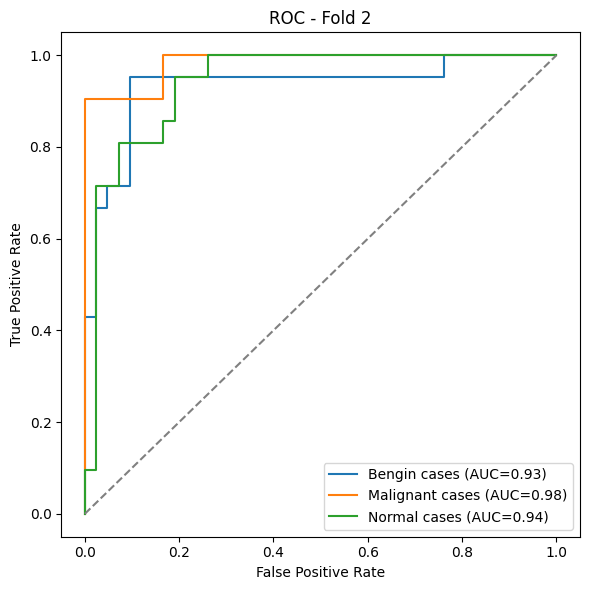


=== Fold 3/4 ===
Val Acc: 0.8413  Prec: 0.8474  Rec: 0.8413  F1: 0.8423  AUC_macro: 0.9739


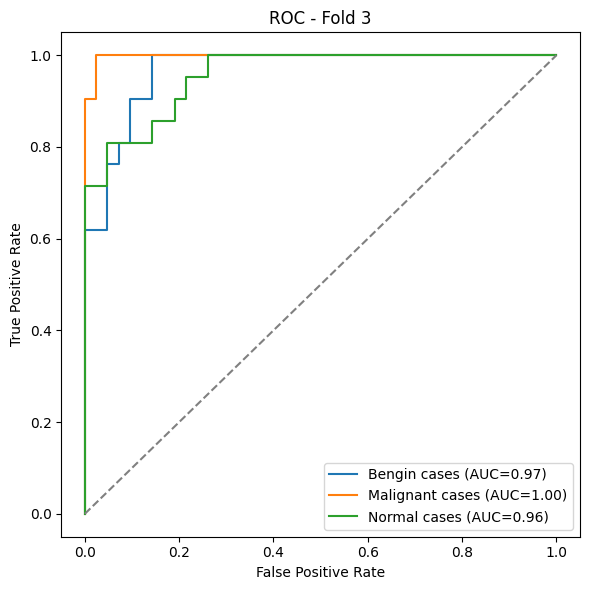


=== Fold 4/4 ===
Val Acc: 0.8730  Prec: 0.8714  Rec: 0.8730  F1: 0.8718  AUC_macro: 0.9713


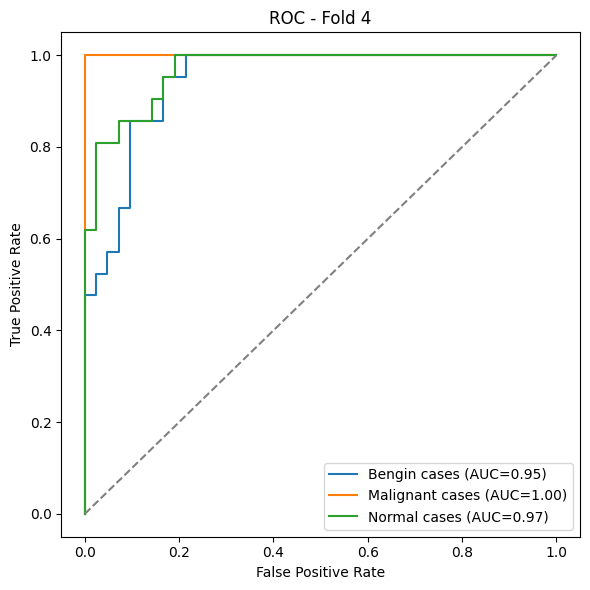


=== Cross-validation summary ===
Fold 1: Acc=0.9048 Prec=0.9048 Rec=0.9048 F1=0.9048 AUC=0.9837
Fold 2: Acc=0.8571 Prec=0.8613 Rec=0.8571 F1=0.8571 AUC=0.9524
Fold 3: Acc=0.8413 Prec=0.8474 Rec=0.8413 F1=0.8423 AUC=0.9739
Fold 4: Acc=0.8730 Prec=0.8714 Rec=0.8730 F1=0.8718 AUC=0.9713
Mean Acc: 0.8690476190476191
Mean AUC_macro: 0.9703325774754347


In [ ]:
# 12) Now doing Stratified K-Fold on the training set (features already extracted)
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=RANDOM_SEED)

fold_results = []
fold_no = 0

for train_index, val_index in skf.split(X_train_all_scaled, y_train_all):
    fold_no += 1
    print(f"\n=== Fold {fold_no}/{K_FOLDS} ===")
    X_tr, X_val = X_train_all_scaled[train_index], X_train_all_scaled[val_index]
    y_tr, y_val = y_train_all[train_index], y_train_all[val_index]

    # Train linear SVM with probability estimates (SVC with linear kernel & probability=True)
    svm = SVC(kernel=SVM_KERNEL, C=SVM_C, probability=True, random_state=RANDOM_SEED)
    svm.fit(X_tr, y_tr)

    # Predict on validation set
    y_val_pred = svm.predict(X_val)
    y_val_probs = svm.predict_proba(X_val)  # shape (N, C)

    # Metrics
    acc = accuracy_score(y_val, y_val_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(y_val, y_val_pred, average='macro', zero_division=0)
    # AUC (macro multiclass). Need binarized labels
    try:
        y_val_bin = label_binarize(y_val, classes=list(range(NUM_CLASSES)))
        auc_macro = roc_auc_score(y_val_bin, y_val_probs, average='macro', multi_class='ovo')
    except Exception:
        auc_macro = float('nan')

    print(f"Val Acc: {acc:.4f}  Prec: {prec:.4f}  Rec: {rec:.4f}  F1: {f1:.4f}  AUC_macro: {auc_macro:.4f}")

    # ROC plot for this fold (per class)
    try:
        y_val_bin = label_binarize(y_val, classes=list(range(NUM_CLASSES)))
        plt.figure(figsize=(6,6))
        for i, cls in enumerate(class_names):
            fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_val_probs[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"{cls} (AUC={roc_auc:.2f})")
        plt.plot([0,1],[0,1],'--', color='gray')
        plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
        plt.title(f"ROC - Fold {fold_no}")
        plt.legend(loc='lower right')
        plt.tight_layout()
        plt.show()
    except Exception:
        pass

    fold_results.append({
        "fold": fold_no,
        "acc": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "auc_macro": auc_macro
    })

# Print cross-validation summary
print("\n=== Cross-validation summary ===")
for r in fold_results:
    print(f"Fold {r['fold']}: Acc={r['acc']:.4f} Prec={r['precision']:.4f} Rec={r['recall']:.4f} F1={r['f1']:.4f} AUC={r['auc_macro']:.4f}")
print("Mean Acc:", np.mean([r['acc'] for r in fold_results]))
print("Mean AUC_macro:", np.nanmean([r['auc_macro'] for r in fold_results]))

This block trains the final SVM model on the full training feature set and then evaluates it once on the held-out test set.
It predicts both class labels and class probabilities, then reports accuracy, macro precision/recall/F1, and macro AUC-ROC.
It also prints per-class metrics using a classification report and additional aggregated macro/weighted scores .
Finally, it plots the multi-class ROC curves and shows a confusion matrix heatmap to understand class-wise errors.


=== Retrain on full training set and evaluate on TEST set ===

=== Final Test Results ===
Accuracy: 0.9259
Precision (macro): 0.9269
Recall (macro): 0.9259
F1 (macro): 0.9256
AUC-ROC (macro): 0.9771

Classification report (per class):
                 precision    recall  f1-score   support

   Bengin cases       0.94      0.86      0.90        36
Malignant cases       0.97      1.00      0.99        36
   Normal cases       0.87      0.92      0.89        36

       accuracy                           0.93       108
      macro avg       0.93      0.93      0.93       108
   weighted avg       0.93      0.93      0.93       108


=== AGGREGATED METRICS (Overall Model Performance) ===
Accuracy:             0.9259
Macro Precision:      0.9269
Macro Recall:         0.9259
Macro F1-score:       0.9256
Weighted Precision:   0.9269
Weighted Recall:      0.9259
Weighted F1-score:    0.9256


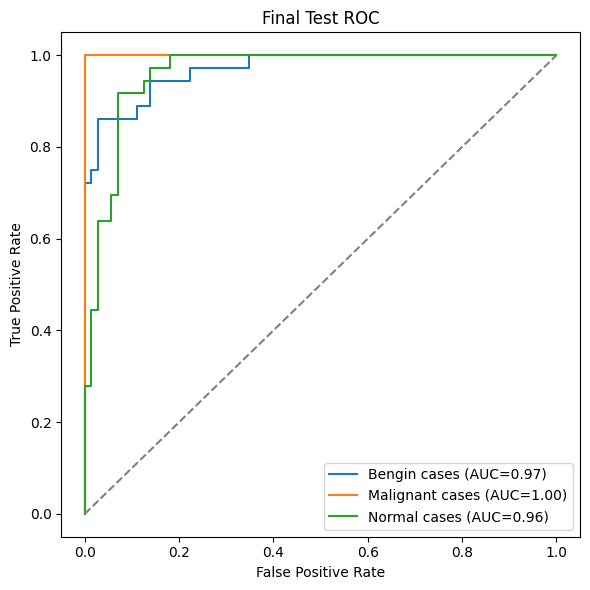

Confusion matrix:
 [[31  0  5]
 [ 0 36  0]
 [ 2  1 33]]


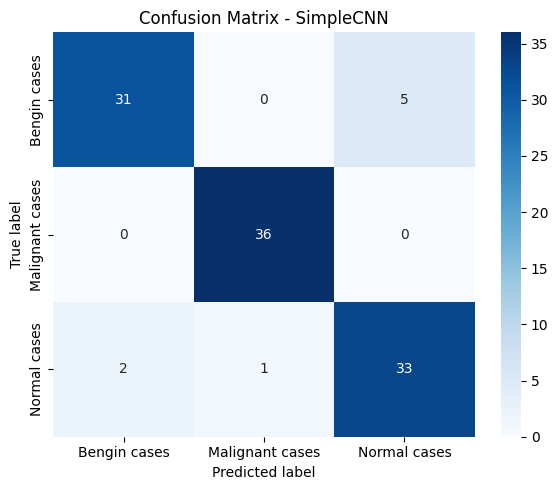

In [ ]:
# 13) Retrain SVM on full training set and evaluate on held-out test set
print("\n=== Retrain on full training set and evaluate on TEST set ===")
svm_final = SVC(kernel=SVM_KERNEL, C=SVM_C, probability=True, random_state=RANDOM_SEED)
svm_final.fit(X_train_all_scaled, y_train_all)

y_test_pred = svm_final.predict(X_test_scaled)
y_test_probs = svm_final.predict_proba(X_test_scaled)

# -------------------------
# ORIGINAL METRICS
# -------------------------
acc_test = accuracy_score(y_test, y_test_pred)
prec_macro, rec_macro, f1_macro, _ = precision_recall_fscore_support(
    y_test, y_test_pred, average='macro', zero_division=0
)

try:
    y_test_bin = label_binarize(y_test, classes=list(range(NUM_CLASSES)))
    auc_macro_test = roc_auc_score(
        y_test_bin, y_test_probs, average='macro', multi_class='ovo'
    )
except Exception:
    auc_macro_test = float('nan')

print("\n=== Final Test Results ===")
print(f"Accuracy: {acc_test:.4f}")
print(f"Precision (macro): {prec_macro:.4f}")
print(f"Recall (macro): {rec_macro:.4f}")
print(f"F1 (macro): {f1_macro:.4f}")
print(f"AUC-ROC (macro): {auc_macro_test:.4f}")

# -------------------------
# PER-CLASS METRICS
# -------------------------
print("\nClassification report (per class):")
print(classification_report(y_test, y_test_pred, target_names=class_names, zero_division=0))

# -------------------------
# NEW: AGGREGATED METRICS
# -------------------------
from sklearn.metrics import precision_score, recall_score, f1_score

overall_accuracy = accuracy_score(y_test, y_test_pred)
macro_precision = precision_score(y_test, y_test_pred, average='macro', zero_division=0)
macro_recall = recall_score(y_test, y_test_pred, average='macro', zero_division=0)
macro_f1 = f1_score(y_test, y_test_pred, average='macro', zero_division=0)

weighted_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
weighted_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
weighted_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)

print("\n=== AGGREGATED METRICS (Overall Model Performance) ===")
print(f"Accuracy:             {overall_accuracy:.4f}")
print(f"Macro Precision:      {macro_precision:.4f}")
print(f"Macro Recall:         {macro_recall:.4f}")
print(f"Macro F1-score:       {macro_f1:.4f}")
print(f"Weighted Precision:   {weighted_precision:.4f}")
print(f"Weighted Recall:      {weighted_recall:.4f}")
print(f"Weighted F1-score:    {weighted_f1:.4f}")

# -------------------------
# Final test ROC plot
# -------------------------
try:
    plt.figure(figsize=(6,6))
    for i, cls in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{cls} (AUC={roc_auc:.2f})")
    plt.plot([0,1],[0,1],'--', color='gray')
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
    plt.title("Final Test ROC")
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()
except Exception:
    pass

# -------------------------
# Confusion Matrix
# -------------------------
cm = confusion_matrix(y_test, y_test_pred)
print("Confusion matrix:\n", cm)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix - ResNet50 + Linear SVM")
plt.tight_layout()
plt.show()



This block uses SHAP to explain the final SVM model by showing which ResNet-50 features contributed most to a prediction.
It selects a small set of training samples as a “background” reference for SHAP.
Then it computes SHAP values for one test sample using KernelExplainer, which works with any model using predict_proba.
Finally, it visualises the most influential features using a SHAP bar-style summary plot.


=== SHAP Explanation for SVM (2048-dimensional features) ===
Computing SHAP values (may take a bit)...


  0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipython-input-3259784830.py:27: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, x_test_sample, plot_type="bar")


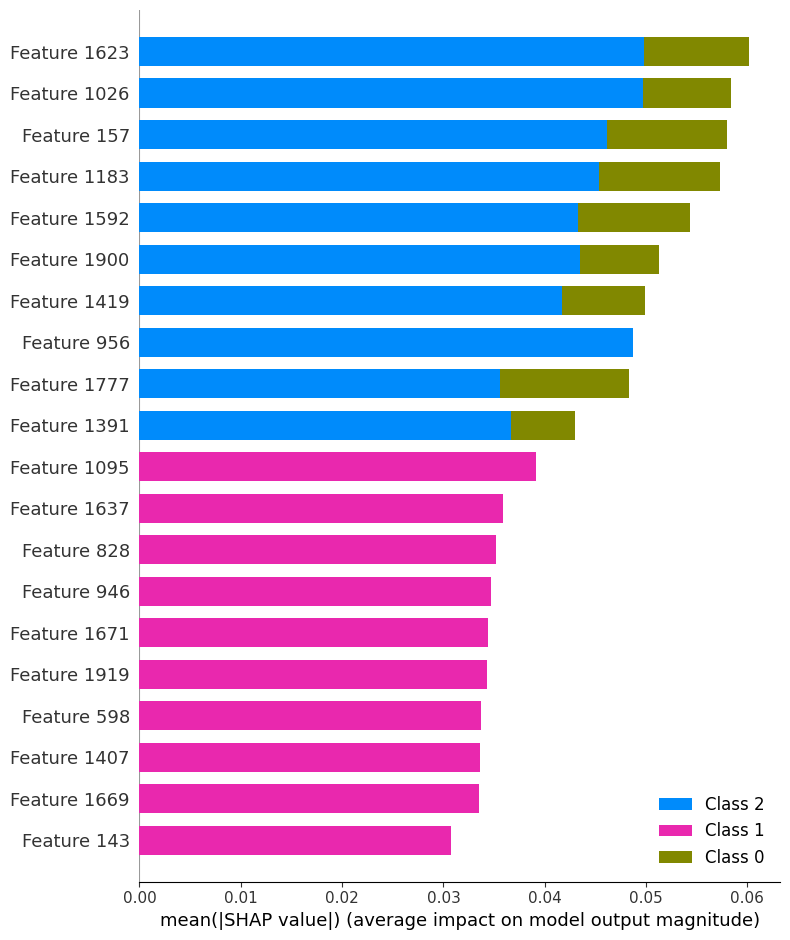

In [ ]:
# -------------------------
# SHAP FOR SVM (2048-D FEATURES)
# -------------------------
import shap
import numpy as np
import matplotlib.pyplot as plt

print("\n=== SHAP Explanation for SVM (2048-dimensional features) ===")

# 1) Background sample
background_size = 40
background_idx = np.random.choice(X_train_all_scaled.shape[0], background_size, replace=False)
background = X_train_all_scaled[background_idx]

# 2) Explainer
explainer = shap.KernelExplainer(svm_final.predict_proba, background)

# 3) Single test sample
test_idx = 0
x_test_sample = X_test_scaled[test_idx:test_idx+1]

print("Computing SHAP values (may take a bit)...")
shap_values = explainer.shap_values(x_test_sample)

# 4) SHAP bar plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, x_test_sample, plot_type="bar")
plt.show()



This block visualises SHAP values for the SVM prediction as a heatmap.
It selects the SHAP values corresponding to the predicted class and reshapes the 2048 features into a 2D grid for visual inspection.
The heatmap shows which deep features contributed positively or negatively to the decision.
This helps interpret the SVM model at a feature-level, even though features come from ResNet-50.

Predicted class: 2


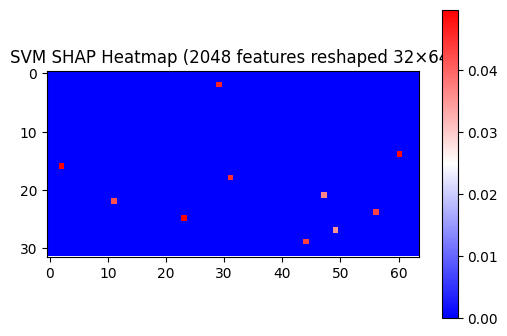

In [ ]:
# -------------------------
# SHAP Heatmap for 2048-D SVM Features
# -------------------------

# 1) Determine predicted class
pred_class = svm_final.predict(x_test_sample)[0]
print("Predicted class:", pred_class)

# 2) Extract the correct SHAP vector
# shap_values shape = (1, 2048, 3)
shap_vector = shap_values[0, :, pred_class]   # shape = (2048,)

# 3) Reshape into 32×64 grid
shap_grid = shap_vector.reshape(32, 64)

# 4) Plot heatmap
plt.figure(figsize=(6,4))
plt.imshow(shap_grid, cmap='bwr')
plt.colorbar()
plt.title("SVM SHAP Heatmap (2048 features reshaped 32×64)")
plt.show()


..

******************************************************************VIT** *************************************************************

..

This block sets up the Vision Transformer (ViT) pipeline by installing required libraries and importing all dependencies.
It includes PyTorch and torchvision for dataset loading and training, and HuggingFace Transformers for loading a pretrained ViT model and image processor.
It also imports evaluation metrics for accuracy, precision/recall/F1, ROC-AUC, and confusion matrix.
Overall, this is the “environment + tools setup” needed before training ViT and generating attention maps.

In [ ]:
# ---------------------------
# Vision Transformer (ViT) training script with attention maps

# ---------------------------
# 0) Install needed packages (run once)
# ---------------------------
!pip install -q transformers==4.40.0 tqdm

# ---------------------------
# 1) Imports
# ---------------------------
import os, random, time
from collections import defaultdict, Counter
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
from torchvision.datasets import ImageFolder
from PIL import Image

from transformers import ViTForImageClassification, ViTConfig, AutoImageProcessor
from tqdm import tqdm

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    roc_curve, auc, roc_auc_score, classification_report, confusion_matrix
)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 113.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 89.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.2 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.40.0 which is incompatible.


This block defines all the main settings for training the Vision Transformer and makes the experiment reproducible using fixed random seeds.
It automatically selects GPU if available, sets the dataset path, and fixes image size and batch size to match the chosen ViT model.
It also defines training choices like epochs, learning rate, and how often to plot ROC curves.
Finally, it sets the pretrained ViT model name that will be fine-tuned on your lung image dataset.

In [ ]:
# ---------------------------
# 2) Settings
# ---------------------------
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed_all(RANDOM_SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

DATASET_PATH = "/content/drive/MyDrive/Lung_Images"
IMG_SIZE = 224
BATCH_SIZE = 8
NUM_CLASSES = 3
DOWNSAMPLE_TO = 120
TEST_SIZE = 0.30
K_FOLDS = 4
NUM_EPOCHS = 100
LR = 2e-5             # ViT fine-tuning typical LR is small
PLOT_EVERY = 5        # plot ROC every PLOT_EVERY epochs

MODEL_NAME = "google/vit-base-patch16-224-in21k"  # pretrained ViT;

Device: cuda


This block defines the image preprocessing steps used for training and evaluating the Vision Transformer.
It uses the same normalisation values expected by the pretrained ViT model to ensure compatibility.
Basic augmentation (horizontal flip) is applied only to training images to improve generalisation.
Evaluation images are kept unchanged to ensure fair and consistent performance measurement.

In [ ]:
# ---------------------------
# 3) Transforms (no rotation) - keep as PIL -> tensor transforms for DataLoader
# ---------------------------
# Use same normalization as ViT (transformers' processor uses ImageNet stats)
processor = AutoImageProcessor.from_pretrained(MODEL_NAME)
mean = processor.image_mean
std  = processor.image_std

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),  # horizontal
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:942: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


This block loads the lung image dataset using ImageFolder and checks the original class distribution.
It then balances the dataset by undersampling, so each class has approximately the same number of images.
Balancing is important to prevent the Vision Transformer from being biased toward majority classes.
The final balanced indices and labels are stored for later splitting and training.

In [ ]:
# ---------------------------
# 4) Load dataset (ImageFolder) and balance by undersampling
# ---------------------------
full_dataset = ImageFolder(root=DATASET_PATH, transform=eval_transform)
class_names = full_dataset.classes
print("Classes:", class_names)
print("Total images (before balancing):", len(full_dataset))

indices_per_class = defaultdict(list)
for idx, (_, label) in enumerate(full_dataset):
    indices_per_class[label].append(idx)

for label, idxs in indices_per_class.items():
    print(f"{class_names[label]}: {len(idxs)} images")

# Undersample to DOWNSAMPLE_TO
balanced_indices = []
for label, idxs in indices_per_class.items():
    if len(idxs) >= DOWNSAMPLE_TO:
        chosen = random.sample(idxs, DOWNSAMPLE_TO)
    else:
        chosen = idxs.copy()
    balanced_indices.extend(chosen)
random.shuffle(balanced_indices)

print("Balanced dataset size:", len(balanced_indices))  #  NUM_CLASSES * DOWNSAMPLE_TO
balanced_labels = [full_dataset[i][1] for i in balanced_indices]

Classes: ['Bengin cases', 'Malignant cases', 'Normal cases']
Total images (before balancing): 1097
Bengin cases: 120 images
Malignant cases: 561 images
Normal cases: 416 images
Balanced dataset size: 360


This block splits the balanced dataset into a 70% training set and a 30% held-out test set using stratified sampling.
Stratification keeps the class proportions the same in both train and test, which makes evaluation fair.
A custom dataset wrapper is then created so we can apply train augmentation only on the training subset and keep test preprocessing fixed.
Finally, it prints sizes and class counts to confirm the split is correct.

In [ ]:
# ---------------------------
# 5) 70/30 hold-out split on balanced data (test held out)
# ---------------------------
train_idx_balanced, test_idx_balanced, y_train_balanced, y_test_balanced = train_test_split(
    balanced_indices, balanced_labels, test_size=TEST_SIZE, stratify=balanced_labels, random_state=RANDOM_SEED
)
print("Train size:", len(train_idx_balanced), "Test size:", len(test_idx_balanced))
print("Train class counts:", Counter([full_dataset[i][1] for i in train_idx_balanced]))
print("Test class counts:", Counter([full_dataset[i][1] for i in test_idx_balanced]))

# Dataset wrapper to apply desired transform (train has augmentation)
class ImageFolderSubsetWithTransform(Dataset):
    def __init__(self, image_folder: ImageFolder, indices, transform):
        self.image_folder = image_folder
        self.indices = list(indices)
        self.transform = transform
    def __len__(self):
        return len(self.indices)
    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        path, label = self.image_folder.samples[real_idx]
        img = self.image_folder.loader(path)
        if self.transform:
            img = self.transform(img)
        return img, label

train_dataset = ImageFolderSubsetWithTransform(full_dataset, train_idx_balanced, train_transform)
test_dataset  = ImageFolderSubsetWithTransform(full_dataset, test_idx_balanced, eval_transform)

print("Train dataset len:", len(train_dataset), "Test dataset len:", len(test_dataset))

Train size: 252 Test size: 108
Train class counts: Counter({0: 84, 1: 84, 2: 84})
Test class counts: Counter({2: 36, 1: 36, 0: 36})
Train dataset len: 252 Test dataset len: 108


This block prepares the training dataset for stratified K-fold cross-validation.
It creates index and label lists from the training subset so folds can be generated correctly.
StratifiedKFold is used to ensure each fold maintains the same class distribution.
This helps produce more reliable and fair validation results for the ViT model.

In [ ]:
# ---------------------------
# 6) Prepare for Stratified K-Fold on the training set
# ---------------------------
train_indices_for_kfold = list(range(len(train_dataset)))
train_labels_for_kfold = [train_dataset[i][1] for i in train_indices_for_kfold]
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=RANDOM_SEED)

This block loads a pretrained Vision Transformer and prepares it for fine-tuning on your 3 lung classes.
You update the ViT configuration to match your dataset and set dropout to zero to follow the “no dropout” requirement.
Then you define helper functions to train for one epoch, evaluate predictions, plot ROC curves, and extract attention maps (ViT explainability).
The attention function converts the model’s CLS-token attention into a patch-level heatmap and resizes it to the image size.

In [ ]:
# ---------------------------
# 7) Build ViT model (from transformers) for fine-tuning
#    setting dropout probs to 0.0 to respect "no dropout" rule
# ---------------------------
config = ViTConfig.from_pretrained(MODEL_NAME)
config.num_labels = NUM_CLASSES
# disable dropout
config.hidden_dropout_prob = 0.0
config.attention_probs_dropout_prob = 0.0

# load model
model = ViTForImageClassification.from_pretrained(MODEL_NAME, config=config)
model.to(DEVICE)
model.train()  # we'll fine-tune it

# Ensure classifier head output matches NUM_CLASSES (transformers handles it with config)
print("ViT model loaded. Classifier head:", model.classifier)

# ---------------------------
# Helper functions: train one epoch, evaluate, ROC plotting, attention extraction
# ---------------------------
def train_one_epoch_vit(model, loader, optimizer, device):
    model.train()
    total_loss = 0.0
    for imgs, labels in loader:
        imgs = imgs.to(device)
        labels = labels.to(device)
        outputs = model(pixel_values=imgs, labels=labels)
        loss = outputs.loss
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)

def evaluate_vit(model, loader, device):
    model.eval()
    all_probs = []
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            outputs = model(pixel_values=imgs)
            logits = outputs.logits
            probs = torch.softmax(logits, dim=1).cpu().numpy()
            preds = np.argmax(probs, axis=1)
            all_probs.append(probs); all_preds.append(preds); all_labels.append(labels.numpy())
    if len(all_probs) == 0:
        return np.array([]), np.array([]), np.array([])
    all_probs = np.vstack(all_probs); all_preds = np.hstack(all_preds); all_labels = np.hstack(all_labels)
    return all_probs, all_preds, all_labels

def plot_multiclass_roc(y_true, y_probs, classes, title):
    y_true_bin = label_binarize(y_true, classes=list(range(len(classes))))
    plt.figure(figsize=(6,6))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{cls} (AUC={roc_auc:.2f})")
    plt.plot([0,1],[0,1],'--', color='gray')
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
    plt.title(title); plt.legend(loc='lower right'); plt.tight_layout()
    plt.show(); plt.close()

# Attention-map helper (CLS attention -> patch-level heatmap)
def get_attention_map_for_images(model, images_tensor, device, layer=-1, head_mean=True):
    """
    images_tensor: torch.Tensor(shape=[B, C, H, W]) normalized as model expects
    model: ViTForImageClassification
    layer: which transformer layer index to use for attention (-1 => last)
    head_mean: if True average attention heads
    Returns: heatmaps upsampled to (H, W) as numpy arrays (B, H, W)
    """
    model.eval()
    with torch.no_grad():
        # forward with output_attentions=True
        outputs = model.vit(pixel_values=images_tensor.to(device), output_attentions=True)
        # attentions: list length = num_layers, each has shape (B, num_heads, seq_len, seq_len)
        attentions = outputs.attentions  # list of tensors
        attn = attentions[layer]  # pick layer; shape (B, heads, seq_len, seq_len)
        B, Hh, S, _ = attn.shape
        # cls token is at index 0, patches from 1..S-1
        # take avg over heads if requested
        if head_mean:
            attn_map = attn.mean(dim=1)  # shape (B, seq_len, seq_len)
        else:
            # if not averaging, still sum over heads
            attn_map = attn.sum(dim=1)
        # Now get cls -> patches attention: attn_map[:, 0, 1:]
        cls_attn = attn_map[:, 0, 1:]  # shape (B, num_patches)
        # determine patch grid size
        num_patches = cls_attn.shape[-1]
        patch_size = int(np.sqrt(num_patches))
        # reshape to (B, patch_size, patch_size)
        cls_attn_map = cls_attn.reshape(B, patch_size, patch_size).cpu().numpy()
        # upsample to image size
        heatmaps = []
        for b in range(B):
            arr = cls_attn_map[b]
            # normalize
            arr = (arr - arr.min()) / (arr.max() - arr.min() + 1e-9)
            # upsample with numpy (simple) to IMG_SIZE x IMG_SIZE
            heat = np.array(Image.fromarray((arr * 255).astype('uint8')).resize((IMG_SIZE, IMG_SIZE), resample=Image.BILINEAR)) / 255.0
            heatmaps.append(heat)
        heatmaps = np.stack(heatmaps, axis=0)  # (B, IMG_SIZE, IMG_SIZE)
    return heatmaps

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViT model loaded. Classifier head: Linear(in_features=768, out_features=3, bias=True)


This block performs 4-fold stratified cross-validation to fine-tune the Vision Transformer and validate it fairly.
For each fold, it creates a train/validation split, trains a fresh ViT model from the same pretrained checkpoint, and evaluates on the fold’s validation set.
During training it prints loss, validation accuracy and macro AUC at checkpoints, and also plots ROC curves.
Finally, it stores fold-wise metrics and prints a summary and mean performance across all folds.


=== Fold 1/4 ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Fold 1 Epoch 1/100 - TrainLoss: 1.0083  ValAcc: 0.8254  ValAUC_macro: 0.9565  time(s):7.1


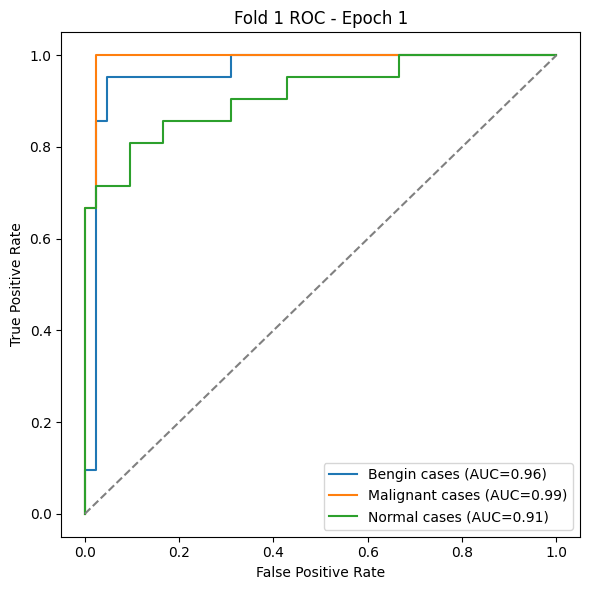

Fold 1 Epoch 5/100 - TrainLoss: 0.3385  ValAcc: 0.9524  ValAUC_macro: 0.9898  time(s):7.0


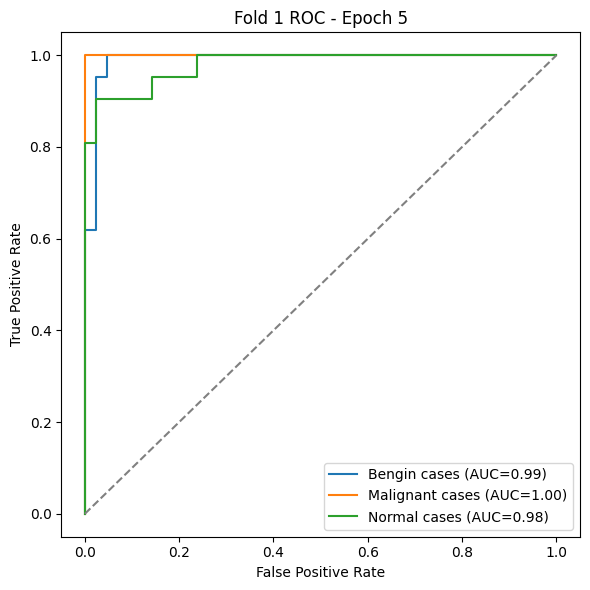

Fold 1 Epoch 10/100 - TrainLoss: 0.1101  ValAcc: 0.9683  ValAUC_macro: 0.9864  time(s):6.8


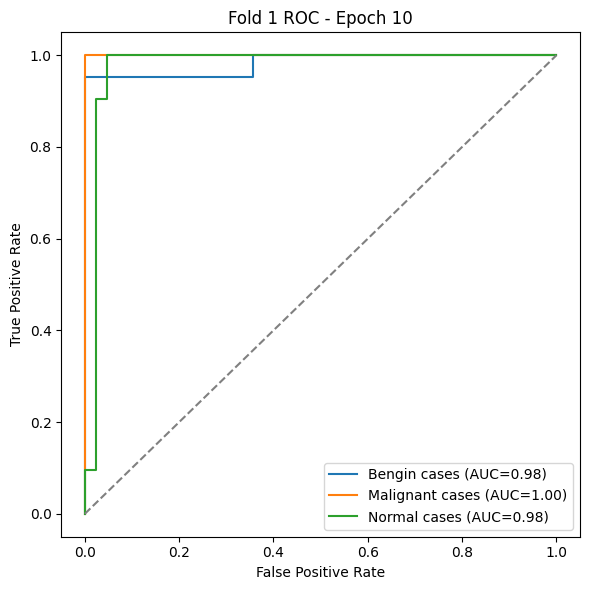

Fold 1 Epoch 15/100 - TrainLoss: 0.0543  ValAcc: 0.8730  ValAUC_macro: 0.9909  time(s):6.9


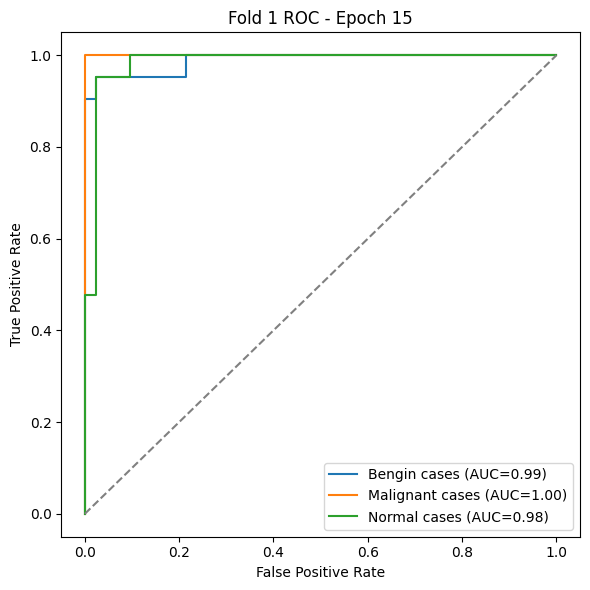

Fold 1 Epoch 20/100 - TrainLoss: 0.0299  ValAcc: 0.9841  ValAUC_macro: 0.9898  time(s):6.8


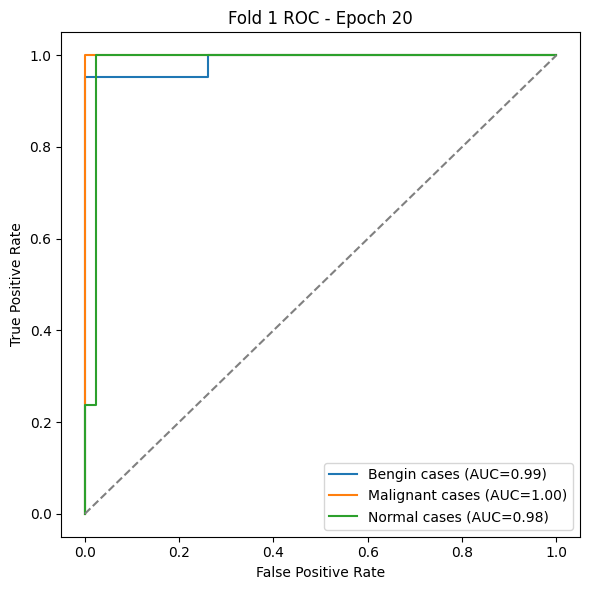

Fold 1 Epoch 25/100 - TrainLoss: 0.0233  ValAcc: 0.9841  ValAUC_macro: 0.9913  time(s):6.9


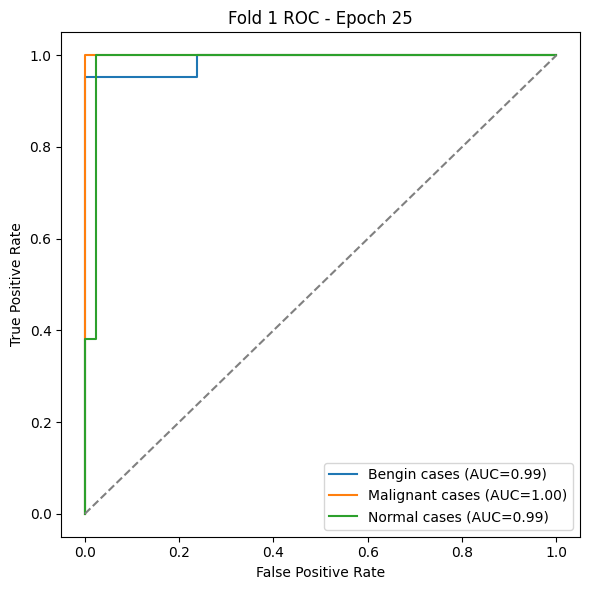

Fold 1 Epoch 30/100 - TrainLoss: 0.0193  ValAcc: 0.9841  ValAUC_macro: 0.9970  time(s):6.9


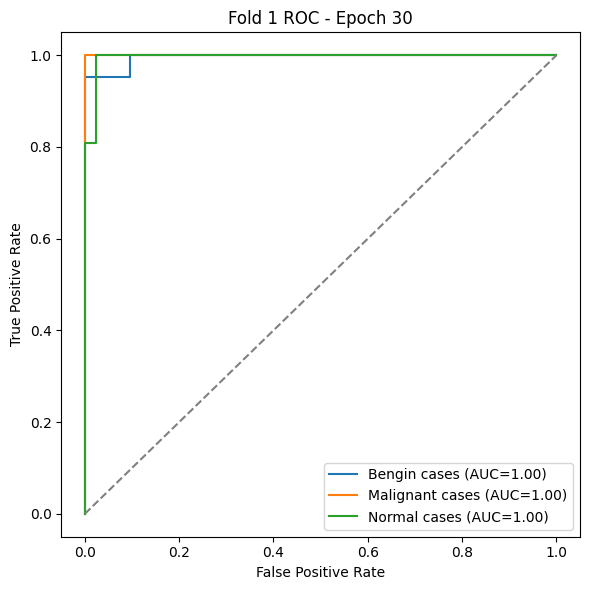

Fold 1 Epoch 35/100 - TrainLoss: 0.0163  ValAcc: 0.9683  ValAUC_macro: 0.9924  time(s):6.9


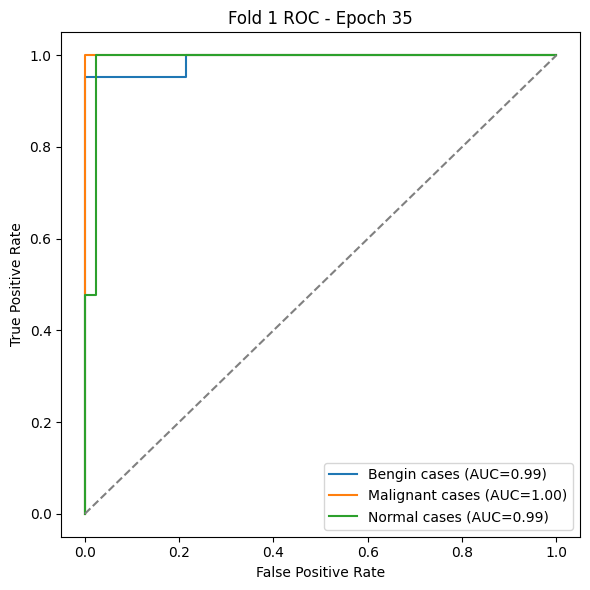

Fold 1 Epoch 40/100 - TrainLoss: 0.0141  ValAcc: 0.9841  ValAUC_macro: 0.9958  time(s):6.9


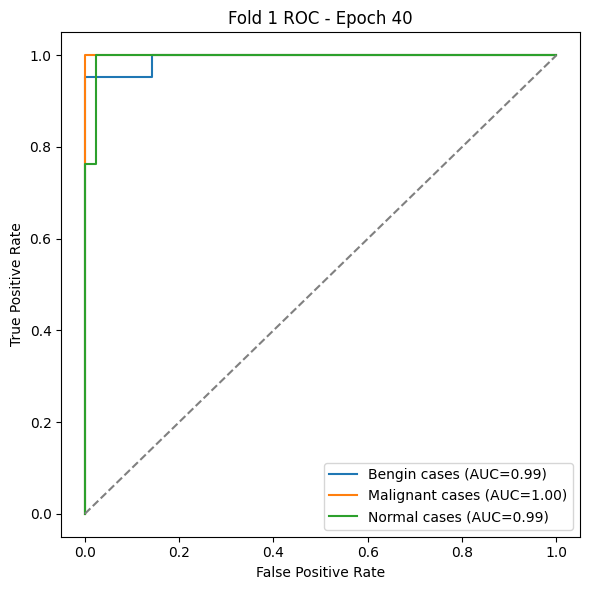

Fold 1 Epoch 45/100 - TrainLoss: 0.0124  ValAcc: 0.9841  ValAUC_macro: 0.9958  time(s):6.9


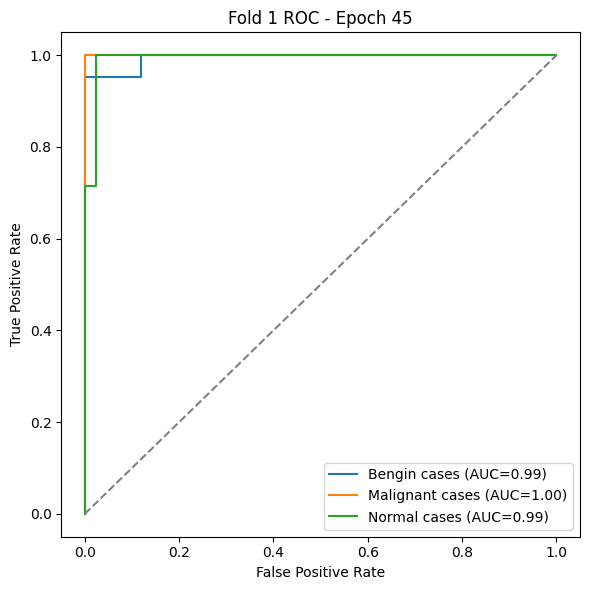

Fold 1 Epoch 50/100 - TrainLoss: 0.0109  ValAcc: 0.9683  ValAUC_macro: 0.9924  time(s):6.9


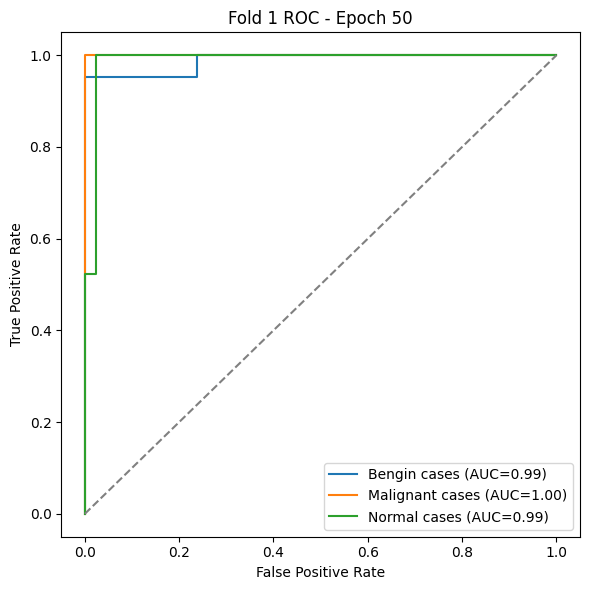

Fold 1 Epoch 55/100 - TrainLoss: 0.0097  ValAcc: 0.9683  ValAUC_macro: 0.9970  time(s):6.9


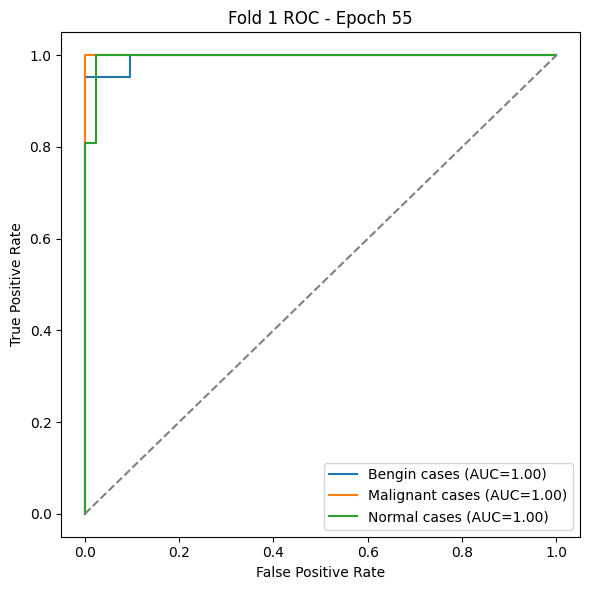

Fold 1 Epoch 60/100 - TrainLoss: 0.0086  ValAcc: 0.9841  ValAUC_macro: 0.9981  time(s):6.9


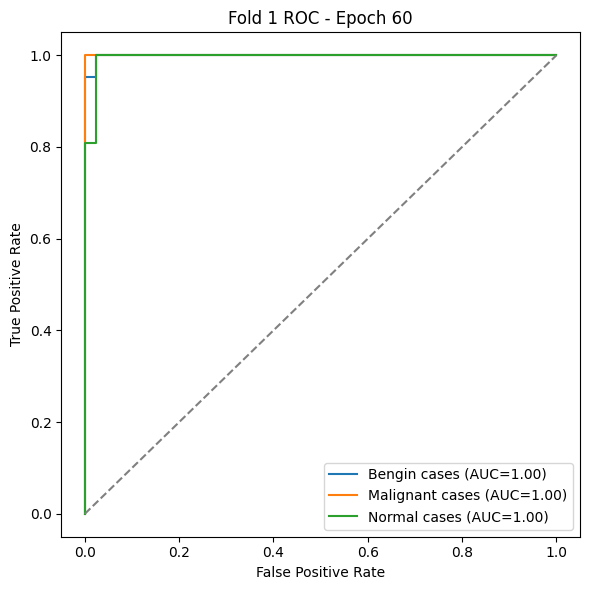

Fold 1 Epoch 65/100 - TrainLoss: 0.0078  ValAcc: 0.9683  ValAUC_macro: 0.9940  time(s):6.9


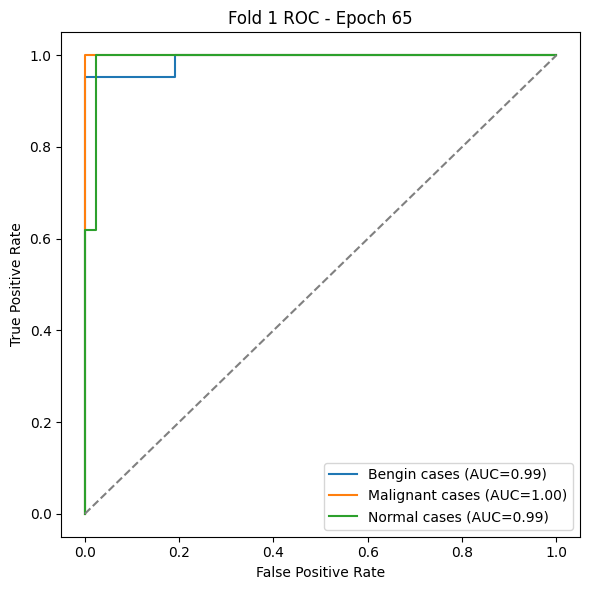

Fold 1 Epoch 70/100 - TrainLoss: 0.0070  ValAcc: 0.9683  ValAUC_macro: 0.9974  time(s):6.9


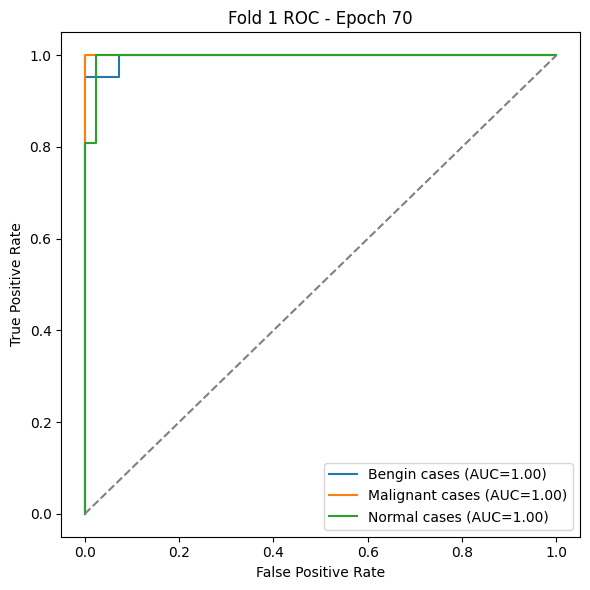

Fold 1 Epoch 75/100 - TrainLoss: 0.0063  ValAcc: 0.9841  ValAUC_macro: 0.9947  time(s):6.9


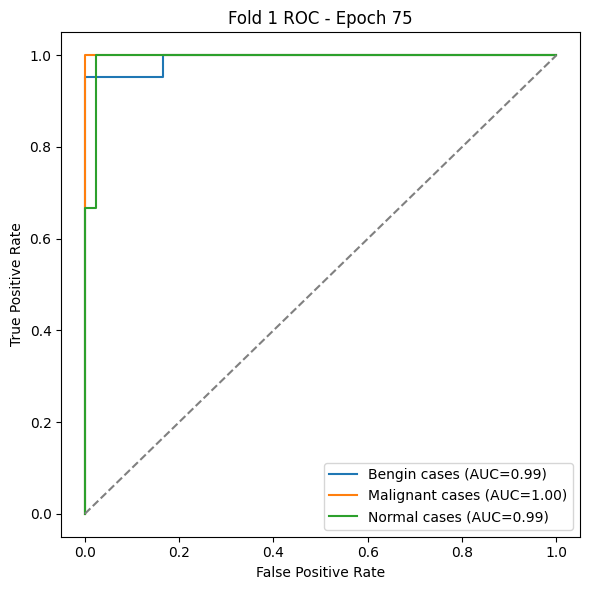

Fold 1 Epoch 80/100 - TrainLoss: 0.0057  ValAcc: 0.9841  ValAUC_macro: 0.9947  time(s):6.9


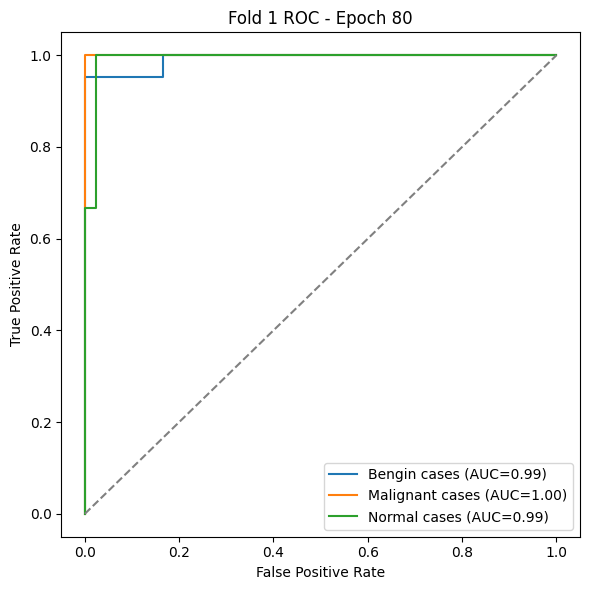

Fold 1 Epoch 85/100 - TrainLoss: 0.0052  ValAcc: 0.9841  ValAUC_macro: 0.9947  time(s):6.9


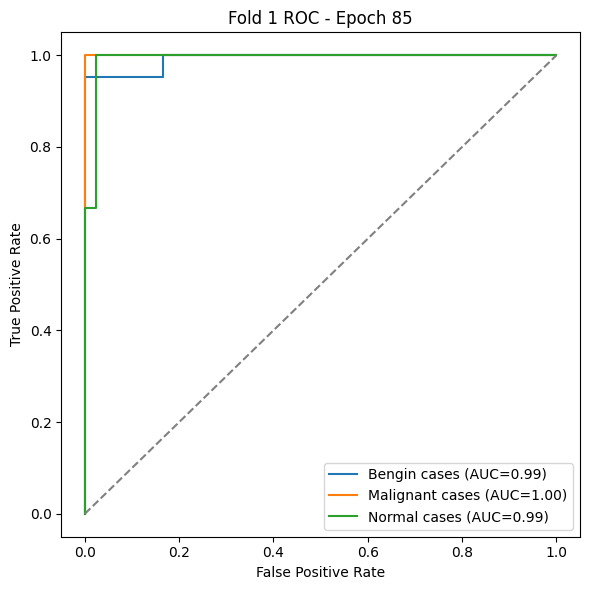

Fold 1 Epoch 90/100 - TrainLoss: 0.0047  ValAcc: 0.9841  ValAUC_macro: 0.9955  time(s):6.9


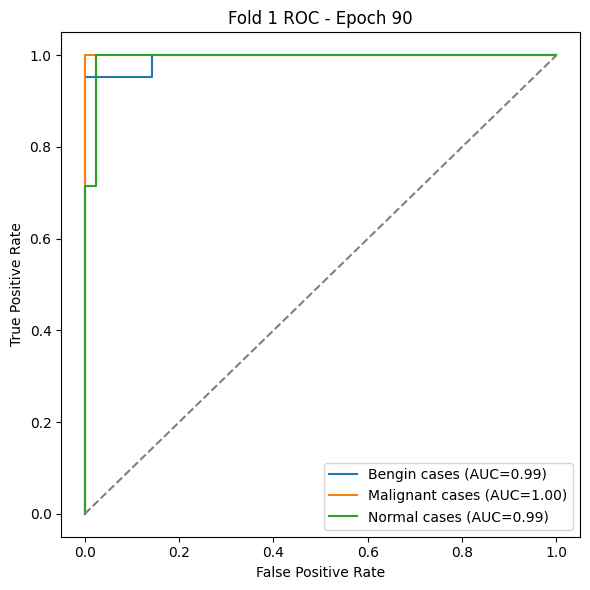

Fold 1 Epoch 95/100 - TrainLoss: 0.0043  ValAcc: 0.9841  ValAUC_macro: 0.9981  time(s):6.9


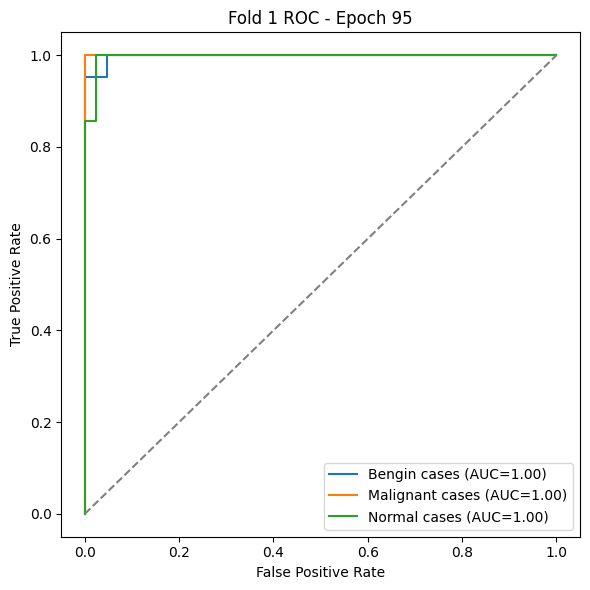

Fold 1 Epoch 100/100 - TrainLoss: 0.0039  ValAcc: 0.9841  ValAUC_macro: 0.9943  time(s):6.8


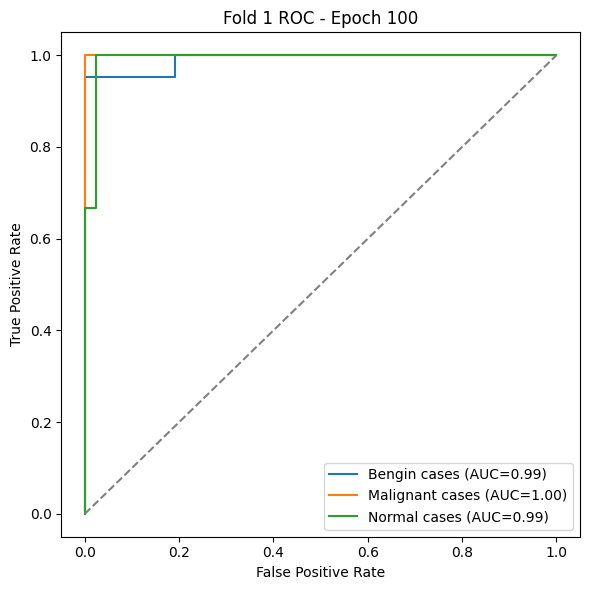

Fold 1 Summary -> Acc: 0.9841 Prec: 0.9848 Rec: 0.9841 F1: 0.9841 AUC_macro: 0.9951

=== Fold 2/4 ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Fold 2 Epoch 1/100 - TrainLoss: 0.9837  ValAcc: 0.7619  ValAUC_macro: 0.9082  time(s):7.0


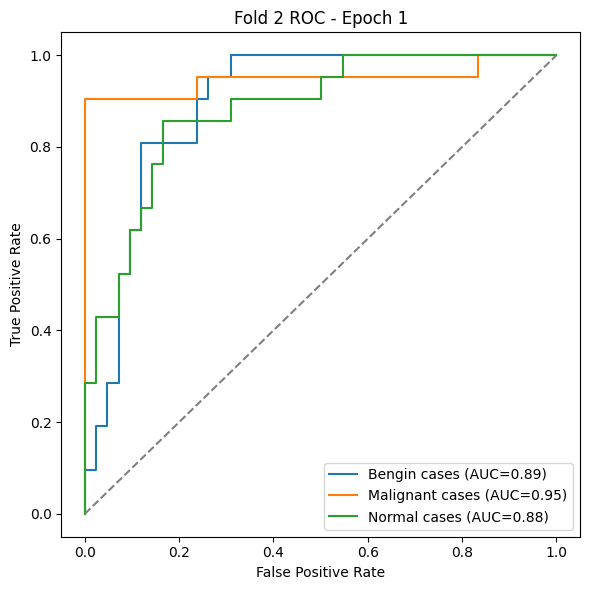

Fold 2 Epoch 5/100 - TrainLoss: 0.2581  ValAcc: 0.8254  ValAUC_macro: 0.9546  time(s):6.9


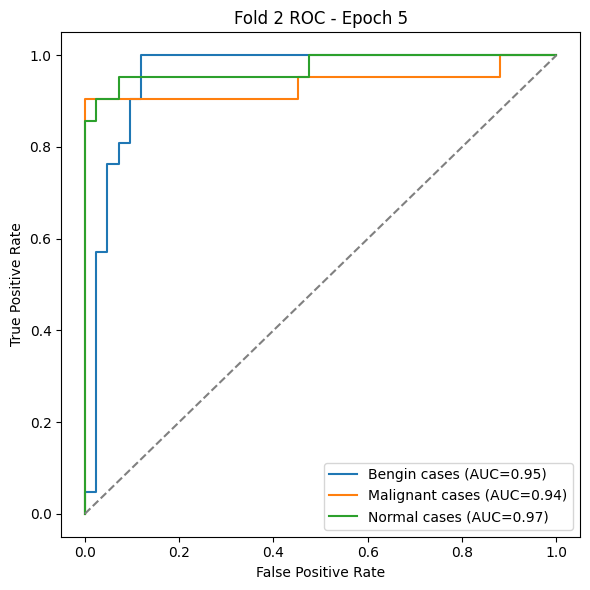

Fold 2 Epoch 10/100 - TrainLoss: 0.1259  ValAcc: 0.8413  ValAUC_macro: 0.9395  time(s):6.9


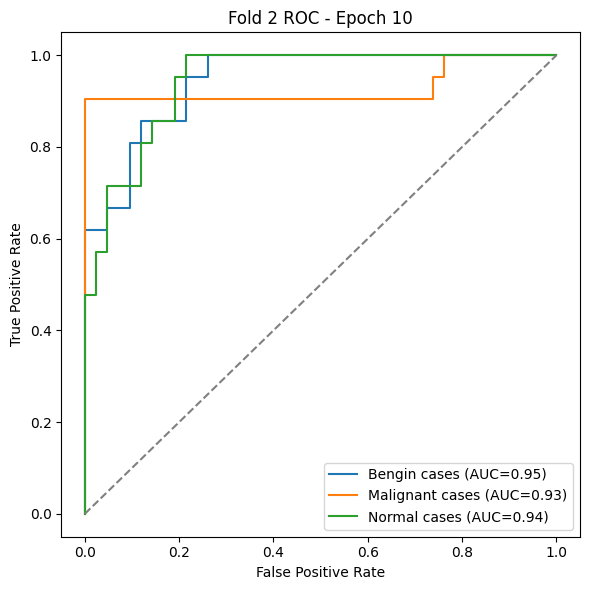

Fold 2 Epoch 15/100 - TrainLoss: 0.0478  ValAcc: 0.9206  ValAUC_macro: 0.9626  time(s):6.9


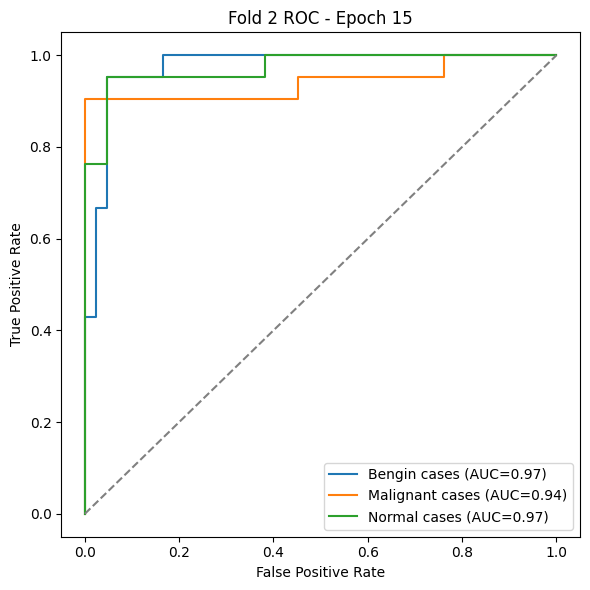

Fold 2 Epoch 20/100 - TrainLoss: 0.0339  ValAcc: 0.9048  ValAUC_macro: 0.9592  time(s):6.9


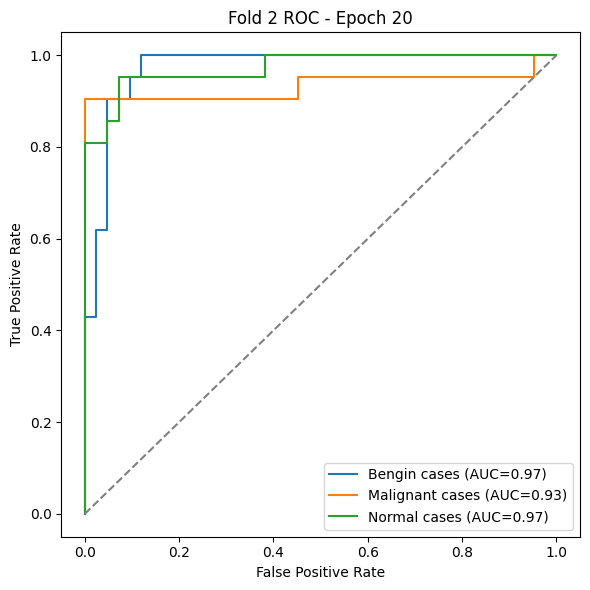

Fold 2 Epoch 25/100 - TrainLoss: 0.0265  ValAcc: 0.9206  ValAUC_macro: 0.9596  time(s):6.9


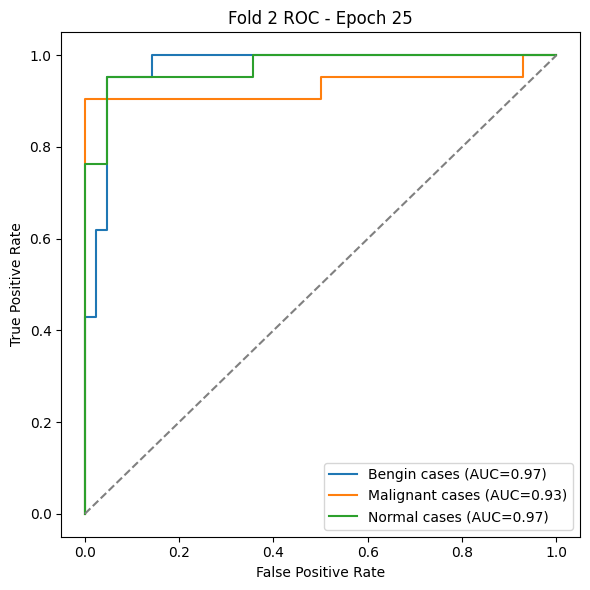

Fold 2 Epoch 30/100 - TrainLoss: 0.0217  ValAcc: 0.8889  ValAUC_macro: 0.9580  time(s):6.9


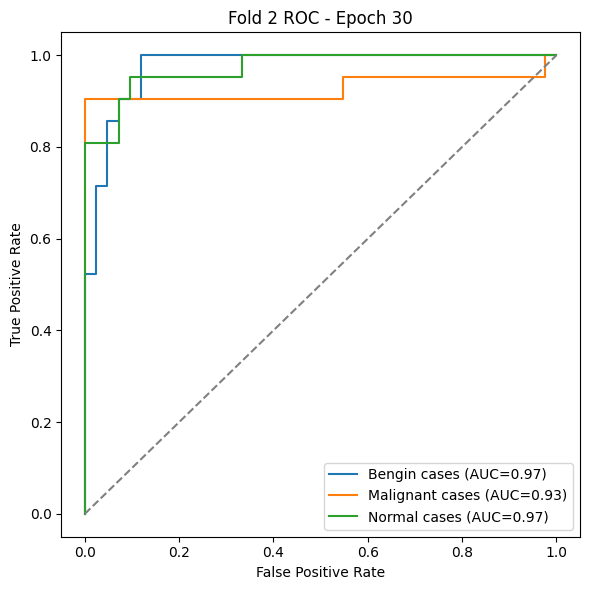

Fold 2 Epoch 35/100 - TrainLoss: 0.0184  ValAcc: 0.8889  ValAUC_macro: 0.9569  time(s):6.9


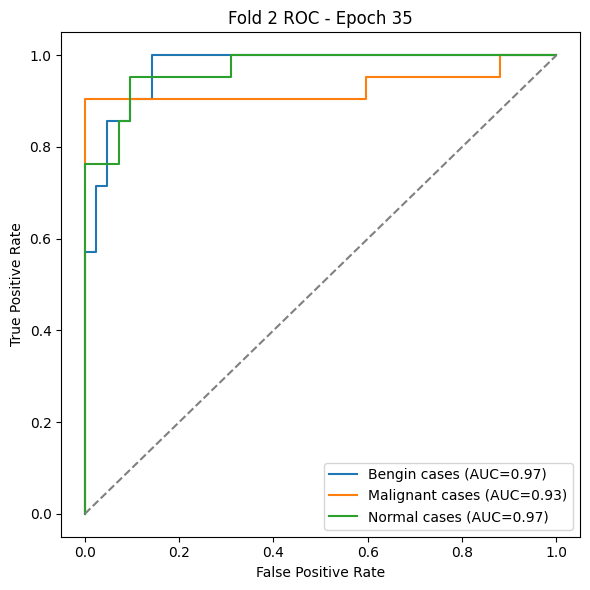

Fold 2 Epoch 40/100 - TrainLoss: 0.0158  ValAcc: 0.9048  ValAUC_macro: 0.9603  time(s):6.9


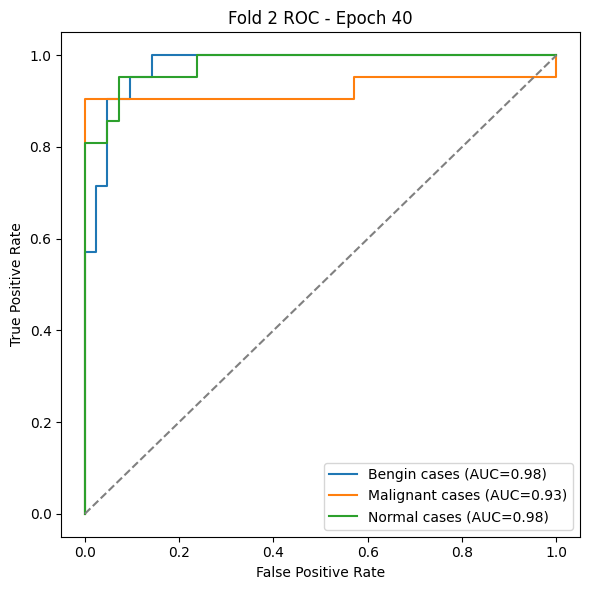

Fold 2 Epoch 45/100 - TrainLoss: 0.0138  ValAcc: 0.8889  ValAUC_macro: 0.9603  time(s):7.0


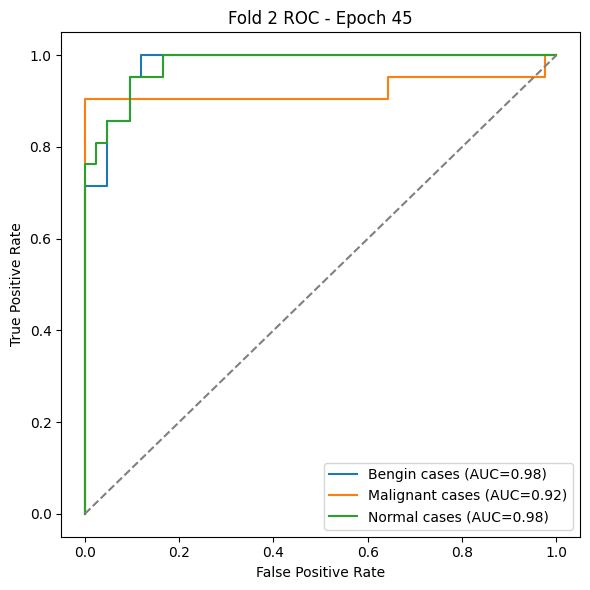

Fold 2 Epoch 50/100 - TrainLoss: 0.0121  ValAcc: 0.8889  ValAUC_macro: 0.9580  time(s):6.9


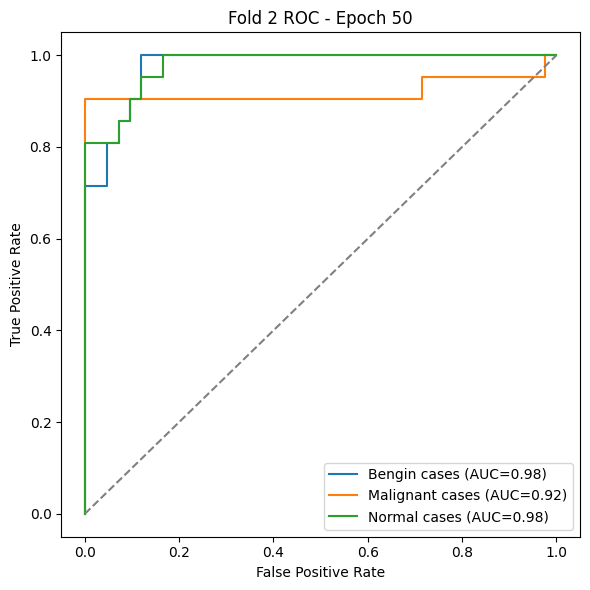

Fold 2 Epoch 55/100 - TrainLoss: 0.0107  ValAcc: 0.8889  ValAUC_macro: 0.9652  time(s):6.9


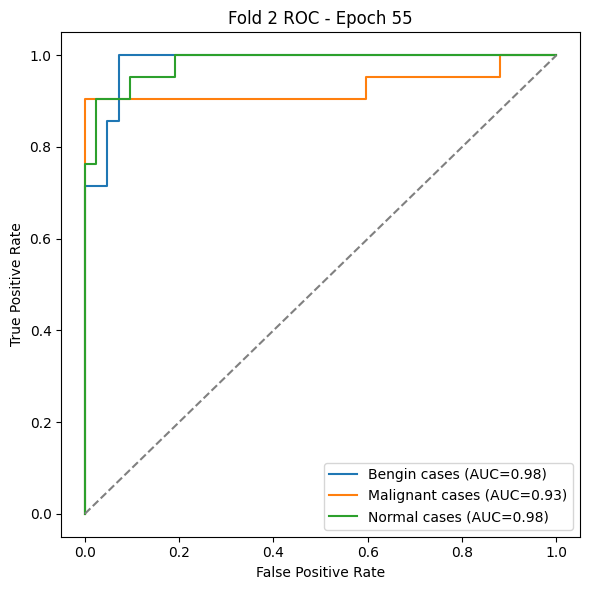

Fold 2 Epoch 60/100 - TrainLoss: 0.0095  ValAcc: 0.8730  ValAUC_macro: 0.9622  time(s):6.9


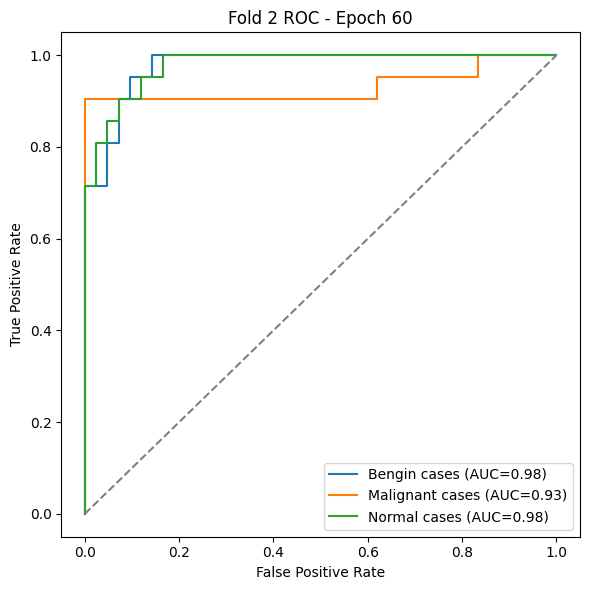

Fold 2 Epoch 65/100 - TrainLoss: 0.0085  ValAcc: 0.8730  ValAUC_macro: 0.9626  time(s):6.8


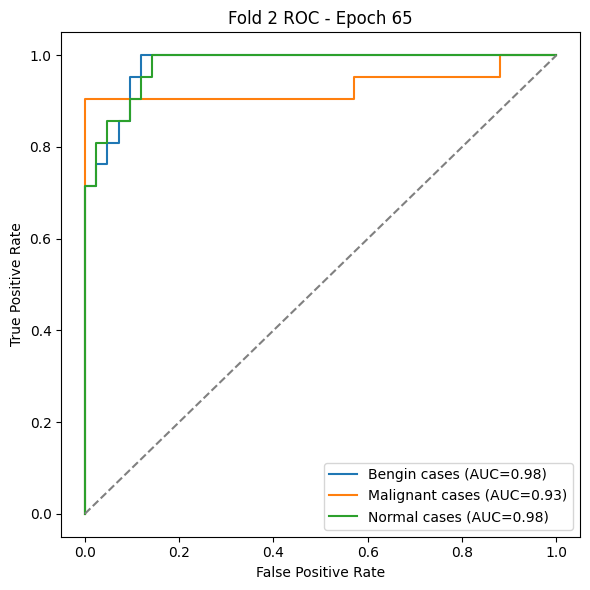

Fold 2 Epoch 70/100 - TrainLoss: 0.0076  ValAcc: 0.9048  ValAUC_macro: 0.9645  time(s):6.9


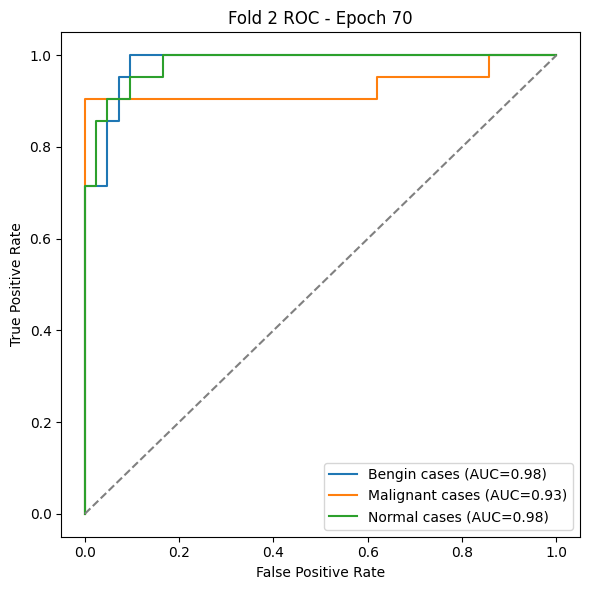

Fold 2 Epoch 75/100 - TrainLoss: 0.0069  ValAcc: 0.8889  ValAUC_macro: 0.9622  time(s):6.9


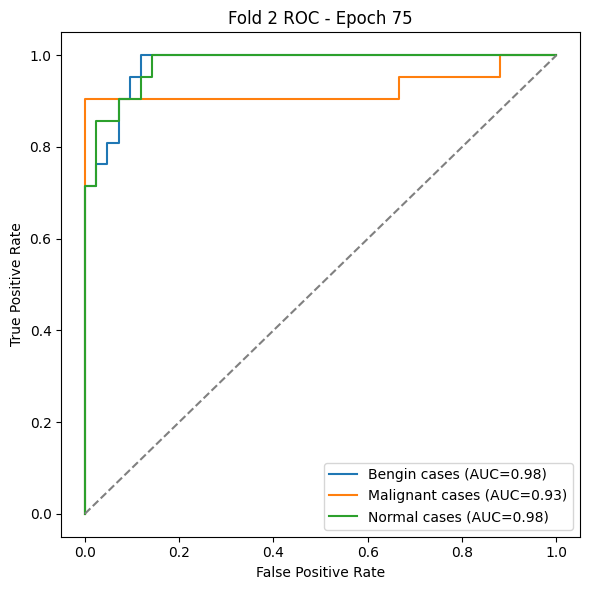

Fold 2 Epoch 80/100 - TrainLoss: 0.0062  ValAcc: 0.8730  ValAUC_macro: 0.9607  time(s):6.9


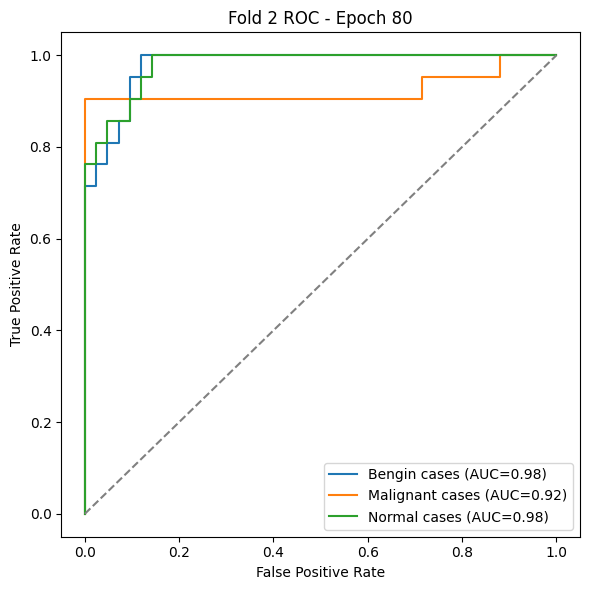

Fold 2 Epoch 85/100 - TrainLoss: 0.0056  ValAcc: 0.8730  ValAUC_macro: 0.9577  time(s):6.9


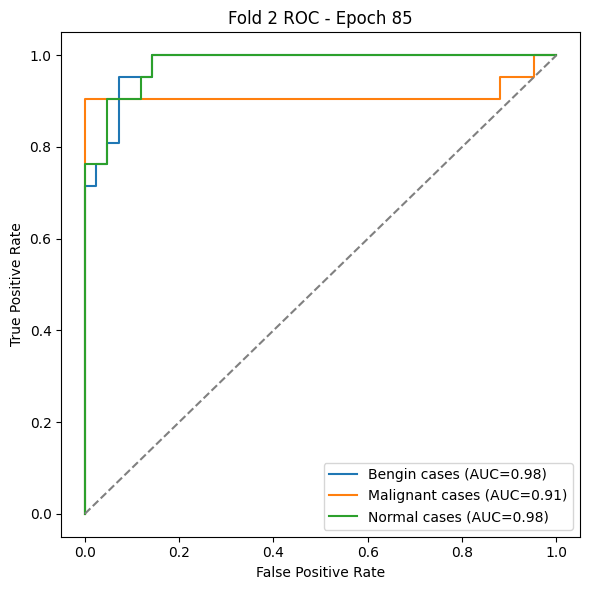

Fold 2 Epoch 90/100 - TrainLoss: 0.0051  ValAcc: 0.8889  ValAUC_macro: 0.9599  time(s):6.9


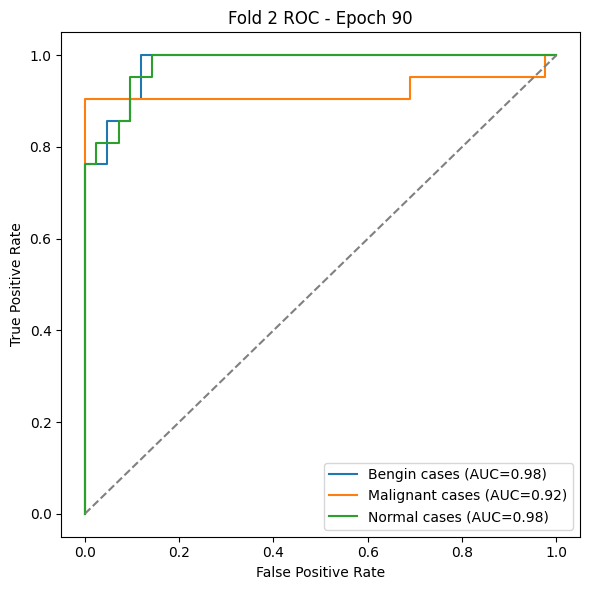

Fold 2 Epoch 95/100 - TrainLoss: 0.0046  ValAcc: 0.9048  ValAUC_macro: 0.9633  time(s):6.8


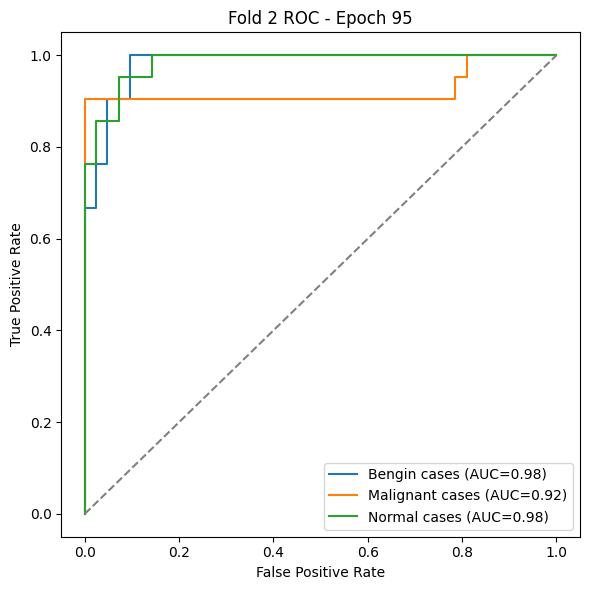

Fold 2 Epoch 100/100 - TrainLoss: 0.0042  ValAcc: 0.9048  ValAUC_macro: 0.9607  time(s):6.9


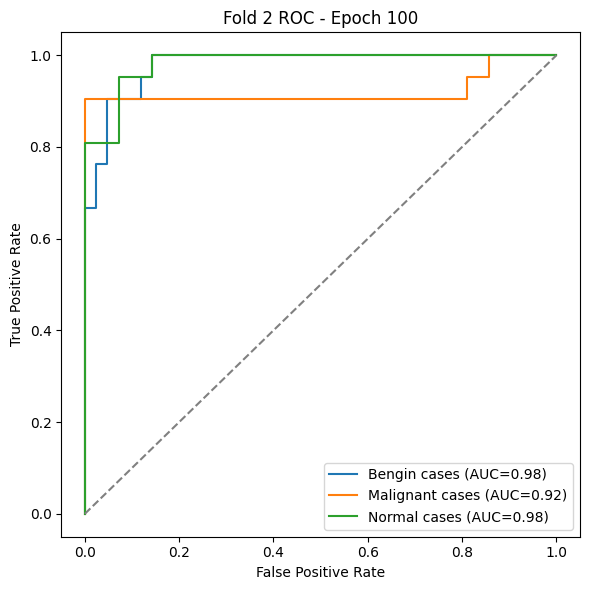

Fold 2 Summary -> Acc: 0.8889 Prec: 0.8982 Rec: 0.8889 F1: 0.8899 AUC_macro: 0.9584

=== Fold 3/4 ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Fold 3 Epoch 1/100 - TrainLoss: 0.9745  ValAcc: 0.7460  ValAUC_macro: 0.9029  time(s):7.0


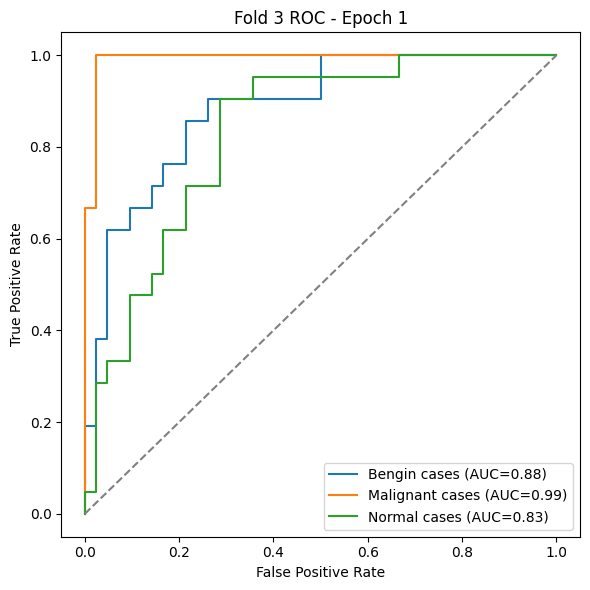

Fold 3 Epoch 5/100 - TrainLoss: 0.3546  ValAcc: 0.8730  ValAUC_macro: 0.9577  time(s):6.8


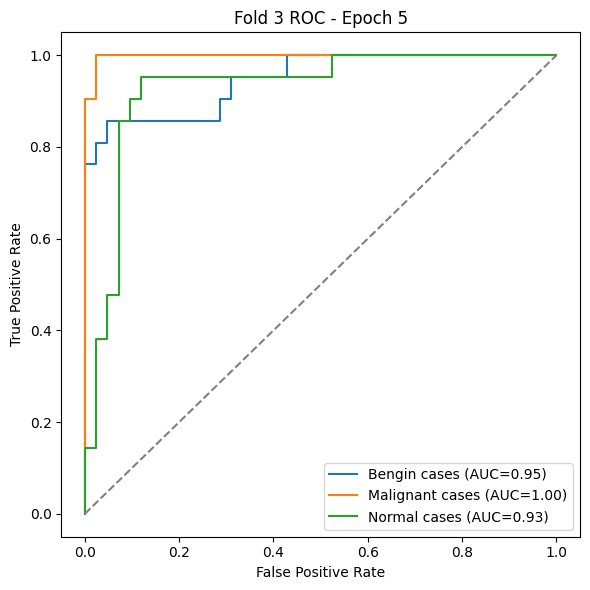

Fold 3 Epoch 10/100 - TrainLoss: 0.1084  ValAcc: 0.8730  ValAUC_macro: 0.9543  time(s):6.8


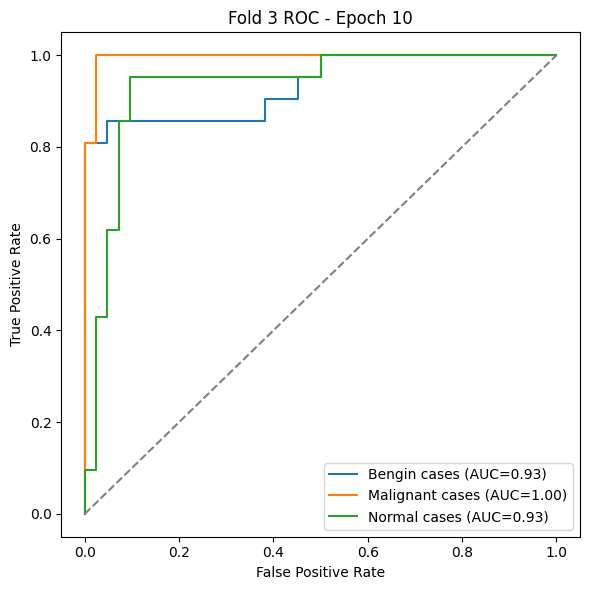

Fold 3 Epoch 15/100 - TrainLoss: 0.0500  ValAcc: 0.8889  ValAUC_macro: 0.9724  time(s):6.9


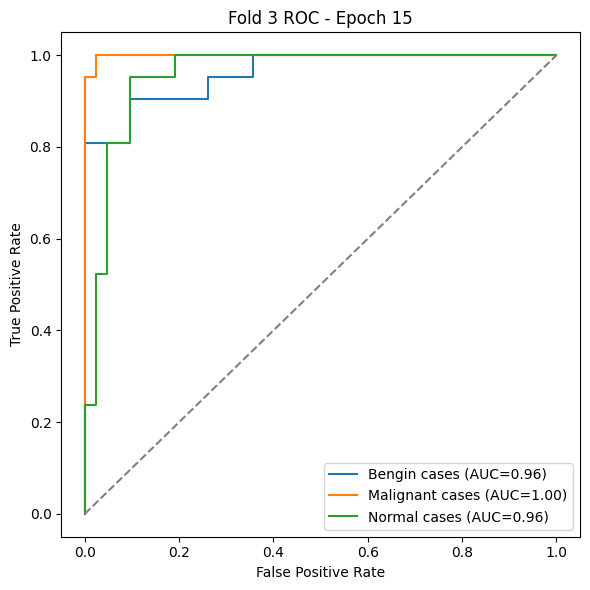

Fold 3 Epoch 20/100 - TrainLoss: 0.0351  ValAcc: 0.9048  ValAUC_macro: 0.9683  time(s):6.9


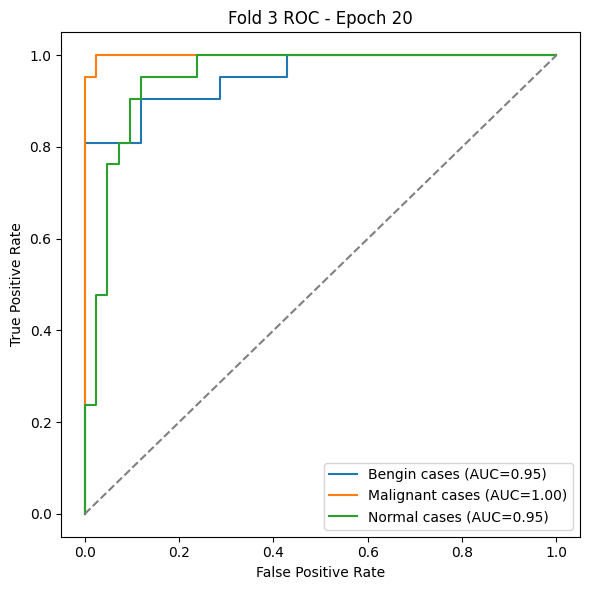

Fold 3 Epoch 25/100 - TrainLoss: 0.0273  ValAcc: 0.9048  ValAUC_macro: 0.9679  time(s):6.9


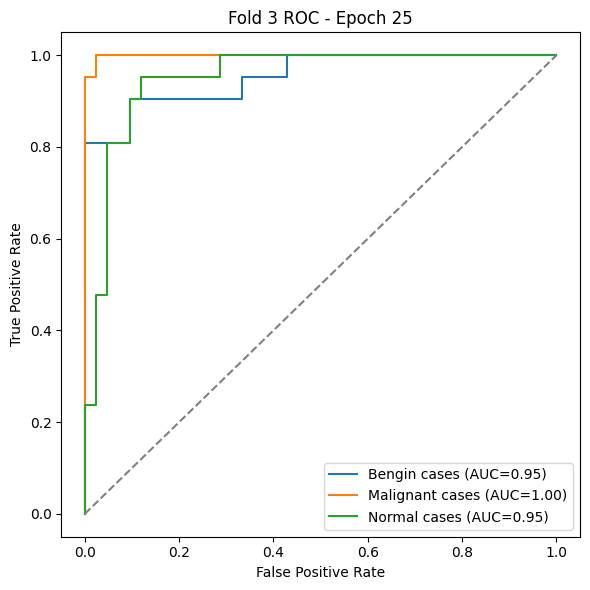

Fold 3 Epoch 30/100 - TrainLoss: 0.0224  ValAcc: 0.8889  ValAUC_macro: 0.9728  time(s):6.9


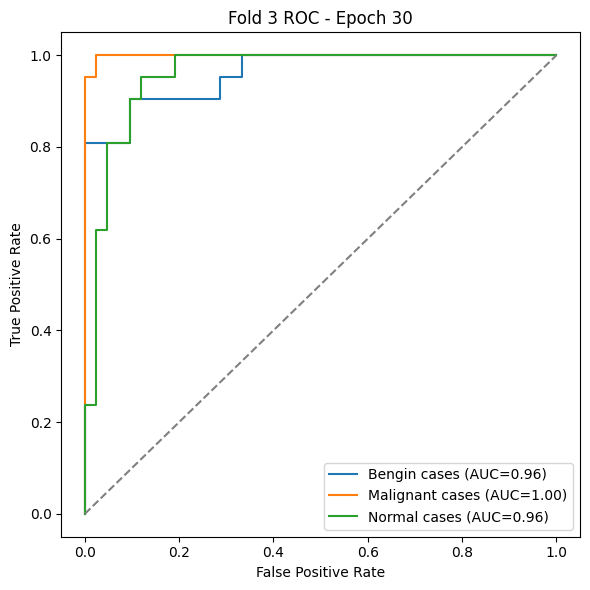

Fold 3 Epoch 35/100 - TrainLoss: 0.0189  ValAcc: 0.9048  ValAUC_macro: 0.9720  time(s):6.9


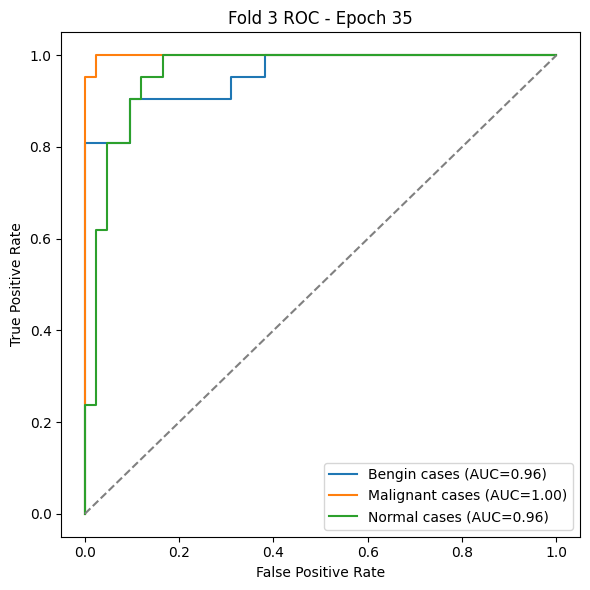

Fold 3 Epoch 40/100 - TrainLoss: 0.0163  ValAcc: 0.9048  ValAUC_macro: 0.9732  time(s):6.9


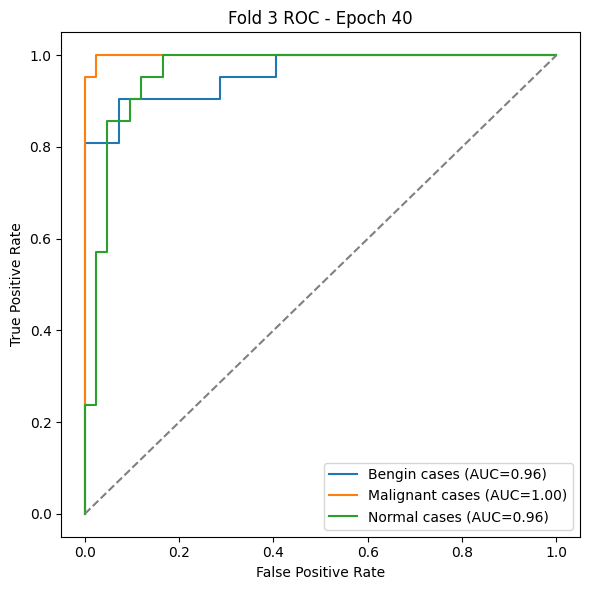

Fold 3 Epoch 45/100 - TrainLoss: 0.0142  ValAcc: 0.9048  ValAUC_macro: 0.9724  time(s):6.9


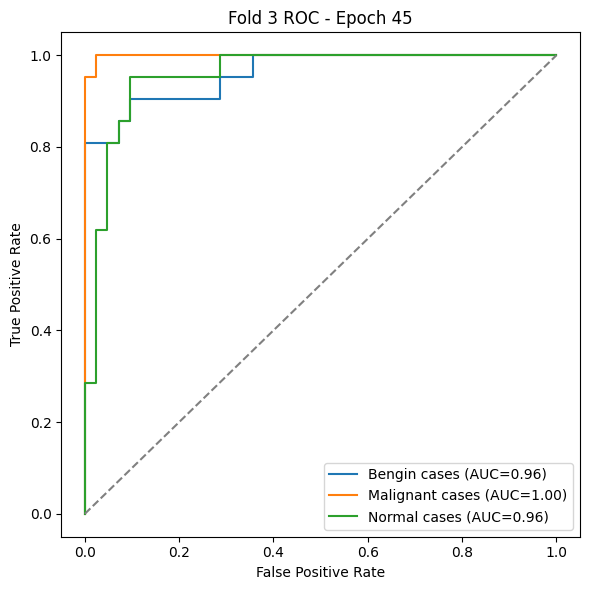

Fold 3 Epoch 50/100 - TrainLoss: 0.0125  ValAcc: 0.9048  ValAUC_macro: 0.9743  time(s):6.9


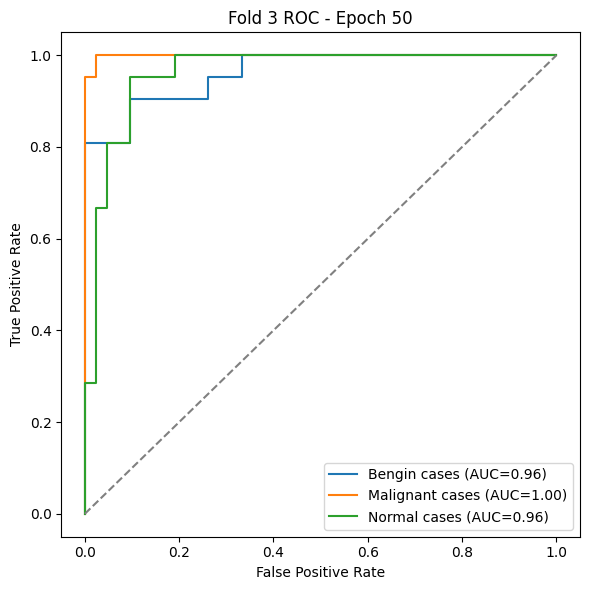

Fold 3 Epoch 55/100 - TrainLoss: 0.0110  ValAcc: 0.8889  ValAUC_macro: 0.9705  time(s):6.9


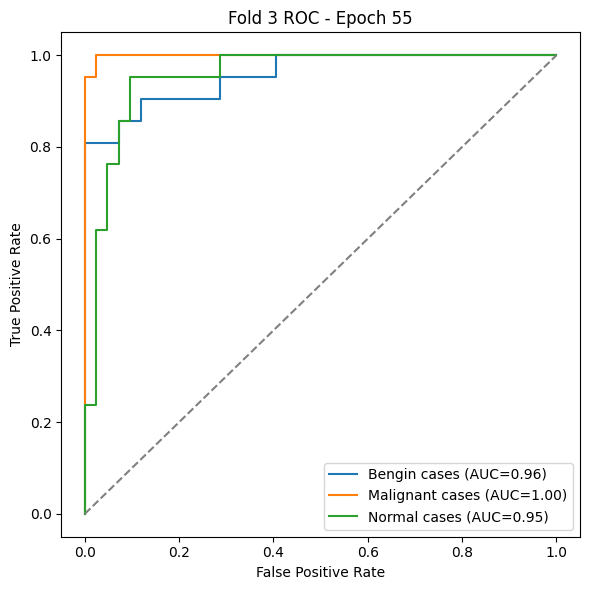

Fold 3 Epoch 60/100 - TrainLoss: 0.0098  ValAcc: 0.8889  ValAUC_macro: 0.9720  time(s):6.9


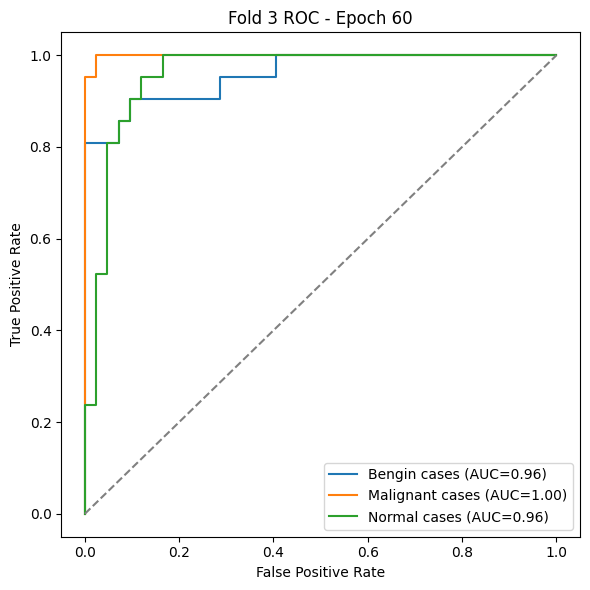

Fold 3 Epoch 65/100 - TrainLoss: 0.0088  ValAcc: 0.8889  ValAUC_macro: 0.9720  time(s):6.9


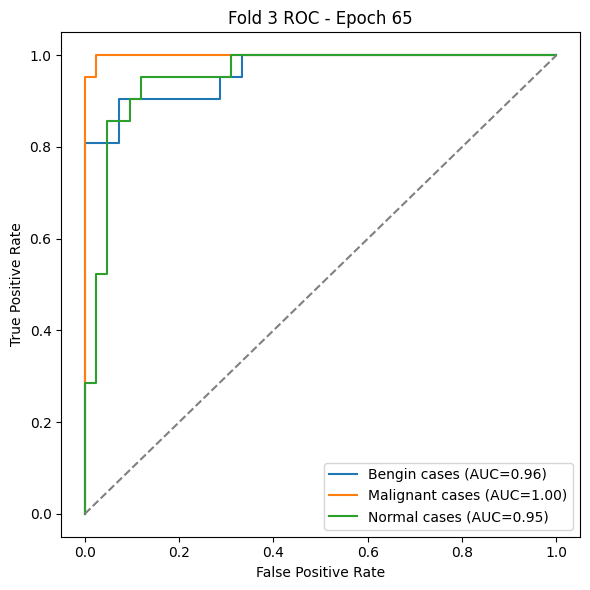

Fold 3 Epoch 70/100 - TrainLoss: 0.0078  ValAcc: 0.8889  ValAUC_macro: 0.9701  time(s):6.9


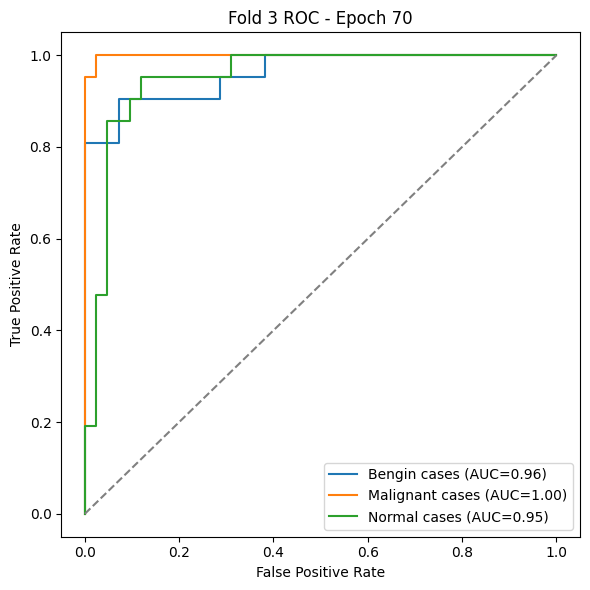

Fold 3 Epoch 75/100 - TrainLoss: 0.0071  ValAcc: 0.8889  ValAUC_macro: 0.9724  time(s):6.9


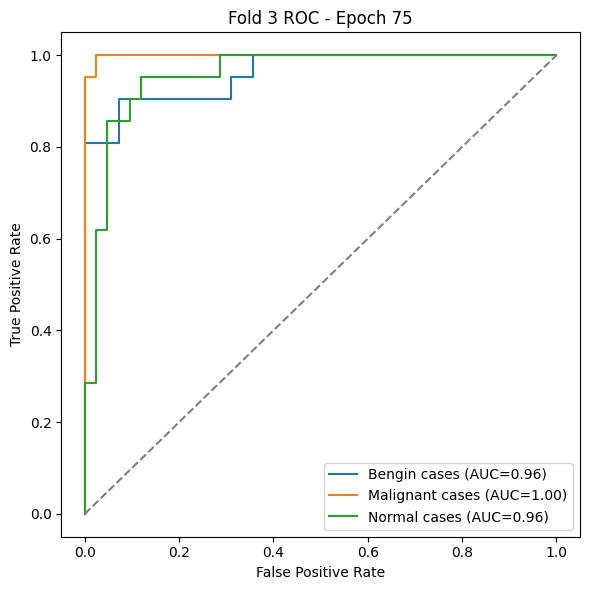

Fold 3 Epoch 80/100 - TrainLoss: 0.0064  ValAcc: 0.8889  ValAUC_macro: 0.9698  time(s):6.9


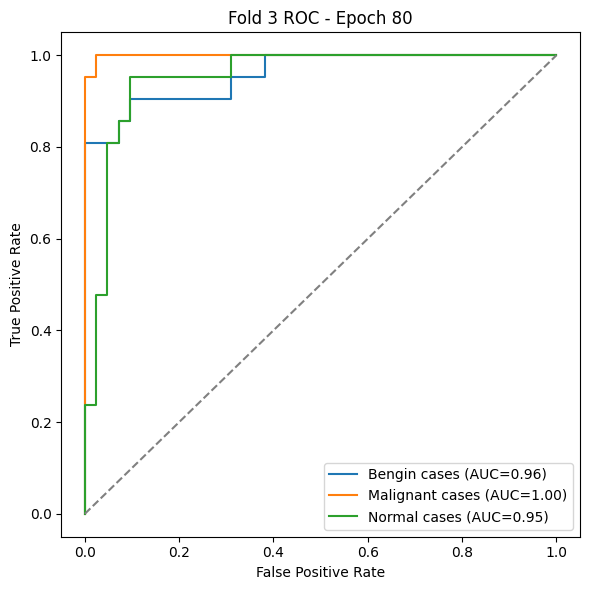

Fold 3 Epoch 85/100 - TrainLoss: 0.0058  ValAcc: 0.9048  ValAUC_macro: 0.9713  time(s):6.9


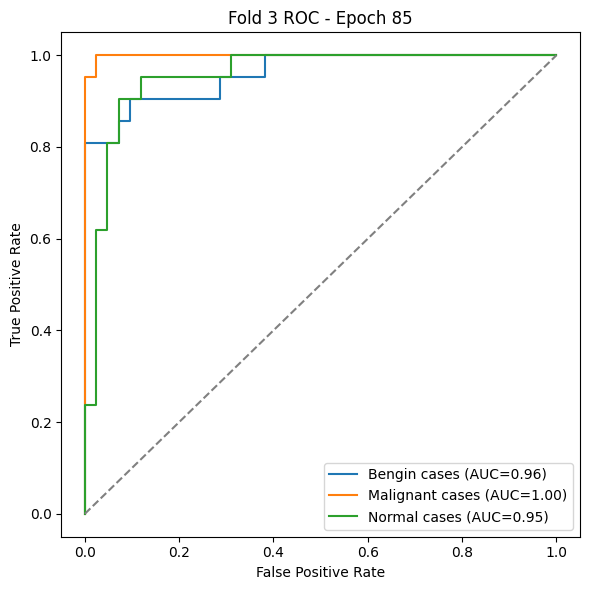

Fold 3 Epoch 90/100 - TrainLoss: 0.0052  ValAcc: 0.9048  ValAUC_macro: 0.9724  time(s):6.9


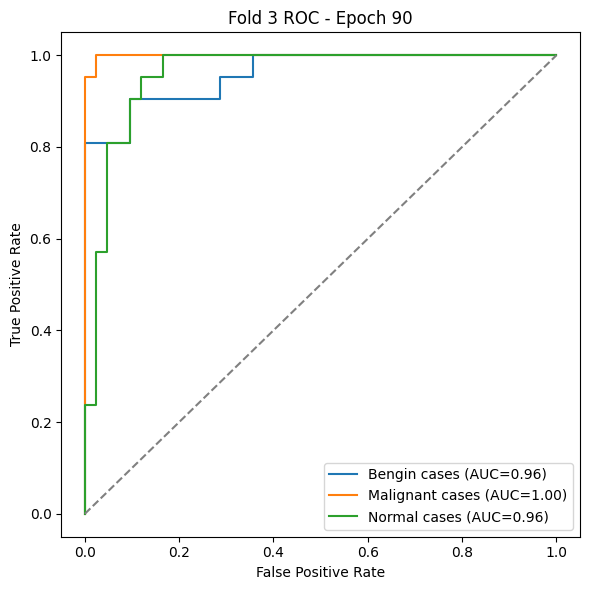

Fold 3 Epoch 95/100 - TrainLoss: 0.0047  ValAcc: 0.8889  ValAUC_macro: 0.9720  time(s):6.9


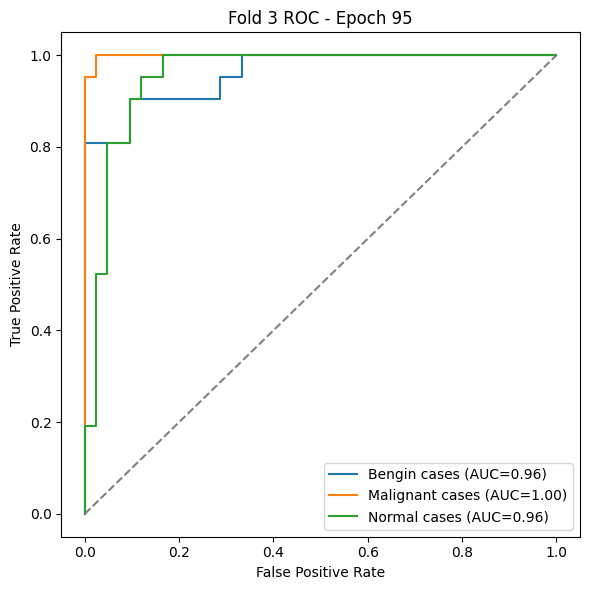

Fold 3 Epoch 100/100 - TrainLoss: 0.0043  ValAcc: 0.9048  ValAUC_macro: 0.9743  time(s):6.9


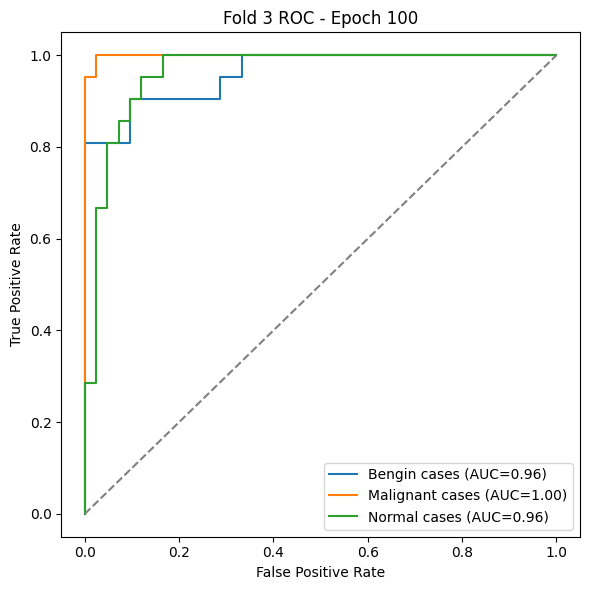

Fold 3 Summary -> Acc: 0.9048 Prec: 0.9084 Rec: 0.9048 F1: 0.9041 AUC_macro: 0.9701

=== Fold 4/4 ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Fold 4 Epoch 1/100 - TrainLoss: 1.0341  ValAcc: 0.7143  ValAUC_macro: 0.8783  time(s):7.0


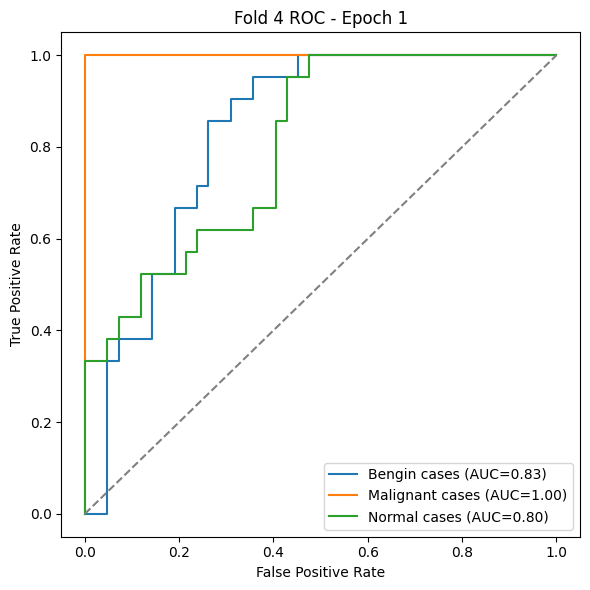

Fold 4 Epoch 5/100 - TrainLoss: 0.3105  ValAcc: 0.8571  ValAUC_macro: 0.9633  time(s):6.9


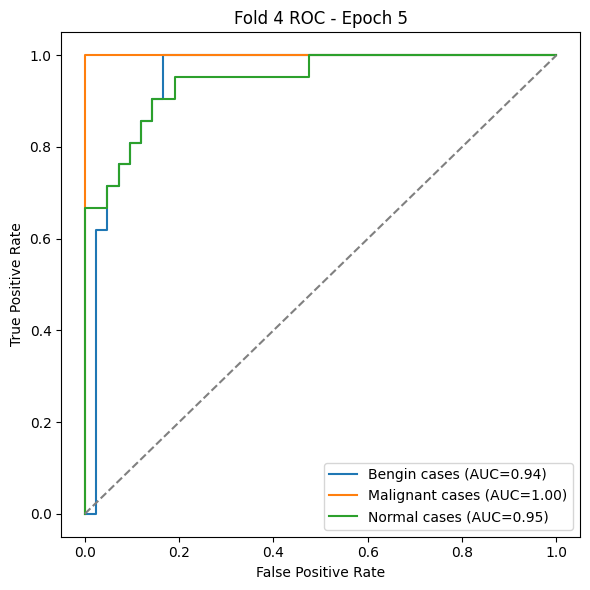

Fold 4 Epoch 10/100 - TrainLoss: 0.0655  ValAcc: 0.8889  ValAUC_macro: 0.9698  time(s):6.9


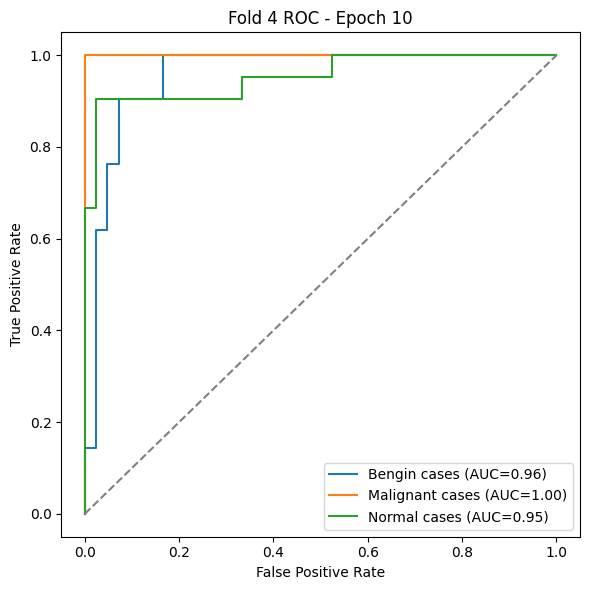

Fold 4 Epoch 15/100 - TrainLoss: 0.0385  ValAcc: 0.8889  ValAUC_macro: 0.9747  time(s):6.9


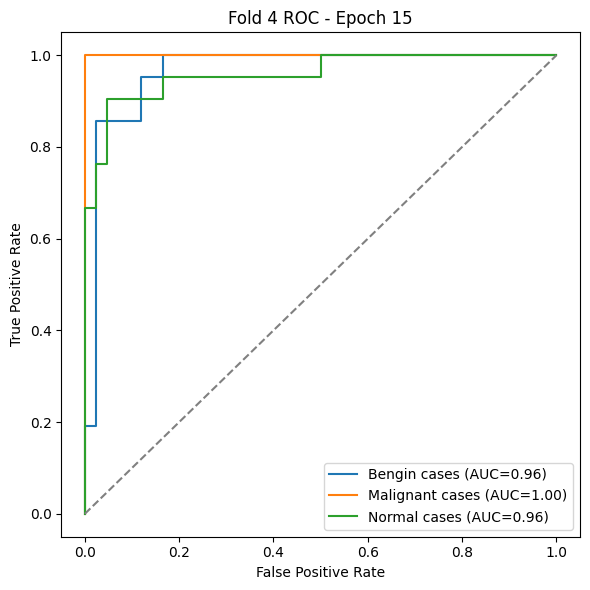

Fold 4 Epoch 20/100 - TrainLoss: 0.0285  ValAcc: 0.8889  ValAUC_macro: 0.9701  time(s):7.3


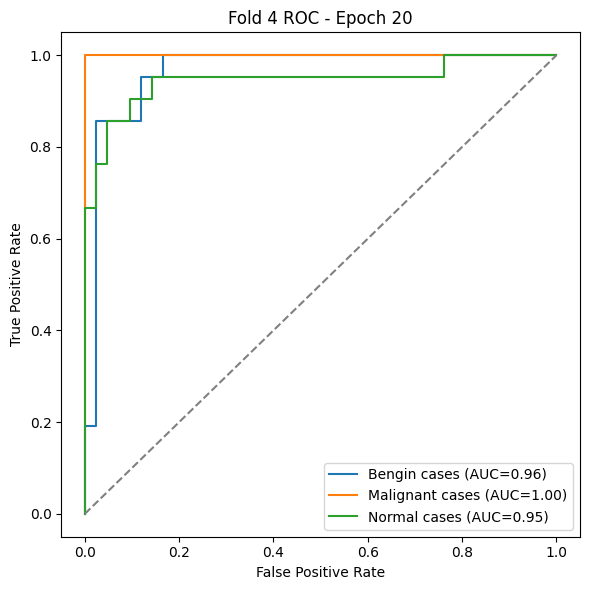

Fold 4 Epoch 25/100 - TrainLoss: 0.0230  ValAcc: 0.9206  ValAUC_macro: 0.9713  time(s):7.1


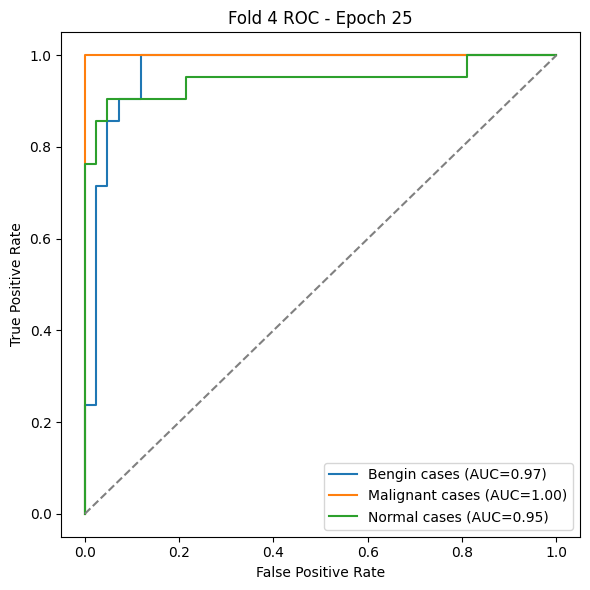

Fold 4 Epoch 30/100 - TrainLoss: 0.0193  ValAcc: 0.9048  ValAUC_macro: 0.9698  time(s):6.9


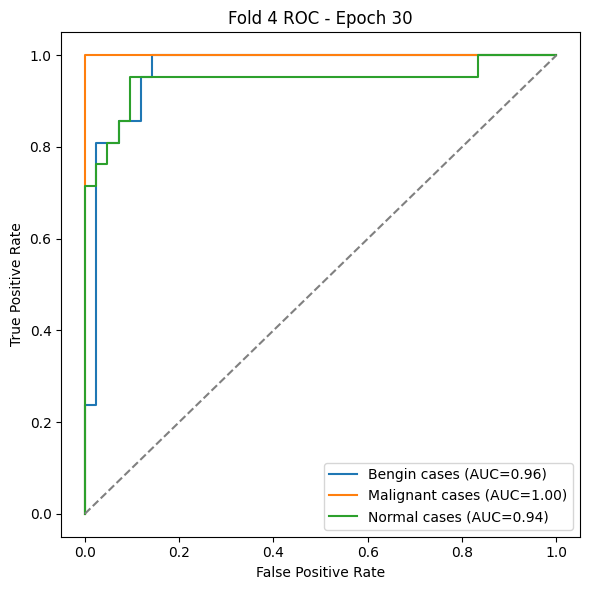

Fold 4 Epoch 35/100 - TrainLoss: 0.0166  ValAcc: 0.9048  ValAUC_macro: 0.9728  time(s):6.9


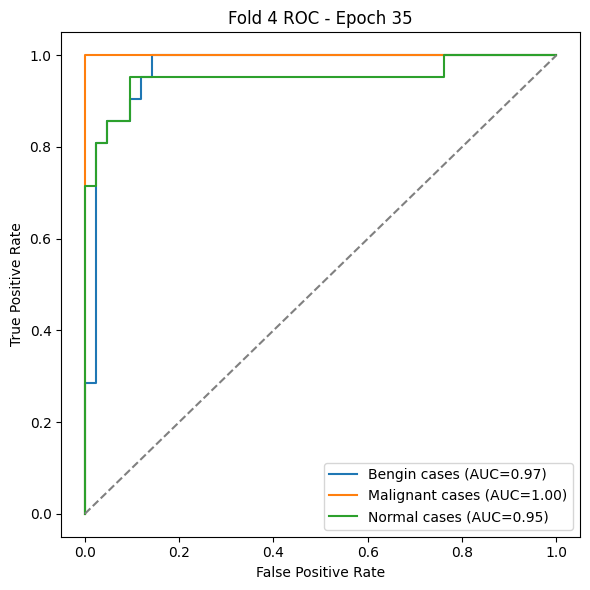

Fold 4 Epoch 40/100 - TrainLoss: 0.0144  ValAcc: 0.8889  ValAUC_macro: 0.9735  time(s):6.9


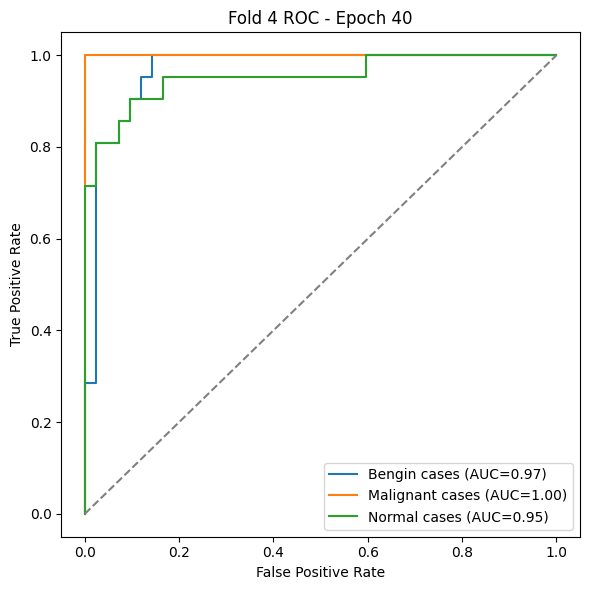

Fold 4 Epoch 45/100 - TrainLoss: 0.0127  ValAcc: 0.9048  ValAUC_macro: 0.9701  time(s):6.9


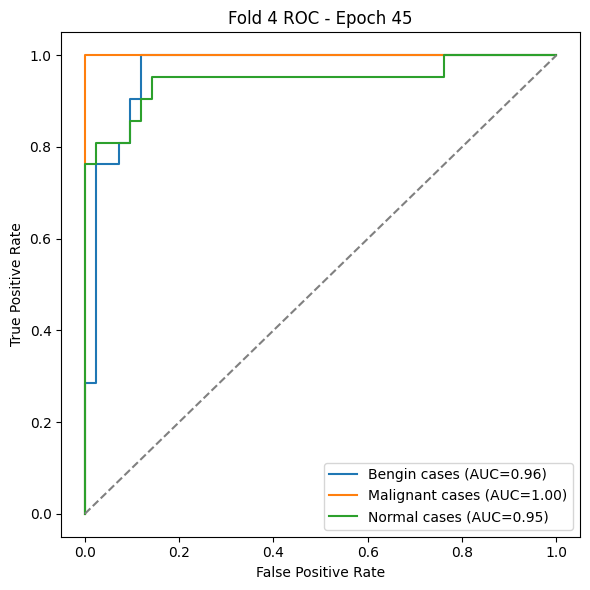

Fold 4 Epoch 50/100 - TrainLoss: 0.0112  ValAcc: 0.9048  ValAUC_macro: 0.9739  time(s):6.9


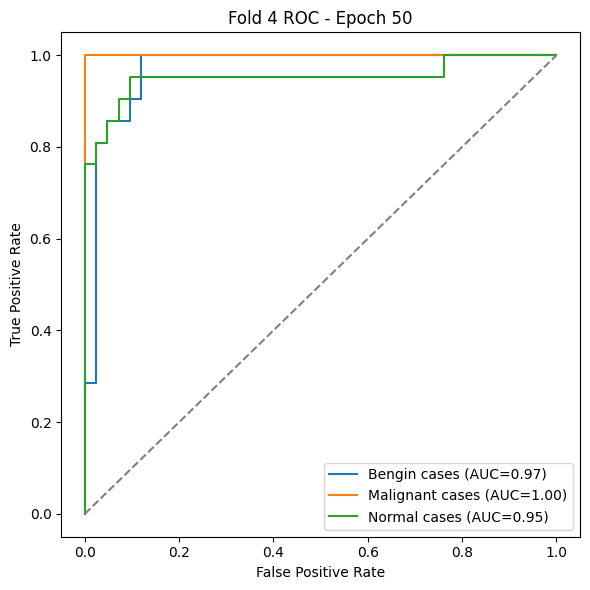

Fold 4 Epoch 55/100 - TrainLoss: 0.0100  ValAcc: 0.9048  ValAUC_macro: 0.9754  time(s):6.9


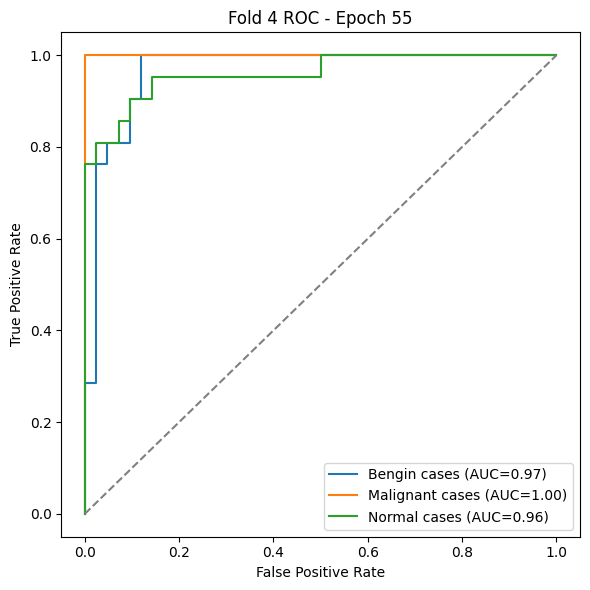

Fold 4 Epoch 60/100 - TrainLoss: 0.0089  ValAcc: 0.9206  ValAUC_macro: 0.9717  time(s):6.9


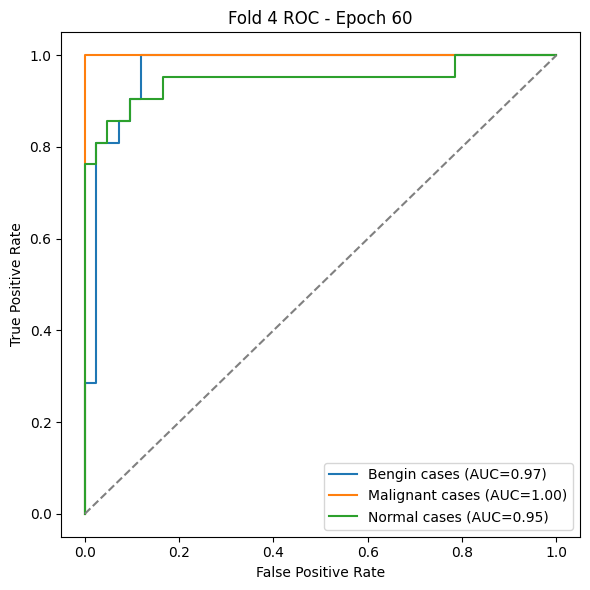

Fold 4 Epoch 65/100 - TrainLoss: 0.0080  ValAcc: 0.9048  ValAUC_macro: 0.9717  time(s):6.9


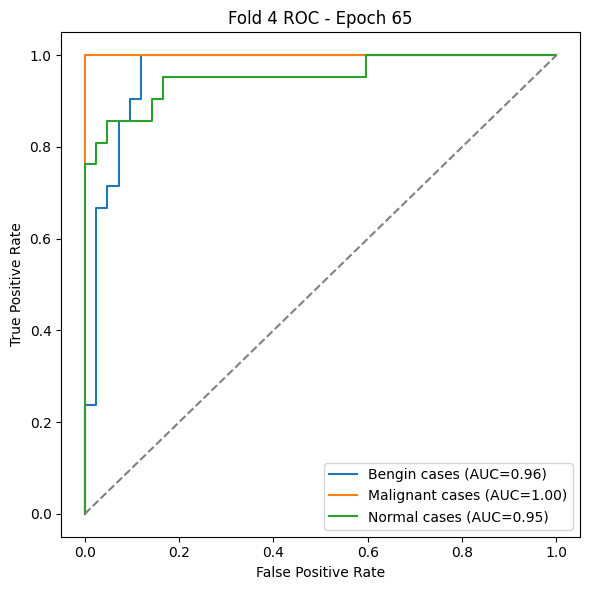

Fold 4 Epoch 70/100 - TrainLoss: 0.0072  ValAcc: 0.9206  ValAUC_macro: 0.9754  time(s):6.9


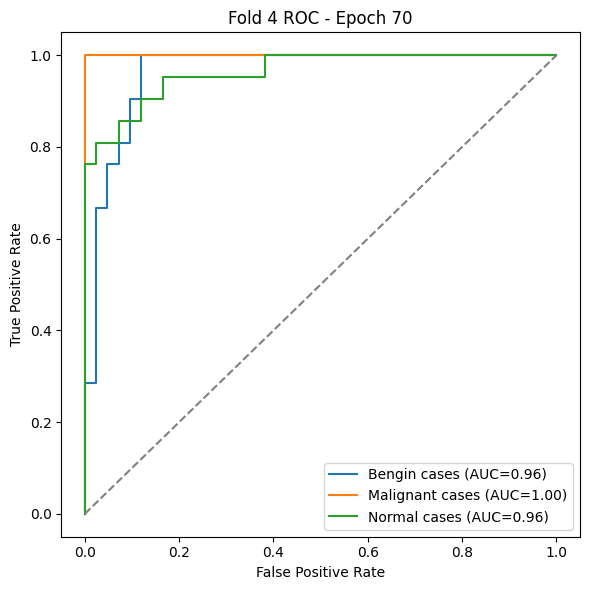

Fold 4 Epoch 75/100 - TrainLoss: 0.0065  ValAcc: 0.9206  ValAUC_macro: 0.9803  time(s):6.9


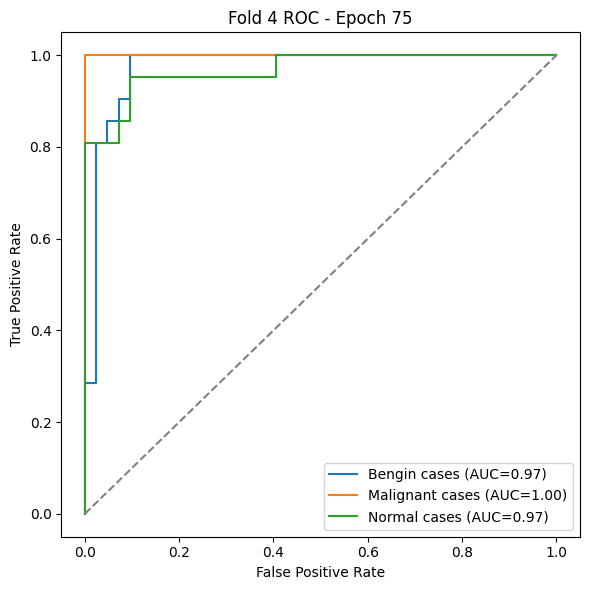

Fold 4 Epoch 80/100 - TrainLoss: 0.0059  ValAcc: 0.9048  ValAUC_macro: 0.9705  time(s):6.9


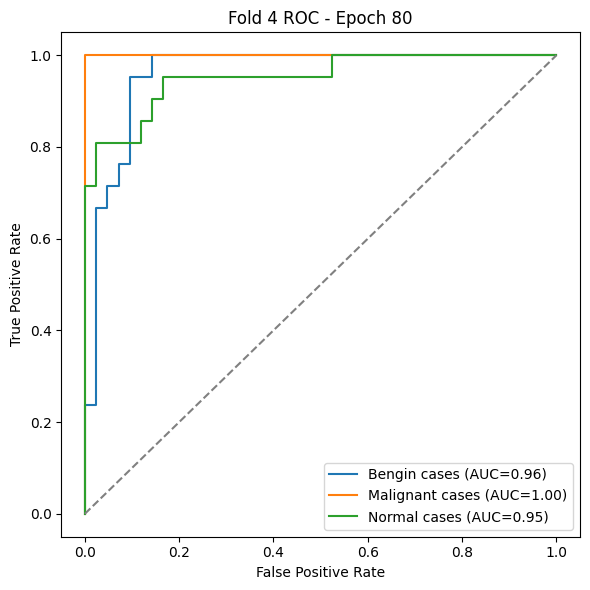

Fold 4 Epoch 85/100 - TrainLoss: 0.0053  ValAcc: 0.9048  ValAUC_macro: 0.9739  time(s):6.9


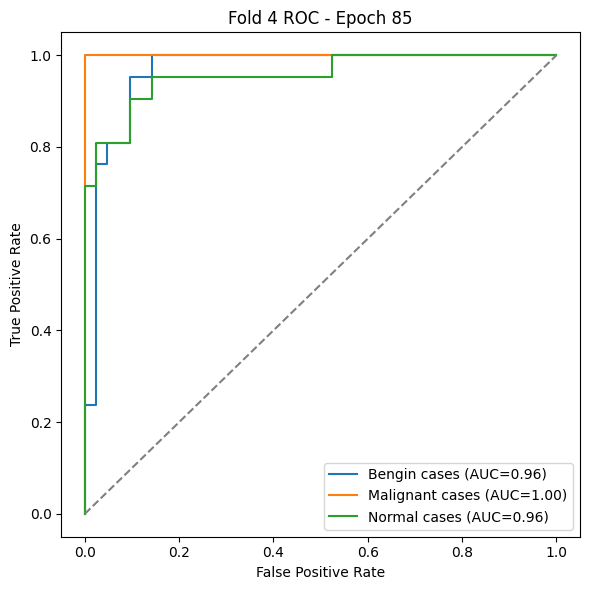

Fold 4 Epoch 90/100 - TrainLoss: 0.0048  ValAcc: 0.9206  ValAUC_macro: 0.9762  time(s):6.9


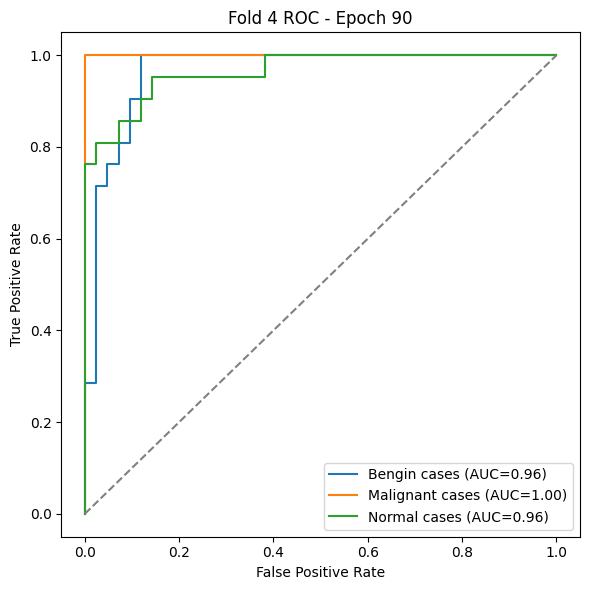

Fold 4 Epoch 95/100 - TrainLoss: 0.0044  ValAcc: 0.9048  ValAUC_macro: 0.9751  time(s):6.9


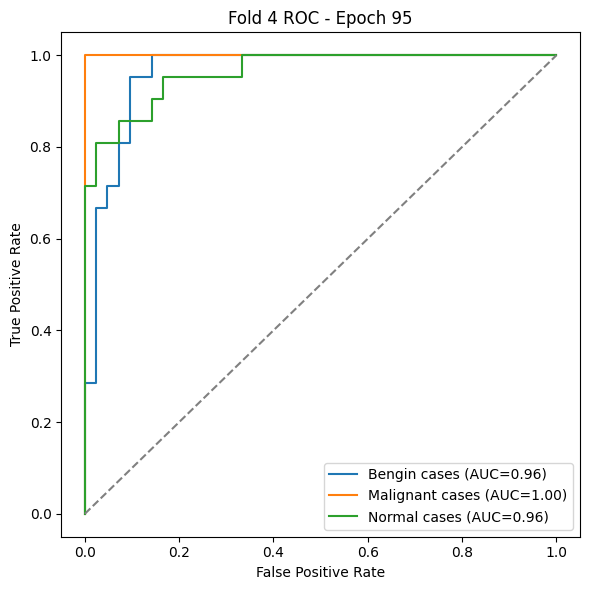

Fold 4 Epoch 100/100 - TrainLoss: 0.0040  ValAcc: 0.9048  ValAUC_macro: 0.9743  time(s):6.9


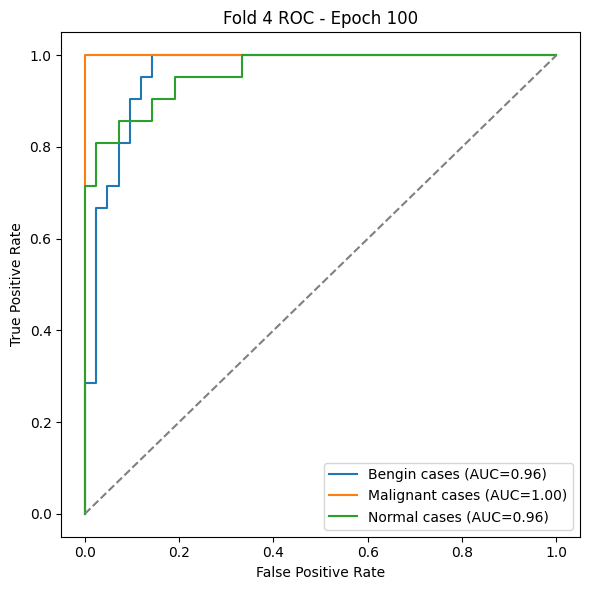

Fold 4 Summary -> Acc: 0.9048 Prec: 0.9259 Rec: 0.9048 F1: 0.9028 AUC_macro: 0.9747

=== CV Summary ===
Fold 1: Acc=0.9841 Prec=0.9848 Rec=0.9841 F1=0.9841 AUC=0.9951
Fold 2: Acc=0.8889 Prec=0.8982 Rec=0.8889 F1=0.8899 AUC=0.9584
Fold 3: Acc=0.9048 Prec=0.9084 Rec=0.9048 F1=0.9041 AUC=0.9701
Fold 4: Acc=0.9048 Prec=0.9259 Rec=0.9048 F1=0.9028 AUC=0.9747
Mean Acc: 0.9206349206349206
Mean AUC: 0.9745842781557067


In [ ]:
# ---------------------------
# 8) K-Fold training loop (fine-tune ViT per fold)
# ---------------------------
fold_results = []
fold_no = 0

for train_idx, val_idx in skf.split(train_indices_for_kfold, train_labels_for_kfold):
    fold_no += 1
    print(f"\n=== Fold {fold_no}/{K_FOLDS} ===")
    fold_train_ds = Subset(train_dataset, train_idx)
    fold_val_ds   = Subset(train_dataset, val_idx)

    train_loader = DataLoader(fold_train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
    val_loader   = DataLoader(fold_val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

    # fresh model copy for each fold
    model = ViTForImageClassification.from_pretrained(MODEL_NAME, config=config).to(DEVICE)
    model.train()
    # ensure dropout disabled if model uses dropout (we set config earlier)
    for p in model.parameters():
        p.requires_grad = True

    optimizer = torch.optim.AdamW(model.parameters(), lr=LR)

    for epoch in range(1, NUM_EPOCHS + 1):
        t0 = time.time()
        train_loss = train_one_epoch_vit(model, train_loader, optimizer, DEVICE)
        t1 = time.time()

        val_probs, val_preds, val_labels = evaluate_vit(model, val_loader, DEVICE)
        val_acc = accuracy_score(val_labels, val_preds) if val_labels.size else 0.0

        if epoch % PLOT_EVERY == 0 or epoch == 1 or epoch == NUM_EPOCHS:
            try:
                val_auc_macro = roc_auc_score(label_binarize(val_labels, classes=list(range(NUM_CLASSES))), val_probs, average='macro', multi_class='ovo')
            except Exception:
                val_auc_macro = float('nan')
            print(f"Fold {fold_no} Epoch {epoch}/{NUM_EPOCHS} - TrainLoss: {train_loss:.4f}  ValAcc: {val_acc:.4f}  ValAUC_macro: {val_auc_macro:.4f}  time(s):{t1-t0:.1f}")

        # plot ROC at checkpoints
        if (epoch == 1) or (epoch % PLOT_EVERY == 0) or (epoch == NUM_EPOCHS):
            if val_labels.size:
                plot_multiclass_roc(val_labels, val_probs, class_names, title=f"Fold {fold_no} ROC - Epoch {epoch}")

    # final validation metrics for fold
    val_probs, val_preds, val_labels = evaluate_vit(model, val_loader, DEVICE)
    try:
        val_auc_macro = roc_auc_score(label_binarize(val_labels, classes=list(range(NUM_CLASSES))), val_probs, average='macro', multi_class='ovo')
    except Exception:
        val_auc_macro = float('nan')

    prec, rec, f1, _ = precision_recall_fscore_support(val_labels, val_preds, average='macro', zero_division=0)
    acc = accuracy_score(val_labels, val_preds)

    print(f"Fold {fold_no} Summary -> Acc: {acc:.4f} Prec: {prec:.4f} Rec: {rec:.4f} F1: {f1:.4f} AUC_macro: {val_auc_macro:.4f}")

    fold_results.append({"fold": fold_no, "acc": acc, "prec": prec, "rec": rec, "f1": f1, "auc": val_auc_macro})

# CV summary
print("\n=== CV Summary ===")
for r in fold_results:
    print(f"Fold {r['fold']}: Acc={r['acc']:.4f} Prec={r['prec']:.4f} Rec={r['rec']:.4f} F1={r['f1']:.4f} AUC={r['auc']:.4f}")
print("Mean Acc:", np.mean([r['acc'] for r in fold_results]))
print("Mean AUC:", np.nanmean([r['auc'] for r in fold_results]))

This block trains the final ViT model on the entire training dataset and then evaluates it once on the held-out test set.
It prints training loss at intervals, then computes test accuracy, macro precision/recall/F1, and macro AUC-ROC.
It also generates a per-class classification report, plots the multi-class ROC curve, and shows a confusion matrix heatmap to understand misclassifications.
Finally, it prints extra aggregated macro and weighted metrics in the same format as  CNN and SVM for fair comparison.


Retraining ViT on full training set and evaluating on TEST set...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Final training Epoch 1/100 - TrainLoss: 0.9839
Final training Epoch 10/100 - TrainLoss: 0.0655
Final training Epoch 20/100 - TrainLoss: 0.0304
Final training Epoch 30/100 - TrainLoss: 0.0176
Final training Epoch 40/100 - TrainLoss: 0.0123
Final training Epoch 50/100 - TrainLoss: 0.0091
Final training Epoch 60/100 - TrainLoss: 0.0069
Final training Epoch 70/100 - TrainLoss: 0.0054
Final training Epoch 80/100 - TrainLoss: 0.0042
Final training Epoch 90/100 - TrainLoss: 0.0033
Final training Epoch 100/100 - TrainLoss: 0.0027

=== Final Test Results ===
Accuracy: 0.9259
Precision (macro): 0.9258
Recall (macro): 0.9259
F1 (macro): 0.9254
AUC-ROC (macro): 0.9837

Classification report (per class):
                 precision    recall  f1-score   support

   Bengin cases       0.94      0.89      0.91        36
Malignant cases       0.95      1.00      0.97        36
   Normal cases       0.89      0.89      0.89        36

       accuracy                           0.93       108
      macro 

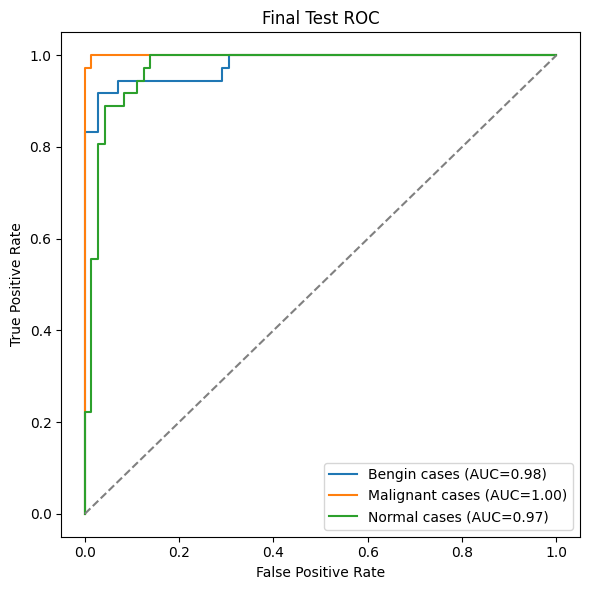

Confusion matrix:
 [[32  0  4]
 [ 0 36  0]
 [ 2  2 32]]

=== AGGREGATED METRICS (Overall Model Performance) ===
Accuracy:             0.9259
Macro Precision:      0.9258
Macro Recall:         0.9259
Macro F1-score:       0.9254
Weighted Precision:   0.9258
Weighted Recall:      0.9259
Weighted F1-score:    0.9254


In [ ]:
# ---------------------------
# 9) Retrain on full training set (all train data) and evaluate on held-out test set
# ---------------------------
print("\nRetraining ViT on full training set and evaluating on TEST set...")
full_train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

final_model = ViTForImageClassification.from_pretrained(MODEL_NAME, config=config).to(DEVICE)
final_model.train()
optimizer = torch.optim.AdamW(final_model.parameters(), lr=LR)

for epoch in range(1, NUM_EPOCHS + 1):
    train_loss = train_one_epoch_vit(final_model, full_train_loader, optimizer, DEVICE)
    if epoch % 10 == 0 or epoch == 1 or epoch == NUM_EPOCHS:
        print(f"Final training Epoch {epoch}/{NUM_EPOCHS} - TrainLoss: {train_loss:.4f}")

# Evaluate on test set
test_probs, test_preds, test_labels = evaluate_vit(final_model, test_loader, DEVICE)

acc_test = accuracy_score(test_labels, test_preds)
prec_macro, rec_macro, f1_macro, _ = precision_recall_fscore_support(
    test_labels, test_preds, average='macro', zero_division=0
)
try:
    test_auc_macro = roc_auc_score(
        label_binarize(test_labels, classes=list(range(NUM_CLASSES))),
        test_probs,
        average='macro',
        multi_class='ovo'
    )
except Exception:
    test_auc_macro = float('nan')

print("\n=== Final Test Results ===")
print(f"Accuracy: {acc_test:.4f}")
print(f"Precision (macro): {prec_macro:.4f}")
print(f"Recall (macro): {rec_macro:.4f}")
print(f"F1 (macro): {f1_macro:.4f}")
print(f"AUC-ROC (macro): {test_auc_macro:.4f}")

print("\nClassification report (per class):")
print(classification_report(test_labels, test_preds, target_names=class_names, zero_division=0))

plot_multiclass_roc(test_labels, test_probs, class_names, title="Final Test ROC")

cm = confusion_matrix(test_labels, test_preds)
print("Confusion matrix:\n", cm)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix - VIT")
plt.tight_layout()
plt.show()

# -----------------------------------------------------
# ADDITIONAL AGGREGATED METRICS
# -----------------------------------------------------
from sklearn.metrics import precision_score, recall_score, f1_score

overall_accuracy = accuracy_score(test_labels, test_preds)
macro_precision = precision_score(test_labels, test_preds, average='macro', zero_division=0)
macro_recall = recall_score(test_labels, test_preds, average='macro', zero_division=0)
macro_f1 = f1_score(test_labels, test_preds, average='macro', zero_division=0)

weighted_precision = precision_score(test_labels, test_preds, average='weighted', zero_division=0)
weighted_recall = recall_score(test_labels, test_preds, average='weighted', zero_division=0)
weighted_f1 = f1_score(test_labels, test_preds, average='weighted', zero_division=0)

print("\n=== AGGREGATED METRICS (Overall Model Performance) ===")
print(f"Accuracy:             {overall_accuracy:.4f}")
print(f"Macro Precision:      {macro_precision:.4f}")
print(f"Macro Recall:         {macro_recall:.4f}")
print(f"Macro F1-score:       {macro_f1:.4f}")
print(f"Weighted Precision:   {weighted_precision:.4f}")
print(f"Weighted Recall:      {weighted_recall:.4f}")
print(f"Weighted F1-score:    {weighted_f1:.4f}")


This block generates attention heatmaps for a few test images to visually understand what the ViT focused on while making predictions.
It takes up to 4 images from the test loader, extracts the last-layer CLS attention, and converts it into a full-size heatmap.
Because the images are normalised, it first “unnormalises” them back to normal RGB for correct display.
Finally, it plots three views per image: original, attention-only, and an overlay to make interpretation easier.


Generating attention maps for a few test images...


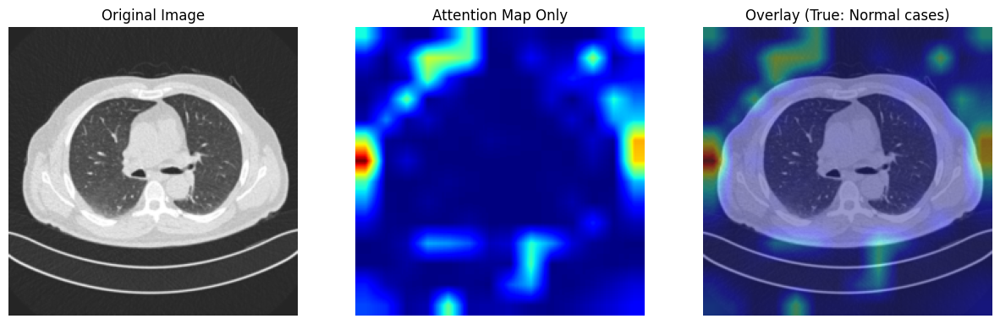

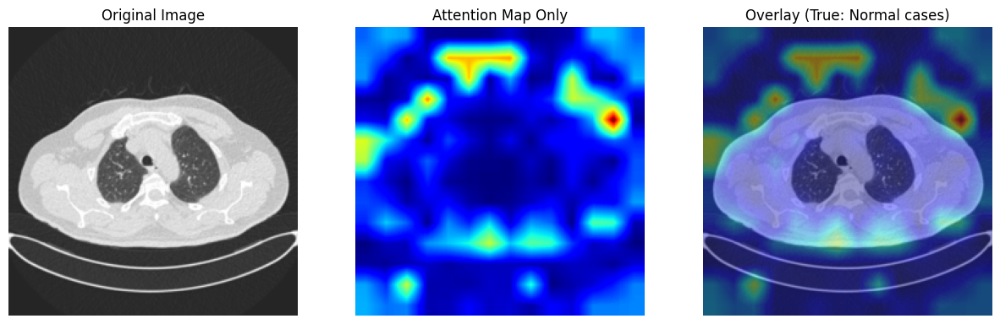

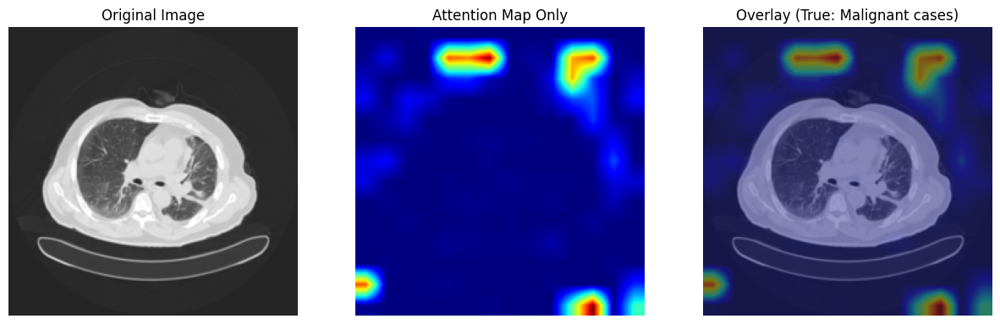

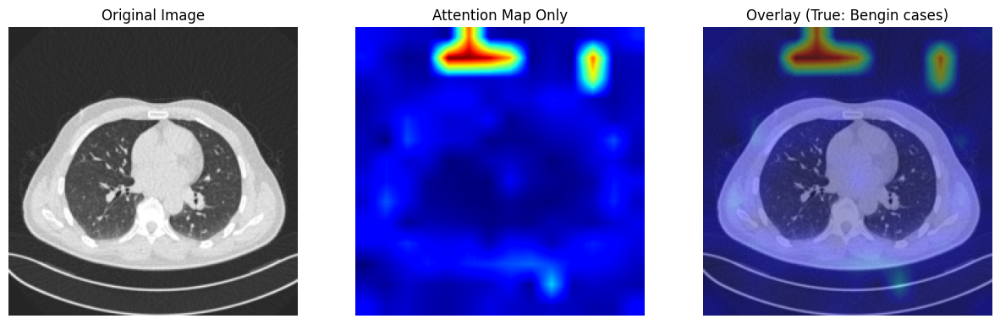

In [ ]:
# ---------------------------
# 10) Attention maps on a few test images
# ---------------------------
print("\nGenerating attention maps for a few test images...")
final_model.eval()
with torch.no_grad():
    for imgs, labels in test_loader:
        # imgs are normalized tensors; grab first up to 4 images
        sample_imgs = imgs[:4]
        sample_labels = labels[:4].numpy()
        break

# get attention heatmaps from last layer
heatmaps = get_attention_map_for_images(final_model, sample_imgs, DEVICE, layer=-1, head_mean=True)  # shape (B, H, W)

# convert sample_imgs back to numpy images (unnormalize)
def unnormalize(tensor_img, mean=mean, std=std):
    img = tensor_img.cpu().numpy().transpose(1,2,0)
    img = (img * np.array(std)) + np.array(mean)
    img = np.clip(img, 0, 1)
    return img

# ---------------------------
# Show Original, Attention-only, and Overlay for each image
# ---------------------------
for i in range(len(sample_imgs)):
    img_np = unnormalize(sample_imgs[i])        # original image (numpy)
    heat = heatmaps[i]                          # attention map (H x W)

    plt.figure(figsize=(15,5))

    # 1) ORIGINAL IMAGE
    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title("Original Image")
    plt.axis("off")

    # 2) ATTENTION MAP ONLY
    plt.subplot(1, 3, 2)
    plt.imshow(heat, cmap='jet')
    plt.title("Attention Map Only")
    plt.axis("off")

    # 3) OVERLAY (Original + Heatmap)
    plt.subplot(1, 3, 3)
    plt.imshow(img_np)
    plt.imshow(heat, cmap='jet', alpha=0.4)
    plt.title(f"Overlay (True: {class_names[sample_labels[i]]})")
    plt.axis("off")

    plt.show()



..

******************************************************************Quantum VIT ******************************************

..

In [ ]:
This block sets up the Quantum ViT environment by installing and importing everything needed for a hybrid model.
It keeps the same core pipeline as your normal ViT (PyTorch + HuggingFace Transformers + sklearn metrics), but additionally imports PennyLane to build a quantum layer that can integrate with PyTorch.
The idea is: ViT extracts strong image features, and a quantum neural layer is used as part of the classifier to test a novel architecture.
This section is mainly “project requirements + imports” before the actual quantum model definition and training.

In [ ]:
# ============================================================
# Hybrid Quantum Vision Transformer (ViT + PennyLane) with 4-fold CV
# for Lung Image Classification
#
# Requirements :
# - 4 models (CNN, SVM, ViT, Quantum ViT) → this script is Quantum ViT part
# - Classes balanced before split
# - 70% train, 30% test
# - Training data used for training + validation
# - Use k-fold = 4 on training data
# - ~100 epochs training
# - Plot ROC during training
# - Report Accuracy, Precision, Recall, F1, AUC-ROC on test
# - No dropout, no early stopping
# ============================================================

# ---------------------------
# 0) Install required packages
# ---------------------------
!pip install -q transformers==4.40.0 tqdm pennylane

# ---------------------------
# 1) Imports
# ---------------------------
import os
import random
import time
from collections import defaultdict, Counter
from types import SimpleNamespace
import math

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
from torchvision.datasets import ImageFolder
from PIL import Image

from transformers import ViTForImageClassification, ViTConfig, AutoImageProcessor
from tqdm import tqdm

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    precision_score,
    recall_score,
    f1_score,
    roc_curve,
    auc,
    roc_auc_score,
    classification_report,
    confusion_matrix,
)

import pennylane as qml
from pennylane.qnn import TorchLayer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 87.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 111.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.3/934.3 kB 48.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 90.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 96.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 96.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.9/167.9 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 120.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.2 requires t

/usr/local/lib/python3.12/dist-packages/pennylane/__init__.py:209: RuntimeWarning: PennyLane is not yet compatible with JAX versions > 0.6.2. You have version 0.7.2 installed. Please downgrade JAX to 0.6.2 to avoid runtime errors using python -m pip install jax~=0.6.0 jaxlib~=0.6.0
  warnings.warn(


This block sets all the main configuration values for your Quantum ViT experiment and makes results reproducible by fixing random seeds.
It selects GPU if available, defines dataset location, image size, batch size, number of classes, and balancing settings.
It also sets training hyperparameters like epochs, learning rate, and how often to plot ROC curves during training.
Finally, it specifies the pretrained ViT backbone that will be used inside the hybrid Quantum ViT model.

In [ ]:
# ---------------------------
# 2) Settings & Reproducibility
# ---------------------------
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed_all(RANDOM_SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# Dataset & model config
DATASET_PATH = "/content/drive/MyDrive/Lung_Images"
IMG_SIZE = 224
BATCH_SIZE = 8
NUM_CLASSES = 3
DOWNSAMPLE_TO = 120   # per class (undersampling for balance)
TEST_SIZE = 0.30
K_FOLDS = 4
NUM_EPOCHS_QVIT = 100  #   100 epochs
LR = 2e-5
PLOT_EVERY = 5        # plot ROC every 5 epochs (and at epoch 1 & last)
MODEL_NAME = "google/vit-base-patch16-224-in21k"

Device: cuda


This block defines the image preprocessing pipeline for the Quantum ViT model.
It uses the same ImageNet mean and standard deviation as the pretrained ViT to ensure input compatibility.
Simple augmentation (horizontal flip) is applied only to the training images to improve generalisation.
Evaluation images are kept deterministic so that test results remain fair and consistent.

In [ ]:
# ---------------------------
# 3) Transforms (using ViT/ImageNet stats)
# ---------------------------
processor = AutoImageProcessor.from_pretrained(MODEL_NAME)
mean = processor.image_mean
std  = processor.image_std

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:942: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

This block loads the lung image dataset and checks the original class distribution.
Since the dataset is imbalanced, it balances all classes using undersampling so that each class has a similar number of images.
Balancing is important to prevent the Quantum ViT model from being biased toward majority classes.
Finally, it prints the balanced dataset size and class distribution to verify correctness.

In [ ]:
# ---------------------------
# 4) Load dataset & balance classes (undersampling)
# ---------------------------
full_dataset = ImageFolder(root=DATASET_PATH, transform=eval_transform)
class_names = full_dataset.classes
print("Classes:", class_names)
print("Total images (before balancing):", len(full_dataset))

indices_per_class = defaultdict(list)
for idx, (_, label) in enumerate(full_dataset):
    indices_per_class[label].append(idx)

for label, idxs in indices_per_class.items():
    print(f"{class_names[label]}: {len(idxs)} images")

balanced_indices = []
for label, idxs in indices_per_class.items():
    if len(idxs) >= DOWNSAMPLE_TO:
        chosen = random.sample(idxs, DOWNSAMPLE_TO)
    else:
        chosen = idxs.copy()
    balanced_indices.extend(chosen)

random.shuffle(balanced_indices)
balanced_labels = [full_dataset[i][1] for i in balanced_indices]

print("Balanced dataset size:", len(balanced_indices))
print("Balanced class distribution:",
      Counter([full_dataset[i][1] for i in balanced_indices]))

Classes: ['Bengin cases', 'Malignant cases', 'Normal cases']
Total images (before balancing): 1097
Bengin cases: 120 images
Malignant cases: 561 images
Normal cases: 416 images
Balanced dataset size: 360
Balanced class distribution: Counter({2: 120, 1: 120, 0: 120})


This block splits the balanced dataset into a training set and a held-out test set using a 70/30 ratio.
Stratified sampling is used so that all classes keep the same proportion in both splits.
The test set is kept completely separate and is used only once for final evaluation.
Class counts are printed to confirm the split is correct and balanced.

In [ ]:
# ---------------------------
# 5) Train-test split (hold-out test set, 70/30)
# ---------------------------
train_idx_balanced, test_idx_balanced, y_train_balanced, y_test_balanced = train_test_split(
    balanced_indices,
    balanced_labels,
    test_size=TEST_SIZE,
    stratify=balanced_labels,
    random_state=RANDOM_SEED,
)

print("Train size:", len(train_idx_balanced), "Test size:", len(test_idx_balanced))
print("Train class counts:",
      Counter([full_dataset[i][1] for i in train_idx_balanced]))
print("Test class counts:",
      Counter([full_dataset[i][1] for i in test_idx_balanced]))

Train size: 252 Test size: 108
Train class counts: Counter({0: 84, 1: 84, 2: 84})
Test class counts: Counter({2: 36, 1: 36, 0: 36})


This block creates a custom dataset wrapper so that different image transforms can be applied to training and test data.
Training images use augmentation, while test images use only resizing and normalisation.
This wrapper selects only the required image indices from the full dataset, based on the train–test split.
Finally, DataLoaders are created to efficiently feed images to the Quantum ViT model during training and evaluation.

In [ ]:
# ---------------------------
# 6) Dataset wrapper (different transforms for train & eval)
# ---------------------------
class ImageFolderSubsetWithTransform(Dataset):
    def __init__(self, image_folder: ImageFolder, indices, transform):
        self.image_folder = image_folder
        self.indices = list(indices)
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        path, label = self.image_folder.samples[real_idx]
        img = self.image_folder.loader(path)
        if self.transform:
            img = self.transform(img)
        return img, label

train_dataset = ImageFolderSubsetWithTransform(full_dataset, train_idx_balanced, train_transform)
test_dataset  = ImageFolderSubsetWithTransform(full_dataset, test_idx_balanced, eval_transform)

print("Train dataset len:", len(train_dataset), "Test dataset len:", len(test_dataset))

# loaders for full train/test (for final training & test)
full_train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                               num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False,
                         num_workers=2, pin_memory=True)

Train dataset len: 252 Test dataset len: 108


This block configures the Vision Transformer backbone that will be used inside the Quantum ViT model.
It loads a pretrained ViT configuration and adjusts it for your classification task by setting the number of output classes.
All dropout is explicitly disabled to follow the project requirement of “no dropout”.
The hidden size is printed to understand the dimensionality of features produced by ViT.

In [ ]:
# ---------------------------
# 7) Base ViT config for Quantum ViT (no dropout)
# ---------------------------
config = ViTConfig.from_pretrained(MODEL_NAME)
config.num_labels = NUM_CLASSES
config.hidden_dropout_prob = 0.0
config.attention_probs_dropout_prob = 0.0
print("Hidden size (ViT):", config.hidden_size)

Hidden size (ViT): 768


/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:942: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


This block prepares the training dataset for stratified K-fold cross-validation.
Only the training data (not the test set) is used to avoid data leakage.
Class labels are extracted so that each fold preserves the class distribution.
Stratified K-Fold helps evaluate the stability and robustness of the Quantum ViT model.

In [ ]:
# ---------------------------
# 8) K-Fold prep (on TRAIN data only)
# ---------------------------
train_indices_for_kfold = list(range(len(train_dataset)))
train_labels_for_kfold = [train_dataset[i][1] for i in train_indices_for_kfold]
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=RANDOM_SEED)


This block defines helper functions to train and evaluate the Quantum ViT model and to visualise results.
train_one_epoch_qvit fine-tunes the model for one epoch and returns average training loss, while evaluate_qvit returns probabilities, predictions and true labels for metrics.
plot_multiclass_roc plots one ROC curve per class and shows AUC values.
Finally, get_attention_map_for_images_vitbackbone extracts attention maps from the ViT backbone (not the quantum layer) to give patch-level interpretability.

In [ ]:
# ---------------------------
# 9) Helper functions (train/eval/ROC/attention)
# ---------------------------
def train_one_epoch_qvit(model, loader, optimizer, device):
    model.train()
    total_loss = 0.0
    for imgs, labels in tqdm(loader, desc="Train", leave=False):
        imgs = imgs.to(device)
        labels = labels.to(device)

        outputs = model(pixel_values=imgs, labels=labels)
        loss = outputs.loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * imgs.size(0)

    return total_loss / len(loader.dataset)


def evaluate_qvit(model, loader, device):
    model.eval()
    all_probs = []
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for imgs, labels in tqdm(loader, desc="Eval", leave=False):
            imgs = imgs.to(device)
            outputs = model(pixel_values=imgs)  # returns logits
            logits = outputs.logits
            probs = torch.softmax(logits, dim=1).cpu().numpy()
            preds = np.argmax(probs, axis=1)
            all_probs.append(probs)
            all_preds.append(preds)
            all_labels.append(labels.numpy())

    if len(all_probs) == 0:
        return np.array([]), np.array([]), np.array([])

    all_probs = np.vstack(all_probs)
    all_preds = np.hstack(all_preds)
    all_labels = np.hstack(all_labels)
    return all_probs, all_preds, all_labels


def plot_multiclass_roc(y_true, y_probs, classes, title):
    if len(y_true) == 0:
        return
    y_true_bin = label_binarize(y_true, classes=list(range(len(classes))))
    plt.figure(figsize=(6, 6))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{cls} (AUC={roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], '--', color='gray')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()
    plt.close()


def get_attention_map_for_images_vitbackbone(model_vit, images_tensor, device,
                                             layer=-1, head_mean=True):
    """
    images_tensor: (B, C, H, W), normalized
    model_vit: object with .vit attribute (our HybridQuantumViT has this)
    Returns: heatmaps (B, H, W) upsampled to IMG_SIZE
    """
    model_vit.eval()
    with torch.no_grad():
        outputs = model_vit.vit(pixel_values=images_tensor.to(device),
                                output_attentions=True)
        attentions = outputs.attentions  # list of (B, heads, S, S)
        attn = attentions[layer]         # pick layer
        B, Hh, S, _ = attn.shape

        if head_mean:
            attn_map = attn.mean(dim=1)  # (B, S, S)
        else:
            attn_map = attn.sum(dim=1)

        cls_attn = attn_map[:, 0, 1:]    # CLS -> patches
        num_patches = cls_attn.shape[-1]
        patch_size = int(np.sqrt(num_patches))
        cls_attn_map = cls_attn.reshape(B, patch_size, patch_size).cpu().numpy()

        heatmaps = []
        for b in range(B):
            arr = cls_attn_map[b]
            arr = (arr - arr.min()) / (arr.max() - arr.min() + 1e-9)
            heat = np.array(
                Image.fromarray((arr * 255).astype('uint8')).resize(
                    (IMG_SIZE, IMG_SIZE),
                    resample=Image.BILINEAR
                )
            ) / 255.0
            heatmaps.append(heat)

        heatmaps = np.stack(heatmaps, axis=0)
    return heatmaps

This block defines the quantum circuit and the full Hybrid Quantum ViT model.
The ViT backbone first extracts a CLS embedding (a 768-dim vector) from each image, then two small classical layers reduce it down to N_QUBITS values.
Those values are scaled into the range [-π, π] and passed into a PennyLane quantum circuit (simulated), which outputs expectation values.
Finally, a normal linear classifier converts the quantum outputs into 3 class logits and computes cross-entropy loss when labels are provided.

In [ ]:
# ---------------------------
# 10) Quantum circuit & Hybrid Quantum ViT model
# ---------------------------
N_QUBITS = 12
N_Q_LAYERS = 2

q_device = qml.device("default.qubit", wires=N_QUBITS)

@qml.qnode(q_device, interface="torch")
def quantum_circuit(inputs, weights):
    """
    inputs: shape (N_QUBITS,)
    weights: trainable parameters
    Returns: expectation values for each qubit (N_QUBITS,)
    """
    # inputs should be in [-pi, pi]
    qml.AngleEmbedding(inputs, wires=range(N_QUBITS))
    qml.StronglyEntanglingLayers(weights, wires=range(N_QUBITS))
    return [qml.expval(qml.PauliZ(i)) for i in range(N_QUBITS)]

weight_shapes = {"weights": (N_Q_LAYERS, N_QUBITS, 3)}
quantum_layer = TorchLayer(quantum_circuit, weight_shapes)


class HybridQuantumViT(nn.Module):
    """
    Hybrid Quantum ViT :
    - ViT backbone (.vit)
    - Classical preprocessing: 768 → 64 → N_QUBITS
    - tanh scaling to [-π, π]
    - Quantum circuit
    - Final classifier: N_QUBITS → NUM_CLASSES
    """
    def __init__(self, base_model_name, config, num_labels, quantum_layer):
        super().__init__()

        # Load base ViT backbone
        base_vit = ViTForImageClassification.from_pretrained(base_model_name, config=config)
        self.vit = base_vit.vit
        self.hidden_size = config.hidden_size
        self.num_labels = num_labels

        # Classical preprocessing layers
        self.cls_mid = nn.Linear(self.hidden_size, 64)   # 768 → 64
        self.cls_reducer = nn.Linear(64, N_QUBITS)       # 64 → 16
        self.activation = nn.GELU()

        # Quantum layer
        self.quantum_layer = quantum_layer

        # Final classifier
        self.classifier = nn.Linear(N_QUBITS, num_labels)

        self.loss_fn = nn.CrossEntropyLoss()

    def forward(self, pixel_values, labels=None):
        # Extract ViT CLS embedding
        vit_outputs = self.vit(pixel_values=pixel_values)
        cls_embedding = vit_outputs.last_hidden_state[:, 0, :]  # (B, 768)

        # Classical preprocessing
        x = self.activation(self.cls_mid(cls_embedding))   # (B, 64)
        x = self.cls_reducer(x)                            # (B, 16)
        x = torch.tanh(x) * math.pi                        # scale into [-π, π]

        # Move to CPU for quantum simulation
        x_cpu = x.to(torch.device("cpu"))
        q_out = self.quantum_layer(x_cpu)                  # (B, 16)
        q_out = q_out.to(pixel_values.device)

        # Final classifier
        logits = self.classifier(q_out)

        # Loss
        loss = None
        if labels is not None:
            loss = self.loss_fn(logits, labels)

        return SimpleNamespace(logits=logits, loss=loss)

This block runs 4-fold stratified cross-validation for your Hybrid Quantum ViT using only the training dataset.
For each fold, it creates a new train/validation split, trains a fresh Hybrid QViT model from scratch, and evaluates it on the fold’s validation set.
During training it prints loss, validation accuracy, and macro AUC, and it plots ROC curves at checkpoints (epoch 1, every 5 epochs, and final).
At the end, it computes fold-wise summary metrics and prints the mean performance across all folds.


=== [Hybrid QViT] Fold 1/4 ===


/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:942: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold 1] Epoch 1/100 - TrainLoss: 1.1007  ValAcc: 0.3333  ValAUC_macro: 0.9033  Time: 12.4s


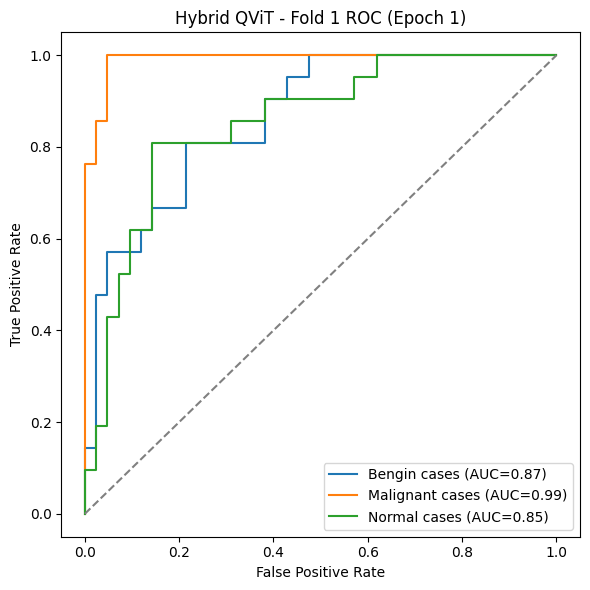

[Fold 1] Epoch 5/100 - TrainLoss: 1.0148  ValAcc: 0.3333  ValAUC_macro: 0.9788  Time: 11.2s


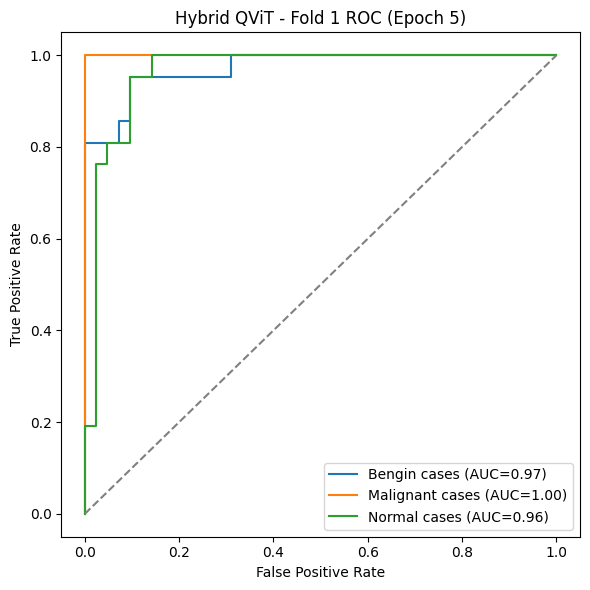

[Fold 1] Epoch 10/100 - TrainLoss: 0.9771  ValAcc: 0.3333  ValAUC_macro: 0.9913  Time: 11.2s


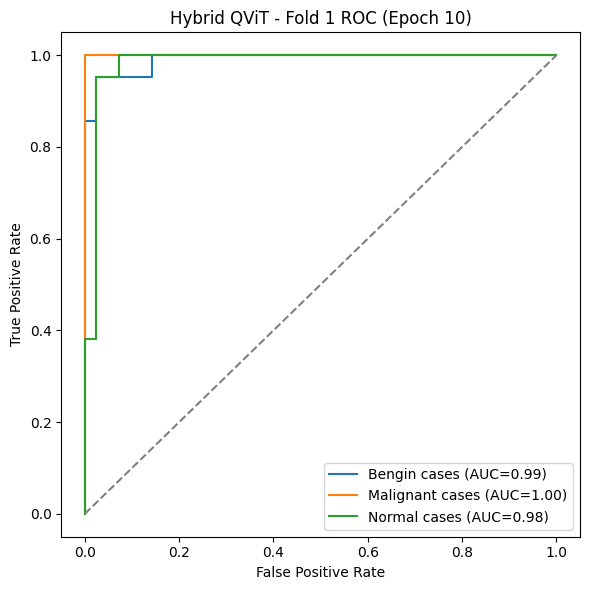

[Fold 1] Epoch 15/100 - TrainLoss: 0.9777  ValAcc: 0.3333  ValAUC_macro: 0.9546  Time: 11.8s


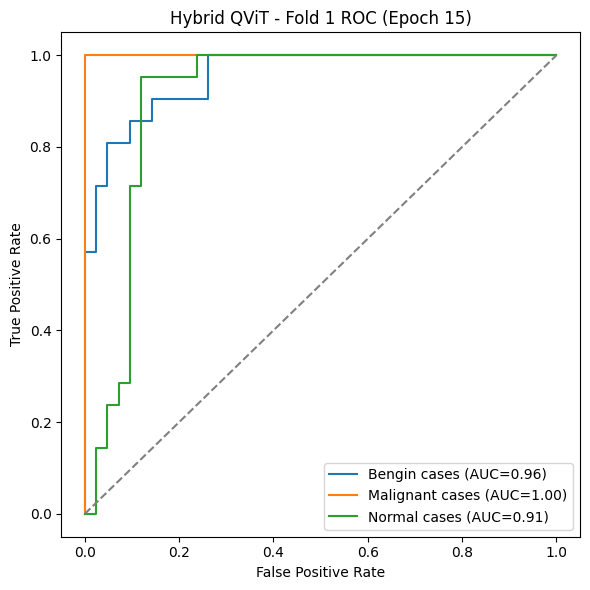

[Fold 1] Epoch 20/100 - TrainLoss: 0.9623  ValAcc: 0.3968  ValAUC_macro: 0.9909  Time: 11.8s


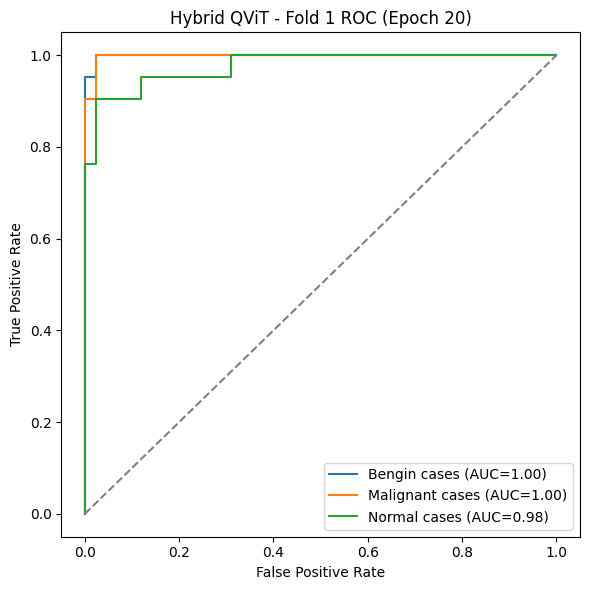

[Fold 1] Epoch 25/100 - TrainLoss: 0.9567  ValAcc: 0.6349  ValAUC_macro: 0.9962  Time: 12.2s


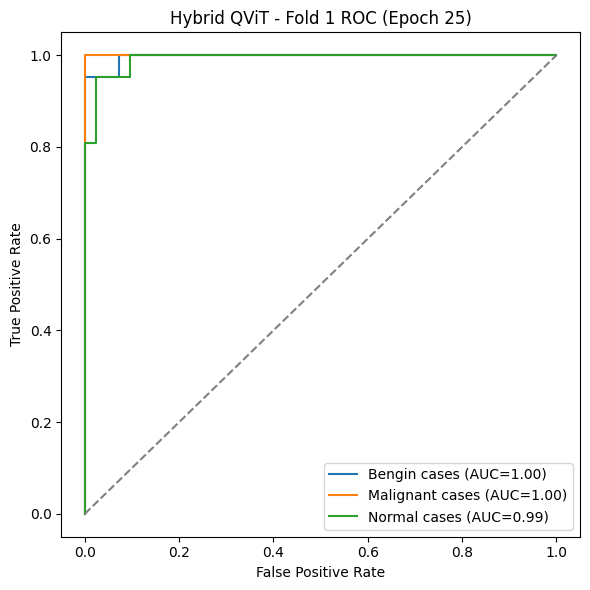

[Fold 1] Epoch 30/100 - TrainLoss: 0.9523  ValAcc: 0.6349  ValAUC_macro: 0.9974  Time: 11.9s


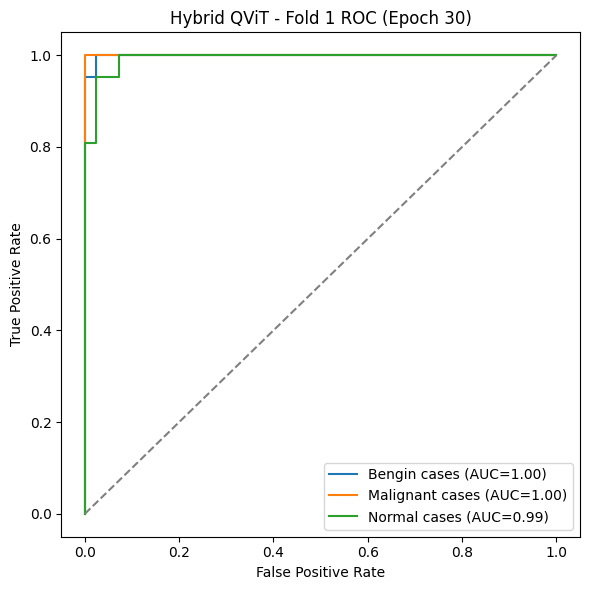

[Fold 1] Epoch 35/100 - TrainLoss: 0.9479  ValAcc: 0.6349  ValAUC_macro: 0.9977  Time: 12.1s


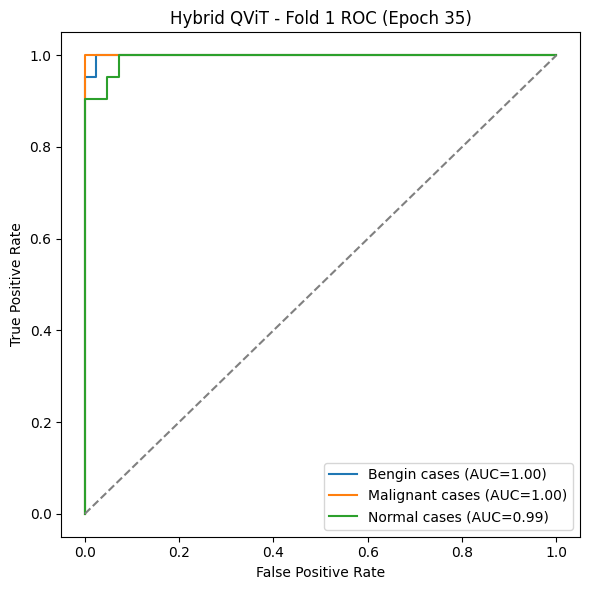

[Fold 1] Epoch 40/100 - TrainLoss: 0.9436  ValAcc: 0.6349  ValAUC_macro: 0.9943  Time: 12.1s


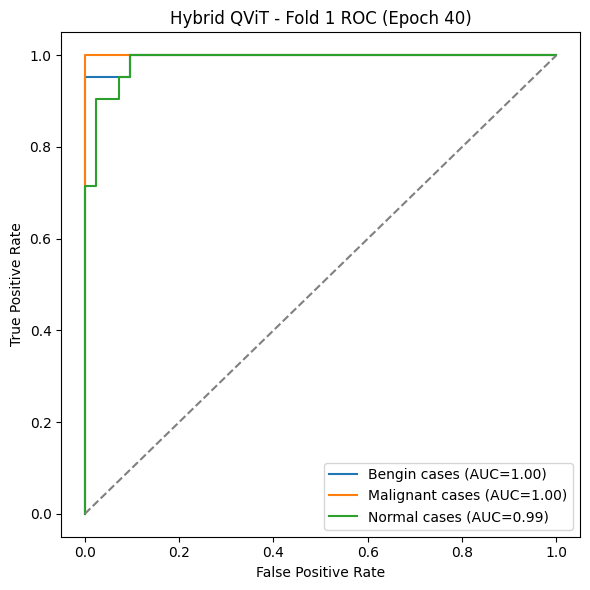

[Fold 1] Epoch 45/100 - TrainLoss: 0.9393  ValAcc: 0.6349  ValAUC_macro: 0.9951  Time: 12.1s


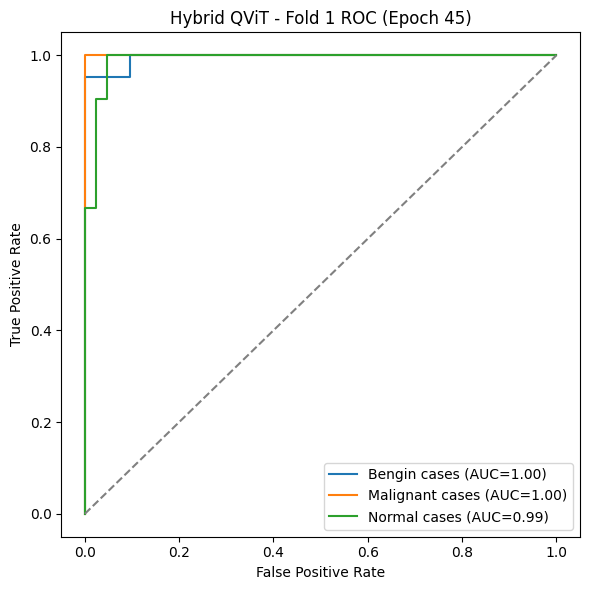

[Fold 1] Epoch 50/100 - TrainLoss: 0.9350  ValAcc: 0.6349  ValAUC_macro: 0.9981  Time: 12.0s


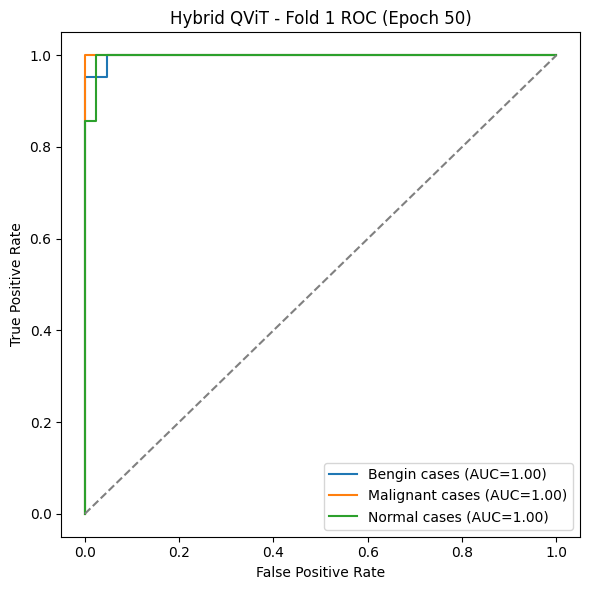

[Fold 1] Epoch 55/100 - TrainLoss: 0.9306  ValAcc: 0.6349  ValAUC_macro: 0.9958  Time: 12.0s


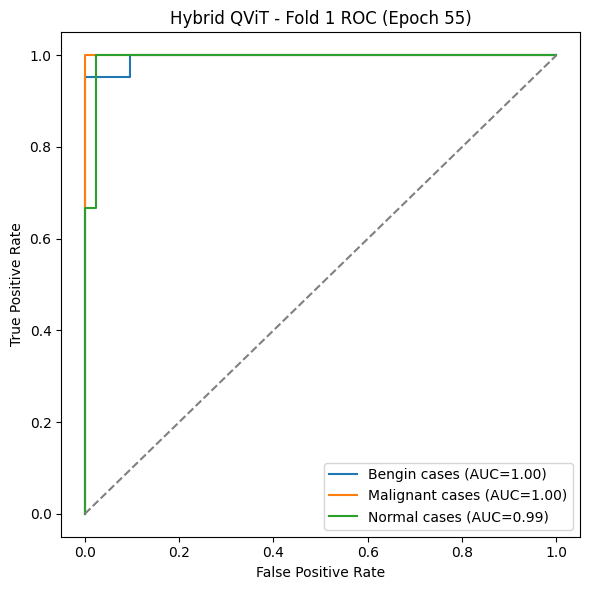

[Fold 1] Epoch 60/100 - TrainLoss: 0.9263  ValAcc: 0.6349  ValAUC_macro: 0.9966  Time: 12.1s


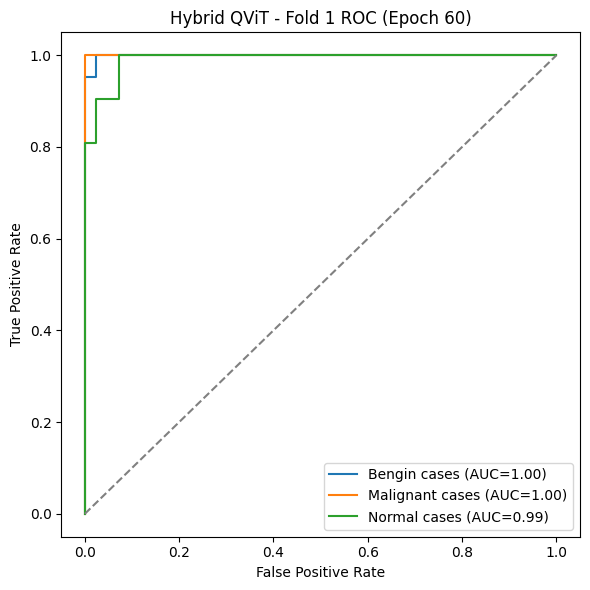

[Fold 1] Epoch 65/100 - TrainLoss: 0.9218  ValAcc: 0.6349  ValAUC_macro: 0.9977  Time: 12.0s


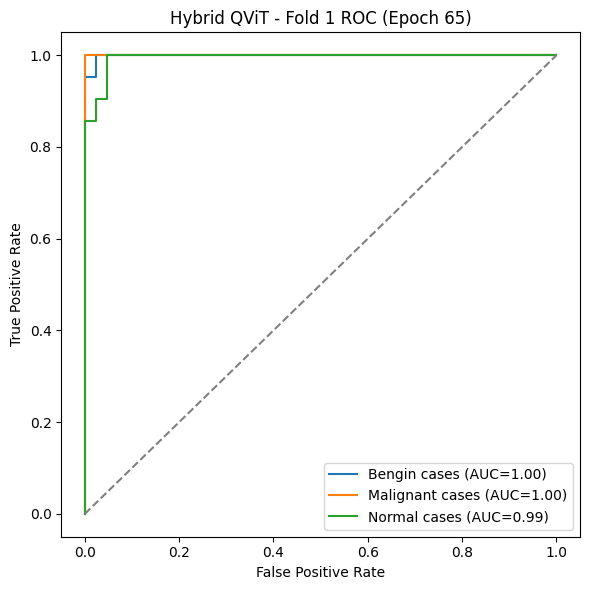

[Fold 1] Epoch 70/100 - TrainLoss: 0.9174  ValAcc: 0.6349  ValAUC_macro: 0.9974  Time: 12.1s


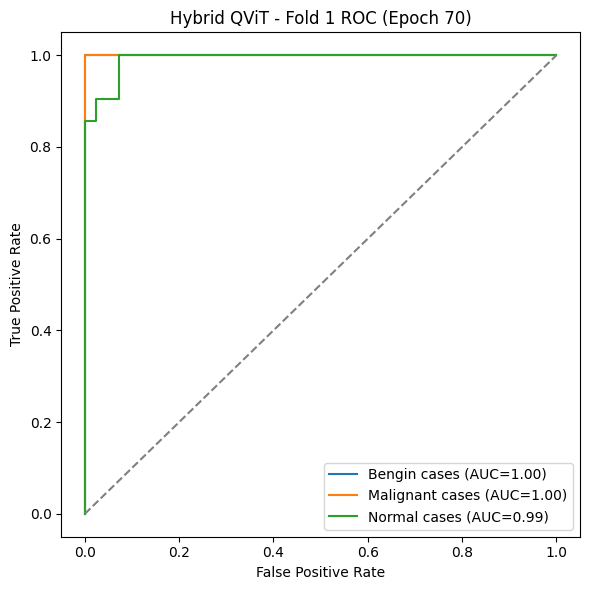

[Fold 1] Epoch 75/100 - TrainLoss: 0.9129  ValAcc: 0.6349  ValAUC_macro: 0.9962  Time: 12.6s


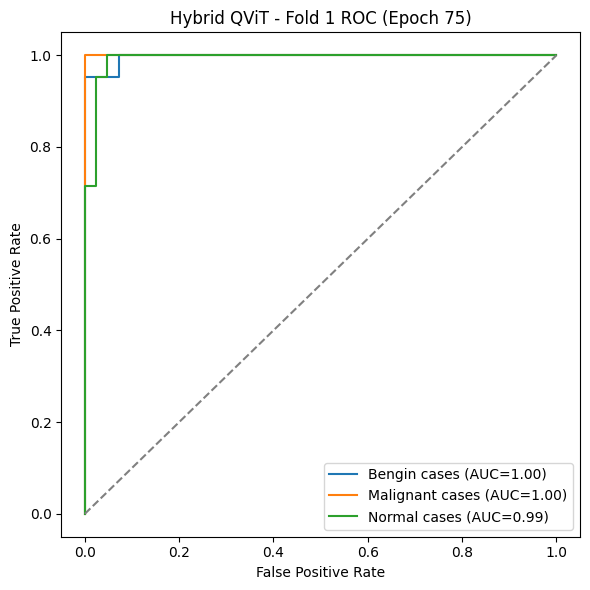

[Fold 1] Epoch 80/100 - TrainLoss: 0.9084  ValAcc: 0.9048  ValAUC_macro: 0.9951  Time: 12.4s


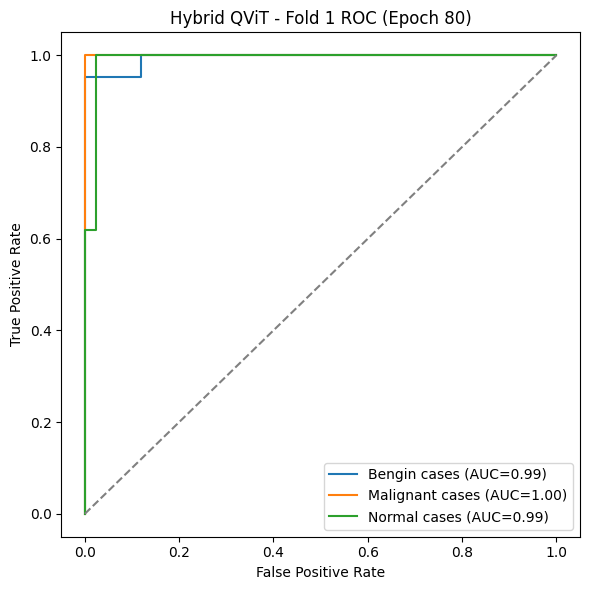

[Fold 1] Epoch 85/100 - TrainLoss: 0.9039  ValAcc: 0.9365  ValAUC_macro: 0.9966  Time: 11.8s


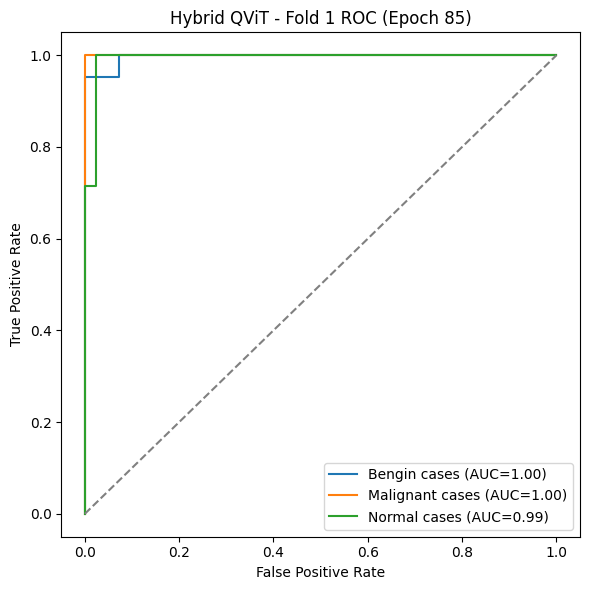

[Fold 1] Epoch 90/100 - TrainLoss: 0.8993  ValAcc: 0.9365  ValAUC_macro: 0.9985  Time: 12.1s


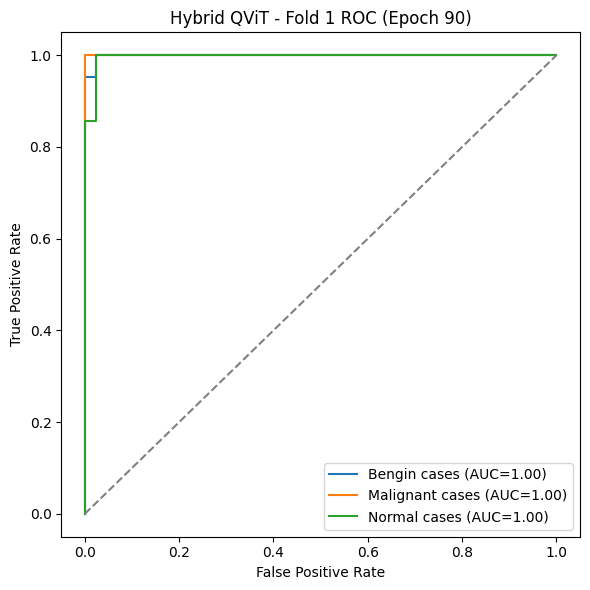

[Fold 1] Epoch 95/100 - TrainLoss: 0.8947  ValAcc: 0.9365  ValAUC_macro: 0.9958  Time: 12.1s


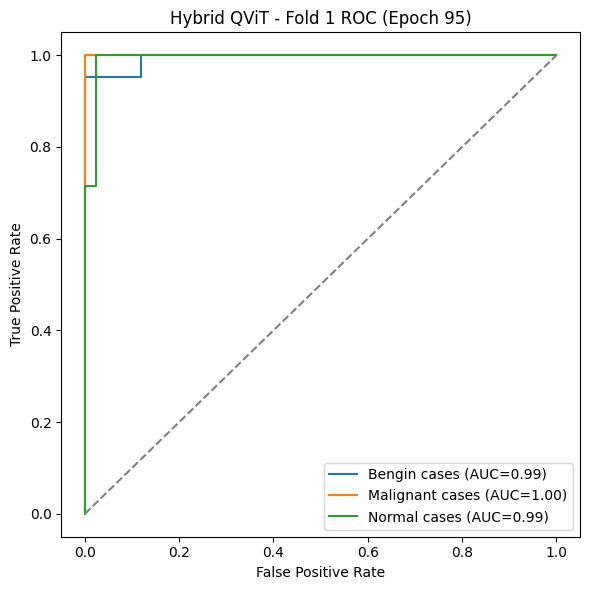

[Fold 1] Epoch 100/100 - TrainLoss: 0.8901  ValAcc: 0.9365  ValAUC_macro: 0.9951  Time: 12.0s


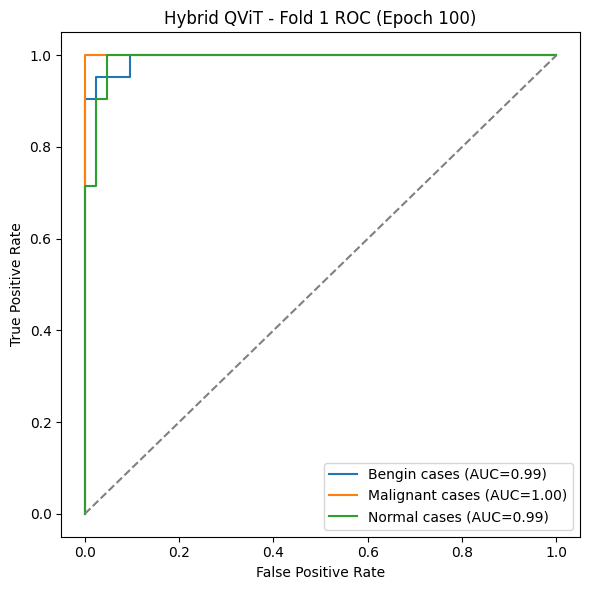

[Fold 1] Summary -> Acc: 0.9206 Prec: 0.9266 Rec: 0.9206 F1: 0.9204 AUC_macro: 0.9955

=== [Hybrid QViT] Fold 2/4 ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold 2] Epoch 1/100 - TrainLoss: 1.0974  ValAcc: 0.3651  ValAUC_macro: 0.8980  Time: 12.0s


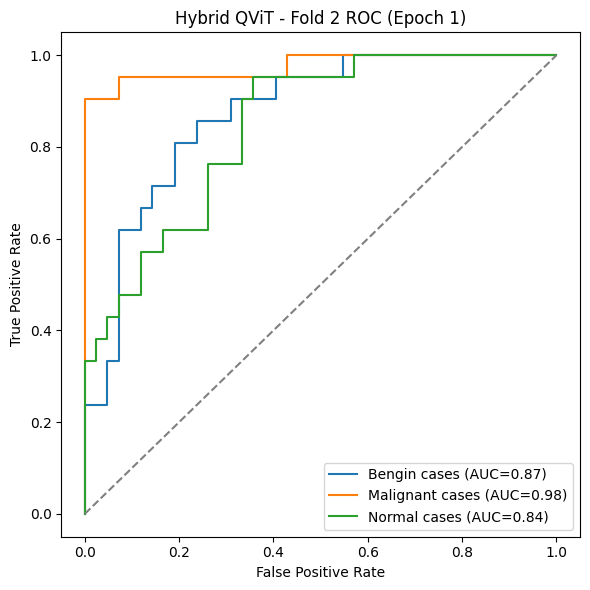

[Fold 2] Epoch 5/100 - TrainLoss: 0.9695  ValAcc: 0.7778  ValAUC_macro: 0.9255  Time: 12.1s


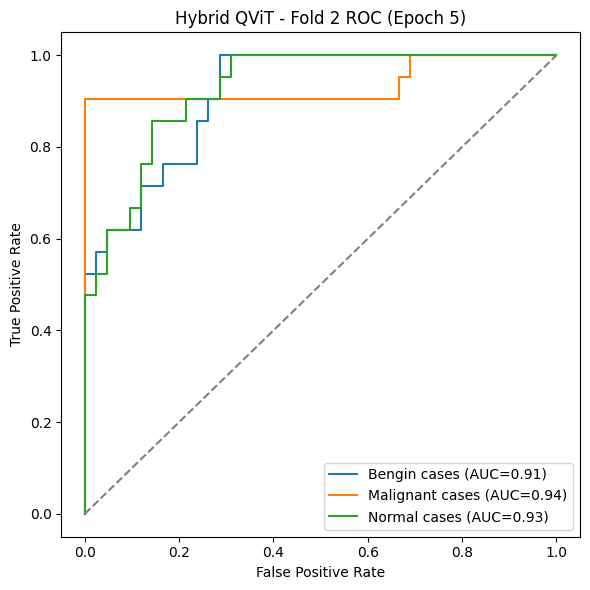

[Fold 2] Epoch 10/100 - TrainLoss: 0.8891  ValAcc: 0.8571  ValAUC_macro: 0.9580  Time: 12.1s


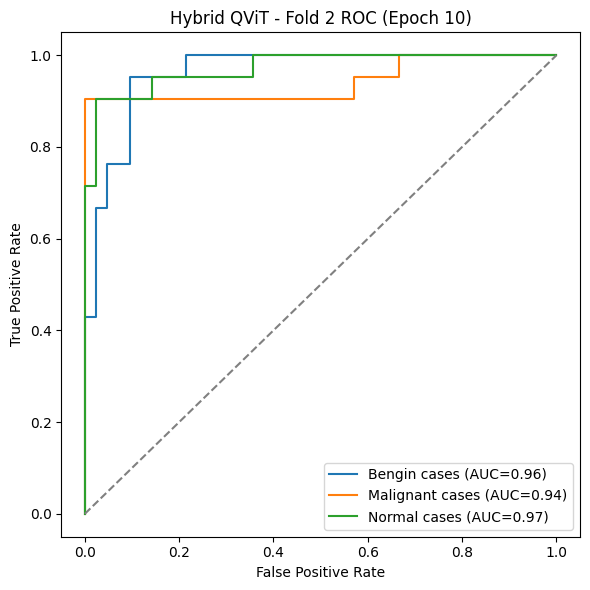

[Fold 2] Epoch 15/100 - TrainLoss: 0.8704  ValAcc: 0.9048  ValAUC_macro: 0.9679  Time: 11.8s


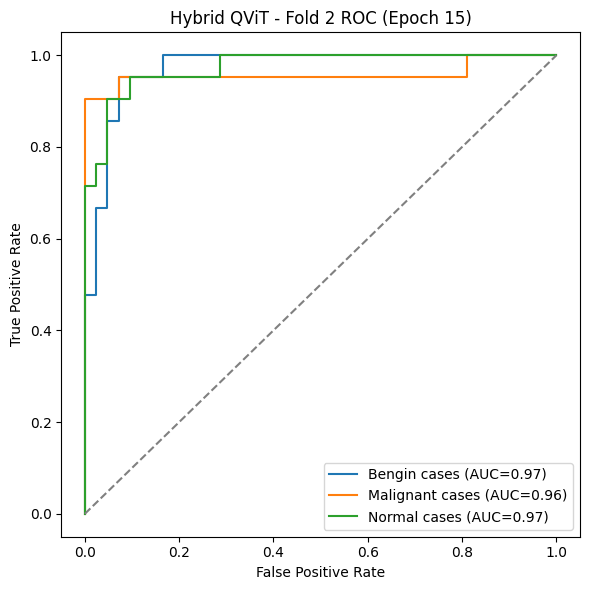

[Fold 2] Epoch 20/100 - TrainLoss: 0.8655  ValAcc: 0.8571  ValAUC_macro: 0.9289  Time: 12.0s


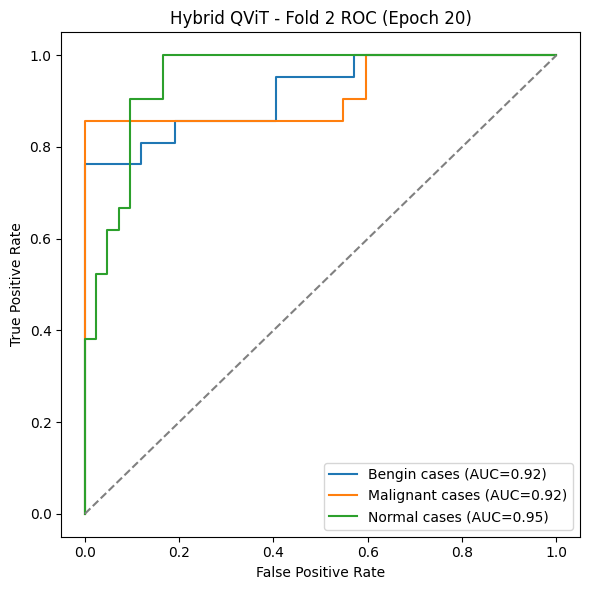

[Fold 2] Epoch 25/100 - TrainLoss: 0.8548  ValAcc: 0.8730  ValAUC_macro: 0.9331  Time: 12.0s


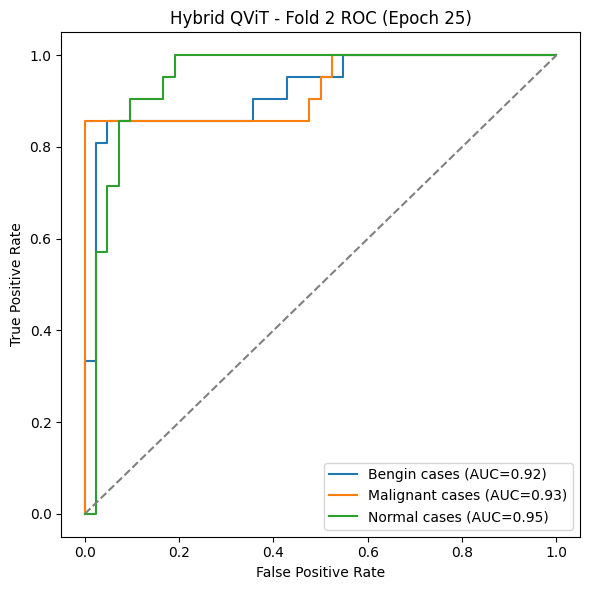

[Fold 2] Epoch 30/100 - TrainLoss: 0.8433  ValAcc: 0.8571  ValAUC_macro: 0.9380  Time: 11.9s


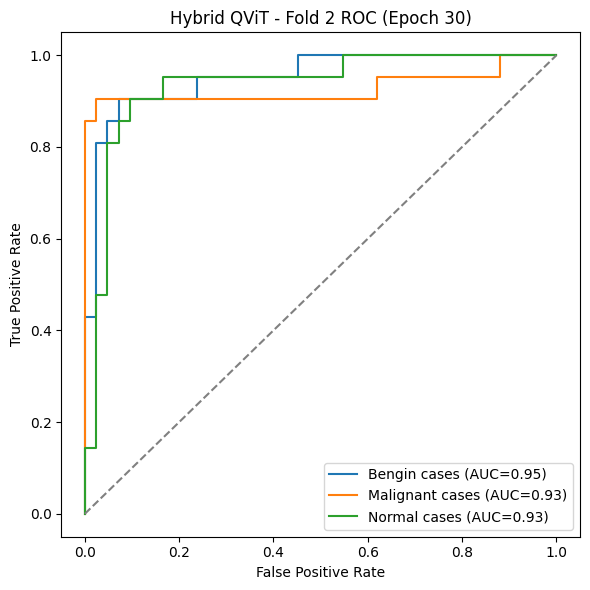

[Fold 2] Epoch 35/100 - TrainLoss: 0.8378  ValAcc: 0.9048  ValAUC_macro: 0.9724  Time: 12.0s


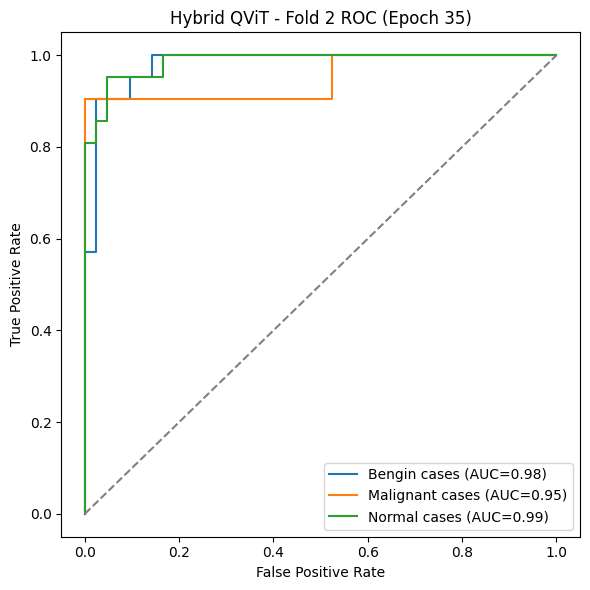

[Fold 2] Epoch 40/100 - TrainLoss: 0.8326  ValAcc: 0.9048  ValAUC_macro: 0.9516  Time: 12.1s


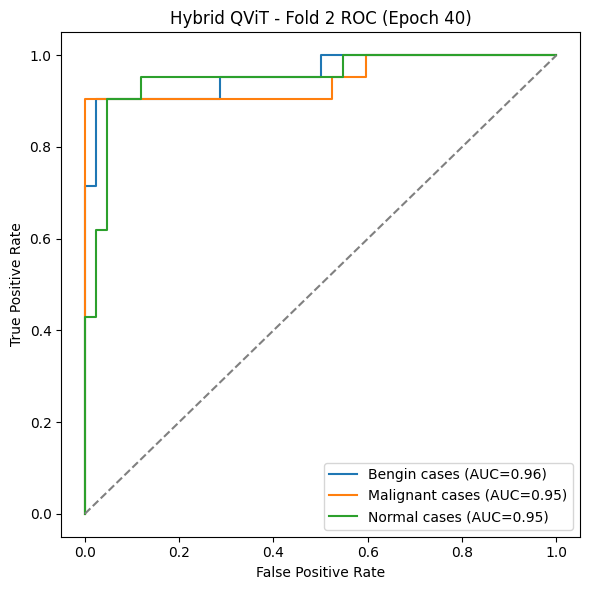

[Fold 2] Epoch 45/100 - TrainLoss: 0.8275  ValAcc: 0.8730  ValAUC_macro: 0.9569  Time: 12.1s


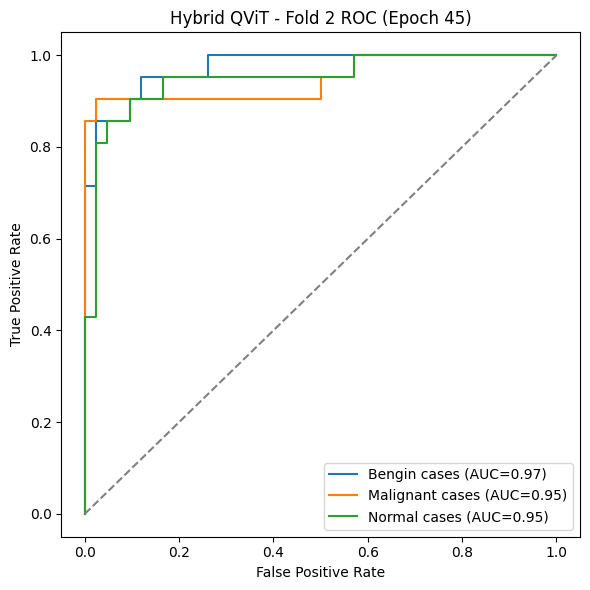

[Fold 2] Epoch 50/100 - TrainLoss: 0.8225  ValAcc: 0.9048  ValAUC_macro: 0.9735  Time: 11.8s


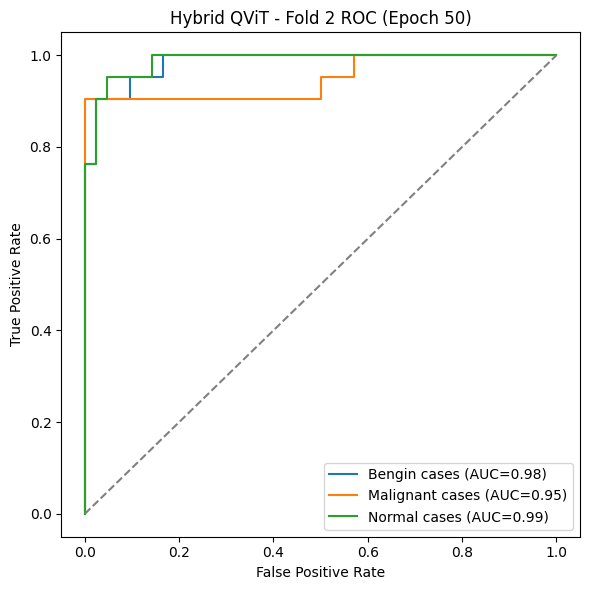

[Fold 2] Epoch 55/100 - TrainLoss: 0.8175  ValAcc: 0.9048  ValAUC_macro: 0.9664  Time: 12.0s


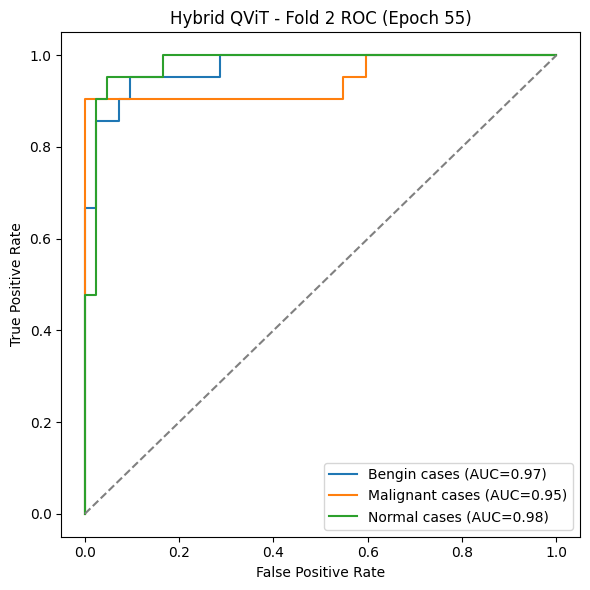

[Fold 2] Epoch 60/100 - TrainLoss: 0.8125  ValAcc: 0.9048  ValAUC_macro: 0.9592  Time: 12.0s


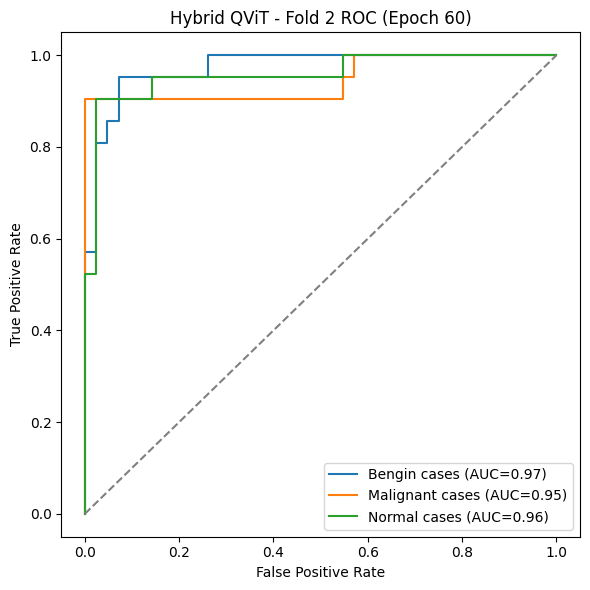

[Fold 2] Epoch 65/100 - TrainLoss: 0.8074  ValAcc: 0.8730  ValAUC_macro: 0.9645  Time: 12.1s


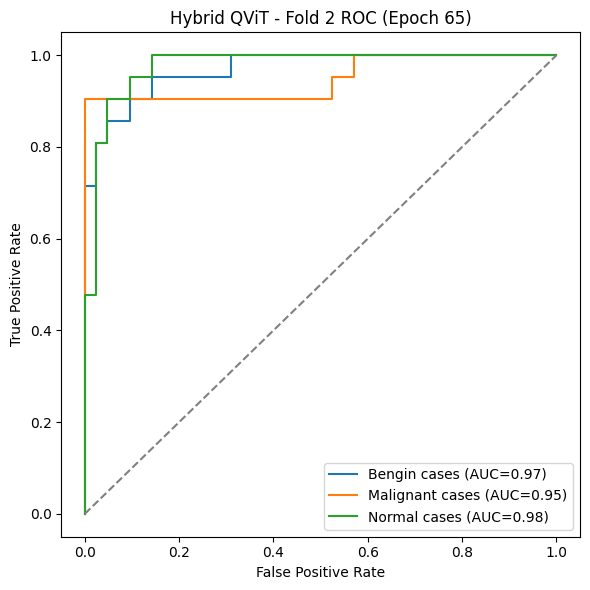

[Fold 2] Epoch 70/100 - TrainLoss: 0.8022  ValAcc: 0.9206  ValAUC_macro: 0.9633  Time: 12.1s


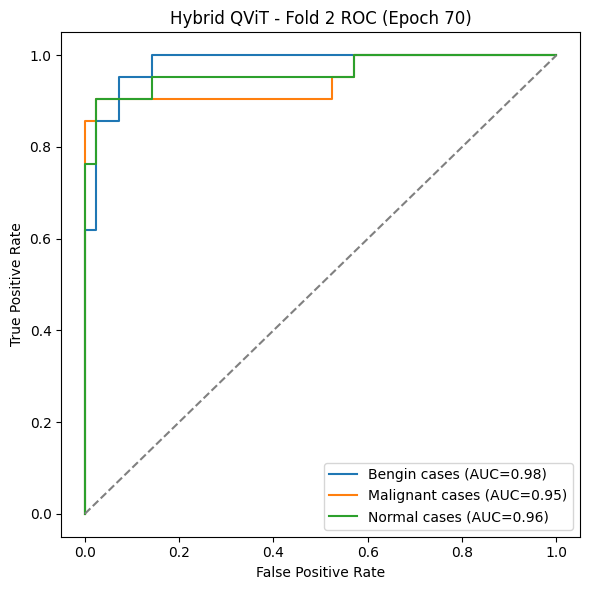

[Fold 2] Epoch 75/100 - TrainLoss: 0.7967  ValAcc: 0.8889  ValAUC_macro: 0.9637  Time: 12.0s


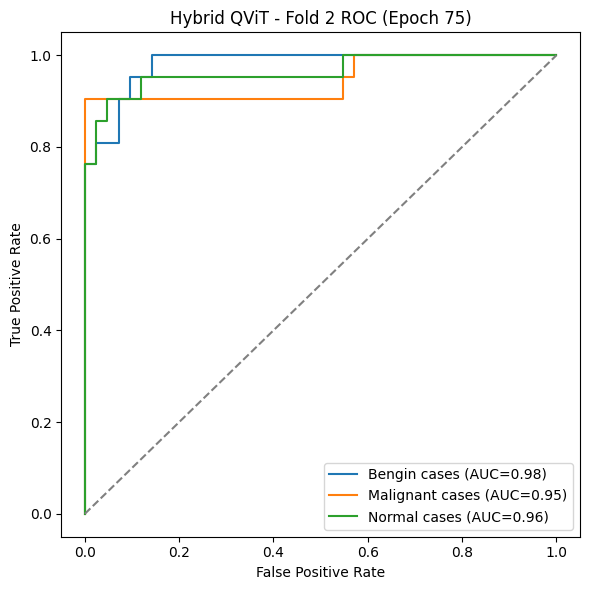

[Fold 2] Epoch 80/100 - TrainLoss: 0.7912  ValAcc: 0.8889  ValAUC_macro: 0.9528  Time: 12.1s


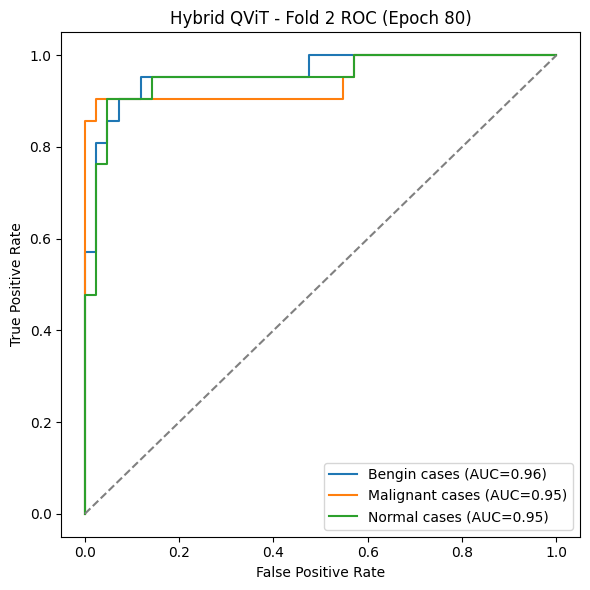

[Fold 2] Epoch 85/100 - TrainLoss: 0.7859  ValAcc: 0.9048  ValAUC_macro: 0.9512  Time: 12.1s


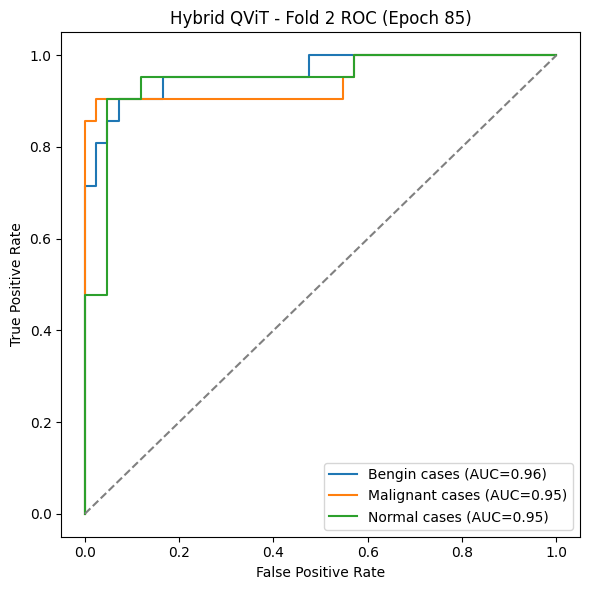

[Fold 2] Epoch 90/100 - TrainLoss: 0.7808  ValAcc: 0.9048  ValAUC_macro: 0.9622  Time: 12.2s


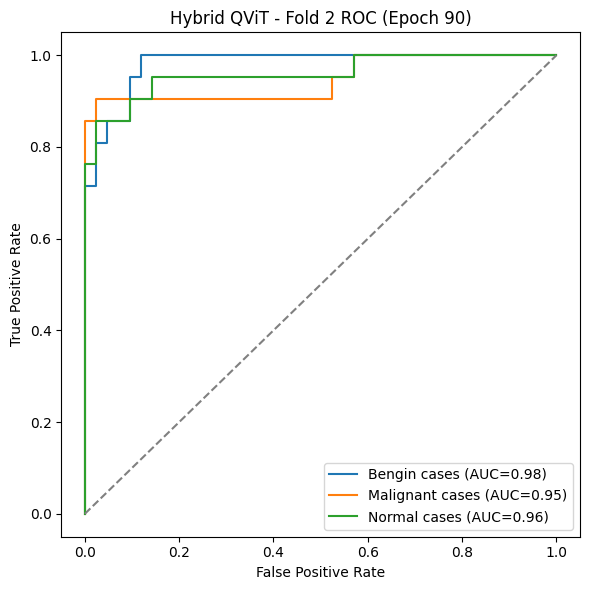

[Fold 2] Epoch 95/100 - TrainLoss: 0.7758  ValAcc: 0.9048  ValAUC_macro: 0.9652  Time: 12.3s


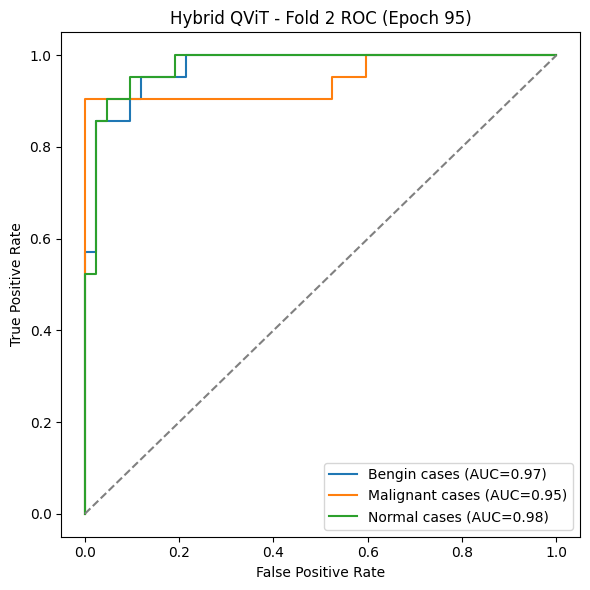

[Fold 2] Epoch 100/100 - TrainLoss: 0.7708  ValAcc: 0.9048  ValAUC_macro: 0.9701  Time: 12.2s


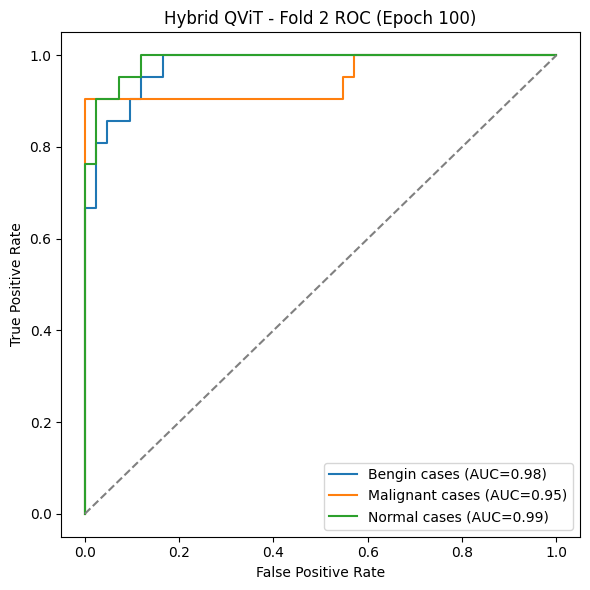

[Fold 2] Summary -> Acc: 0.9048 Prec: 0.9103 Rec: 0.9048 F1: 0.9061 AUC_macro: 0.9611

=== [Hybrid QViT] Fold 3/4 ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold 3] Epoch 1/100 - TrainLoss: 1.0944  ValAcc: 0.4921  ValAUC_macro: 0.7453  Time: 12.1s


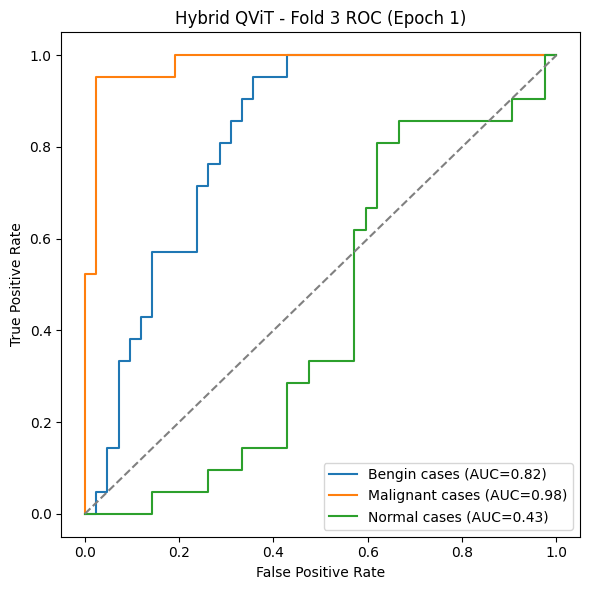

[Fold 3] Epoch 5/100 - TrainLoss: 1.0024  ValAcc: 0.8095  ValAUC_macro: 0.8881  Time: 12.4s


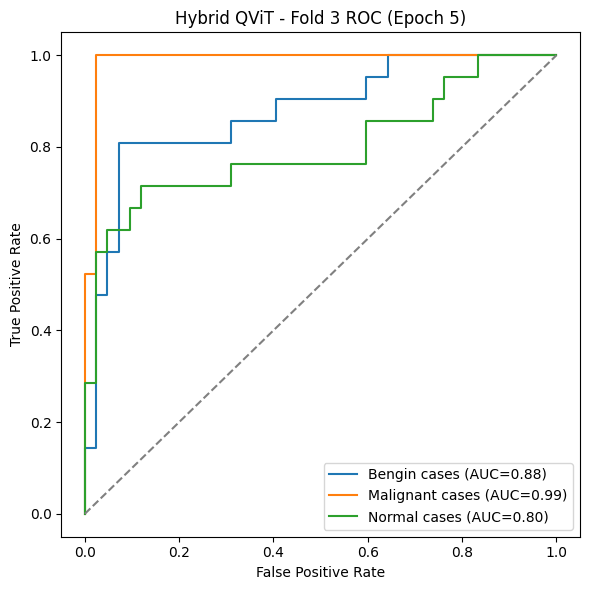

[Fold 3] Epoch 10/100 - TrainLoss: 0.9667  ValAcc: 0.7937  ValAUC_macro: 0.9067  Time: 12.2s


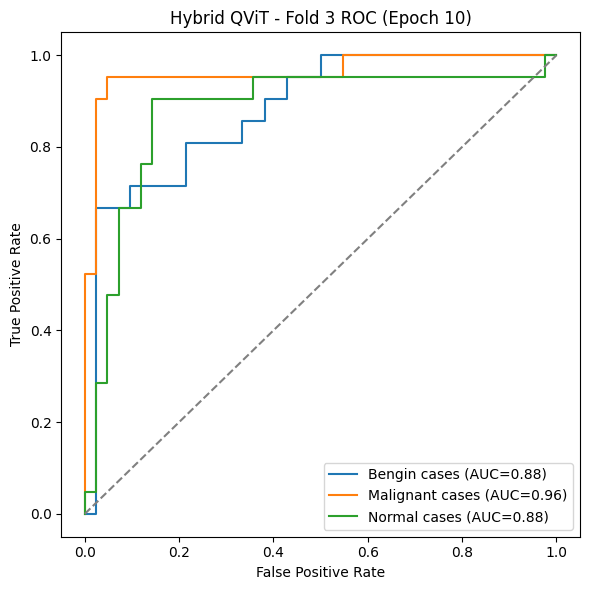

[Fold 3] Epoch 15/100 - TrainLoss: 0.9411  ValAcc: 0.8413  ValAUC_macro: 0.9301  Time: 12.1s


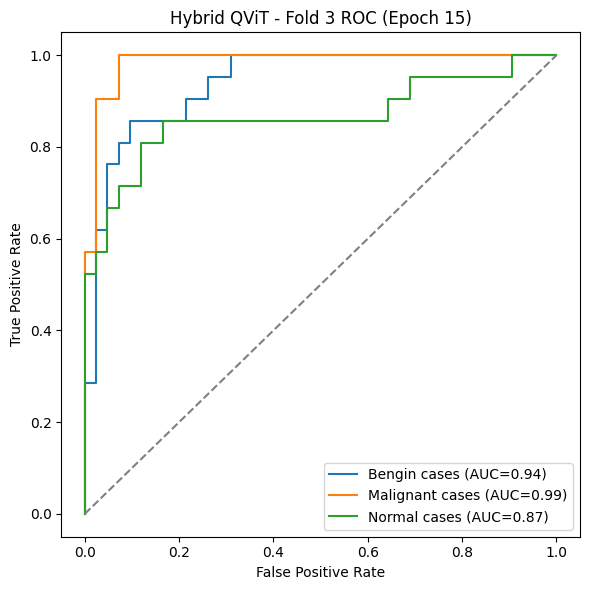

[Fold 3] Epoch 20/100 - TrainLoss: 0.9317  ValAcc: 0.8413  ValAUC_macro: 0.9346  Time: 12.1s


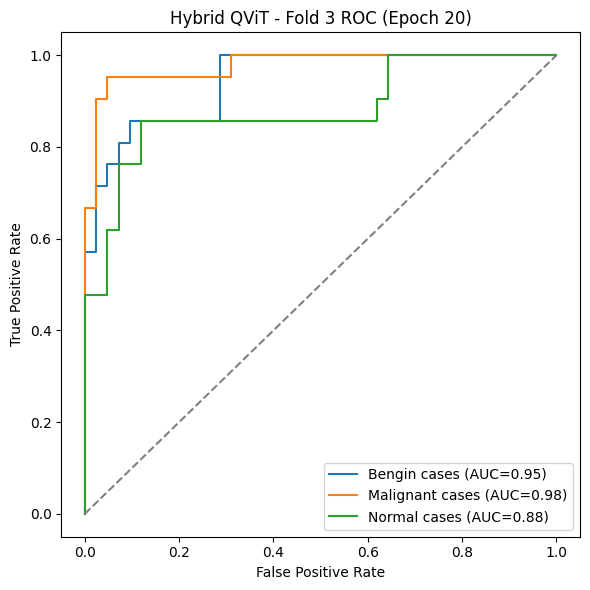

[Fold 3] Epoch 25/100 - TrainLoss: 0.9337  ValAcc: 0.8571  ValAUC_macro: 0.8923  Time: 12.0s


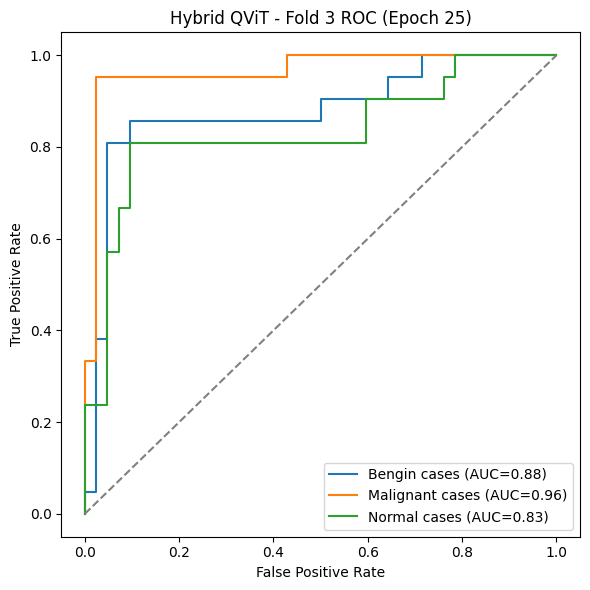

[Fold 3] Epoch 30/100 - TrainLoss: 0.9301  ValAcc: 0.7937  ValAUC_macro: 0.8715  Time: 12.0s


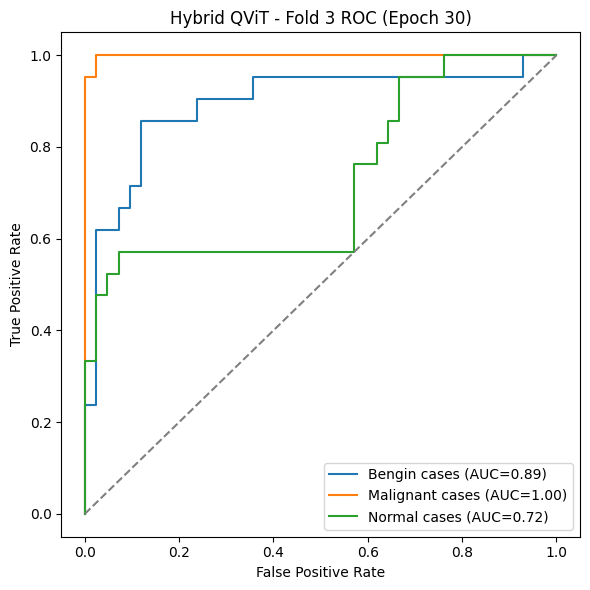

[Fold 3] Epoch 35/100 - TrainLoss: 0.9135  ValAcc: 0.8730  ValAUC_macro: 0.9089  Time: 12.3s


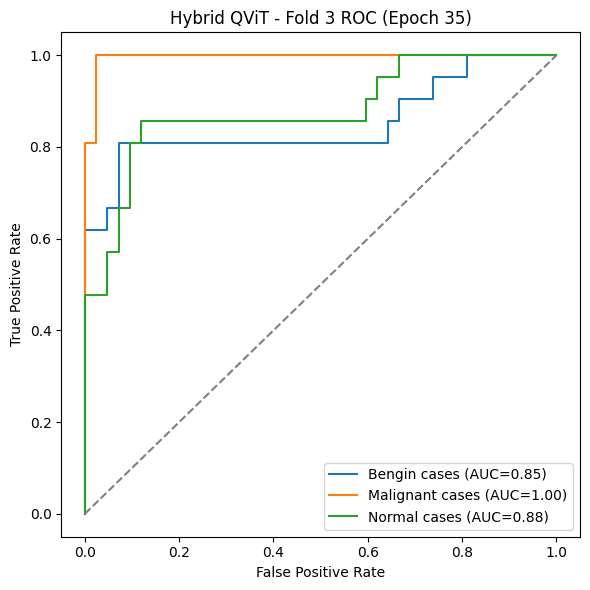

[Fold 3] Epoch 40/100 - TrainLoss: 0.8959  ValAcc: 0.8571  ValAUC_macro: 0.8957  Time: 12.7s


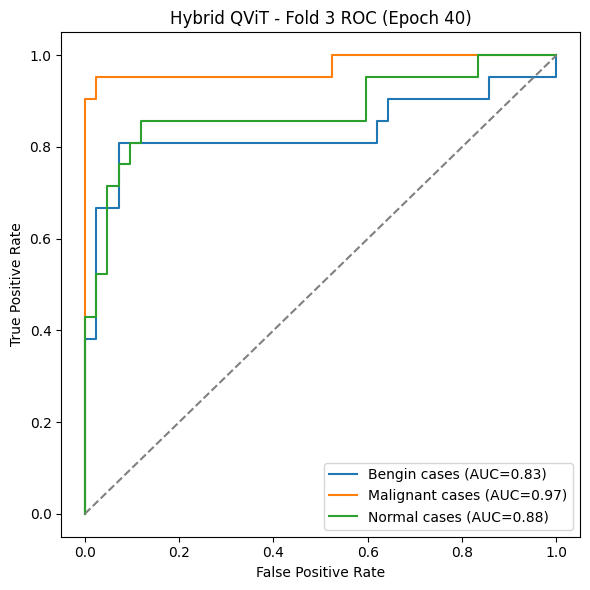

[Fold 3] Epoch 45/100 - TrainLoss: 0.8879  ValAcc: 0.8889  ValAUC_macro: 0.9187  Time: 11.9s


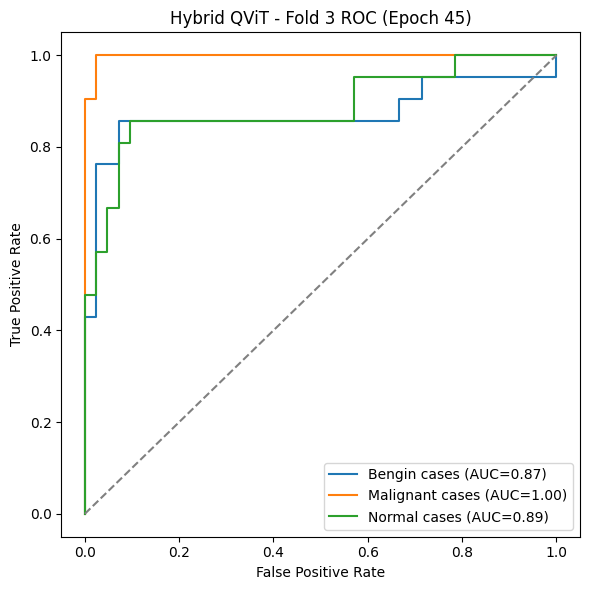

[Fold 3] Epoch 50/100 - TrainLoss: 0.8784  ValAcc: 0.8413  ValAUC_macro: 0.9006  Time: 12.1s


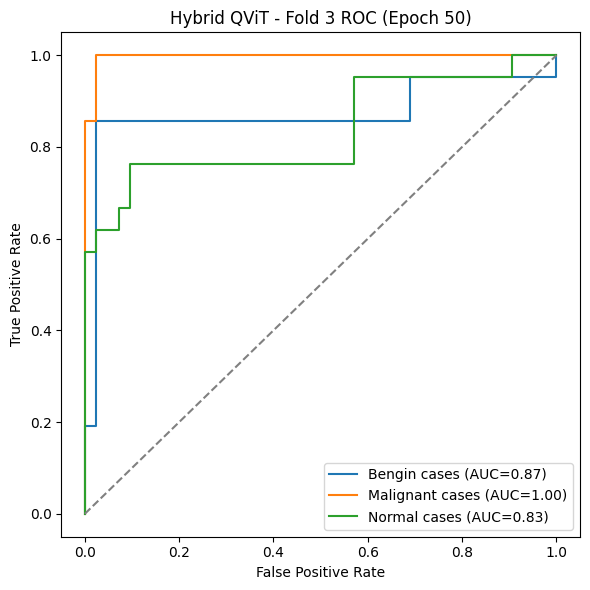

[Fold 3] Epoch 55/100 - TrainLoss: 0.8696  ValAcc: 0.8730  ValAUC_macro: 0.9169  Time: 12.1s


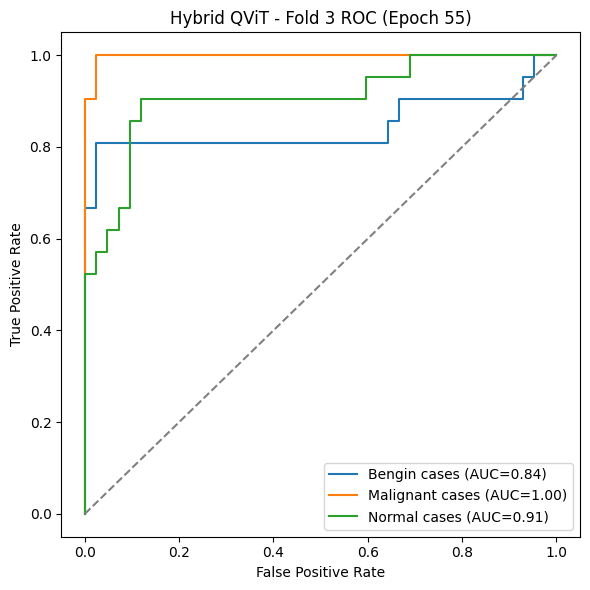

[Fold 3] Epoch 60/100 - TrainLoss: 0.8616  ValAcc: 0.8730  ValAUC_macro: 0.9074  Time: 12.3s


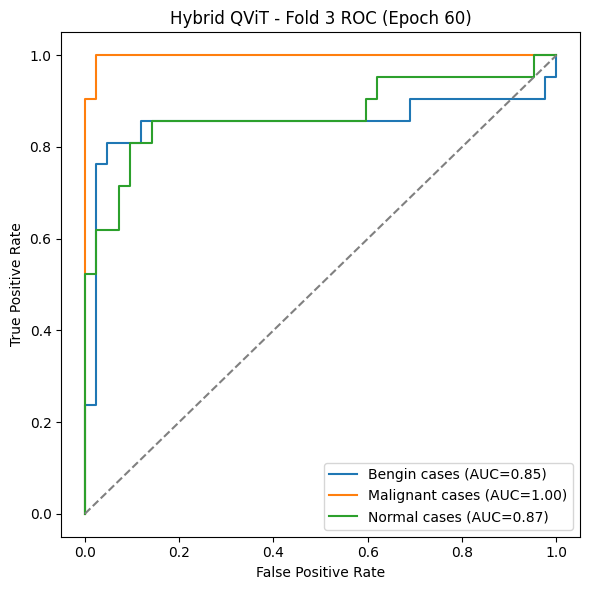

[Fold 3] Epoch 65/100 - TrainLoss: 0.8541  ValAcc: 0.8889  ValAUC_macro: 0.9153  Time: 12.0s


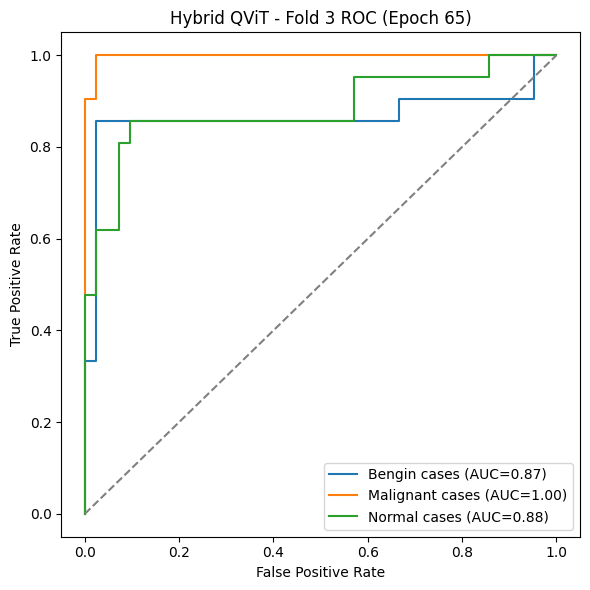

[Fold 3] Epoch 70/100 - TrainLoss: 0.8469  ValAcc: 0.8889  ValAUC_macro: 0.9297  Time: 12.4s


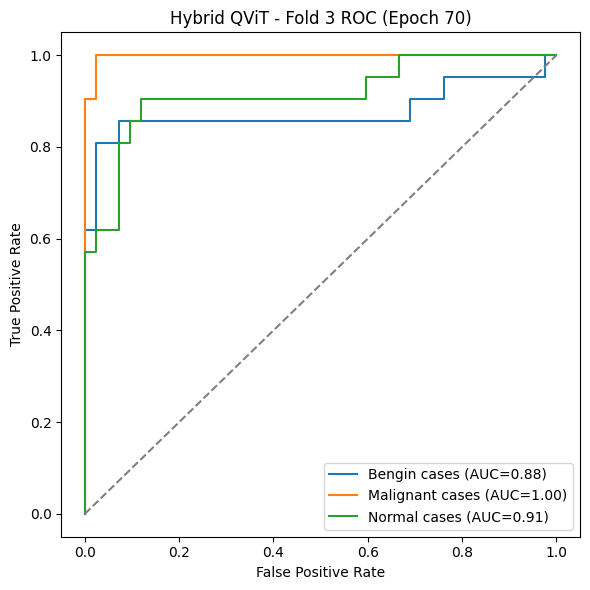

[Fold 3] Epoch 75/100 - TrainLoss: 0.8397  ValAcc: 0.8889  ValAUC_macro: 0.9267  Time: 12.1s


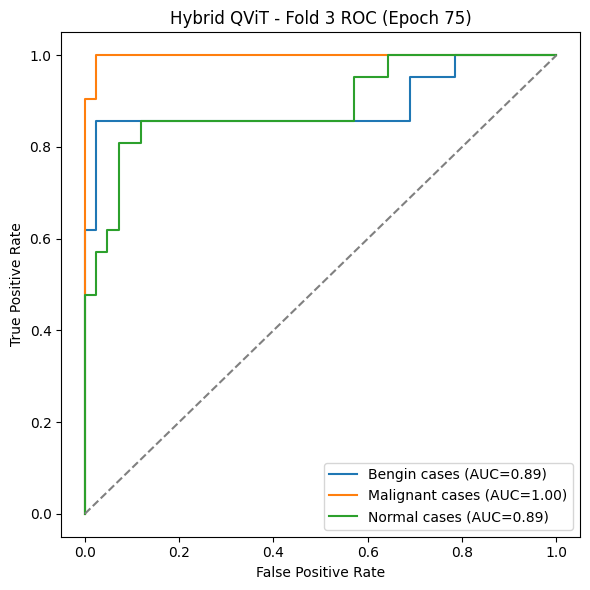

[Fold 3] Epoch 80/100 - TrainLoss: 0.8320  ValAcc: 0.8730  ValAUC_macro: 0.9301  Time: 12.1s


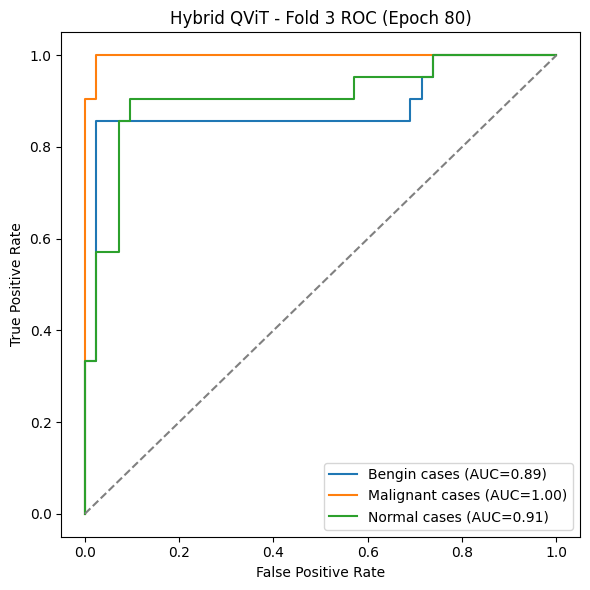

[Fold 3] Epoch 85/100 - TrainLoss: 0.8248  ValAcc: 0.8730  ValAUC_macro: 0.9233  Time: 12.1s


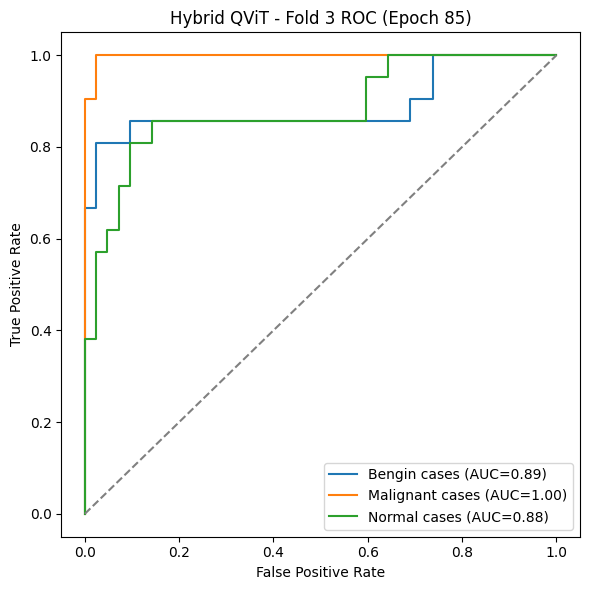

[Fold 3] Epoch 90/100 - TrainLoss: 0.8175  ValAcc: 0.8730  ValAUC_macro: 0.9259  Time: 12.2s


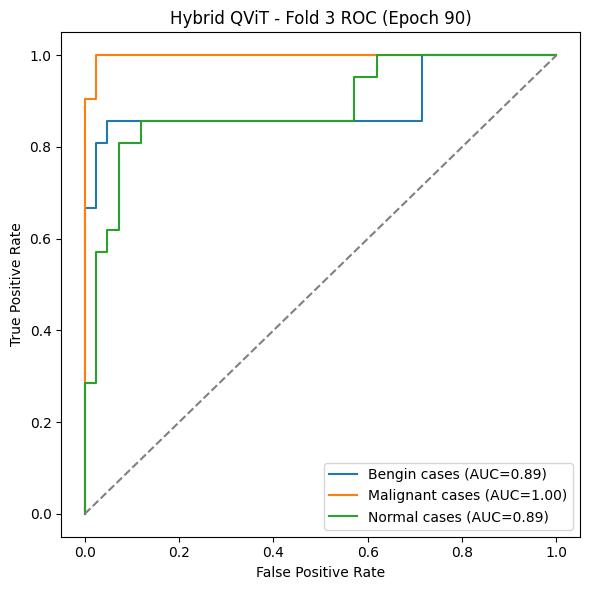

[Fold 3] Epoch 95/100 - TrainLoss: 0.8104  ValAcc: 0.8889  ValAUC_macro: 0.9240  Time: 12.3s


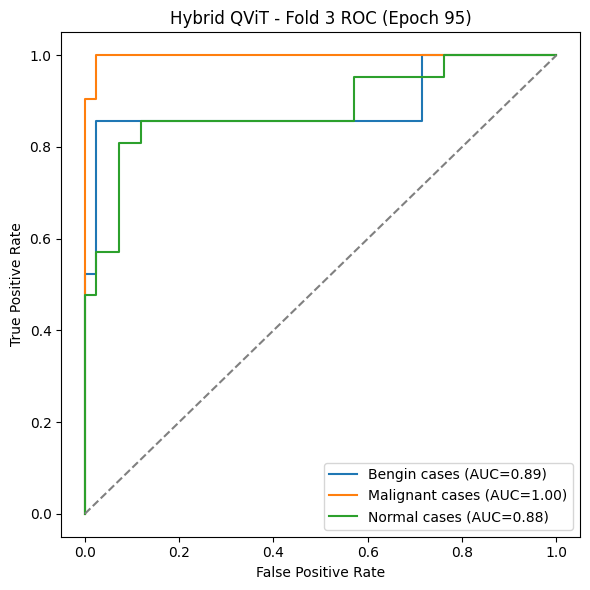

[Fold 3] Epoch 100/100 - TrainLoss: 0.8032  ValAcc: 0.8571  ValAUC_macro: 0.9240  Time: 12.0s


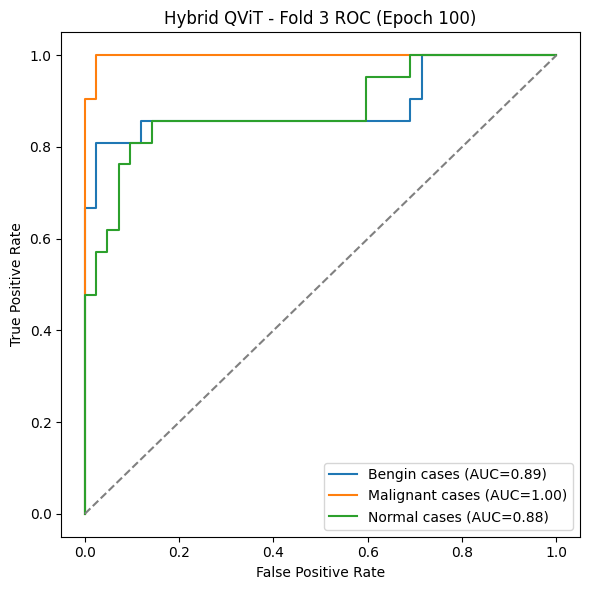

[Fold 3] Summary -> Acc: 0.9048 Prec: 0.9039 Rec: 0.9048 F1: 0.9040 AUC_macro: 0.9312

=== [Hybrid QViT] Fold 4/4 ===


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[Fold 4] Epoch 1/100 - TrainLoss: 1.0983  ValAcc: 0.3333  ValAUC_macro: 0.8696  Time: 12.1s


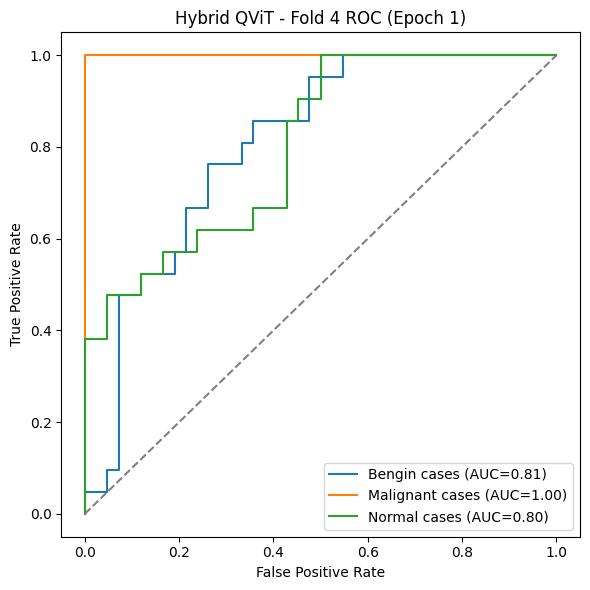

[Fold 4] Epoch 5/100 - TrainLoss: 0.9493  ValAcc: 0.6349  ValAUC_macro: 0.9546  Time: 15.6s


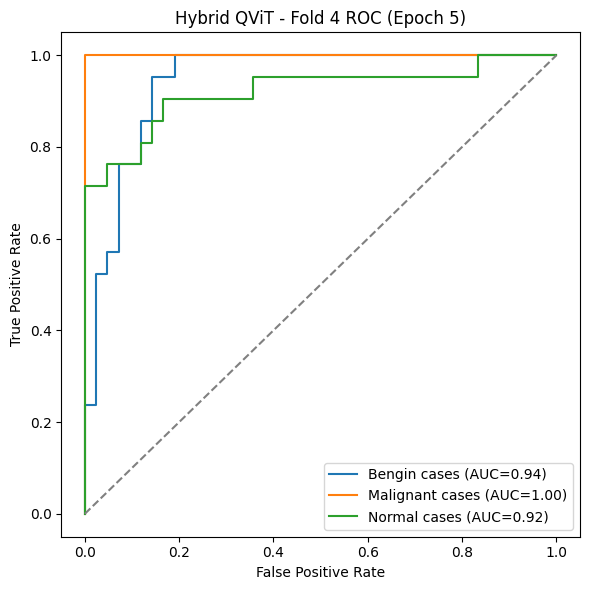

[Fold 4] Epoch 10/100 - TrainLoss: 0.9049  ValAcc: 0.8571  ValAUC_macro: 0.9626  Time: 12.2s


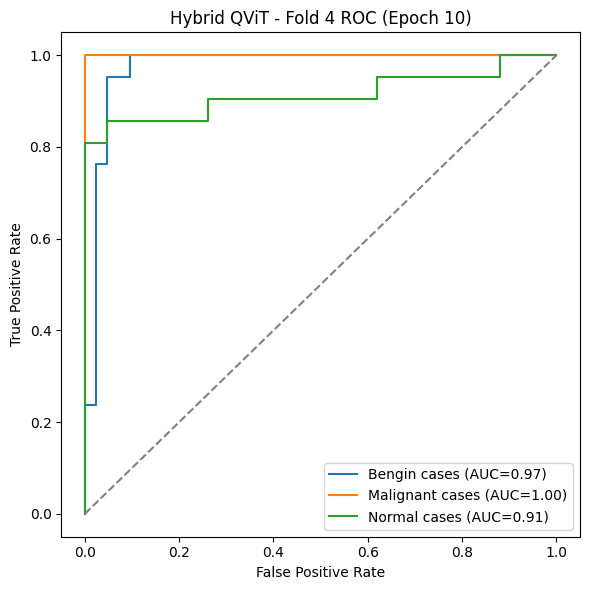

[Fold 4] Epoch 15/100 - TrainLoss: 0.8858  ValAcc: 0.9365  ValAUC_macro: 0.9577  Time: 11.9s


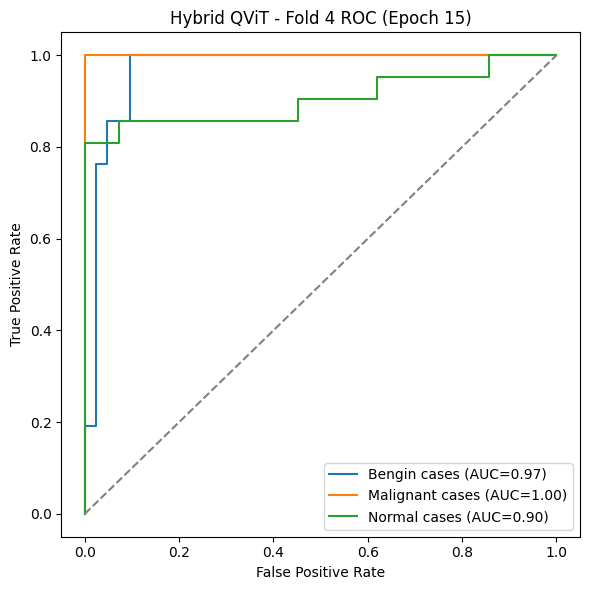

[Fold 4] Epoch 20/100 - TrainLoss: 0.8787  ValAcc: 0.9206  ValAUC_macro: 0.9796  Time: 13.2s


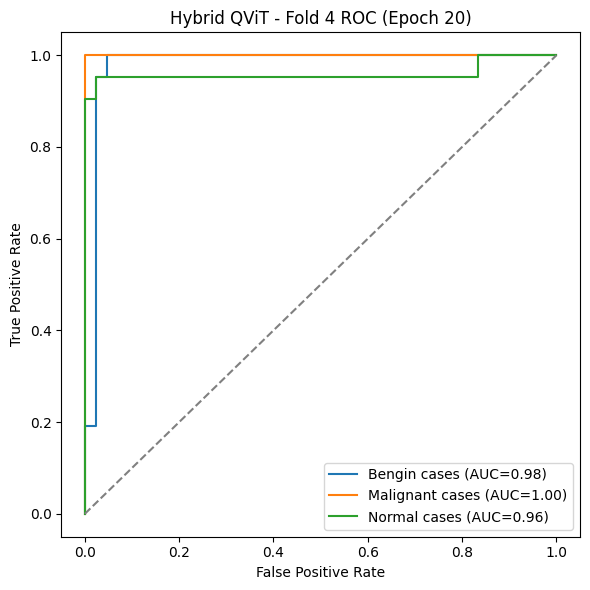

[Fold 4] Epoch 25/100 - TrainLoss: 0.8679  ValAcc: 0.9365  ValAUC_macro: 0.9777  Time: 12.2s


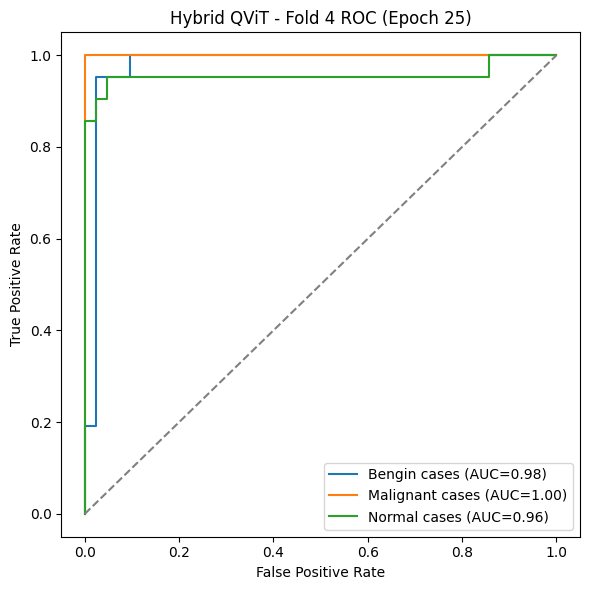

[Fold 4] Epoch 30/100 - TrainLoss: 0.8618  ValAcc: 0.9365  ValAUC_macro: 0.9671  Time: 12.2s


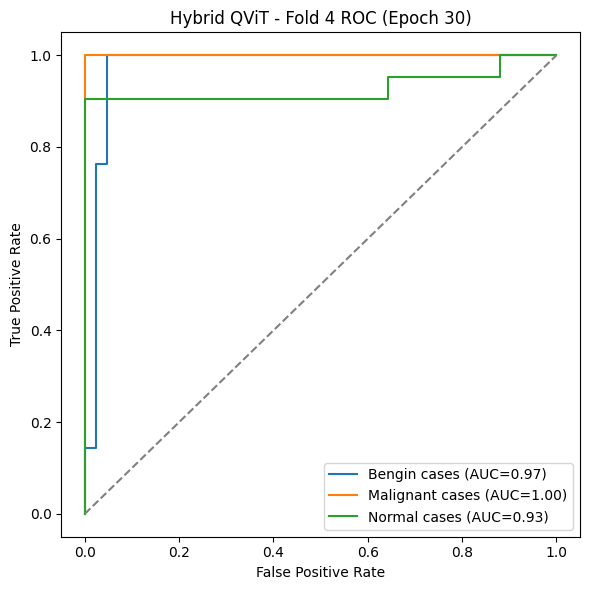

[Fold 4] Epoch 35/100 - TrainLoss: 0.8556  ValAcc: 0.9365  ValAUC_macro: 0.9743  Time: 12.4s


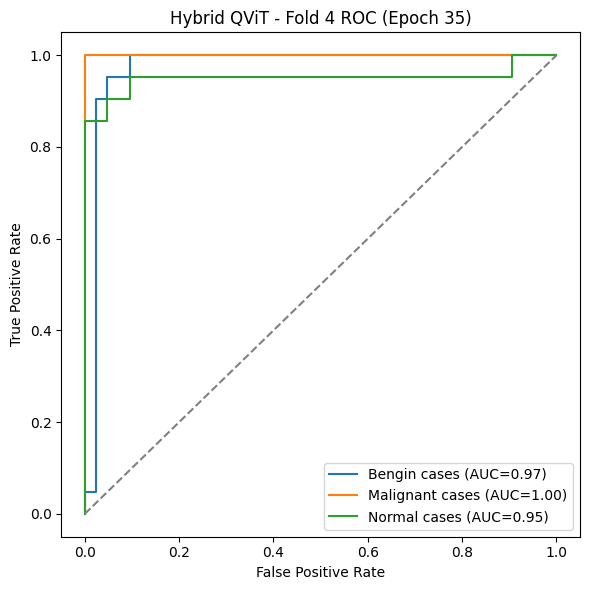

[Fold 4] Epoch 40/100 - TrainLoss: 0.8498  ValAcc: 0.9365  ValAUC_macro: 0.9645  Time: 12.5s


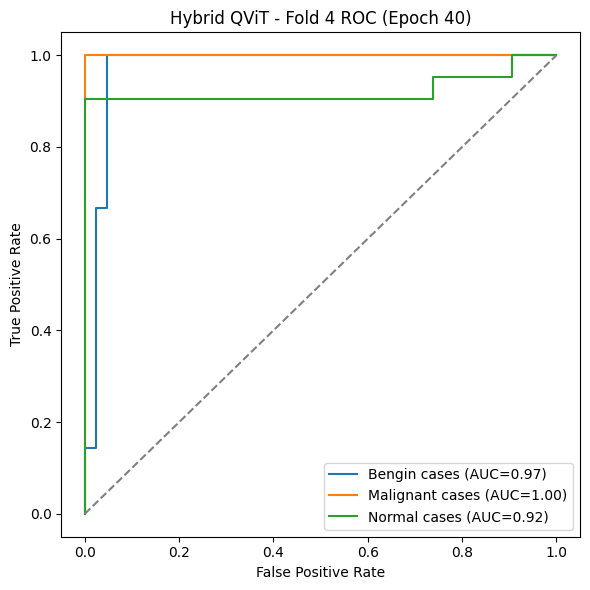

[Fold 4] Epoch 45/100 - TrainLoss: 0.8441  ValAcc: 0.9365  ValAUC_macro: 0.9720  Time: 12.4s


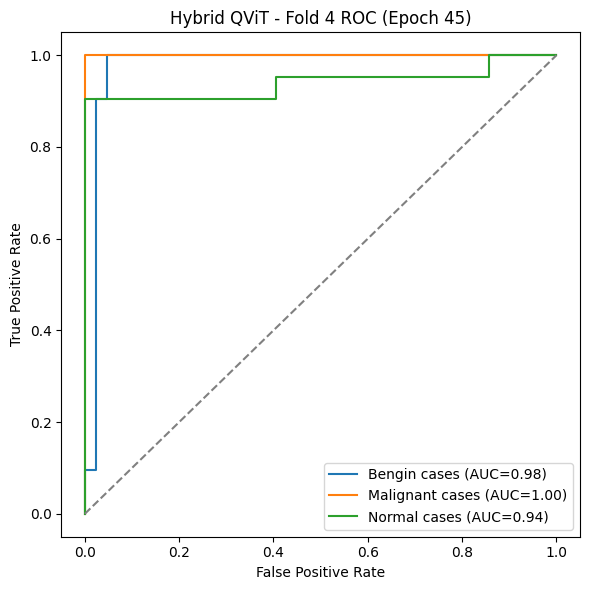

[Fold 4] Epoch 50/100 - TrainLoss: 0.8382  ValAcc: 0.9365  ValAUC_macro: 0.9637  Time: 12.3s


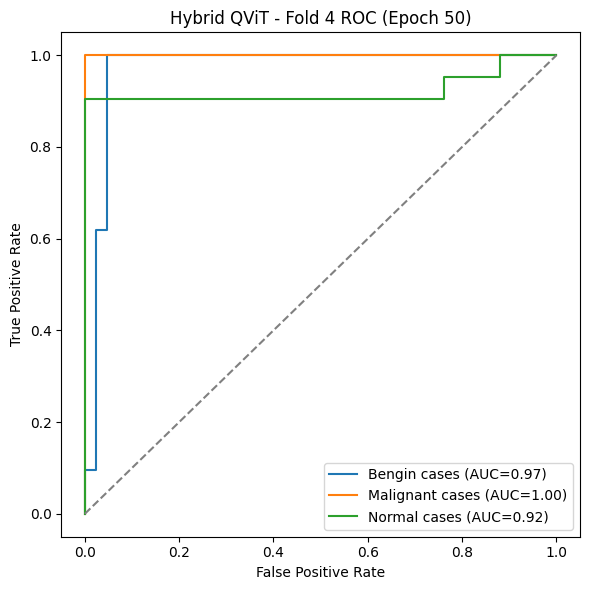

[Fold 4] Epoch 55/100 - TrainLoss: 0.8328  ValAcc: 0.9365  ValAUC_macro: 0.9803  Time: 12.5s


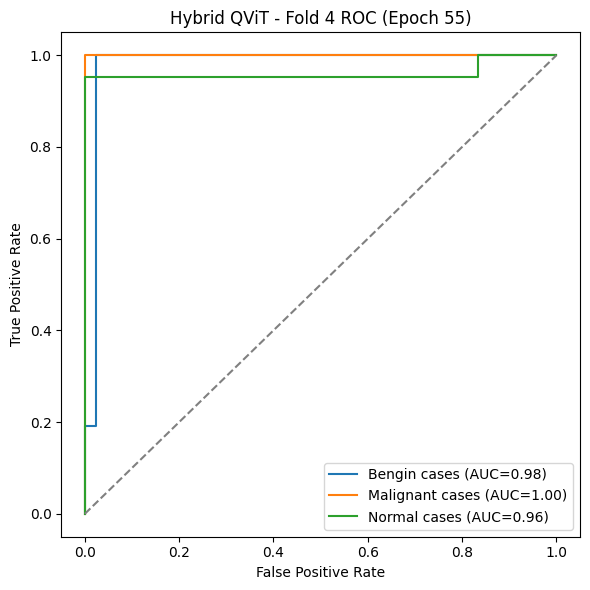

[Fold 4] Epoch 60/100 - TrainLoss: 0.8256  ValAcc: 0.9365  ValAUC_macro: 0.9709  Time: 11.8s


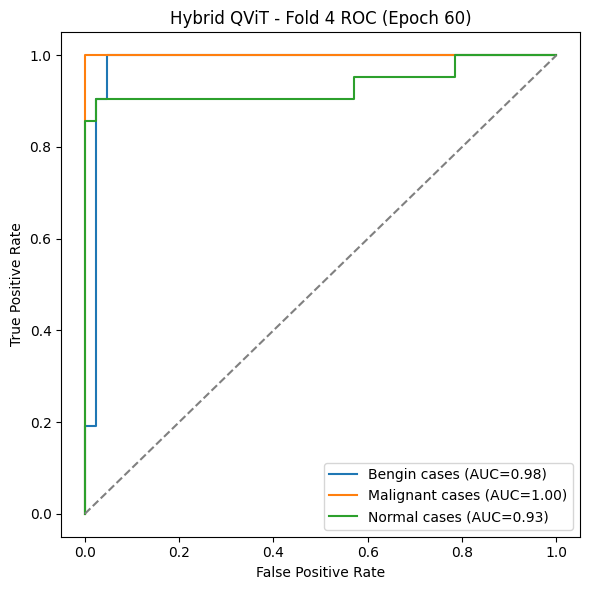

[Fold 4] Epoch 65/100 - TrainLoss: 0.8364  ValAcc: 0.8730  ValAUC_macro: 0.9354  Time: 12.2s


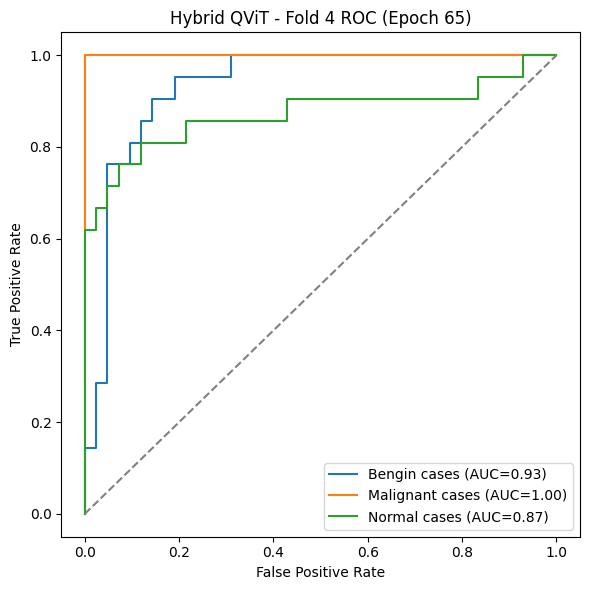

[Fold 4] Epoch 70/100 - TrainLoss: 0.8220  ValAcc: 0.8571  ValAUC_macro: 0.9278  Time: 12.7s


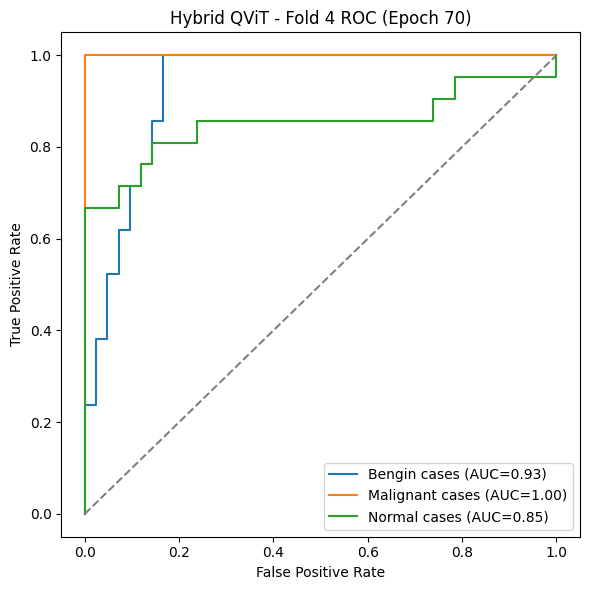

[Fold 4] Epoch 75/100 - TrainLoss: 0.8103  ValAcc: 0.8889  ValAUC_macro: 0.9150  Time: 12.1s


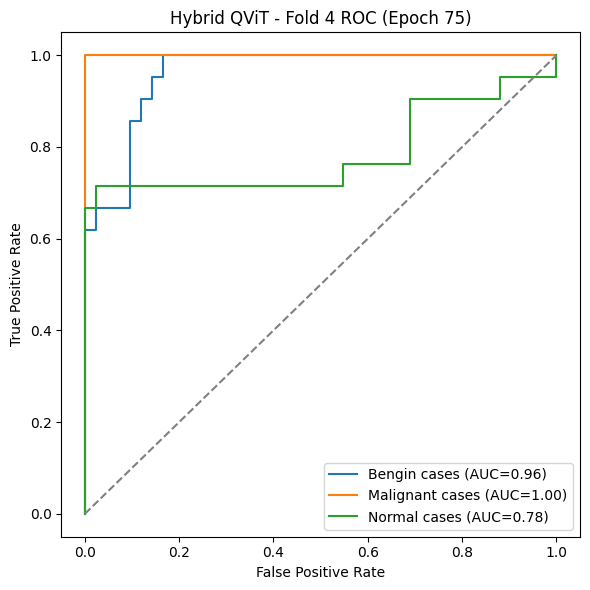

[Fold 4] Epoch 80/100 - TrainLoss: 0.8037  ValAcc: 0.8889  ValAUC_macro: 0.9324  Time: 12.5s


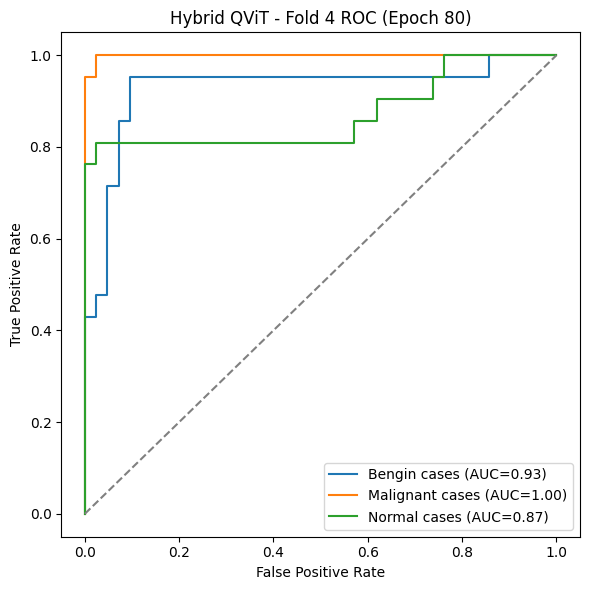

[Fold 4] Epoch 85/100 - TrainLoss: 0.7961  ValAcc: 0.8730  ValAUC_macro: 0.9308  Time: 11.9s


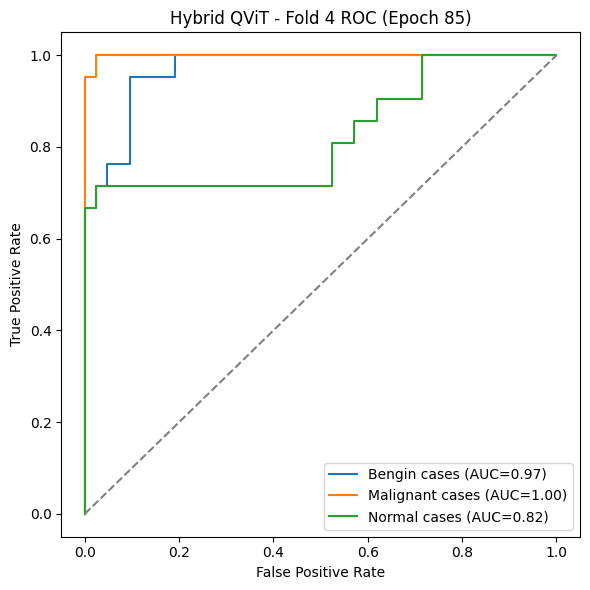

[Fold 4] Epoch 90/100 - TrainLoss: 0.7889  ValAcc: 0.8889  ValAUC_macro: 0.9433  Time: 12.5s


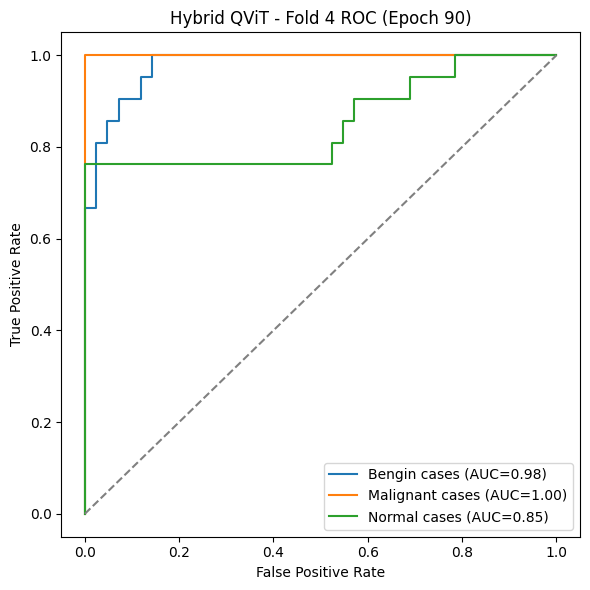

[Fold 4] Epoch 95/100 - TrainLoss: 0.7760  ValAcc: 0.9048  ValAUC_macro: 0.9327  Time: 12.1s


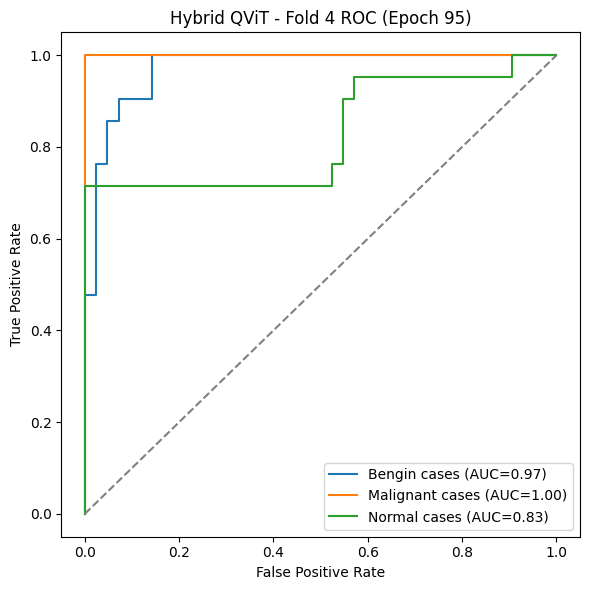

[Fold 4] Epoch 100/100 - TrainLoss: 0.7680  ValAcc: 0.8730  ValAUC_macro: 0.9176  Time: 12.1s


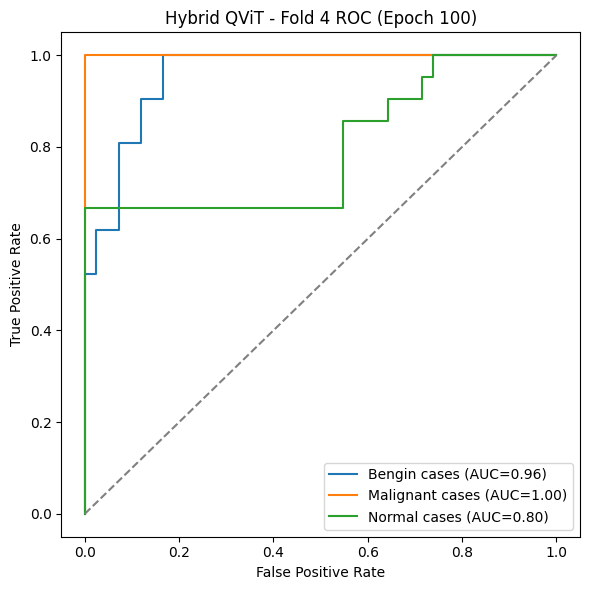

[Fold 4] Summary -> Acc: 0.8889 Prec: 0.9079 Rec: 0.8889 F1: 0.8870 AUC_macro: 0.9301

=== Hybrid Quantum ViT - CV Summary (4 folds) ===
Fold 1: Acc=0.9206 Prec=0.9266 Rec=0.9206 F1=0.9204 AUC=0.9955
Fold 2: Acc=0.9048 Prec=0.9103 Rec=0.9048 F1=0.9061 AUC=0.9611
Fold 3: Acc=0.9048 Prec=0.9039 Rec=0.9048 F1=0.9040 AUC=0.9312
Fold 4: Acc=0.8889 Prec=0.9079 Rec=0.8889 F1=0.8870 AUC=0.9301
Mean Acc: 0.9047619047619048
Mean AUC: 0.9544595616024187


In [ ]:
# ---------------------------
# 11) 4-Fold Cross-Validation for Hybrid Quantum ViT
# ---------------------------
fold_results_qvit = []
fold_no = 0

for train_idx, val_idx in skf.split(train_indices_for_kfold, train_labels_for_kfold):
    fold_no += 1
    print(f"\n=== [Hybrid QViT] Fold {fold_no}/{K_FOLDS} ===")

    fold_train_ds = Subset(train_dataset, train_idx)
    fold_val_ds   = Subset(train_dataset, val_idx)

    fold_train_loader = DataLoader(fold_train_ds, batch_size=BATCH_SIZE, shuffle=True,
                                   num_workers=2, pin_memory=True)
    fold_val_loader   = DataLoader(fold_val_ds, batch_size=BATCH_SIZE, shuffle=False,
                                   num_workers=2, pin_memory=True)

    # Fresh Hybrid QViT for each fold
    qvit_model_fold = HybridQuantumViT(MODEL_NAME, config, NUM_CLASSES, quantum_layer).to(DEVICE)
    optimizer_qvit_fold = torch.optim.AdamW(qvit_model_fold.parameters(), lr=LR)

    for epoch in range(1, NUM_EPOCHS_QVIT + 1):
        t0 = time.time()
        train_loss_qvit = train_one_epoch_qvit(qvit_model_fold, fold_train_loader, optimizer_qvit_fold, DEVICE)
        val_probs, val_preds, val_labels = evaluate_qvit(qvit_model_fold, fold_val_loader, DEVICE)
        t1 = time.time()

        val_acc = accuracy_score(val_labels, val_preds) if val_labels.size else 0.0

        try:
            val_auc_macro = roc_auc_score(
                label_binarize(val_labels, classes=list(range(NUM_CLASSES))),
                val_probs,
                average='macro',
                multi_class='ovo'
            )
        except Exception:
            val_auc_macro = float('nan')

        if epoch == 1 or epoch % PLOT_EVERY == 0 or epoch == NUM_EPOCHS_QVIT:
            print(f"[Fold {fold_no}] Epoch {epoch}/{NUM_EPOCHS_QVIT} "
                  f"- TrainLoss: {train_loss_qvit:.4f}  ValAcc: {val_acc:.4f}  "
                  f"ValAUC_macro: {val_auc_macro:.4f}  Time: {t1 - t0:.1f}s")

            if val_labels.size:
                plot_multiclass_roc(val_labels, val_probs, class_names,
                                    title=f"Hybrid QViT - Fold {fold_no} ROC (Epoch {epoch})")

    # Final metrics for this fold
    val_probs, val_preds, val_labels = evaluate_qvit(qvit_model_fold, fold_val_loader, DEVICE)

    try:
        val_auc_macro = roc_auc_score(
            label_binarize(val_labels, classes=list(range(NUM_CLASSES))),
            val_probs,
            average='macro',
            multi_class='ovo'
        )
    except Exception:
        val_auc_macro = float('nan')

    prec, rec, f1, _ = precision_recall_fscore_support(
        val_labels, val_preds, average='macro', zero_division=0
    )
    acc = accuracy_score(val_labels, val_preds)

    print(f"[Fold {fold_no}] Summary -> Acc: {acc:.4f} Prec: {prec:.4f} "
          f"Rec: {rec:.4f} F1: {f1:.4f} AUC_macro: {val_auc_macro:.4f}")

    fold_results_qvit.append({
        "fold": fold_no,
        "acc": acc,
        "prec": prec,
        "rec": rec,
        "f1": f1,
        "auc": val_auc_macro,
    })

print("\n=== Hybrid Quantum ViT - CV Summary (4 folds) ===")
for r in fold_results_qvit:
    print(f"Fold {r['fold']}: Acc={r['acc']:.4f} Prec={r['prec']:.4f} "
          f"Rec={r['rec']:.4f} F1={r['f1']:.4f} AUC={r['auc']:.4f}")
print("Mean Acc:", np.mean([r['acc'] for r in fold_results_qvit]))
print("Mean AUC:", np.nanmean([r['auc'] for r in fold_results_qvit]))

This block trains the final Hybrid Quantum ViT on the full training set and then evaluates it once on the held-out test set.
After training, it predicts class probabilities on the test set and calculates accuracy, macro precision/recall/F1, and macro AUC-ROC.
It also prints a per-class classification report, aggregated macro/weighted metrics, and visualises performance using a confusion matrix and ROC curves.
This gives your final “official” Quantum ViT results that can be compared directly against CNN, SVM, and standard ViT.


Training Hybrid Quantum ViT on full TRAIN set and evaluating on TEST set...


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[QViT Full Train] Epoch 1/100 - TrainLoss: 1.0565  Time: 13.2s


[QViT Full Train] Epoch 2/100 - TrainLoss: 0.9749  Time: 13.6s


[QViT Full Train] Epoch 3/100 - TrainLoss: 0.9319  Time: 13.3s


[QViT Full Train] Epoch 4/100 - TrainLoss: 0.9121  Time: 13.2s


[QViT Full Train] Epoch 5/100 - TrainLoss: 0.8971  Time: 13.5s


[QViT Full Train] Epoch 6/100 - TrainLoss: 0.8861  Time: 13.7s


[QViT Full Train] Epoch 7/100 - TrainLoss: 0.8793  Time: 13.7s


[QViT Full Train] Epoch 8/100 - TrainLoss: 0.8724  Time: 13.8s


[QViT Full Train] Epoch 9/100 - TrainLoss: 0.8665  Time: 13.3s


[QViT Full Train] Epoch 10/100 - TrainLoss: 0.8626  Time: 13.4s


[QViT Full Train] Epoch 11/100 - TrainLoss: 0.8588  Time: 13.2s


[QViT Full Train] Epoch 12/100 - TrainLoss: 0.8561  Time: 13.4s


[QViT Full Train] Epoch 13/100 - TrainLoss: 0.8534  Time: 13.4s


[QViT Full Train] Epoch 14/100 - TrainLoss: 0.8507  Time: 13.7s


[QViT Full Train] Epoch 15/100 - TrainLoss: 0.8483  Time: 13.5s


[QViT Full Train] Epoch 16/100 - TrainLoss: 0.8464  Time: 13.3s


[QViT Full Train] Epoch 17/100 - TrainLoss: 0.8445  Time: 13.5s


[QViT Full Train] Epoch 18/100 - TrainLoss: 0.8428  Time: 13.2s


[QViT Full Train] Epoch 19/100 - TrainLoss: 0.8410  Time: 13.3s


[QViT Full Train] Epoch 20/100 - TrainLoss: 0.8393  Time: 13.4s


[QViT Full Train] Epoch 21/100 - TrainLoss: 0.8376  Time: 13.7s


[QViT Full Train] Epoch 22/100 - TrainLoss: 0.8360  Time: 13.8s


[QViT Full Train] Epoch 23/100 - TrainLoss: 0.8344  Time: 13.7s


[QViT Full Train] Epoch 24/100 - TrainLoss: 0.8327  Time: 13.7s


[QViT Full Train] Epoch 25/100 - TrainLoss: 0.8311  Time: 13.6s


[QViT Full Train] Epoch 26/100 - TrainLoss: 0.8295  Time: 13.4s


[QViT Full Train] Epoch 27/100 - TrainLoss: 0.8279  Time: 13.4s


[QViT Full Train] Epoch 28/100 - TrainLoss: 0.8263  Time: 13.5s


[QViT Full Train] Epoch 29/100 - TrainLoss: 0.8247  Time: 13.6s


[QViT Full Train] Epoch 30/100 - TrainLoss: 0.8231  Time: 13.8s


[QViT Full Train] Epoch 31/100 - TrainLoss: 0.8215  Time: 13.7s


[QViT Full Train] Epoch 32/100 - TrainLoss: 0.8199  Time: 13.5s


[QViT Full Train] Epoch 33/100 - TrainLoss: 0.8183  Time: 13.5s


[QViT Full Train] Epoch 34/100 - TrainLoss: 0.8167  Time: 13.4s


[QViT Full Train] Epoch 35/100 - TrainLoss: 0.8151  Time: 13.9s


[QViT Full Train] Epoch 36/100 - TrainLoss: 0.8135  Time: 13.5s


[QViT Full Train] Epoch 37/100 - TrainLoss: 0.8119  Time: 13.6s


[QViT Full Train] Epoch 38/100 - TrainLoss: 0.8103  Time: 13.8s


[QViT Full Train] Epoch 39/100 - TrainLoss: 0.8087  Time: 13.8s


[QViT Full Train] Epoch 40/100 - TrainLoss: 0.8071  Time: 13.6s


[QViT Full Train] Epoch 41/100 - TrainLoss: 0.8055  Time: 13.4s


[QViT Full Train] Epoch 42/100 - TrainLoss: 0.8039  Time: 13.4s


[QViT Full Train] Epoch 43/100 - TrainLoss: 0.8023  Time: 13.6s


[QViT Full Train] Epoch 44/100 - TrainLoss: 0.8007  Time: 13.4s


[QViT Full Train] Epoch 45/100 - TrainLoss: 0.7990  Time: 13.8s


[QViT Full Train] Epoch 46/100 - TrainLoss: 0.7974  Time: 13.6s


[QViT Full Train] Epoch 47/100 - TrainLoss: 0.7958  Time: 13.4s


[QViT Full Train] Epoch 48/100 - TrainLoss: 0.7941  Time: 13.4s


[QViT Full Train] Epoch 49/100 - TrainLoss: 0.7925  Time: 13.4s


[QViT Full Train] Epoch 50/100 - TrainLoss: 0.7908  Time: 13.4s


[QViT Full Train] Epoch 51/100 - TrainLoss: 0.7891  Time: 13.3s


[QViT Full Train] Epoch 52/100 - TrainLoss: 0.7875  Time: 13.5s


[QViT Full Train] Epoch 53/100 - TrainLoss: 0.7858  Time: 13.7s


[QViT Full Train] Epoch 54/100 - TrainLoss: 0.7841  Time: 13.9s


[QViT Full Train] Epoch 55/100 - TrainLoss: 0.7824  Time: 13.9s


[QViT Full Train] Epoch 56/100 - TrainLoss: 0.7807  Time: 13.6s


[QViT Full Train] Epoch 57/100 - TrainLoss: 0.7790  Time: 13.6s


[QViT Full Train] Epoch 58/100 - TrainLoss: 0.7773  Time: 13.5s


[QViT Full Train] Epoch 59/100 - TrainLoss: 0.7756  Time: 13.4s


[QViT Full Train] Epoch 60/100 - TrainLoss: 0.7739  Time: 13.5s


[QViT Full Train] Epoch 61/100 - TrainLoss: 0.7722  Time: 13.6s


[QViT Full Train] Epoch 62/100 - TrainLoss: 0.7705  Time: 13.7s


[QViT Full Train] Epoch 63/100 - TrainLoss: 0.7688  Time: 13.6s


[QViT Full Train] Epoch 64/100 - TrainLoss: 0.7671  Time: 13.5s


[QViT Full Train] Epoch 65/100 - TrainLoss: 0.7654  Time: 13.5s


[QViT Full Train] Epoch 66/100 - TrainLoss: 0.7637  Time: 13.6s


[QViT Full Train] Epoch 67/100 - TrainLoss: 0.7620  Time: 14.1s


[QViT Full Train] Epoch 68/100 - TrainLoss: 0.7603  Time: 13.6s


[QViT Full Train] Epoch 69/100 - TrainLoss: 0.7586  Time: 13.8s


[QViT Full Train] Epoch 70/100 - TrainLoss: 0.7569  Time: 14.0s


[QViT Full Train] Epoch 71/100 - TrainLoss: 0.7552  Time: 14.0s


[QViT Full Train] Epoch 72/100 - TrainLoss: 0.7535  Time: 13.6s


[QViT Full Train] Epoch 73/100 - TrainLoss: 0.7518  Time: 13.3s


[QViT Full Train] Epoch 74/100 - TrainLoss: 0.7501  Time: 13.2s


[QViT Full Train] Epoch 75/100 - TrainLoss: 0.7484  Time: 13.3s


[QViT Full Train] Epoch 76/100 - TrainLoss: 0.7467  Time: 13.3s


[QViT Full Train] Epoch 77/100 - TrainLoss: 0.7450  Time: 13.5s


[QViT Full Train] Epoch 78/100 - TrainLoss: 0.7432  Time: 13.6s


[QViT Full Train] Epoch 79/100 - TrainLoss: 0.7415  Time: 13.5s


[QViT Full Train] Epoch 80/100 - TrainLoss: 0.7398  Time: 13.3s


[QViT Full Train] Epoch 81/100 - TrainLoss: 0.7381  Time: 13.2s


[QViT Full Train] Epoch 82/100 - TrainLoss: 0.7364  Time: 13.1s


[QViT Full Train] Epoch 83/100 - TrainLoss: 0.7347  Time: 13.3s


[QViT Full Train] Epoch 84/100 - TrainLoss: 0.7329  Time: 13.4s


[QViT Full Train] Epoch 85/100 - TrainLoss: 0.7312  Time: 13.5s


[QViT Full Train] Epoch 86/100 - TrainLoss: 0.7295  Time: 13.8s


[QViT Full Train] Epoch 87/100 - TrainLoss: 0.7278  Time: 13.8s


[QViT Full Train] Epoch 88/100 - TrainLoss: 0.7261  Time: 13.6s


[QViT Full Train] Epoch 89/100 - TrainLoss: 0.7243  Time: 13.4s


[QViT Full Train] Epoch 90/100 - TrainLoss: 0.7226  Time: 13.4s


[QViT Full Train] Epoch 91/100 - TrainLoss: 0.7209  Time: 13.2s


[QViT Full Train] Epoch 92/100 - TrainLoss: 0.7191  Time: 13.3s


[QViT Full Train] Epoch 93/100 - TrainLoss: 0.7174  Time: 13.5s


[QViT Full Train] Epoch 94/100 - TrainLoss: 0.7156  Time: 13.7s


[QViT Full Train] Epoch 95/100 - TrainLoss: 0.7139  Time: 13.6s


[QViT Full Train] Epoch 96/100 - TrainLoss: 0.7121  Time: 13.2s


[QViT Full Train] Epoch 97/100 - TrainLoss: 0.7104  Time: 13.3s


[QViT Full Train] Epoch 98/100 - TrainLoss: 0.7087  Time: 13.2s


[QViT Full Train] Epoch 99/100 - TrainLoss: 0.7069  Time: 13.8s


[QViT Full Train] Epoch 100/100 - TrainLoss: 0.7052  Time: 13.4s

Evaluating Hybrid Quantum ViT on TEST set...



=== Hybrid Quantum ViT - Final Test Results ===
Accuracy:           0.8981
Precision (macro):  0.9014
Recall (macro):     0.8981
F1 (macro):         0.8952
AUC-ROC (macro):    0.9769

Classification report (per class) - Hybrid Quantum ViT:
                 precision    recall  f1-score   support

   Bengin cases       0.85      0.94      0.89        36
Malignant cases       0.92      1.00      0.96        36
   Normal cases       0.93      0.75      0.83        36

       accuracy                           0.90       108
      macro avg       0.90      0.90      0.90       108
   weighted avg       0.90      0.90      0.90       108


=== Hybrid Quantum ViT - Aggregated Metrics (Test) ===
Accuracy:             0.8981
Macro Precision:      0.9014
Macro Recall:         0.8981
Macro F1-score:       0.8952
Weighted Precision:   0.9014
Weighted Recall:      0.8981
Weighted F1-score:    0.8952

Hybrid Quantum ViT - Confusion matrix:
 [[34  0  2]
 [ 0 36  0]
 [ 6  3 27]]


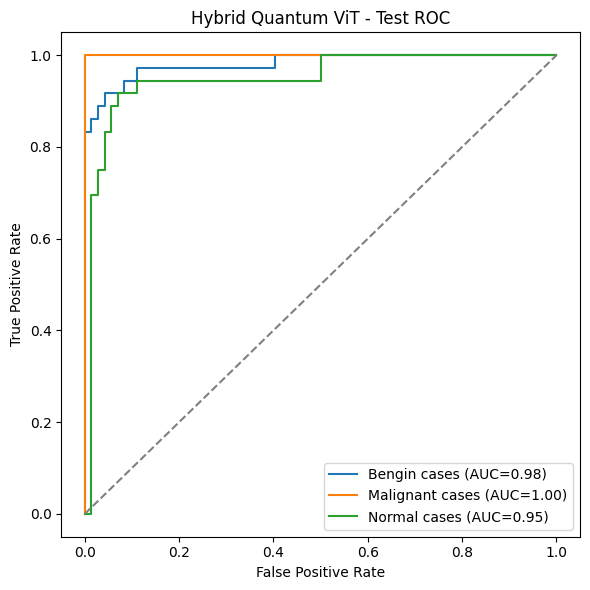

In [ ]:
# ---------------------------
# 12) Retrain Hybrid Quantum ViT on full TRAIN set & test on TEST set
# ---------------------------
print("\nTraining Hybrid Quantum ViT on full TRAIN set and evaluating on TEST set...")
qvit_model = HybridQuantumViT(MODEL_NAME, config, NUM_CLASSES, quantum_layer).to(DEVICE)
optimizer_qvit = torch.optim.AdamW(qvit_model.parameters(), lr=LR)

for epoch in range(1, NUM_EPOCHS_QVIT + 1):
    t0 = time.time()
    train_loss_qvit = train_one_epoch_qvit(qvit_model, full_train_loader, optimizer_qvit, DEVICE)
    t1 = time.time()
    print(f"[QViT Full Train] Epoch {epoch}/{NUM_EPOCHS_QVIT} - TrainLoss: {train_loss_qvit:.4f}  Time: {t1 - t0:.1f}s")

print("\nEvaluating Hybrid Quantum ViT on TEST set...")
qvit_test_probs, qvit_test_preds, qvit_test_labels = evaluate_qvit(qvit_model, test_loader, DEVICE)

qvit_acc = accuracy_score(qvit_test_labels, qvit_test_preds)
qvit_prec_macro, qvit_rec_macro, qvit_f1_macro, _ = precision_recall_fscore_support(
    qvit_test_labels, qvit_test_preds, average='macro', zero_division=0
)

try:
    qvit_auc_macro = roc_auc_score(
        label_binarize(qvit_test_labels, classes=list(range(NUM_CLASSES))),
        qvit_test_probs,
        average='macro',
        multi_class='ovo'
    )
except Exception:
    qvit_auc_macro = float('nan')

print("\n=== Hybrid Quantum ViT - Final Test Results ===")
print(f"Accuracy:           {qvit_acc:.4f}")
print(f"Precision (macro):  {qvit_prec_macro:.4f}")
print(f"Recall (macro):     {qvit_rec_macro:.4f}")
print(f"F1 (macro):         {qvit_f1_macro:.4f}")
print(f"AUC-ROC (macro):    {qvit_auc_macro:.4f}")

print("\nClassification report (per class) - Hybrid Quantum ViT:")
print(classification_report(qvit_test_labels, qvit_test_preds, target_names=class_names, zero_division=0))

# Aggregated metrics
qvit_overall_accuracy = accuracy_score(qvit_test_labels, qvit_test_preds)
qvit_macro_precision = precision_score(qvit_test_labels, qvit_test_preds, average='macro', zero_division=0)
qvit_macro_recall = recall_score(qvit_test_labels, qvit_test_preds, average='macro', zero_division=0)
qvit_macro_f1 = f1_score(qvit_test_labels, qvit_test_preds, average='macro', zero_division=0)

qvit_weighted_precision = precision_score(qvit_test_labels, qvit_test_preds, average='weighted', zero_division=0)
qvit_weighted_recall = recall_score(qvit_test_labels, qvit_test_preds, average='weighted', zero_division=0)
qvit_weighted_f1 = f1_score(qvit_test_labels, qvit_test_preds, average='weighted', zero_division=0)

print("\n=== Hybrid Quantum ViT - Aggregated Metrics (Test) ===")
print(f"Accuracy:             {qvit_overall_accuracy:.4f}")
print(f"Macro Precision:      {qvit_macro_precision:.4f}")
print(f"Macro Recall:         {qvit_macro_recall:.4f}")
print(f"Macro F1-score:       {qvit_macro_f1:.4f}")
print(f"Weighted Precision:   {qvit_weighted_precision:.4f}")
print(f"Weighted Recall:      {qvit_weighted_recall:.4f}")
print(f"Weighted F1-score:    {qvit_weighted_f1:.4f}")

# Confusion matrix
qvit_cm = confusion_matrix(qvit_test_labels, qvit_test_preds)
print("\nHybrid Quantum ViT - Confusion matrix:\n", qvit_cm)

plt.figure(figsize=(6, 5))
sns.heatmap(
    qvit_cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix -  Hybrid Quantum ViT")
plt.tight_layout()
plt.show()

# ROC on test set
plot_multiclass_roc(qvit_test_labels, qvit_test_probs, class_names,
                    title="Hybrid Quantum ViT - Test ROC")

This block generates attention maps for the Hybrid Quantum ViT model to visually interpret what the model focuses on in lung images.
The attention is extracted from the ViT backbone, not from the quantum layer, because attention exists only in the transformer part.
For a few test images, it shows the original image, the attention heatmap, and an overlay of both.
This helps qualitatively assess whether the model attends to meaningful lung regions during prediction.


Generating attention maps for a few test images (Hybrid Quantum ViT)...


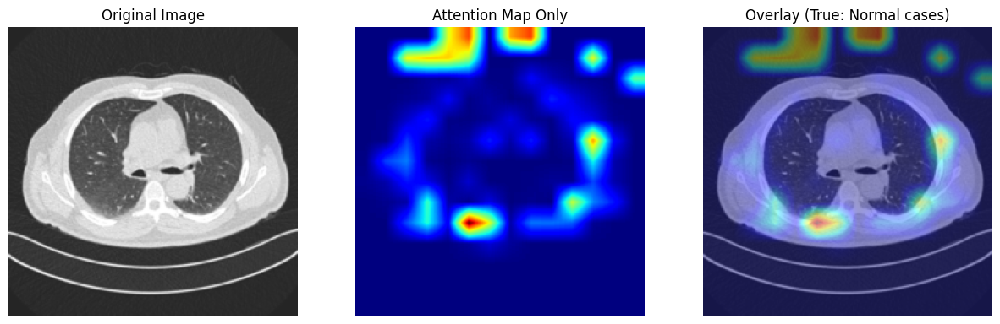

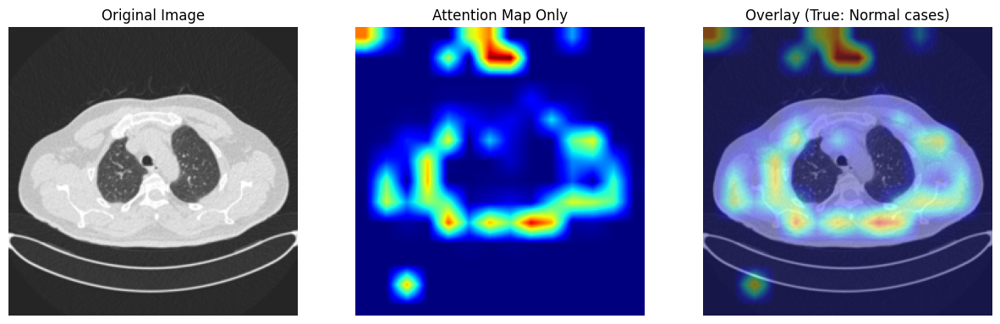

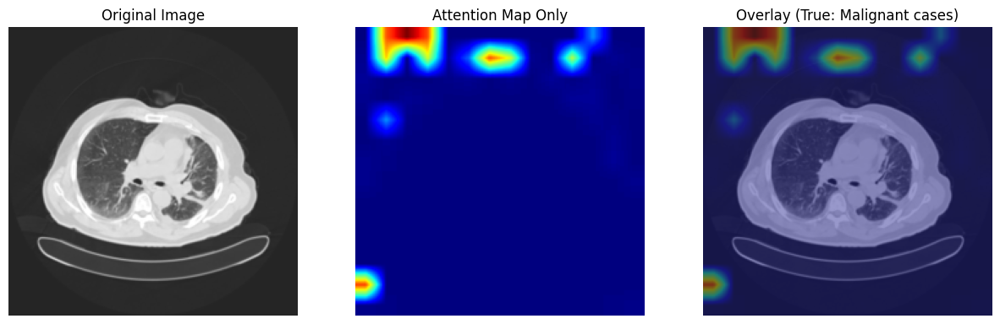

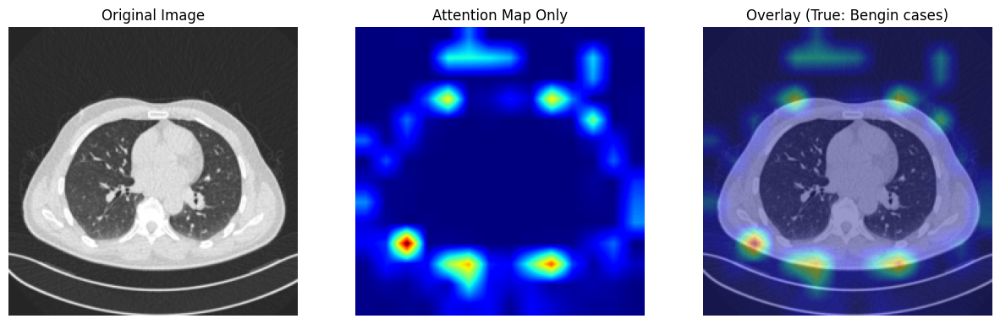

In [ ]:
# ---------------------------
# 13) Attention maps for Hybrid Quantum ViT
# ---------------------------
print("\nGenerating attention maps for a few test images (Hybrid Quantum ViT)...")
qvit_model.eval()
with torch.no_grad():
    for imgs, labels in test_loader:
        sample_imgs = imgs[:4]
        sample_labels = labels[:4].numpy()
        break

heatmaps_qvit = get_attention_map_for_images_vitbackbone(
    qvit_model, sample_imgs, DEVICE, layer=-1, head_mean=True
)

def unnormalize(tensor_img, mean=mean, std=std):
    img = tensor_img.cpu().numpy().transpose(1, 2, 0)
    img = (img * np.array(std)) + np.array(mean)
    img = np.clip(img, 0, 1)
    return img

for i in range(len(sample_imgs)):
    img_np = unnormalize(sample_imgs[i])
    heat = heatmaps_qvit[i]

    plt.figure(figsize=(15, 5))

    # Original
    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title("Original Image")
    plt.axis("off")

    # Attention map only
    plt.subplot(1, 3, 2)
    plt.imshow(heat, cmap="jet")
    plt.title("Attention Map Only")
    plt.axis("off")

    # Overlay
    plt.subplot(1, 3, 3)
    plt.imshow(img_np)
    plt.imshow(heat, cmap="jet", alpha=0.4)
    plt.title(f"Overlay (True: {class_names[sample_labels[i]]})")
    plt.axis("off")

    plt.show()